# <font color="#30143">Ejercicio 2: Modelos estadísticos</font>
<br><br>




---

### <font color="#30143">Importar Librerías</font>

In [1]:
# Load libraries
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go 

# Load sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import jarque_bera

from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

from sklearn.metrics import r2_score

import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error
import itertools
from statsmodels.tools.sm_exceptions import ConvergenceWarning
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.tsa.api as smt
import matplotlib.gridspec as gridspec


from statsmodels.tsa.arima.model import ARIMA
import warnings
import pickle
import os 

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
import scipy.stats as stats
from statsmodels.tsa.stattools import acf

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import statsmodels.api as sm
from statsmodels.graphics.gofplots import qqplot

from arch import arch_model


import warnings
warnings.filterwarnings("ignore")

### <font color="#30143"> Cargar el dataset</font>

A continuación usamos la función `read_cvs()` de la libreria `pandas`para cargar los datos a nuestro entorno de trabajo. 

In [2]:
df = pd.read_csv("https://raw.githubusercontent.com/lihkir/Data/refs/heads/main/Bitcoin%20Historical%20Data.csv", sep=",")

---

## <font color="#30143"> Procesamiento de Datos</font>

Procedemos a renombrar las variables que contienen caracteres especiales y/o espacios para evitar inconvenientes durante el procesamiento de los datos.

In [3]:
df_1 = df.rename(columns={    
    'Vol.': 'Vol',
    'Change %': 'Change' 
})

In [4]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4999 entries, 0 to 4998
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    4999 non-null   object
 1   Price   4999 non-null   object
 2   Open    4999 non-null   object
 3   High    4999 non-null   object
 4   Low     4999 non-null   object
 5   Vol     4993 non-null   object
 6   Change  4999 non-null   object
dtypes: object(7)
memory usage: 273.5+ KB


En este momento, procederemos a convertir el tipo de dato de la columna fecha a datetime y las columnas tipo objet a float64.

In [5]:
df_1['Date'] = pd.to_datetime(df_1['Date'])
df_1[['Price', 'Open', 'High', 'Low']] = df_1[['Price', 'Open', 'High', 'Low']].replace(',', '', regex=True).astype(float) #Eliminar coma (,) de columnas Pice, Open, High, Low y convertir a float

La columna `Vol` incluye letras que representan múltiplos; por lo tanto, a continuación, revisaremos cuántas de estas letras existen. 

In [6]:
final_letters = df_1['Vol'].str.extract(r'([A-Za-z])$', expand=False) # Extraer las últimas letras de cada registro en la columna 'Vol'
print(final_letters.dropna().unique())

['K' 'M' 'B']


De manera similar, la columna `Change` contiene un carácter especial (`%`). Procederemos a reemplazar cada múltiplo, eliminar el carácter `%` y convertir la columna `Vol` a tipo `int` y la columna `Change` a tipo `int` con la función `con_vol_a_numerico()`.

In [7]:
def con_vol_a_numerico(Vol):
    if isinstance(Vol, str): 
        Vol = Vol.replace(',', '') 
        if 'K' in Vol:
            return float(Vol.replace('K', '')) * 1_000  
        elif 'M' in Vol:
            return float(Vol.replace('M', '')) * 1_000_000  
        elif 'B' in Vol:
            return float(Vol.replace('B', '')) * 1_000_000_000  
        else:
            return float(Vol) 
    else:
        return Vol

In [8]:
df_1['Vol'] = df_1['Vol'].apply(con_vol_a_numerico) #Indexación de parámetros de función
df_1['Change'] = df_1['Change'].str.replace('%', '').astype(float) / 100 # Cambio columna Change

In [9]:
df_1['Close'] = df_1['Open'] * (1 + df_1['Change'])

In [10]:
df_1.head(5)

,Date,Price,Open,High,Low,Vol,Change,Close
0,2024-03-24,67211.9,64036.5,67587.8,63812.9,65590.0,0.0496,67212.7104
1,2024-03-23,64037.8,63785.6,65972.4,63074.9,35110.0,0.0040,64040.7424
2,2024-03-22,63785.5,65501.5,66633.3,62328.3,72430.0,-0.0262,63785.3607
3,2024-03-21,65503.8,67860.0,68161.7,64616.1,75260.0,-0.0346,65512.0440
4,2024-03-20,67854.0,62046.8,68029.5,60850.9,133530.0,0.0935,67848.1758


### <font color="#30143"> Imputación Datos Faltantes </font>

A continuación extraemos el número de datos faltantes y el porcentaje para cada característica del conjunto de datos. 

In [11]:
missing_values = df_1.isna().sum()
total_rows = df_1.shape[0]

missing_vars = missing_values[missing_values > 0]

missing_info_df = pd.DataFrame({    
    'Datos faltantes': missing_vars,
    'Porcentaje (%)': round((missing_vars / total_rows) * 100,2)})

missing_info_df

,Datos faltantes,Porcentaje (%)
Vol,6,0.12


Se encontraron 6 datos faltantes en relación al volumen de Bitcoin transaccionado en los registros del conjunto de datos analizado. Procedemos a realizar el análisis de su distribución para escoger la mejor técnica de imputación. 

### <font color="#30143"> Asimetría</font>

A continuación se estima el sesgo de cada atributo utilizando la función `skew()`:

In [12]:
# Skew for each attribute
pd.set_option('display.precision', 4)
df_a = df_1.drop(columns=['Date'])
df_a.skew()

Price      1.6359
Open       1.6353
High       1.6380
Low        1.6303
Vol       18.6076
Change    22.6507
Close      1.6359
dtype: float64

Para evaluar si las variables presentan sesgo, se comparará el valor absoluto de sus coeficientes con un umbral, como 1.0. Se considera que los coeficientes más cercanos a cero indican un menor sesgo. Los valores de inclinación reflejan una tendencia positiva (hacia la derecha) o negativa (hacia la izquierda). En el caso de la variable `Change`, se observa un sesgo considerable hacia la derecha, mientras que las demás variables, incluyendo la `Vol` muestran un ligero sesgo también hacia la derecha, por tanto procedemos a imputar los datos faltantes con la `mediana`.

### <font color="#30143"> Imputación datos faltantes</font>

In [13]:
median_vol = df_1['Vol'].median()  # Calcular la mediana
df_1['Vol'].fillna(median_vol, inplace=True)  # Imputar la mediana

Verificamos que la imputación se haya realizado de forma correcta. 

In [14]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4999 entries, 0 to 4998
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    4999 non-null   datetime64[ns]
 1   Price   4999 non-null   float64       
 2   Open    4999 non-null   float64       
 3   High    4999 non-null   float64       
 4   Low     4999 non-null   float64       
 5   Vol     4999 non-null   float64       
 6   Change  4999 non-null   float64       
 7   Close   4999 non-null   float64       
dtypes: datetime64[ns](1), float64(7)
memory usage: 312.6 KB


Se observa que no existen datos faltantes en la columna `Vol`

In [15]:
df_1_sorted = df_1.sort_values(by='Date')
df_1_st = df_1_sorted.copy()


## <font color="#30143">Construcción de Modelos estadísticos</font>
<br><br>


---

En esta sesión se realizará la construcción de los modelos predictivos relacionados a continuación, sobre las variables `precio`, `retorno acumulado` y `volatilidad` para las diferentes ventanas ($\omega$) de 7, 14, 21, 28 días (ver imagen). 

* Simple Exponential Smoothing (Sin Librería)
* Simple Exponential Smoothing (Usando statsmodels.tsa.holtwinters)
* Double Exponential Smoothing (Sin Librería)
* Double Exponential Smoothing (Usando statsmodels.tsa.holtwinters)
* ARIMA (Usando Rolling)
* ARIMA (Sin Rolling)
* GARCH (Usando Rolling) Must investigate
* GARCH (Sin Rolling) Must investigate 

In [16]:
from IPython.display import display, Markdown
display(Markdown('<center><img src="ventanas.png" alt="figure"></center>'))

<center><img src="ventanas.png" alt="figure"></center>

Se requiere calcular el retorno acumulado y la volatilidad para esto se emplean las siguientes ecuaciones: 

* Retorno acumulado diario $\{A_t\}_{t=1}^T$ donde: 

$$A_t = \sum_{j=1}^t R_j \text{, con } R_t = \frac{P_t-P_{t-1}}{P_{t-1}} \text{,}$$

donde $P_t\text{, }t=1,2,3 \ldots , \text{T}$ es la columna `Price` en el dataset de Bitcoin y *T* es el tiempo final.

* La Volatilidad $\{\sigma\}_{t=1}^T$ es la desviación estándar de los retornos diarios. 

$$\sigma = \text{std}(R_1, R_2, \ldots , R_{\omega}) \text{ donde } \omega = 7, 14, 21, 28, $$

siendo $\omega$ el número de retornos diarios considerados para calcular la desviación estándar 

$$\text{std}(R_1, R_2, \ldots , R_{\omega}) = {\sqrt{\frac{1}{\omega -1} \sum_{t=1}^\omega}(R_t-\mu)}, \space \mu= \frac{1}{\omega}\sum_{t=1}^\omega R_t,$$

obtenida por ventanas móviles de longitud $\omega$, donde $\omega$ esta dado en días, y esta desviación es calculada sobre la serie de retornos diarios. 


A continuación se define función para calculo de retorno acumulado y volatilidad. 

In [17]:
def calcular_retorno_acumulado(df):
    # Calcular los retornos diarios R_t
    df['R_t'] = (df['Price'] - df['Price'].shift(1)) / df['Price'].shift(1)

    # Asignar 0 al primer registro de R_t
    df['R_t'].fillna(0, inplace=True)

    # Calcular el retorno acumulado A_t
    df['A_t'] = df['R_t'].cumsum()

    return df

In [18]:
def calcular_volatilidad(df, omegas):
    if 'R_t' not in df.columns:
        df['R_t'] = (df['Price'] - df['Price'].shift(1)) / df['Price'].shift(1)
        df['R_t'].fillna(0, inplace=True)  # Asignar 0 al primer registro

    # Calcular la volatilidad para cada omega en la lista
    for omega in omegas:
        col_name = f'Volatilidad_{omega}'
        df[col_name] = df['R_t'].rolling(window=omega).std()
        df[col_name].fillna(0, inplace=True)  # Reemplazar NaN por 0

    return df 

A continuación se realiza indexación de parámetros sobre la función `calcular_retorno_acumulado()` y `calcular_volatilidad()`. 

In [19]:
st_retorno =calcular_retorno_acumulado(df_1_st)

In [20]:
omegas = [7, 14, 21, 28]  # Lista de diferentes tamaños de ventana
st_retorno_volatilidad = calcular_volatilidad(df_1_st, omegas)

A continuación se imprimen los resultados de los calculos anteriores. 

In [21]:
df_1_st

,Date,Price,Open,High,Low,Vol,Change,Close,R_t,A_t,Volatilidad_7,Volatilidad_14,Volatilidad_21,Volatilidad_28
4998,2010-07-18,0.1,0.0,0.1,0.1,80.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4997,2010-07-19,0.1,0.1,0.1,0.1,570.0,0.0000,0.1000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4996,2010-07-20,0.1,0.1,0.1,0.1,260.0,0.0000,0.1000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4995,2010-07-21,0.1,0.1,0.1,0.1,580.0,0.0000,0.1000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4994,2010-07-22,0.1,0.1,0.1,0.1,2160.0,0.0000,0.1000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,2024-03-20,67854.0,62046.8,68029.5,60850.9,133530.0,0.0935,67848.1758,0.0935,23.7198,0.0607,0.0445,0.0441,0.0434
3,2024-03-21,65503.8,67860.0,68161.7,64616.1,75260.0,-0.0346,65512.0440,-0.0346,23.6852,0.0613,0.0455,0.0446,0.0440
2,2024-03-22,63785.5,65501.5,66633.3,62328.3,72430.0,-0.0262,63785.3607,-0.0262,23.6589,0.0613,0.0456,0.0449,0.0444
1,2024-03-23,64037.8,63785.6,65972.4,63074.9,35110.0,0.0040,64040.7424,0.0040,23.6629,0.0573,0.0456,0.0448,0.0444


### <font color="#30143">División de los datos</font>

A continuación se define la función `split_data()`para división del conjunto de datos de `entrenamiento`, `validación` y `prueba`. 

In [22]:
def split_data(df, column_name, ventana):
    df = df.reset_index()  # Convertir serie de tiempo a DataFrame   
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)

    # Definir tamaños para los conjuntos
    train_size = len(df) - 56
    val_size = ventana
    test_size = ventana

    # Dividir los datos en entrenamiento, validación y prueba
    train = df.iloc[:train_size].copy()
    val = df.iloc[train_size:train_size + val_size].copy()
    test = df.iloc[train_size + val_size:train_size + val_size + test_size].copy()

    # Convertir a serie de tiempo
    train_ts = pd.Series(data=train[column_name].values, index=train.index)
    val_ts = pd.Series(data=val[column_name].values, index=val.index)
    test_ts = pd.Series(data=test[column_name].values, index=test.index)

    # Tamaños de datos de validación y prueba
    tau_val = len(val_ts)
    tau_test = len(test_ts)

    # Verificar los tamaños
    print(f"Tamaño del conjunto de entrenamiento {column_name} ventana de {ventana}: {len(train)}")
    print(f"Tamaño del conjunto de validación {column_name} ventana de {ventana}: {len(val)}")
    print(f"Tamaño del conjunto de prueba {column_name} ventana de {ventana}: {len(test)}")

    return train_ts, val_ts, test_ts, tau_val, tau_test


#### <font color="#30143">Precio (Price)</font>

* $\omega = 7$

In [23]:
price_train_ts7, price_val_ts7, price_test_ts7, price_tau_val7, price_tau_test7 = split_data(df_1_st, 'Price', 7)

Tamaño del conjunto de entrenamiento Price ventana de 7: 4943
Tamaño del conjunto de validación Price ventana de 7: 7
Tamaño del conjunto de prueba Price ventana de 7: 7


In [24]:
price_test_ts7

Date
2024-02-05    42697.2
2024-02-06    43087.7
2024-02-07    44339.8
2024-02-08    45293.3
2024-02-09    47127.5
2024-02-10    47758.2
2024-02-11    48277.3
dtype: float64

* $\omega = 14$

In [25]:
price_train_ts14, price_val_ts14, price_test_ts14, price_tau_val14, price_tau_test14 = split_data(df_1_st, 'Price', 14)

Tamaño del conjunto de entrenamiento Price ventana de 14: 4943
Tamaño del conjunto de validación Price ventana de 14: 14
Tamaño del conjunto de prueba Price ventana de 14: 14


* $\omega = 21$

In [26]:
price_train_ts21, price_val_ts21, price_test_ts21, price_tau_val21, price_tau_test21 = split_data(df_1_st, 'Price', 21)

Tamaño del conjunto de entrenamiento Price ventana de 21: 4943
Tamaño del conjunto de validación Price ventana de 21: 21
Tamaño del conjunto de prueba Price ventana de 21: 21


* $\omega = 28$

In [27]:
price_train_ts28, price_val_ts28, price_test_ts28, price_tau_val28, price_tau_test28 = split_data(df_1_st, 'Price', 28)

Tamaño del conjunto de entrenamiento Price ventana de 28: 4943
Tamaño del conjunto de validación Price ventana de 28: 28
Tamaño del conjunto de prueba Price ventana de 28: 28


### <font color="#30143">Retorno Acumulado (A_t)</font>

* $\omega = 7$

In [28]:
A_t_train_ts7, A_t_val_ts7, A_t_test_ts7, A_t_tau_val7, A_t_tau_test7 = split_data(df_1_st, 'A_t',7)

Tamaño del conjunto de entrenamiento A_t ventana de 7: 4943
Tamaño del conjunto de validación A_t ventana de 7: 7
Tamaño del conjunto de prueba A_t ventana de 7: 7


* $\omega = 14$

In [29]:
A_t_train_ts14, A_t_val_ts14, A_t_test_ts14, A_t_tau_val14, A_t_tau_test14 = split_data(df_1_st, 'A_t',14)

Tamaño del conjunto de entrenamiento A_t ventana de 14: 4943
Tamaño del conjunto de validación A_t ventana de 14: 14
Tamaño del conjunto de prueba A_t ventana de 14: 14


* $\omega = 21$

In [30]:
A_t_train_ts21, A_t_val_ts21, A_t_test_ts21, A_t_tau_val21, A_t_tau_test21 = split_data(df_1_st, 'A_t',21)

Tamaño del conjunto de entrenamiento A_t ventana de 21: 4943
Tamaño del conjunto de validación A_t ventana de 21: 21
Tamaño del conjunto de prueba A_t ventana de 21: 21


* $\omega = 28$

In [31]:
A_t_train_ts28, A_t_val_ts28, A_t_test_ts28, A_t_tau_val28, A_t_tau_test28 = split_data(df_1_st, 'A_t',28)

Tamaño del conjunto de entrenamiento A_t ventana de 28: 4943
Tamaño del conjunto de validación A_t ventana de 28: 28
Tamaño del conjunto de prueba A_t ventana de 28: 28


### <font color="#30143">Volatilidad</font>

* $\omega = 7$

In [32]:
vola7_train_ts7, vola7_val_ts7, vola7_test_ts7, vola7_tau_val7, vola7_tau_test7 = split_data(df_1_st, 'Volatilidad_7', 7)

Tamaño del conjunto de entrenamiento Volatilidad_7 ventana de 7: 4943
Tamaño del conjunto de validación Volatilidad_7 ventana de 7: 7
Tamaño del conjunto de prueba Volatilidad_7 ventana de 7: 7


In [33]:
vola7_train_ts14, vola7_val_ts14, vola7_test_ts14, vola7_tau_val14, vola7_tau_test14 = split_data(df_1_st, 'Volatilidad_7', 14)

Tamaño del conjunto de entrenamiento Volatilidad_7 ventana de 14: 4943
Tamaño del conjunto de validación Volatilidad_7 ventana de 14: 14
Tamaño del conjunto de prueba Volatilidad_7 ventana de 14: 14


In [34]:
vola7_train_ts21, vola7_val_ts21, vola7_test_ts21, vola7_tau_val21, vola7_tau_test21 = split_data(df_1_st, 'Volatilidad_7', 21)

Tamaño del conjunto de entrenamiento Volatilidad_7 ventana de 21: 4943
Tamaño del conjunto de validación Volatilidad_7 ventana de 21: 21
Tamaño del conjunto de prueba Volatilidad_7 ventana de 21: 21


In [35]:
vola7_train_ts28, vola7_val_ts28, vola7_test_ts28, vola7_tau_val28, vola7_tau_test28 = split_data(df_1_st, 'Volatilidad_7', 28)

Tamaño del conjunto de entrenamiento Volatilidad_7 ventana de 28: 4943
Tamaño del conjunto de validación Volatilidad_7 ventana de 28: 28
Tamaño del conjunto de prueba Volatilidad_7 ventana de 28: 28


* $\omega = 14$

In [36]:
vola14_train_ts7, vola14_val_ts7, vola14_test_ts7, vola14_tau_val7, vola14_tau_test7 = split_data(df_1_st, 'Volatilidad_14', 7)

Tamaño del conjunto de entrenamiento Volatilidad_14 ventana de 7: 4943
Tamaño del conjunto de validación Volatilidad_14 ventana de 7: 7
Tamaño del conjunto de prueba Volatilidad_14 ventana de 7: 7


In [37]:
vola14_train_ts14, vola14_val_ts14, vola14_test_ts14, vola14_tau_val14, vola14_tau_test14 = split_data(df_1_st, 'Volatilidad_14', 14)

Tamaño del conjunto de entrenamiento Volatilidad_14 ventana de 14: 4943
Tamaño del conjunto de validación Volatilidad_14 ventana de 14: 14
Tamaño del conjunto de prueba Volatilidad_14 ventana de 14: 14


In [38]:
vola14_train_ts21, vola14_val_ts21, vola14_test_ts21, vola14_tau_val21, vola14_tau_test21 = split_data(df_1_st, 'Volatilidad_14', 21)

Tamaño del conjunto de entrenamiento Volatilidad_14 ventana de 21: 4943
Tamaño del conjunto de validación Volatilidad_14 ventana de 21: 21
Tamaño del conjunto de prueba Volatilidad_14 ventana de 21: 21


In [39]:
vola14_train_ts28, vola14_val_ts28, vola14_test_ts28, vola14_tau_val28, vola14_tau_test28 = split_data(df_1_st, 'Volatilidad_14', 28)

Tamaño del conjunto de entrenamiento Volatilidad_14 ventana de 28: 4943
Tamaño del conjunto de validación Volatilidad_14 ventana de 28: 28
Tamaño del conjunto de prueba Volatilidad_14 ventana de 28: 28


* $\omega = 21$

In [40]:
vola21_train_ts7, vola21_val_ts7, vola21_test_ts7, vola21_tau_val7, vola21_tau_test7 = split_data(df_1_st, 'Volatilidad_21', 7)

Tamaño del conjunto de entrenamiento Volatilidad_21 ventana de 7: 4943
Tamaño del conjunto de validación Volatilidad_21 ventana de 7: 7
Tamaño del conjunto de prueba Volatilidad_21 ventana de 7: 7


In [41]:
vola21_train_ts14, vola21_val_ts14, vola21_test_ts14, vola21_tau_val14, vola21_tau_test14 = split_data(df_1_st, 'Volatilidad_21', 14)

Tamaño del conjunto de entrenamiento Volatilidad_21 ventana de 14: 4943
Tamaño del conjunto de validación Volatilidad_21 ventana de 14: 14
Tamaño del conjunto de prueba Volatilidad_21 ventana de 14: 14


In [42]:
vola21_train_ts21, vola21_val_ts21, vola21_test_ts21, vola21_tau_val21, vola21_tau_test21 = split_data(df_1_st, 'Volatilidad_21', 21)

Tamaño del conjunto de entrenamiento Volatilidad_21 ventana de 21: 4943
Tamaño del conjunto de validación Volatilidad_21 ventana de 21: 21
Tamaño del conjunto de prueba Volatilidad_21 ventana de 21: 21


In [43]:
vola21_train_ts28, vola21_val_ts28, vola21_test_ts28, vola21_tau_val28, vola21_tau_test28 = split_data(df_1_st, 'Volatilidad_21', 28)

Tamaño del conjunto de entrenamiento Volatilidad_21 ventana de 28: 4943
Tamaño del conjunto de validación Volatilidad_21 ventana de 28: 28
Tamaño del conjunto de prueba Volatilidad_21 ventana de 28: 28


* $\omega = 28$

In [44]:
vola28_train_ts7, vola28_val_ts7, vola28_test_ts7, vola28_tau_val7, vola28_tau_test7 = split_data(df_1_st, 'Volatilidad_28', 7)

Tamaño del conjunto de entrenamiento Volatilidad_28 ventana de 7: 4943
Tamaño del conjunto de validación Volatilidad_28 ventana de 7: 7
Tamaño del conjunto de prueba Volatilidad_28 ventana de 7: 7


In [45]:
vola28_train_ts14, vola28_val_ts14, vola28_test_ts14, vola28_tau_val14, vola28_tau_test14 = split_data(df_1_st, 'Volatilidad_28', 14)

Tamaño del conjunto de entrenamiento Volatilidad_28 ventana de 14: 4943
Tamaño del conjunto de validación Volatilidad_28 ventana de 14: 14
Tamaño del conjunto de prueba Volatilidad_28 ventana de 14: 14


In [46]:
vola28_train_ts21, vola28_val_ts21, vola28_test_ts21, vola28_tau_val21, vola28_tau_test21 = split_data(df_1_st, 'Volatilidad_28', 21)

Tamaño del conjunto de entrenamiento Volatilidad_28 ventana de 21: 4943
Tamaño del conjunto de validación Volatilidad_28 ventana de 21: 21
Tamaño del conjunto de prueba Volatilidad_28 ventana de 21: 21


In [47]:
vola28_train_ts28, vola28_val_ts28, vola28_test_ts28, vola28_tau_val28, vola28_tau_test28 = split_data(df_1_st, 'Volatilidad_28', 28)

Tamaño del conjunto de entrenamiento Volatilidad_28 ventana de 28: 4943
Tamaño del conjunto de validación Volatilidad_28 ventana de 28: 28
Tamaño del conjunto de prueba Volatilidad_28 ventana de 28: 28


**Definición de funciónes**

La función `plot_model()` nos permitirá visualizar los conjuntos de entrenamiento, prueba y las predicciones correspondientes al conjunto de prueba. También, en el título de los gráficos, se incluirá la métrica `MAE`.

In [48]:
import plotly.graph_objects as go

def plot_model(train, val, test, y_pred_val, y_pred_test, title):
    # Crear la figura
    fig = go.Figure()

    # Añadir la serie de entrenamiento
    fig.add_trace(go.Scatter(
        x=train.index, 
        y=train, 
        mode='lines', 
        name='Entrenamiento',
        line=dict(color='blue')
    ))

    # Añadir la serie de validación
    fig.add_trace(go.Scatter(
        x=val.index, 
        y=val, 
        mode='lines', 
        name='Validación',
        line=dict(color='orange')
    ))

    # Añadir la serie de predicción validación
    fig.add_trace(go.Scatter(
        x=val.index,  
        y=y_pred_val, 
        mode='lines', 
        name='Predicción Validación',
        line=dict(color='red', dash='dash')  # Líneas punteadas para las predicciones
    ))

    # Añadir la serie de test
    fig.add_trace(go.Scatter(
        x=test.index, 
        y=test, 
        mode='lines', 
        name='Prueba',
        line=dict(color='green')
    ))

    # Añadir la serie de predicción test
    fig.add_trace(go.Scatter(
        x=test.index, 
        y=y_pred_test, 
        mode='lines', 
        name='Predicción Prueba',
        line=dict(color='purple', dash='dash')  # Líneas punteadas para las predicciones
    ))

    # Calcular el MAE para la validación
    T_val = len(val)
    yh_val = val.copy().values
    prederr_val = yh_val - y_pred_val
    mae_val = round(sum(abs(prederr_val)) / T_val, 2)

    # Calcular el MAE para la prueba
    T_test = len(test)
    yh_test = test.copy().values
    prederr_test = yh_test - y_pred_test
    mae_test = round(sum(abs(prederr_test)) / T_test, 2)

    # Actualizar el diseño de la gráfica
    fig.update_layout(
        title=f"{title}, MAD Validación: {mae_val}, MAD Prueba: {mae_test}",
        xaxis_title="Tiempo",
        yaxis_title="Valor",
        legend_title="Series",
        template="plotly_white",  # Usar fondo blanco
        xaxis=dict(range=[train.index.min(), test.index.max()])  # Ajustar el rango del eje x
    )

    # Mostrar la gráfica interactiva
    fig.show()


A continuación se define función `metricas()` para estimación de métricas de desempeño.

In [49]:
def metricas(y, out):

    if len(y) > 0 and (type(y[0]) == list or type(y[0]) == np.ndarray) :
        flattened = [val for sublist in y for val in sublist]
        y = flattened

    if type(out) != np.ndarray:
        out = np.array(out)

    if type(y) != np.ndarray:
        y = np.array(y)

    T = len(y)
    yh = y 
    
    prederr = yh - out
    SSE = sum(prederr**2)
    MAPE = round(100 * sum(abs(prederr / yh)[yh != 0]) / T, 2)
    MAD = round(sum(abs(prederr)) / T, 2)
    MSD = round(sum(prederr**2) / T, 2)
    r2 = round(r2_score(yh, out) * 100, 2)

    ret1 = pd.DataFrame({
        "SSE": [SSE],
        "MAPE": [f"{MAPE}%"],
        "MAD": [MAD],
        "MSD": [MSD],
        "R2": [f"{r2}%"]
    })
    ret1.reset_index(drop=True, inplace=True)
    return ret1

A continuación se define función `plot_residuals_train()` para la evaluación de los residuales del conjunto de entrenamiento.

In [50]:
def plot_residual_train(model_name, metric_name, y_train, y_pred_train):
    # Calcular residuos
    residuals = y_train - y_pred_train

    # Calcular métricas
    metrics_df = metricas(y_train, y_pred_train)
    metrics_df.index = metrics_df.index.map({0: f'{metric_name} Train '})

    # Pruebas de independencia y normalidad
    ljung_box_result = acorr_ljungbox(residuals, lags=[10], return_df=True)
    ljung_box_pval = ljung_box_result['lb_pvalue'].iloc[0]
    jb_test_result = jarque_bera(residuals)
    jb_pvalue = jb_test_result[1]
    metrics_df['LJung-Box p-value'] = ljung_box_pval
    metrics_df['Jarque-Bera p-value'] = jb_pvalue

    # Gráfica de residuos
    fig1 = make_subplots(rows=1, cols=1, subplot_titles=[f'Serie de residuos - {model_name}'])
    fig1.add_trace(
        go.Scatter(x=np.arange(len(residuals)), y=residuals, 
                mode='lines', 
                line=dict(color='#1f77b4')),
        row=1, col=1
    )

    # Actualizar layout para la gráfica de residuos
    fig1.update_layout(height=400, width=800)
    fig1.update_xaxes(title_text='Índice', row=1, col=1)
    fig1.update_yaxes(title_text='Residuo', row=1, col=1)

    # Mostrar figura de residuos
    fig1.show()

    # Gráfico de QQ plot y ACF
    fig2, axes = plt.subplots(nrows=2, ncols=1, figsize=(7, 6))

    # Gráfico de QQ plot
    sm.qqplot(residuals, line='s', ax=axes[0])
    axes[0].set_title('QQ Plot de los Residuos')
    
    # Gráfico de autocorrelación parcial (PACF)
    sm.graphics.tsa.plot_pacf(residuals, lags=30, ax=axes[1])
    axes[1].set_title('Autocorrelación Parcial de los Residuos')

    plt.suptitle(f'{model_name}', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Ajustar el layout para el título
    plt.show()

    # Evaluar resultados del test
    if ljung_box_pval > 0.05:
        print('No se rechaza H0: los residuales son independientes (no correlacionados). Lo que es coherente con el gráfico ACF')
    else:
        print('Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF')

    # Test de Jarque-Bera
    jarque_bera_results = jarque_bera(residuals)
    jarque_bera_pval = jarque_bera_results[1]  # Accede al p-valor
    print('Jarque-Bera p-value: %f' % jarque_bera_pval)
    # Evaluar resultados del test
    if jarque_bera_pval > 0.05:
        print('No se rechaza H0: los residuales siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot')
    else:
        print('Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot')


    print('A continuación se observa un resumen de las métricas: ')


    return metrics_df



A continuación se define función `evaluate_residuals()` para la evaluación de los residuales del conjunto de prueba.

In [51]:
def evaluate_residuals(test_data, predictions):
    # Calcular residuos
    residuals = test_data - predictions

    # Prueba de Ljung-Box
    ljung_box_results = acorr_ljungbox(residuals)
    ljung_box_pval = ljung_box_results['lb_pvalue'].values[0]
    ljung_box_stat = ljung_box_results['lb_stat'].values[0]

    #print('Ljung-Box LB Statistic: %f' % ljung_box_stat)
    #print('Ljung-Box p-value: %f' % ljung_box_pval)
    
    # Evaluar resultados del test
    if ljung_box_pval > 0.05:
        print('No se rechaza H0: los residuales son independientes (no correlacionados).')
    else:
        print('Se rechaza H0: hay autocorrelación en los residuales.')

    # Test de Jarque-Bera

    jarque_bera_results = jarque_bera(residuals)
    jarque_bera_pval = jarque_bera_results[1]  # Accede al p-valor
    #print('Jarque-Bera p-value: %f' % jarque_bera_pval)

    # Evaluar resultados del test
    if jarque_bera_pval > 0.05:
        print('No se rechaza H0: los residuales siguen una distribución normal.')
    else:
        print('Se rechaza H0: los residuales no siguen una distribución normal.')

    return ljung_box_pval, jarque_bera_pval

A continuación se define función `evaluate_residuals_train_arima()` para la evaluación de los residuales del conjunto de entrenamiento para el modelo ARIMA y GRANCH

In [52]:
def evaluate_residuals_train_arima(residuals):
    # Prueba de Ljung-Box
    ljung_box_results = acorr_ljungbox(residuals)
    ljung_box_pval = ljung_box_results['lb_pvalue'].values[0]
    ljung_box_stat = ljung_box_results['lb_stat'].values[0]

    print('Ljung-Box LB Statistic: %f' % ljung_box_stat)
    print('Ljung-Box p-value: %f' % ljung_box_pval)
    # Evaluar resultados del test
    if ljung_box_pval > 0.05:
        print('No se rechaza H0: los residuales son independientes (no correlacionados).')
    else:
        print('Se rechaza H0: hay autocorrelación en los residuales.')

    # Test de Jarque-Bera
    jarque_bera_results = jarque_bera(residuals)
    jarque_bera_pval = jarque_bera_results[1]  # Accede al p-valor
    print('Jarque-Bera p-value: %f' % jarque_bera_pval)
    # Evaluar resultados del test
    if jarque_bera_pval > 0.05:
        print('No se rechaza H0: los residuales siguen una distribución normal.')
    else:
        print('Se rechaza H0: los residuales no siguen una distribución normal.')

    return ljung_box_pval, jarque_bera_pval

## <font color="#30143">Precio (Price)</font>

A continuación se visualiza la serie temporal de la variable `precio`.

In [53]:
import plotly.graph_objects as go
import pandas as pd


# Crear la figura usando plotly.graph_objects
fig = go.Figure()

# Añadir la traza de la línea
fig.add_trace(go.Scatter(
    x=df_1_sorted['Date'],
    y=df_1_sorted['Price'],
    mode='lines',  # Mostrar la línea
    line=dict(color='#30143F', width=2),  # Cambiar el color de la línea y el ancho
    name='Precio',
    opacity=0.7  # Ajustar la opacidad de la línea (0.0 es completamente transparente, 1.0 es completamente opaco)
))

# Ajustar el diseño del gráfico
fig.update_layout(
    title='Precio de BTC a lo largo del tiempo',
    xaxis_title='Fecha',
    yaxis_title='Precio BTC',  
    xaxis=dict(tickangle=45, tickformat='%Y-%m-%d'),  # Rotar etiquetas del eje X y formato de fecha
    yaxis=dict(tickformat='.1f'),  # Formato de los ticks del eje Y (un decimal)
    template='plotly_white',  # Fondo blanco 
    title_x=0.5,  # Centrar el título
    title_font=dict(size=16)  # Ajusta el tamaño de la fuente del título
)

fig.show()

El gráfico ilustra la evolución del precio de Bitcoin desde el 18 de Julio de 2010 al 24 de marzo de 2024. Durante este período, el precio se mantuvo relativamente estable hasta 2017, momento en el que experimentó un notable aumento. En 2021, hubo un nuevo y significativo incremento, seguido de un declive en 2022. Sin embargo, en 2023 se observa una recuperación y el precio continúa mostrando una tendencia alcista. Dado este comportamiento ascendente a lo largo del tiempo, podemos concluir que el gráfico representa la evolución del precio de Bitcoin. Además, `la serie de tiempo` correspondiente se caracteriza como `no estacionaria`.

Una serie de tiempo se considera `No estacionaria` si la distribución de sus datos (media, varianza, autocorrelación, etc.) `no permanece constante a lo largo del tiempo`, es decir, si  muestra **tendencia**, **variación en la varianza**, **autocorrelación significativa**. 

#### <font color="#30143">Simple Exponential Smoothing (Sin Librería)</font>

A continuación se define función `suavizacion_exponencial_primer_orden()`

In [54]:
def firstsmooth(y, lambda_, start=None):
    ytilde = y.copy()
    if start is None:
        start = y[0]
    ytilde[0] = lambda_ * y[0] + (1 - lambda_) * start
    for i in range(1, len(y)):
        ytilde[i] = lambda_ * y[i] + (1 - lambda_) * ytilde[i - 1]
    return ytilde

A continuación se define función para encontrar el hiperparámetro $\lambda$ para la optimización del modelo simple exponencial smoothing. 

In [55]:
def seleccionar_mejor_lambda(y_train, lambdas):
    mejores_resultados = []
    
    for lambda_ in lambdas:
        # Suavización exponencial
        price_smooth = firstsmooth(y=y_train, lambda_=lambda_)
        
        # Calcular las métricas para los datos de validación
        metricas_se = metricas(y_train, price_smooth)  # metricas_se es un DataFrame
        mae = metricas_se['MAD'].values[0]  # Extraer el MAE como un valor escalar
        
        print(f"Lambda: {lambda_}, MAD: {mae}")  # Imprimir el MAE para cada lambda
        
        # Almacenar el resultado
        mejores_resultados.append((lambda_, mae))
    
    # Encontrar el mejor lambda basado en el menor MAE
    mejor_lambda, mejor_mae = min(mejores_resultados, key=lambda x: x[1])
    
    return mejor_lambda, mejor_mae


A continuación se indexan los parámetros para la estimación del mejor lamda.

In [56]:
lambdas = [0.1, 0.2, 0.3, 0.4]
mejor_lambda, mejor_mae = seleccionar_mejor_lambda(price_train_ts7, lambdas)

print(f"Mejor lambda: {mejor_lambda}, MAD: {mejor_mae}")

Lambda: 0.1, MAD: 606.73
Lambda: 0.2, MAD: 372.32
Lambda: 0.3, MAD: 269.12
Lambda: 0.4, MAD: 202.86
Mejor lambda: 0.4, MAD: 202.86


* Análisis de residuos conjunto de entrenamiento: 

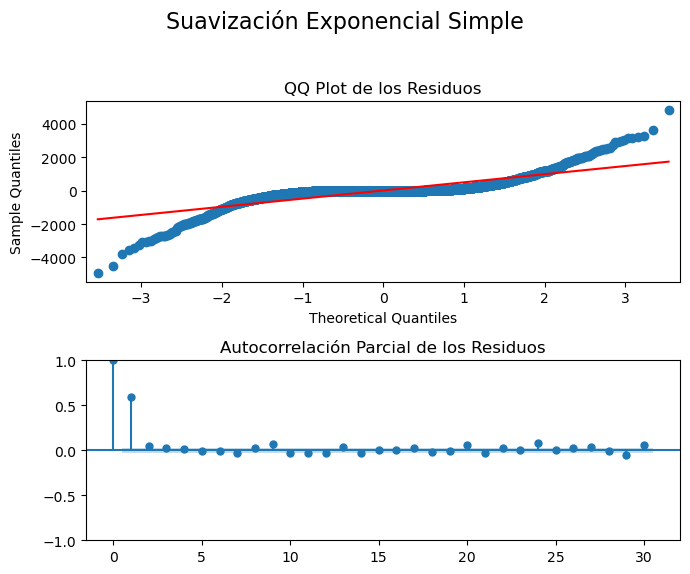

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [57]:
price_smooth1_train = firstsmooth(y=price_train_ts7, lambda_= mejor_lambda)
metrica_price_SES_train = plot_residual_train('Suavización Exponencial Simple','SES' , price_train_ts7, price_smooth1_train)

In [58]:
metrica_price_SES_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value
SES Train,1.1796e+09,2.41%,202.86,238650.53,99.9%,0.0,0.0


En términos generales, el rendimiento del modelo de suavización exponencial simple (SES) es prometedor, como lo demuestran el bajo MAPE y el alto R², aunque esta última métrica no es completamente adecuada para el análisis de series temporales. Sin embargo, los valores de SSE y MSD sugieren que hay oportunidades para mejorar la precisión del modelo. Además, los análisis de residuos indican la presencia de patrones que no han sido capturados de manera efectiva. Por lo tanto, es posible que los datos de validación y prueba no se ajusten adecuadamente, lo que limita la capacidad del modelo para generalizar de manera óptima.

* **Ventana de 7 días ($\omega = 7)$**

In [59]:
price_smooth1_val7 = firstsmooth(y=price_val_ts7, lambda_= mejor_lambda)
price_smooth1_test7 = firstsmooth(y=price_test_ts7, lambda_= mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para  la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-1500 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -1500: extraerá todos los elementos desde la posición -1500 hasta el final de la serie.

In [60]:
plot_model(price_train_ts7[-1500:], price_val_ts7, price_test_ts7, price_smooth1_val7, price_smooth1_test7, 'Suavización Exponencial Simple Ventana de 7 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [61]:
ljung_box_pval7, jarque_bera_pval7 = evaluate_residuals(price_test_ts7, price_smooth1_test7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [62]:
metrica_SE_test7 = metricas(price_test_ts7,price_smooth1_test7)
metrica_SE_test7.index = metrica_SE_test7.index.map({0: 'SES Prueba Price (τ = 7)'})
metrica_SE_test7['Ljung-Box p-value'] = pd.Series([ljung_box_pval7], index=metrica_SE_test7.index)
metrica_SE_test7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval7], index=metrica_SE_test7.index)
metrica_SE_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba Price (τ = 7),8.6347e+06,2.03%,944.2,1.2335e+06,71.71%,0.0675,0.7784


* **Ventana de 14 días ($\omega = 14)$**

In [63]:
price_smooth1_val14 = firstsmooth(y=price_val_ts14, lambda_=mejor_lambda)
price_smooth1_test14 = firstsmooth(y=price_test_ts14, lambda_=mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-1500 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -1500: extraerá todos los elementos desde la posición -1500 hasta el final de la serie.

In [64]:
plot_model(price_train_ts14[-1500:], price_val_ts14, price_test_ts14, price_smooth1_val14, price_smooth1_test14, 'Suavización Exponencial Simple Ventana de 14 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [65]:
ljung_box_pval14, jarque_bera_pval14 = evaluate_residuals(price_test_ts14, price_smooth1_test14)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [66]:
metrica_SE_test14 = metricas(price_test_ts14,price_smooth1_test14)
metrica_SE_test14.index = metrica_SE_test14.index.map({0: 'SES Prueba Price (τ = 14)'})
metrica_SE_test14['Ljung-Box p-value'] = pd.Series([ljung_box_pval14], index=metrica_SE_test14.index)
metrica_SE_test14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval14], index=metrica_SE_test14.index)
metrica_SE_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba Price (τ = 14),3.0189e+06,0.65%,335.07,215638.58,62.71%,0.1132,0.6799


* **Ventana de 21 días ($\omega = 21)$**

In [67]:
price_smooth1_val21 = firstsmooth(y=price_val_ts21, lambda_=mejor_lambda)
price_smooth1_test21 = firstsmooth(y=price_test_ts21, lambda_=mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [68]:
plot_model(price_train_ts21[-200:], price_val_ts21, price_test_ts21, price_smooth1_val21, price_smooth1_test21, 'Suavización Exponencial Simple Ventana de 21 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [69]:
ljung_box_pval21, jarque_bera_pval21 = evaluate_residuals(price_test_ts21, price_smooth1_test21)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [70]:
metrica_SE_test21 = metricas(price_test_ts21,price_smooth1_test21)
metrica_SE_test21.index = metrica_SE_test21.index.map({0: 'SES Prueba Price (τ = 21)'})
metrica_SE_test21['Ljung-Box p-value'] = pd.Series([ljung_box_pval21], index=metrica_SE_test21.index)
metrica_SE_test21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval21], index=metrica_SE_test21.index)
metrica_SE_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba Price (τ = 21),6.6195e+07,2.08%,1290.61,3.1522e+06,92.98%,0.0518,0.1065


* **Ventana de 28 días ($\omega = 28)$**

In [71]:
price_smooth1_val28 = firstsmooth(y=price_val_ts28, lambda_=mejor_lambda)
price_smooth1_test28 = firstsmooth(y=price_test_ts28, lambda_=mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [72]:
plot_model(price_train_ts28[-200:], price_val_ts28, price_test_ts28, price_smooth1_val28, price_smooth1_test28, 'Suavización Exponencial Simple Ventana de 28 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [73]:
ljung_box_pval28, jarque_bera_pval28 = evaluate_residuals(price_test_ts28, price_smooth1_test28)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [74]:
metrica_SE_test28 = metricas(price_test_ts28,price_smooth1_test28)
metrica_SE_test28.index = metrica_SE_test28.index.map({0: 'SES Prueba Price (τ = 28)'})
metrica_SE_test28['Ljung-Box p-value'] = pd.Series([ljung_box_pval28], index=metrica_SE_test28.index)
metrica_SE_test28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval28], index=metrica_SE_test28.index)
metrica_SE_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba Price (τ = 28),9.0800e+07,2.21%,1443.79,3.2429e+06,82.21%,0.0804,0.4917


#### <font color="#30143">Simple Exponential Smoothing (Usando statsmodels.tsa.holtwinters)</font> 

La función `ses_optimizer()` permite la optimización del modelo, ya que, ayudará a determinar el parámetro óptimo $\alpha$ para conseguir el modelo que reduzca al mínimo la métrica `MAE`.

In [75]:
def ses_optimizer(train, val, alphas, step):

    best_alpha, best_mae = None, float("inf")

    for alpha in alphas:
        ses_model = SimpleExpSmoothing(train).fit(smoothing_level=alpha, optimized=False)
        y_pred = ses_model.forecast(step)
        mae = mean_absolute_error(val, y_pred)

        if mae < best_mae:
            best_alpha, best_mae = alpha, mae

    return best_alpha, best_mae

In [76]:
def ses_model_tuning(train, val, test, step, title="Model Tuning - Suavización Exponencial Simple"):
    alphas = np.arange(0.8, 1, 0.01)
    best_alpha, best_mae = ses_optimizer(train, val, alphas, step=step)
    
    train_val = pd.concat([train, val])
    final_model = SimpleExpSmoothing(train_val).fit(smoothing_level=best_alpha, optimized=False)

    y_pred_val = final_model.forecast(step)  # Predicciones en validación
    y_pred_test = final_model.forecast(len(test))  # Predicciones en test
    
    mae_val = mean_absolute_error(val, y_pred_val)

    plot_model(train, val, test, y_pred_val, y_pred_test, title)

    return y_pred_val, y_pred_test

In [77]:
def ses_model_tuning_train(train, val, test, step, title="Model Tuning - Suavización Exponencial Simple"):
    alphas = np.arange(0.8, 1, 0.01)
    best_alpha, best_mae = ses_optimizer(train, val, alphas, step=step)
    
    train_val = pd.concat([train, val])
    final_model = SimpleExpSmoothing(train_val).fit(smoothing_level=best_alpha, optimized=False)

    y_pred_val = final_model.forecast(step)  # Predicciones en validación
    y_pred_test = final_model.forecast(len(test))  # Predicciones en test
    
    mae_val = mean_absolute_error(val, y_pred_val)
    
    return y_pred_val, y_pred_test

* Análisis de residuos conjunto de entrenamiento: 

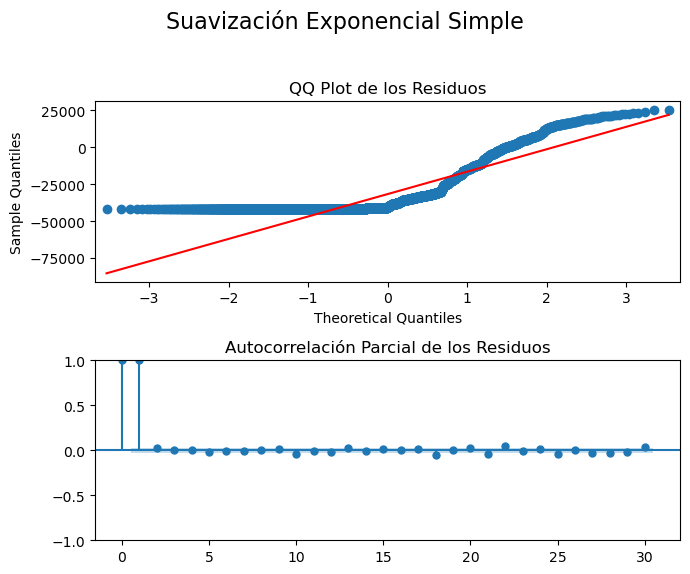

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [78]:
predicciones, y_pred_HW1_val_7 = ses_model_tuning_train(price_train_ts7[-200:], price_train_ts7, price_val_ts7, step=len(price_train_ts7))
y_pred_HW1_train_7 = pd.Series(predicciones.mean(), index=price_train_ts7.index[-1:])  # Esto crea una serie con la media y un índice
y_pred_HW1_train_7 = pd.Series([predicciones.mean()] * len(price_train_ts7), index=price_train_ts7.index)
y_pred_HW1_train_7_df = pd.DataFrame(y_pred_HW1_train_7, columns=['Predicciones'])
metrica_price_HW1_train = plot_residual_train('Suavización Exponencial Simple','SES HW' , price_train_ts7, y_pred_HW1_train_7)

In [79]:
metrica_price_HW1_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value
SES HW Train,6.1137e+12,1341159.69%,32900.61,1.2368e+09,-437.74%,0.0,0.0


* **Ventana de 7 días ($\omega = 7)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [80]:
y_pred_HW1_val_7, y_pred_HW1_test_7 = ses_model_tuning(price_train_ts7[-200:], price_val_ts7, price_test_ts7, step=len(price_val_ts7))

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [81]:
ljung_box_pval_hw7, jarque_bera_pval_hw7 = evaluate_residuals(price_test_ts7, y_pred_HW1_test_7)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [82]:
metrica_SE_HW_test7 = metricas(price_test_ts7,y_pred_HW1_test_7)
metrica_SE_HW_test7.index = metrica_SE_HW_test7.index.map({0: 'SES HW Prueba Price (τ = 7)'})
metrica_SE_HW_test7['Ljung-Box p-value'] = pd.Series([ljung_box_pval_hw7], index=metrica_SE_HW_test7.index)
metrica_SE_HW_test7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_hw7], index=metrica_SE_HW_test7.index)
metrica_SE_HW_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba Price (τ = 7),8.9195e+07,6.16%,2895.1,1.2742e+07,-192.21%,0.0394,0.6969


* **Ventana de 14 días ($\omega = 14)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 14 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [83]:
y_pred_HW1_val_14, y_pred_HW1_test_14 = ses_model_tuning(price_train_ts14[-200:], price_val_ts14, price_test_ts14, step=len(price_val_ts14))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [84]:
ljung_box_pval_hw14, jarque_bera_pval_hw14 = evaluate_residuals(price_test_ts14, y_pred_HW1_test_14)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [85]:
metrica_SE_HW_test14 = metricas(price_test_ts14,y_pred_HW1_test_14)
metrica_SE_HW_test14.index = metrica_SE_HW_test14.index.map({0: 'SES HW Prueba Price (τ = 14)'})
metrica_SE_HW_test14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_hw14], index=metrica_SE_HW_test14.index)
metrica_SE_HW_test14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_hw14], index=metrica_SE_HW_test14.index)
metrica_SE_HW_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba Price (τ = 14),1.5447e+08,6.26%,3233.48,1.1034e+07,-1808.13%,0.0683,0.1378


* **Ventana de 21 días ($\omega = 21)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 21 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [86]:
y_pred_HW1_val_21, y_pred_HW1_test_21 = ses_model_tuning(price_train_ts21[-200:], price_val_ts21, price_test_ts21, step=len(price_val_ts21))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [87]:
ljung_box_pval_hw21, jarque_bera_pval_hw21 = evaluate_residuals(price_test_ts21, y_pred_HW1_test_21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [88]:
metrica_SE_HW_test21 = metricas(price_test_ts21,y_pred_HW1_test_21)
metrica_SE_HW_test21.index = metrica_SE_HW_test21.index.map({0: 'SES HW Prueba Price (τ = 21)'})
metrica_SE_HW_test21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_hw21], index=metrica_SE_HW_test21.index)
metrica_SE_HW_test21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_hw21], index=metrica_SE_HW_test21.index)
metrica_SE_HW_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba Price (τ = 21),2.1731e+09,12.34%,7987.59,1.0348e+08,-130.51%,2.0849e-05,0.3283


* **Ventana de 28 días ($\omega = 28)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 28 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [89]:
y_pred_HW1_val_28, y_pred_HW1_test_28 = ses_model_tuning(price_train_ts28[-200:], price_val_ts28, price_test_ts28, step=len(price_val_ts28))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [90]:
ljung_box_pval_hw28, jarque_bera_pval_hw28 = evaluate_residuals(price_test_ts28, y_pred_HW1_test_28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [91]:
metrica_SE_HW_test28 = metricas(price_test_ts28,y_pred_HW1_test_28)
metrica_SE_HW_test28.index = metrica_SE_HW_test28.index.map({0: 'SES HW Prueba Price (τ = 28)'})
metrica_SE_HW_test28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_hw28], index=metrica_SE_HW_test28.index)
metrica_SE_HW_test28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_hw28], index=metrica_SE_HW_test28.index)
metrica_SE_HW_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba Price (τ = 28),6.0741e+09,21.07%,14096.07,2.1693e+08,-1089.88%,0.0003,0.427


#### <font color="#30143">Double Exponential Smoothing (Sin Librería)</font> 

* Análisis de residuos conjunto de entrenamiento: 

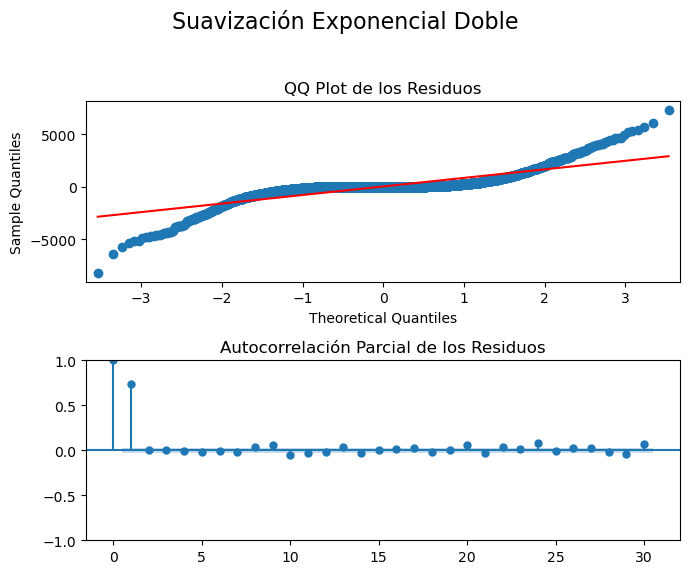

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [92]:
price_smooth2_train = firstsmooth(y=price_smooth1_train, lambda_=mejor_lambda)
metrica_price_DES_train = plot_residual_train('Suavización Exponencial Doble','DES', price_train_ts7, price_smooth2_train)

In [93]:
metrica_price_DES_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value
DES Train,3.3082e+09,4.12%,344.06,669275.79,99.71%,0.0,0.0


A continuación se realizan las predicciones para el modelo de suavización exponencial doble sin usar librería: 

* **Ventana de 7 días ($\omega = 7)$**

In [94]:
price_smooth2_val7 = firstsmooth(y=price_smooth1_val7, lambda_=mejor_lambda)
price_smooth2_test7 = firstsmooth(y=price_smooth1_test7, lambda_=mejor_lambda)

y_hatDES_val7 = 2 * price_smooth1_val7 - price_smooth2_val7
y_hatDES_test7 = 2 * price_smooth1_test7 - price_smooth2_test7

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [95]:
plot_model(price_train_ts7[-200:], price_val_ts7, price_test_ts7, y_hatDES_val7, y_hatDES_test7, 'Suavización Exponencial Doble Ventana de 7 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [96]:
ljung_box_pval_des7, jarque_bera_pval_des7 = evaluate_residuals(price_test_ts7, y_hatDES_test7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [97]:
metrica_DES_test7 = metricas(price_test_ts7,y_hatDES_test7)
metrica_DES_test7.index = metrica_DES_test7.index.map({0: 'DES Prueba Price (τ = 7)'})
metrica_DES_test7['Ljung-Box p-value'] = pd.Series([ljung_box_pval_des7], index=metrica_DES_test7.index)
metrica_DES_test7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_des7], index=metrica_DES_test7.index)
metrica_DES_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba Price (τ = 7),876085.5407,0.6%,273.52,125155.08,97.13%,0.4496,0.7477


* **Ventana de 14 días ($\omega = 14)$**

In [98]:
price_smooth2_val14 = firstsmooth(y=price_smooth1_val14, lambda_=mejor_lambda)
price_smooth2_test14 = firstsmooth(y=price_smooth1_test14, lambda_=mejor_lambda)

y_hatDES_val14 = 2 * price_smooth1_val14 - price_smooth2_val14
y_hatDES_test14 = 2 * price_smooth1_test14 - price_smooth2_test14

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [99]:
plot_model(price_train_ts14[-200:], price_val_ts14, price_test_ts14, y_hatDES_val14, y_hatDES_test14, 'Suavización Exponencial Doble Ventana de 14 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [100]:
ljung_box_pval_des14, jarque_bera_pval_des14 = evaluate_residuals(price_test_ts14, y_hatDES_test14)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [101]:
metrica_DES_test14 = metricas(price_test_ts14,y_hatDES_test14)
metrica_DES_test14.index = metrica_DES_test14.index.map({0: 'DES Prueba Price (τ = 14)'})
metrica_DES_test14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_des14], index=metrica_DES_test14.index)
metrica_DES_test14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_des14], index=metrica_DES_test14.index)
metrica_DES_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba Price (τ = 14),1.0225e+06,0.39%,202.16,73038.64,87.37%,0.4386,0.1447


* **Ventana de 21 días ($\omega = 21)$**

In [102]:
price_smooth2_val21 = firstsmooth(y=price_smooth1_val21, lambda_=mejor_lambda)
price_smooth2_test21 = firstsmooth(y=price_smooth1_test21, lambda_=mejor_lambda)

y_hatDES_val21 = 2 * price_smooth1_val21 - price_smooth2_val21
y_hatDES_test21 = 2 * price_smooth1_test21 - price_smooth2_test21

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [103]:
plot_model(price_train_ts21[-200:], price_val_ts21, price_test_ts21, y_hatDES_val21, y_hatDES_test21, 'Suavización Exponencial Doble Ventana de 21 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [104]:
ljung_box_pval_des21, jarque_bera_pval_des21 = evaluate_residuals(price_test_ts21, y_hatDES_test21)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [105]:
metrica_DES_test21 = metricas(price_test_ts21,y_hatDES_test21)
metrica_DES_test21.index = metrica_DES_test21.index.map({0: 'DES Prueba Price (τ = 21)'})
metrica_DES_test21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_des21], index=metrica_DES_test21.index)
metrica_DES_test21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_des21], index=metrica_DES_test21.index)
metrica_DES_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba Price (τ = 21),1.2636e+07,0.87%,526.1,601718.55,98.66%,0.7528,0.4407


* **Ventana de 28 días ($\omega = 28)$**

In [106]:
price_smooth2_val28 = firstsmooth(y=price_smooth1_val28, lambda_=mejor_lambda)
price_smooth2_test28 = firstsmooth(y=price_smooth1_test28, lambda_=mejor_lambda)

y_hatDES_val28 = 2 * price_smooth1_val28 - price_smooth2_val28
y_hatDES_test28 = 2 * price_smooth1_test28 - price_smooth2_test28

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [107]:
plot_model(price_train_ts28[-200:], price_val_ts28, price_test_ts28, y_hatDES_val28, y_hatDES_test28, 'Suavización Exponencial Doble Ventana de 28 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [108]:
ljung_box_pval_des28, jarque_bera_pval_des28 = evaluate_residuals(price_test_ts28, y_hatDES_test28)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [109]:
metrica_DES_test28 = metricas(price_test_ts28,y_hatDES_test28)
metrica_DES_test28.index = metrica_DES_test28.index.map({0: 'DES Prueba Price (τ = 28)'})
metrica_DES_test28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_des28], index=metrica_DES_test28.index)
metrica_DES_test28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_des28], index=metrica_DES_test28.index)
metrica_DES_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba Price (τ = 28),2.7237e+07,1.07%,704.5,972751.9,94.66%,0.5955,0.9681


#### <font color="#30143">Double Exponential Smoothing (Usando statsmodels.tsa.holtwinters)</font> 

La función `des_optimizer()` permite la optimización del modelo, ya que, ayudará a determinar el parámetro óptimo $\alpha$ y $\beta$ para conseguir el modelo que reduzca al mínimo la métrica `MAE`.

**ExponentialSmoothing(train, trend=trend)**: Inicializa un modelo de suavización exponencial, utilizando la serie temporal de entrenamiento train y el tipo de tendencia `(lineal o exponencial)` especificado en el parámetro `trend`.

**.fit(smoothing_level=alpha, smoothing_slope=beta)**: Ajusta el modelo a los datos de entrenamiento. Los parámetros `smoothing_level` y `smoothing_slope` determinan el `grado de suavizado` de la serie temporal y de la `tendencia`, respectivamente, tomando como valores los parámetros `alpha` y `beta`.

In [110]:
def des_optimizer(train, val, alphas, betas, trend, step):

    best_alpha, best_beta, best_mae = None, None, float("inf")

    for alpha in alphas:
        for beta in betas:
            des_model = ExponentialSmoothing(train, trend=trend).fit(smoothing_level=alpha, smoothing_slope=beta)
            y_pred = des_model.forecast(step)
            mae = mean_absolute_error(val, y_pred)
            if mae < best_mae:
                best_alpha, best_beta, best_mae = alpha, beta, mae

    return best_alpha, best_beta, best_mae

In [111]:
def des_model_tuning(train, val, test, step_val, step_test, trend, title="Model Tuning - Double Exponential Smoothing"):
    alphas = np.arange(0.01, 1, 0.1)
    betas = np.arange(0.01, 1, 0.1)
    
    best_alpha, best_beta, best_mae = des_optimizer(train, val, alphas, betas, trend=trend, step=step_val)

    train_val = pd.concat([train, val])
    final_model = ExponentialSmoothing(train_val, trend=trend).fit(smoothing_level=best_alpha, smoothing_slope=best_beta)

    # Predicciones para validación y test
    y_pred_val = final_model.forecast(step_val)  # Predicciones para validación
    y_pred_test = final_model.forecast(step_test)  # Predicciones para test

    y_pred_val.index = val.index
    y_pred_test.index = test.index

    plot_model(train, val, test, y_pred_val, y_pred_test, title)

    return y_pred_val, y_pred_test

In [112]:
def des_model_tuning_train(train, val, test, step_val, step_test, trend, title="Model Tuning - Double Exponential Smoothing"):
    alphas = np.arange(0.01, 1, 0.1)
    betas = np.arange(0.01, 1, 0.1)
    
    best_alpha, best_beta, best_mae = des_optimizer(train, val, alphas, betas, trend=trend, step=step_val)

    train_val = pd.concat([train, val])
    final_model = ExponentialSmoothing(train_val, trend=trend).fit(smoothing_level=best_alpha, smoothing_slope=best_beta)

    # Predicciones para validación y test
    y_pred_val = final_model.forecast(step_val)  # Predicciones para validación
    y_pred_test = final_model.forecast(step_test)  # Predicciones para test

    y_pred_val.index = val.index
    y_pred_test.index = test.index

    return y_pred_val, y_pred_test

* Análisis de residuos conjunto de entrenamiento: 

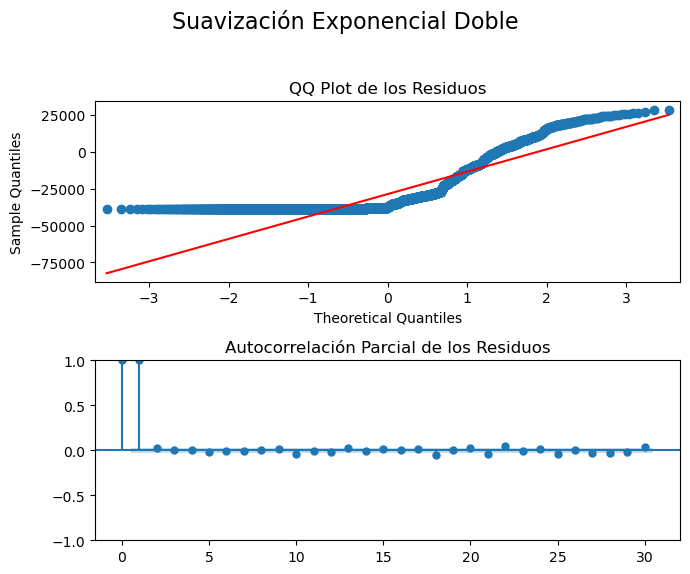

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [113]:
predicciones, y_pred_HW2_val_7 = des_model_tuning_train(price_train_ts7[-200:], price_train_ts7, price_val_ts7, step_val=len(price_train_ts7), step_test=len(price_val_ts7), trend='add')
y_pred_HW1_train_7 = pd.Series(predicciones.mean(), index=price_train_ts7.index[-1:])  # Esto crea una serie con la media y un índice
y_pred_HW1_train_7 = pd.Series([predicciones.mean()] * len(price_train_ts7), index=price_train_ts7.index)
y_pred_HW1_train_7_df = pd.DataFrame(y_pred_HW1_train_7, columns=['Predicciones'])

metrica_price_HW2_train =plot_residual_train('Suavización Exponencial Doble','DES HW' , price_train_ts7, y_pred_HW1_train_7)

In [114]:
metrica_price_HW2_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value
DES HW Train,5.2025e+12,1243759.4%,30314.02,1.0525e+09,-357.59%,0.0,0.0


A continuación se realizan las predicciones para el modelo de suavización exponencial Holt-Winters: 

* **Ventana de 7 días ($\omega = 7)$**

In [115]:
y_pred_HW2_val_7, y_pred_HW2_test_7  = des_model_tuning(price_train_ts7[-200:], price_val_ts7, price_test_ts7, step_val=price_tau_val7, step_test=price_tau_test7, trend='add')

In [116]:
metrica_DES_HW_val7 = metricas(price_val_ts7,y_pred_HW2_val_7)
metrica_DES_HW_val7.index = metrica_DES_HW_val7.index.map({0: 'DES HW Val Price (τ = 7)'})
metrica_DES_HW_val7

,SSE,MAPE,MAD,MSD,R2
DES HW Val Price (τ = 7),1.8772e+06,1.02%,437.08,268170.75,-295.37%


In [117]:
metrica_DES_HW_test7 = metricas(price_test_ts7,y_pred_HW2_test_7)
metrica_DES_HW_test7.index = metrica_DES_HW_test7.index.map({0: 'DES HW Prueba Price (τ = 7)'})
metrica_DES_HW_test7

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba Price (τ = 7),5.9449e+07,4.94%,2324.71,8.4927e+06,-94.76%


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [118]:
ljung_box_pval_des_hw7, jarque_bera_pval_des_hw7 = evaluate_residuals(price_test_ts7, y_pred_HW2_test_7)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [119]:
metrica_DES_HW_test7['Ljung-Box p-value'] = pd.Series([ljung_box_pval_des_hw7], index=metrica_DES_HW_test7.index)
metrica_DES_HW_test7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_des_hw7], index=metrica_DES_HW_test7.index)
metrica_DES_HW_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba Price (τ = 7),5.9449e+07,4.94%,2324.71,8.4927e+06,-94.76%,0.0384,0.6915


* **Ventana de 14 días ($\omega = 14)$**

In [120]:
y_pred_HW2_val_14, y_pred_HW2_test_14  = des_model_tuning(price_train_ts14[-200:], price_val_ts14, price_test_ts14, step_val=price_tau_val14, step_test=price_tau_test14, trend='add')

In [121]:
metrica_DES_HW_val14 = metricas(price_val_ts14,y_pred_HW2_val_14)
metrica_DES_HW_val14.index = metrica_DES_HW_val14.index.map({0: 'DES HW Val Price (τ = 14)'})
metrica_DES_HW_val14

,SSE,MAPE,MAD,MSD,R2
DES HW Val Price (τ = 14),1.6257e+09,23.73%,10519.0,1.1612e+08,-2918.2%


In [122]:
metrica_DES_HW_test14 = metricas(price_test_ts14,y_pred_HW2_test_14)
metrica_DES_HW_test14.index = metrica_DES_HW_test14.index.map({0: 'DES HW Prueba Price (τ = 14)'})
metrica_DES_HW_test14

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba Price (τ = 14),3.1750e+08,7.06%,3639.03,2.2679e+07,-3821.97%


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [123]:
ljung_box_pval_des_hw14, jarque_bera_pval_des_hw14 = evaluate_residuals(price_test_ts14, y_pred_HW2_test_14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [124]:
metrica_DES_HW_test14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_des_hw14], index=metrica_DES_HW_test14.index)
metrica_DES_HW_test14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_des_hw14], index=metrica_DES_HW_test14.index)
metrica_DES_HW_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba Price (τ = 14),3.1750e+08,7.06%,3639.03,2.2679e+07,-3821.97%,0.0008,0.5377


* **Ventana de 21 días ($\omega = 21)$**

In [125]:
y_pred_HW2_val_21, y_pred_HW2_test_21  = des_model_tuning(price_train_ts21[-200:], price_val_ts21, price_test_ts21, step_val=price_tau_val21, step_test=price_tau_test21, trend='add')

In [126]:
metrica_DES_HW_val21 = metricas(price_val_ts21,y_pred_HW2_val_21)
metrica_DES_HW_val21.index = metrica_DES_HW_val21.index.map({0: 'DES HW Val Price (τ = 21)'})
metrica_DES_HW_val21

,SSE,MAPE,MAD,MSD,R2
DES HW Val Price (τ = 21),7.6307e+09,40.34%,18838.22,3.6337e+08,-2489.96%


In [127]:
metrica_DES_HW_test21 = metricas(price_test_ts21,y_pred_HW2_test_21)
metrica_DES_HW_test21.index = metrica_DES_HW_test21.index.map({0: 'DES HW Prueba Price (τ = 21)'})
metrica_DES_HW_test21

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba Price (τ = 21),7.7108e+08,9.83%,5696.84,3.6718e+07,18.21%


A continuación realizamos un análisis sobre los residuales de nuestro conjunto de prueba (test)

In [128]:
ljung_box_pval_des_hw21, jarque_bera_pval_des_hw21 = evaluate_residuals(price_test_ts21, y_pred_HW2_test_21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [129]:
metrica_DES_HW_test21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_des_hw21], index=metrica_DES_HW_test21.index)
metrica_DES_HW_test21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_des_hw21], index=metrica_DES_HW_test21.index)
metrica_DES_HW_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba Price (τ = 21),7.7108e+08,9.83%,5696.84,3.6718e+07,18.21%,0.0221,0.9301


* **Ventana de 28 días ($\omega = 28)$**

In [130]:
y_pred_HW2_val_28, y_pred_HW2_test_28  = des_model_tuning(price_train_ts28[-200:], price_val_ts28, price_test_ts28, step_val=price_tau_val28, step_test=price_tau_test28, trend='add')

In [131]:
metrica_DES_HW_val28 = metricas(price_val_ts28,y_pred_HW2_val_28)
metrica_DES_HW_val28.index = metrica_DES_HW_val28.index.map({0: 'DES HW Val Price (τ = 28)'})
metrica_DES_HW_val28

,SSE,MAPE,MAD,MSD,R2
DES HW Val Price (τ = 28),2.1612e+09,15.94%,7812.85,7.7184e+07,-405.02%


In [132]:
metrica_DES_HW_test28 = metricas(price_test_ts28,y_pred_HW2_test_28)
metrica_DES_HW_test28.index = metrica_DES_HW_test28.index.map({0: 'DES HW Prueba Price (τ = 28)'})
metrica_DES_HW_test28

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba Price (τ = 28),1.4936e+10,32.85%,21951.74,5.3342e+08,-2825.84%


A continuación realizamos un análisis sobre los residuales de nuestro conjunto de prueba (test)

In [133]:
ljung_box_pval_des_hw28, jarque_bera_pval_des_hw28 = evaluate_residuals(price_test_ts28, y_pred_HW2_test_28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [134]:
metrica_DES_HW_test28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_des_hw28], index=metrica_DES_HW_test28.index)
metrica_DES_HW_test28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_des_hw28], index=metrica_DES_HW_test28.index)
metrica_DES_HW_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba Price (τ = 28),1.4936e+10,32.85%,21951.74,5.3342e+08,-2825.84%,1.4173e-05,0.1547


#### <font color="#30143">ARIMA (Usando Rolling)</font> 

A continuación se define función de ajuste del modelo y predicciones ARIMA.

In [135]:
def arima_model_fit(train):
    """
    Ajusta un modelo ARIMA a los datos de entrenamiento y selecciona el mejor modelo basado en el AIC.
    La función recibe los conjuntos de datos `train` y `val`.

    :param train: Conjunto de datos de entrenamiento (serie temporal).
    :param val: Conjunto de datos de validación (opcional, para verificar el rendimiento del modelo).
    :return: El modelo ajustado, el mejor AIC, el mejor orden (p, d, q) y los datos de entrenamiento.
    """
    model_filename = 'best_arima_model.pkl'
    
    # Si el mejor modelo ya existe, cargarlo y evitar volver a ejecutar el ciclo for
    if os.path.exists(model_filename):
        print(f"Mejor modelo ya existe. Cargando desde {model_filename}.")
        with open(model_filename, 'rb') as f:
            best_model_global = pickle.load(f)
        return best_model_global, None, None

    # Inicializamos el mejor AIC y BIC en infinito
    best_aic = np.inf
    best_bic = np.inf
    best_order = None
    best_mdl = None
   
    # Rango de p, d, q para probar diferentes combinaciones
    pq_rng = range(3)  # Esto es para p y q (máximo 2)
    d_rng  = range(2)  # Esto es para d (máximo 1)

    # Iterar sobre los valores posibles de p, d y q
    for p in pq_rng:
        for d in d_rng:
            for q in pq_rng:
                try:
                    # Ajustar el modelo ARIMA para los valores de p, d, q
                    tmp_mdl = ARIMA(train, order=(p, d, q)).fit()
                    tmp_aic = tmp_mdl.aic  # Obtener el AIC del modelo ajustado
                    
                    # Si el AIC actual es mejor, actualizar los mejores valores
                    if tmp_aic < best_aic:
                        best_aic = tmp_aic
                        best_order = (p, d, q)
                        best_mdl = tmp_mdl
                except Exception as e:
                    print(f"Error ajustando ARIMA({p},{d},{q}): {e}")
                    continue  # Si hay un error, continuar con el siguiente intento

    # Imprimir los resultados del mejor modelo encontrado
    print(f"\nMejor modelo ARIMA:")
    print(f'Best AIC: {best_aic}')
    print(f'Best Order: {best_order}')
    print(f'aic: {best_aic:6.5f} | order: {best_order}')

    # Ajustar el modelo ARIMA final con el mejor orden
    model = ARIMA(train, order=best_order)
    model_fit = model.fit()

    # Guardar el mejor modelo en un archivo con pickle
    with open('best_arima_model.pkl', 'wb') as f:
        pickle.dump(best_mdl, f)
    print(f"\nMejor modelo ARIMA guardado con AIC {best_aic}")

    # Retornar el modelo ajustado, el mejor AIC y el mejor orden
    return model_fit, best_aic, best_order

A continuación se define la función `arima_rolling()`

In [136]:
def arima_rolling(history, val, best_order): # arima_rolling(train.tolist(), val, test_nd, best_order)
    
    predictions = list()
    for t in range(len(val)):
        model = ARIMA(history, order=best_order)
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = val[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat, obs))
        
    return predictions

La siguiente función devuelve los parámetros `p`, `d`, `q` que definen `el mejor modelo ARIMA` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste. Además, proporciona los resultados del modelo `ARIMA ajustado` para `datos de entrenamiento`, incluyendo las `fechas` correspondientes. También incluye los datos y fechas del modelo `ARIMA de prueba`, aunque estos últimos dos no son directamente visibles en la salida de la función.


Indexación de parámetros para la función `arima_model_fit()`

In [137]:
model_fit, best_aic, best_order = arima_model_fit(price_train_ts7)
best_order = model_fit.model.order

Mejor modelo ya existe. Cargando desde best_arima_model.pkl.


In [138]:
print(best_order)

(2, 1, 2)


A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

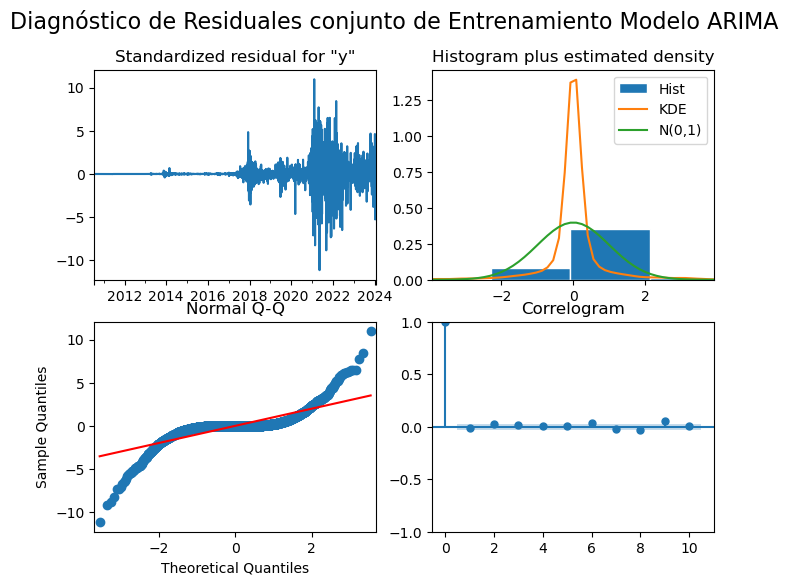

In [139]:
model_fit.plot_diagnostics(figsize=(8, 6))
plt.suptitle('Diagnóstico de Residuales conjunto de Entrenamiento Modelo ARIMA', fontsize=16)
plt.show()

In [140]:
residuos_train_arima = model_fit.resid
ljung_box_pval_arima_train, jarque_bera_pval_arima_train = evaluate_residuals_train_arima(residuos_train_arima)

Ljung-Box LB Statistic: 0.616231
Ljung-Box p-value: 0.432451
No se rechaza H0: los residuales son independientes (no correlacionados).
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [141]:
# Extraer predicciones para todo el conjunto de entrenamiento sin estandarizar 
predicciones = model_fit.get_prediction(start=0, end=len(price_train_ts7)-1, dynamic=False)
yhat_arima_train = predicciones.predicted_mean

yhat_arima_train.index = price_train_ts7.index # yhat_arima_train mismo índice que price_train_ts7

#calcular las métricas 
metrica_price_arima_train = metricas(price_train_ts7,yhat_arima_train)
metrica_price_arima_train.index = metrica_price_arima_train.index.map({0: 'Arima Entrenamiento Price'})
metrica_price_arima_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_arima_train], index=metrica_price_arima_train.index)
metrica_price_arima_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_arima_train], index=metrica_price_arima_train.index)
metrica_price_arima_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Entrenamiento Price,2.1213e+09,3.11%,259.99,429150.5,99.81%,0.4325,0.0


La función `arima_rolling()` devuelve las prediciones, con base a los parámetros `p`, `d`, `q` que definen `el mejor modelo ARIMA` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste, aprovechando datos históricos para pronosticar continuamente la concentración de PM10 durante un período (horizonte) específico.

A continuación se indexan los parámetros de la función `arima_rolling()` para las ventanas de 7, 14, 21 y 28 días para la predicción sobre los datos de `validación` y `prueba`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [142]:
# best_aic_arima = best_ order
price_val_l7 = price_val_ts7.tolist()
price_train_l7 = price_train_ts7.tolist()
yhat_val_arimarolling7  = arima_rolling(price_train_l7, price_val_l7, best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
yhat_val_arimarolling7 = pd.Series(yhat_val_arimarolling7, index=price_val_ts7.index)  # Indexa las fechas de price_val_ts7

predicted=42095.622696, expected=43299.800000
predicted=43375.742274, expected=42946.200000
predicted=42971.161604, expected=42580.500000
predicted=42535.133289, expected=43081.400000
predicted=43000.996502, expected=43194.700000
predicted=43172.416181, expected=43005.700000
predicted=43070.444922, expected=42581.400000


* **Predicciones datos de Prueba**: 

In [143]:
# best_aic_arima = best_ order
price_test_l7 = price_test_ts7.tolist()
price_train_l7 = price_train_ts7.tolist()
yhat_test_arimarolling7  = arima_rolling(price_train_l7, price_test_l7, best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
yhat_test_arimarolling7 = pd.Series(yhat_test_arimarolling7, index=price_test_ts7.index)  # Indexa las fechas de price_test_ts7

predicted=42095.622696, expected=42697.200000
predicted=42789.926860, expected=43087.700000
predicted=43099.899228, expected=44339.800000
predicted=44230.667582, expected=45293.300000
predicted=45176.179744, expected=47127.500000
predicted=47093.057943, expected=47758.200000
predicted=47842.485094, expected=48277.300000


In [144]:
plot_model(price_train_ts7[-200:], price_val_ts7, price_test_ts7, yhat_val_arimarolling7, yhat_test_arimarolling7, title="Predicciones usando ARIMA rolling ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [145]:
ljung_box_pval_arimarol7, jarque_bera_pval_arimarol7 = evaluate_residuals(price_test_ts7, yhat_test_arimarolling7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [146]:
metrica_arimarol_test7 = metricas(price_test_ts7,yhat_test_arimarolling7)
metrica_arimarol_test7.index = metrica_arimarol_test7.index.map({0: 'Arima Rolling Prueba Price (τ = 7)'})
metrica_arimarol_test7['Ljung-Box p-value'] = pd.Series([ljung_box_pval_arimarol7], index=metrica_arimarol_test7.index)
metrica_arimarol_test7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_arimarol7], index=metrica_arimarol_test7.index)
metrica_arimarol_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba Price (τ = 7),7.5562e+06,1.95%,893.31,1.0795e+06,75.25%,0.9105,0.643


* **Ventana de 14 días ($\omega = 14)$**

* **Datos de Validación**: 

In [147]:
# best_aic_arima = best_ order
price_val_l14 = price_val_ts14.tolist()
price_train_l14 = price_train_ts14.tolist()
yhat_val_arimarolling14  = arima_rolling(price_train_l14, price_val_l14, best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
yhat_val_arimarolling14 = pd.Series(yhat_val_arimarolling14, index=price_val_ts14.index)  # Indexa las fechas de price_val_ts14

predicted=42095.622696, expected=43299.800000
predicted=43375.742274, expected=42946.200000
predicted=42971.161604, expected=42580.500000
predicted=42535.133289, expected=43081.400000
predicted=43000.996502, expected=43194.700000
predicted=43172.416181, expected=43005.700000
predicted=43070.444922, expected=42581.400000
predicted=42667.552634, expected=42697.200000
predicted=42591.594010, expected=43087.700000
predicted=42998.073823, expected=44339.800000
predicted=44230.646974, expected=45293.300000
predicted=45274.138012, expected=47127.500000
predicted=47176.166743, expected=47758.200000
predicted=47820.295282, expected=48277.300000


* **Predicciones datos de Prueba**: 

In [148]:
# best_aic_arima = best_ order
price_test_l14 = price_test_ts14.tolist()
price_train_l14 = price_train_ts14.tolist()
yhat_test_arimarolling14  = arima_rolling(price_train_l14, price_test_l14, best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
yhat_test_arimarolling14= pd.Series(yhat_test_arimarolling14, index=price_test_ts14.index)  # Indexa las fechas de price_test_ts14

predicted=42095.622696, expected=49941.300000
predicted=49815.440026, expected=49716.000000
predicted=49648.208225, expected=51782.400000
predicted=51782.464956, expected=51901.300000
predicted=51983.343219, expected=52134.200000
predicted=52198.583770, expected=51646.000000
predicted=51638.955412, expected=52117.500000
predicted=52030.809659, expected=51783.600000
predicted=51732.040981, expected=52263.500000
predicted=52285.010943, expected=51858.200000
predicted=51943.049452, expected=51320.400000
predicted=51381.571030, expected=50740.500000
predicted=50721.534279, expected=51571.600000
predicted=51466.775244, expected=51722.700000


In [149]:
plot_model(price_train_ts14[-200:], price_val_ts14, price_test_ts14, yhat_val_arimarolling14, yhat_test_arimarolling14, title="Predicciones usando ARIMA rolling ventana de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [150]:
ljung_box_pval_arimarol14, jarque_bera_pval_arimarol14 = evaluate_residuals(price_test_ts14, yhat_test_arimarolling14)

No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [151]:
metrica_arimarol_test14 = metricas(price_test_ts14,yhat_test_arimarolling14)
metrica_arimarol_test14.index = metrica_arimarol_test14.index.map({0: 'Arima Rolling Prueba Price (τ = 14)'})
metrica_arimarol_test14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_arimarol14], index=metrica_arimarol_test14.index)
metrica_arimarol_test14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_arimarol14], index=metrica_arimarol_test14.index)
metrica_arimarol_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba Price (τ = 14),6.8803e+07,2.11%,1068.24,4.9145e+06,-749.9%,0.8479,5.1185e-10


* **Ventana de 21 días ($\omega = 21)$**

* **Datos de Validación**: 

In [152]:
# best_aic_arima = best_ order
price_val_l21 = price_val_ts21.tolist()
price_train_l21 = price_train_ts21.tolist()
yhat_val_arimarolling21  = arima_rolling(price_train_l21, price_val_l21, best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
yhat_val_arimarolling21 = pd.Series(yhat_val_arimarolling21, index=price_val_ts21.index)  # Indexa las fechas de price_val_ts21

predicted=42095.622696, expected=43299.800000
predicted=43375.742274, expected=42946.200000
predicted=42971.161604, expected=42580.500000
predicted=42535.133289, expected=43081.400000
predicted=43000.996502, expected=43194.700000
predicted=43172.416181, expected=43005.700000
predicted=43070.444922, expected=42581.400000
predicted=42667.552634, expected=42697.200000
predicted=42591.594010, expected=43087.700000
predicted=42998.073823, expected=44339.800000
predicted=44230.646974, expected=45293.300000
predicted=45274.138012, expected=47127.500000
predicted=47176.166743, expected=47758.200000
predicted=47820.295282, expected=48277.300000
predicted=48276.048919, expected=49941.300000
predicted=49840.939827, expected=49716.000000
predicted=49656.908755, expected=51782.400000
predicted=51770.004923, expected=51901.300000
predicted=51965.119292, expected=52134.200000
predicted=52197.203092, expected=51646.000000
predicted=51653.795332, expected=52117.500000


* **Predicciones datos de Prueba**: 

In [153]:
# best_aic_arima = best_ order
price_test_l21 = price_test_ts21.tolist()
price_train_l21 = price_train_ts21.tolist()
yhat_test_arimarolling21  = arima_rolling(price_train_l21, price_test_l21, best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
yhat_test_arimarolling21= pd.Series(yhat_test_arimarolling21, index=price_test_ts21.index)  # Indexa las fechas de price_test_ts21

predicted=42095.622696, expected=51783.600000
predicted=51594.724330, expected=52263.500000
predicted=52152.323356, expected=51858.200000
predicted=51957.102062, expected=51320.400000
predicted=51520.866617, expected=50740.500000
predicted=50825.520765, expected=51571.600000
predicted=51426.456032, expected=51722.700000
predicted=51521.706148, expected=54495.100000
predicted=54397.309041, expected=57056.200000
predicted=57021.227835, expected=62467.600000
predicted=62478.302023, expected=61169.300000
predicted=61424.696257, expected=62397.700000
predicted=62594.529401, expected=61994.500000
predicted=62197.650108, expected=63135.800000
predicted=63254.810935, expected=68270.100000
predicted=68158.992475, expected=63792.600000
predicted=63938.910608, expected=66080.400000
predicted=66202.063218, expected=66855.300000
predicted=66819.312824, expected=68172.000000
predicted=67998.443697, expected=68366.500000
predicted=68267.029135, expected=68964.800000


In [154]:
plot_model(price_train_ts21[-200:], price_val_ts21, price_test_ts21, yhat_val_arimarolling21, yhat_test_arimarolling21, title="Predicciones usando ARIMA rolling ventana de 21 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [155]:
ljung_box_pval_arimarol21, jarque_bera_pval_arimarol21 = evaluate_residuals(price_test_ts21, yhat_test_arimarolling21)

No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [156]:
metrica_arimarol_test21 = metricas(price_test_ts21,yhat_test_arimarolling21)
metrica_arimarol_test21.index = metrica_arimarol_test21.index.map({0: 'Arima Rolling Prueba Price (τ = 21)'})
metrica_arimarol_test21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_arimarol21], index=metrica_arimarol_test21.index)
metrica_arimarol_test21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_arimarol21], index=metrica_arimarol_test21.index)
metrica_arimarol_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba Price (τ = 21),1.9721e+08,3.44%,2028.76,9.3908e+06,79.08%,0.4452,0.0133


* **Ventana de 28 días ($\omega = 28)$**

* **Datos de Validación**: 

In [157]:
# best_aic_arima = best_ order
price_val_l28 = price_val_ts28.tolist()
price_train_l28 = price_train_ts28.tolist()
yhat_val_arimarolling28  = arima_rolling(price_train_l28, price_val_l28, best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
yhat_val_arimarolling28 = pd.Series(yhat_val_arimarolling28, index=price_val_ts28.index)  # Indexa las fechas de price_val_ts28

predicted=42095.622696, expected=43299.800000
predicted=43375.742274, expected=42946.200000
predicted=42971.161604, expected=42580.500000
predicted=42535.133289, expected=43081.400000
predicted=43000.996502, expected=43194.700000
predicted=43172.416181, expected=43005.700000
predicted=43070.444922, expected=42581.400000
predicted=42667.552634, expected=42697.200000
predicted=42591.594010, expected=43087.700000
predicted=42998.073823, expected=44339.800000
predicted=44230.646974, expected=45293.300000
predicted=45274.138012, expected=47127.500000
predicted=47176.166743, expected=47758.200000
predicted=47820.295282, expected=48277.300000
predicted=48276.048919, expected=49941.300000
predicted=49840.939827, expected=49716.000000
predicted=49656.908755, expected=51782.400000
predicted=51770.004923, expected=51901.300000
predicted=51965.119292, expected=52134.200000
predicted=52197.203092, expected=51646.000000
predicted=51653.795332, expected=52117.500000
predicted=52043.496837, expected=5

* **Predicciones datos de Prueba**: 

In [158]:
# best_aic_arima = best_ order
price_test_l28 = price_test_ts28.tolist()
price_train_l28 = price_train_ts28.tolist()
yhat_test_arimarolling28  = arima_rolling(price_train_l28, price_test_l28, best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
yhat_test_arimarolling28= pd.Series(yhat_test_arimarolling28, index=price_test_ts28.index)  # Indexa las fechas de price_test_ts28

predicted=42095.622696, expected=54495.100000
predicted=54193.061781, expected=57056.200000
predicted=56868.470980, expected=62467.600000
predicted=62609.504943, expected=61169.300000
predicted=61414.442596, expected=62397.700000
predicted=62465.976809, expected=61994.500000
predicted=62232.356258, expected=63135.800000
predicted=63272.375361, expected=68270.100000
predicted=68354.358531, expected=63792.600000
predicted=63921.021801, expected=66080.400000
predicted=66090.480625, expected=66855.300000
predicted=66880.370188, expected=68172.000000
predicted=68213.184307, expected=68366.500000
predicted=68471.450480, expected=68964.800000
predicted=69051.348157, expected=72099.100000
predicted=72109.968458, expected=71470.200000
predicted=71668.390425, expected=73066.300000
predicted=73171.916685, expected=71387.500000
predicted=71591.118676, expected=69463.700000
predicted=69573.472570, expected=65314.200000
predicted=65305.960122, expected=68391.200000
predicted=68078.406685, expected=6

In [159]:
plot_model(price_train_ts28[-200:], price_val_ts28, price_test_ts28, yhat_val_arimarolling28, yhat_test_arimarolling28, title="Predicciones usando ARIMA rolling ventana de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [160]:
ljung_box_pval_arimarol28, jarque_bera_pval_arimarol28 = evaluate_residuals(price_test_ts28, yhat_test_arimarolling28)

No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [161]:
metrica_arimarol_test28 = metricas(price_test_ts28,yhat_test_arimarolling28)
metrica_arimarol_test28.index = metrica_arimarol_test28.index.map({0: 'Arima Rolling Prueba Price (τ = 28)'})
metrica_arimarol_test28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_arimarol28], index=metrica_arimarol_test28.index)
metrica_arimarol_test28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_arimarol28], index=metrica_arimarol_test28.index)
metrica_arimarol_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba Price (τ = 28),3.7771e+08,4.18%,2653.05,1.3490e+07,26.01%,0.5954,0.0125


#### <font color="#30143">ARIMA (Sin Rolling)</font> 

A continuación se procede con la predicción del precio del bitcoin usando `forecast()`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [162]:
yhat_val_arima7 = model_fit.forecast(steps=len(price_val_ts7))
print(yhat_val_arima7)

2024-01-29    42095.6227
2024-01-30    42204.8987
2024-01-31    42232.9031
2024-02-01    42152.1371
2024-02-02    42059.3019
2024-02-03    42059.8237
2024-02-04    42148.3815
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [163]:
yhat_test_arima7 = model_fit.forecast(steps=len(price_test_ts7))
yhat_test_arima7 = pd.Series(yhat_test_arima7)
yhat_test_arima7.index = price_test_ts7.index # Asigna el índice de las fechas de price_test_ts7
print(yhat_test_arima7)


Date
2024-02-05    42095.6227
2024-02-06    42204.8987
2024-02-07    42232.9031
2024-02-08    42152.1371
2024-02-09    42059.3019
2024-02-10    42059.8237
2024-02-11    42148.3815
Name: predicted_mean, dtype: float64


In [164]:
plot_model(price_train_ts7[-200:], price_val_ts7, price_test_ts7, yhat_val_arima7, yhat_test_arima7, title="Predicciones usando ARIMA ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [165]:
ljung_box_pval_arima7, jarque_bera_pval_arima7 = evaluate_residuals(price_test_ts7, yhat_test_arima7)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [166]:
metrica_arima_test7 = metricas(price_test_ts7,yhat_test_arima7)
metrica_arima_test7.index = metrica_arima_test7.index.map({0: 'Arima prueba Price (τ = 7)'})
metrica_arima_test7['Ljung-Box p-value'] = pd.Series([ljung_box_pval_arima7], index=metrica_arima_test7.index)
metrica_arima_test7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_arima7], index=metrica_arima_test7.index)
metrica_arima_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba Price (τ = 7),1.1117e+08,7.22%,3375.42,1.5881e+07,-264.2%,0.0362,0.6835


* **Ventana de 14 días ($\omega = 14)$**

* **Predicciones datos de Validación**: 

In [167]:
yhat_val_arima14 = model_fit.forecast(steps=len(price_val_ts14))
print(yhat_val_arima14)

2024-01-29    42095.6227
2024-01-30    42204.8987
2024-01-31    42232.9031
2024-02-01    42152.1371
2024-02-02    42059.3019
2024-02-03    42059.8237
2024-02-04    42148.3815
2024-02-05    42220.5279
2024-02-06    42195.6386
2024-02-07    42106.7330
2024-02-08    42057.4337
2024-02-09    42101.3940
2024-02-10    42184.2542
2024-02-11    42210.4900
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [168]:
yhat_test_arima14 = model_fit.forecast(steps=len(price_test_ts14))
yhat_test_arima14 = pd.Series(yhat_test_arima14)
yhat_test_arima14.index = price_test_ts14.index # Asigna el índice de las fechas de price_test_ts14
print(yhat_test_arima14)


Date
2024-02-12    42095.6227
2024-02-13    42204.8987
2024-02-14    42232.9031
2024-02-15    42152.1371
2024-02-16    42059.3019
2024-02-17    42059.8237
2024-02-18    42148.3815
2024-02-19    42220.5279
2024-02-20    42195.6386
2024-02-21    42106.7330
2024-02-22    42057.4337
2024-02-23    42101.3940
2024-02-24    42184.2542
2024-02-25    42210.4900
Name: predicted_mean, dtype: float64


In [169]:
plot_model(price_train_ts14[-200:], price_val_ts14, price_test_ts14, yhat_val_arima14, yhat_test_arima14, title="Predicciones usando ARIMA ventana de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [170]:
ljung_box_pval_arima14, jarque_bera_pval_arima14 = evaluate_residuals(price_test_ts14, yhat_test_arima14)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [171]:
metrica_arima_test14 = metricas(price_test_ts14,yhat_test_arima14)
metrica_arima_test14.index = metrica_arima_test14.index.map({0: 'Arima prueba Price (τ = 14)'})
metrica_arima_test14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_arima14], index=metrica_arima_test14.index)
metrica_arima_test14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_arima14], index=metrica_arima_test14.index)
metrica_arima_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba Price (τ = 14),1.2239e+09,18.09%,9319.26,8.7424e+07,-15018.94%,0.0571,0.1183


* **Ventana de 21 días ($\omega = 21)$**

* **Predicciones datos de Validación**: 

In [172]:
yhat_val_arima21 = model_fit.forecast(steps=len(price_val_ts21))
print(yhat_val_arima21)

2024-01-29    42095.6227
2024-01-30    42204.8987
2024-01-31    42232.9031
2024-02-01    42152.1371
2024-02-02    42059.3019
2024-02-03    42059.8237
2024-02-04    42148.3815
2024-02-05    42220.5279
2024-02-06    42195.6386
2024-02-07    42106.7330
2024-02-08    42057.4337
2024-02-09    42101.3940
2024-02-10    42184.2542
2024-02-11    42210.4900
2024-02-12    42153.3504
2024-02-13    42081.5741
2024-02-14    42076.9413
2024-02-15    42141.2793
2024-02-16    42198.4522
2024-02-17    42184.2727
2024-02-18    42118.3666
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [173]:
yhat_test_arima21 = model_fit.forecast(steps=len(price_test_ts21))
yhat_test_arima21 = pd.Series(yhat_test_arima21)
yhat_test_arima21.index = price_test_ts21.index # Asigna el índice de las fechas de price_test_ts21
print(yhat_test_arima21)

Date
2024-02-19    42095.6227
2024-02-20    42204.8987
2024-02-21    42232.9031
2024-02-22    42152.1371
2024-02-23    42059.3019
2024-02-24    42059.8237
2024-02-25    42148.3815
2024-02-26    42220.5279
2024-02-27    42195.6386
2024-02-28    42106.7330
2024-02-29    42057.4337
2024-03-01    42101.3940
2024-03-02    42184.2542
2024-03-03    42210.4900
2024-03-04    42153.3504
2024-03-05    42081.5741
2024-03-06    42076.9413
2024-03-07    42141.2793
2024-03-08    42198.4522
2024-03-09    42184.2727
2024-03-10    42118.3666
Name: predicted_mean, dtype: float64


In [174]:
plot_model(price_train_ts21[-200:], price_val_ts21, price_test_ts21, yhat_val_arima21, yhat_test_arima21, title="Predicciones usando ARIMA ventana de 21 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [175]:
ljung_box_pval_arima21, jarque_bera_pval_arima21 = evaluate_residuals(price_test_ts21, yhat_test_arima21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [176]:
metrica_arima_test21 = metricas(price_test_ts21,yhat_test_arima21)
metrica_arima_test21.index = metrica_arima_test21.index.map({0: 'Arima prueba Price (τ = 21)'})
metrica_arima_test21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_arima21], index=metrica_arima_test21.index)
metrica_arima_test21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_arima21], index=metrica_arima_test21.index)
metrica_arima_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba Price (τ = 21),7.4441e+09,28.54%,17594.98,3.5448e+08,-689.65%,2.0777e-05,0.3254


* **Ventana de 28 días ($\omega = 28)$**

* **Predicciones datos de Validación**: 

In [177]:
yhat_val_arima28 = model_fit.forecast(steps=len(price_val_ts28))
print(yhat_val_arima28)

2024-01-29    42095.6227
2024-01-30    42204.8987
2024-01-31    42232.9031
2024-02-01    42152.1371
2024-02-02    42059.3019
2024-02-03    42059.8237
2024-02-04    42148.3815
2024-02-05    42220.5279
2024-02-06    42195.6386
2024-02-07    42106.7330
2024-02-08    42057.4337
2024-02-09    42101.3940
2024-02-10    42184.2542
2024-02-11    42210.4900
2024-02-12    42153.3504
2024-02-13    42081.5741
2024-02-14    42076.9413
2024-02-15    42141.2793
2024-02-16    42198.4522
2024-02-17    42184.2727
2024-02-18    42118.3666
2024-02-19    42077.7662
2024-02-20    42107.0284
2024-02-21    42169.5738
2024-02-22    42193.0994
2024-02-23    42153.0215
2024-02-24    42097.8135
2024-02-25    42090.5742
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [178]:
yhat_test_arima28 = model_fit.forecast(steps=len(price_test_ts28))
yhat_test_arima28 = pd.Series(yhat_test_arima28)
yhat_test_arima28.index = price_test_ts28.index # Asigna el índice de las fechas de price_test_ts28
print(yhat_test_arima28)

Date
2024-02-26    42095.6227
2024-02-27    42204.8987
2024-02-28    42232.9031
2024-02-29    42152.1371
2024-03-01    42059.3019
2024-03-02    42059.8237
2024-03-03    42148.3815
2024-03-04    42220.5279
2024-03-05    42195.6386
2024-03-06    42106.7330
2024-03-07    42057.4337
2024-03-08    42101.3940
2024-03-09    42184.2542
2024-03-10    42210.4900
2024-03-11    42153.3504
2024-03-12    42081.5741
2024-03-13    42076.9413
2024-03-14    42141.2793
2024-03-15    42198.4522
2024-03-16    42184.2727
2024-03-17    42118.3666
2024-03-18    42077.7662
2024-03-19    42107.0284
2024-03-20    42169.5738
2024-03-21    42193.0994
2024-03-22    42153.0215
2024-03-23    42097.8135
2024-03-24    42090.5742
Name: predicted_mean, dtype: float64


In [179]:
plot_model(price_train_ts28[-200:], price_val_ts28, price_test_ts28, yhat_val_arima28, yhat_test_arima28, title="Predicciones usando ARIMA ventana de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [180]:
ljung_box_pval_arima28, jarque_bera_pval_arima28 = evaluate_residuals(price_test_ts28, yhat_test_arima28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [181]:
metrica_arima_test28 = metricas(price_test_ts28,yhat_test_arima28)
metrica_arima_test28.index = metrica_arima_test28.index.map({0: 'Arima prueba Price (τ = 28)'})
metrica_arima_test28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_arima28], index=metrica_arima_test28.index)
metrica_arima_test28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_arima28], index=metrica_arima_test28.index)
metrica_arima_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba Price (τ = 28),1.6190e+10,35.68%,23663.38,5.7820e+08,-3071.47%,0.0003,0.4345


#### <font color="#30143">Modelo con Heterocedasticidad Condicional Autorregresiva Generalizado - GARCH (Usando Rolling)</font> 

A continuación se define función de ajuste del modelo y predicciones GARCH.

In [182]:
import os
import pickle
import numpy as np
import pandas as pd
from arch import arch_model

def garch_model_fit(train):
    """
    Ajusta un modelo GARCH a los datos de entrenamiento y selecciona el mejor modelo basado en el AIC.
    La función recibe el conjunto de datos `train`.

    :param train: Conjunto de datos de entrenamiento (serie temporal).
    :return: El modelo ajustado, el mejor AIC, los mejores parámetros (p, q) y los datos de entrenamiento.
    """
    model_filename = 'best_garch_model.pkl'
    
    # Si el mejor modelo ya existe, cargarlo y evitar volver a ejecutar el ciclo for
    if os.path.exists(model_filename):
        print(f"Mejor modelo ya existe. Cargando desde {model_filename}.")
        with open(model_filename, 'rb') as f:
            best_model_global = pickle.load(f)
        return best_model_global, None, None

    # Inicializamos el mejor AIC en infinito
    best_aic = np.inf
    best_order = None
    best_mdl = None

    # Rango de p y q para probar diferentes combinaciones
    p_rng = range(4)  # Máximo 2 para p
    q_rng = range(3)  # Máximo 2 para q

    # Iterar sobre los valores posibles de p y q
    for p in p_rng:
        for q in q_rng:
            try:
                # Ajustar el modelo GARCH para los valores de p y q
                tmp_mdl = arch_model(train, vol='Garch', p=p, q=q).fit(disp="off")
                tmp_aic = tmp_mdl.aic  # Obtener el AIC del modelo ajustado
                
                # Si el AIC actual es mejor, actualizar los mejores valores
                if tmp_aic < best_aic:
                    best_aic = tmp_aic
                    best_order = (p, q)
                    best_mdl = tmp_mdl
            except Exception as e:
                print(f"Error ajustando GARCH({p},{q}): {e}")
                continue  # Si hay un error, continuar con el siguiente intento

    # Imprimir los resultados del mejor modelo encontrado
    print(f"\nMejor modelo GARCH:")
    print(f'Best AIC: {best_aic}')
    print(f'Best Order: {best_order}')
    print(f'aic: {best_aic:6.5f} | order: {best_order}')

    # Guardar el mejor modelo en un archivo con pickle
    with open(model_filename, 'wb') as f:
        pickle.dump(best_mdl, f)
    print(f"\nMejor modelo GARCH guardado con AIC {best_aic}")

    # Retornar el modelo ajustado, el mejor AIC y los mejores parámetros
    return best_mdl, best_aic, best_order


A continuación se define la función `garch_rolling()`

In [183]:
from arch import arch_model

def garch_rolling(history, val, best_order, horizon):
    predictions = list()

    for t in range(len(val)):
        model = arch_model(history, vol='Garch', p=best_order[0], q=best_order[1])
        model_fit = model.fit(disp="off")
        forecast = model_fit.forecast(horizon=horizon) #obtener las predicciones para un horizonte de 7 días
        yhat = forecast.mean.values[-1, :]  # Obtener la predicción media
        predictions.append(yhat[0])  # Agregar la predicción a la lista
        obs = val[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat[0], obs))
        
    return predictions

La siguiente función devuelve los parámetros `p`, `q` que definen `el mejor modelo GARCH` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste. Además, proporciona los resultados del modelo `GARCH ajustado` para `datos de entrenamiento`, incluyendo las `fechas` correspondientes. También incluye los datos y fechas del modelo `GARCH de prueba`, aunque estos últimos dos no son directamente visibles en la salida de la función.

Indexación de parámetros para la función `garch_model_fit()`

In [184]:
gmodel_fit, gbest_aic, gbest_order = garch_model_fit(price_train_ts7)

Error ajustando GARCH(0,0): One of p or o must be strictly positive
Error ajustando GARCH(0,1): One of p or o must be strictly positive
Error ajustando GARCH(0,2): One of p or o must be strictly positive

Mejor modelo GARCH:
Best AIC: 96676.01190637256
Best Order: (1, 1)
aic: 96676.01191 | order: (1, 1)

Mejor modelo GARCH guardado con AIC 96676.01190637256


In [185]:
gbest_order

(1, 1)

In [186]:
best_p = gbest_order[0]
best_q = gbest_order[1]

print(f"Mejor p: {best_p}, Mejor q: {best_q}")

Mejor p: 1, Mejor q: 1


A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

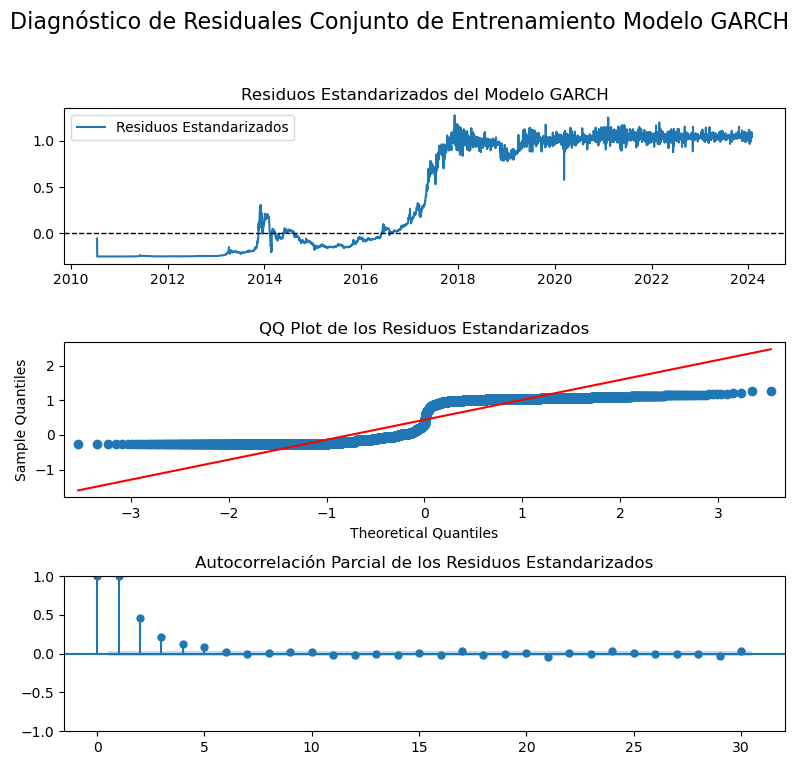

In [187]:
residuos = gmodel_fit.resid
volatilidad = gmodel_fit.conditional_volatility

# Calcular residuos estandarizados
residuos_estandarizados = residuos / volatilidad

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8, 8))

# Gráfico de residuos estandarizados
axes[0].plot(residuos_estandarizados, label='Residuos Estandarizados', color='#1f77b4')
axes[0].axhline(0, color='black', linestyle='--', linewidth=1)
axes[0].set_title('Residuos Estandarizados del Modelo GARCH')
axes[0].legend()

# Gráfico QQ plot
sm.qqplot(residuos_estandarizados, line='s', ax=axes[1])
axes[1].set_title('QQ Plot de los Residuos Estandarizados')

# Gráfico de autocorrelación parcial (PACF)
sm.graphics.tsa.plot_pacf(residuos_estandarizados, lags=30, ax=axes[2])
axes[2].set_title('Autocorrelación Parcial de los Residuos Estandarizados')

plt.suptitle('Diagnóstico de Residuales Conjunto de Entrenamiento Modelo GARCH', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Ajustar el layout para el título
plt.show()


In [188]:
residuos_train_garch = gmodel_fit.resid
ljung_box_pval_garch_train, jarque_bera_pval_garch_train = evaluate_residuals_train_arima(residuos_train_garch)

Ljung-Box LB Statistic: 4931.866292
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [189]:
predicciones = gmodel_fit.forecast(horizon=len(price_train_ts7))
yhat_garch_train = predicciones.mean.values[-len(price_train_ts7):].flatten()  #Se obtiene la ultima serie de predicciones en un arreglo 1D
yhat_garch_df = pd.DataFrame(yhat_garch_train, columns=['Predicciones'], index=price_train_ts7.index) #convertir a dataframe para indexar fechas de price_train_ts7

#calcular las métricas 
metrica_price_garch_train = metricas(price_train_ts7,yhat_garch_train)
metrica_price_garch_train.index = metrica_price_garch_train.index.map({0: 'Garch Rolling Entrenamiento Price'})
metrica_price_garch_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_garch_train], index=metrica_price_garch_train.index)
metrica_price_garch_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_garch_train], index=metrica_price_garch_train.index)
metrica_price_garch_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Entrenamiento Price,1.6056e+12,17654.01%,10056.42,3.2483e+08,-41.23%,0.0,0.0


La función `garch_rolling()` devuelve las prediciones, con base a los parámetros `p` y `q` que definen `el mejor modelo GARCH` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste, aprovechando datos históricos para pronosticar continuamente la concentración de PM10 durante un período (horizonte) específico.

A continuación se indexan los parámetros de la función `garch_rolling()` para las ventanas de 7, 14, 21 y 28 días para la predicción sobre los datos de `validación` y `prueba`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [190]:
# best_aic_arima = best_ order
price_val_l7 = price_val_ts7.tolist()
price_train_l7 = price_train_ts7.tolist()
yhat_val_garchrolling7  = garch_rolling(price_train_l7, price_val_l7, gbest_order, 7) 
yhat_val_garchrolling7 = pd.Series(yhat_val_garchrolling7, index=price_val_ts7.index)  # Indexa las fechas de price_val_ts7

predicted=553.119877, expected=43299.800000
predicted=553.444678, expected=42946.200000
predicted=553.623571, expected=42580.500000
predicted=553.595132, expected=43081.400000
predicted=554.017138, expected=43194.700000
predicted=554.028680, expected=43005.700000
predicted=554.635819, expected=42581.400000


* **Predicciones datos de Prueba**: 

In [191]:
# best_aic_arima = best_ order
price_test_l7 = price_test_ts7.tolist()
price_train_l7 = price_train_ts7.tolist()
yhat_test_garchrolling7  = garch_rolling(price_train_l7, price_test_l7, best_order,7) 
yhat_test_garchrolling7 = pd.Series(yhat_test_garchrolling7, index=price_test_ts7.index)  # Indexa las fechas de price_test_ts7

predicted=553.095363, expected=42697.200000
predicted=553.038264, expected=43087.700000
predicted=553.088278, expected=44339.800000
predicted=553.604541, expected=45293.300000
predicted=553.898201, expected=47127.500000
predicted=554.122097, expected=47758.200000
predicted=554.383981, expected=48277.300000


In [192]:
plot_model(price_train_ts7[-200:], price_val_ts7, price_test_ts7, yhat_val_garchrolling7, yhat_test_garchrolling7, title="Predicciones usando GARCH rolling ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [193]:
ljung_box_pval_garchrol7, jarque_bera_pval_garchrol7 = evaluate_residuals(price_test_ts7, yhat_test_garchrolling7)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [194]:
metrica_garchrol_test7 = metricas(price_test_ts7,yhat_test_garchrolling7)
metrica_garchrol_test7.index = metrica_garchrol_test7.index.map({0: 'Garch Rolling Prueba Price (τ = 7)'})
metrica_garchrol_test7['Ljung-Box p-value'] = pd.Series([ljung_box_pval_garchrol7], index=metrica_garchrol_test7.index)
metrica_garchrol_test7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_garchrol7], index=metrica_garchrol_test7.index)
metrica_garchrol_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba Price (τ = 7),1.4179e+10,98.78%,44957.97,2.0256e+09,-46351.58%,0.0394,0.6969


* **Ventana de 14 días ($\omega = 14)$**

* **Predicciones datos de Validación**: 

In [195]:
# best_aic_arima = best_ order
price_val_l14 = price_val_ts14.tolist()
price_train_l14 = price_train_ts14.tolist()
yhat_val_garchrolling14  = garch_rolling(price_train_l14, price_val_l14, gbest_order, 14) 
yhat_val_garchrolling14 = pd.Series(yhat_val_garchrolling14, index=price_val_ts14.index)  # Indexa las fechas de price_val_ts14

predicted=553.119877, expected=43299.800000
predicted=553.444678, expected=42946.200000
predicted=553.623571, expected=42580.500000
predicted=553.595132, expected=43081.400000
predicted=554.017138, expected=43194.700000
predicted=554.028680, expected=43005.700000
predicted=554.635819, expected=42581.400000
predicted=554.559598, expected=42697.200000
predicted=555.102665, expected=43087.700000
predicted=555.028818, expected=44339.800000
predicted=554.975942, expected=45293.300000
predicted=555.427289, expected=47127.500000
predicted=555.669080, expected=47758.200000
predicted=556.475455, expected=48277.300000


* **Predicciones datos de Prueba**: 

In [196]:
# best_aic_arima = best_ order
price_test_l14 = price_test_ts14.tolist()
price_train_l14 = price_train_ts14.tolist()
yhat_test_garchrolling14  = garch_rolling(price_train_l14, price_test_l14, best_order,14) 
yhat_test_garchrolling14 = pd.Series(yhat_test_garchrolling14, index=price_test_ts14.index)  # Indexa las fechas de price_test_ts7

predicted=553.095363, expected=49941.300000
predicted=553.291247, expected=49716.000000
predicted=553.632774, expected=51782.400000
predicted=553.647441, expected=51901.300000
predicted=554.850410, expected=52134.200000
predicted=554.723221, expected=51646.000000
predicted=554.936916, expected=52117.500000
predicted=555.406919, expected=51783.600000
predicted=555.748720, expected=52263.500000
predicted=556.344530, expected=51858.200000
predicted=556.478053, expected=51320.400000
predicted=556.751525, expected=50740.500000
predicted=557.213341, expected=51571.600000
predicted=557.803816, expected=51722.700000


In [197]:
plot_model(price_train_ts14[-200:], price_val_ts14, price_test_ts14, yhat_val_garchrolling14, yhat_test_garchrolling14, title="Predicciones usando GARCH rolling ventana de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [198]:
ljung_box_pval_garchrol14, jarque_bera_pval_garchrol14 = evaluate_residuals(price_test_ts14, yhat_test_garchrolling14)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [199]:
metrica_garchrol_test14 = metricas(price_test_ts14,yhat_test_garchrolling14)
metrica_garchrol_test14.index = metrica_garchrol_test14.index.map({0: 'Garch Rolling Prueba Price (τ = 14)'})
metrica_garchrol_test14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_garchrol14], index=metrica_garchrol_test14.index)
metrica_garchrol_test14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_garchrol14], index=metrica_garchrol_test14.index)
metrica_garchrol_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba Price (τ = 14),3.6292e+10,98.92%,50908.95,2.5923e+09,-448206.33%,0.0684,0.139


* **Ventana de 21 días ($\omega = 21)$**

* **Predicciones datos de Validación**: 

In [200]:
# best_aic_arima = best_ order
price_val_l21 = price_val_ts21.tolist()
price_train_l21 = price_train_ts21.tolist()
yhat_val_garchrolling21  = garch_rolling(price_train_l21, price_val_l21, gbest_order, 14) 
yhat_val_garchrolling21 = pd.Series(yhat_val_garchrolling21, index=price_val_ts21.index)  # Indexa las fechas de price_val_ts21

predicted=553.119877, expected=43299.800000
predicted=553.444678, expected=42946.200000
predicted=553.623571, expected=42580.500000
predicted=553.595132, expected=43081.400000
predicted=554.017138, expected=43194.700000
predicted=554.028680, expected=43005.700000
predicted=554.635819, expected=42581.400000
predicted=554.559598, expected=42697.200000
predicted=555.102665, expected=43087.700000
predicted=555.028818, expected=44339.800000
predicted=554.975942, expected=45293.300000
predicted=555.427289, expected=47127.500000
predicted=555.669080, expected=47758.200000
predicted=556.475455, expected=48277.300000
predicted=556.549092, expected=49941.300000
predicted=556.672812, expected=49716.000000
predicted=556.938271, expected=51782.400000
predicted=557.271946, expected=51901.300000
predicted=558.099602, expected=52134.200000
predicted=557.894745, expected=51646.000000
predicted=558.423847, expected=52117.500000


* **Predicciones datos de Prueba**: 

In [201]:
# best_aic_arima = best_ order
price_test_l21 = price_test_ts21.tolist()
price_train_l21 = price_train_ts21.tolist()
yhat_test_garchrolling21  = garch_rolling(price_train_l21, price_test_l21, best_order,14) 
yhat_test_garchrolling21 = pd.Series(yhat_test_garchrolling21, index=price_test_ts21.index)  # Indexa las fechas de price_test_ts21

predicted=553.095363, expected=51783.600000
predicted=553.909369, expected=52263.500000
predicted=554.427295, expected=51858.200000
predicted=554.212451, expected=51320.400000
predicted=554.865946, expected=50740.500000
predicted=555.094291, expected=51571.600000
predicted=554.838041, expected=51722.700000
predicted=555.865502, expected=54495.100000
predicted=555.801978, expected=57056.200000
predicted=556.349995, expected=62467.600000
predicted=557.051183, expected=61169.300000
predicted=557.849114, expected=62397.700000
predicted=558.187689, expected=61994.500000
predicted=559.019283, expected=63135.800000
predicted=559.464020, expected=68270.100000
predicted=559.731832, expected=63792.600000
predicted=560.510904, expected=66080.400000
predicted=561.152086, expected=66855.300000
predicted=561.766891, expected=68172.000000
predicted=562.573950, expected=68366.500000
predicted=563.444907, expected=68964.800000


In [202]:
plot_model(price_train_ts21[-200:], price_val_ts21, price_test_ts21, yhat_val_garchrolling21, yhat_test_garchrolling21, title="Predicciones usando GARCH rolling ventana de 21 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [203]:
ljung_box_pval_garchrol21, jarque_bera_pval_garchrol21 = evaluate_residuals(price_test_ts21, yhat_test_garchrolling21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [204]:
metrica_garchrol_test21 = metricas(price_test_ts21,yhat_test_garchrolling21)
metrica_garchrol_test21.index = metrica_garchrol_test21.index.map({0: 'Garch Rolling Prueba Price (τ = 21)'})
metrica_garchrol_test21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_garchrol21], index=metrica_garchrol_test21.index)
metrica_garchrol_test21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_garchrol21], index=metrica_garchrol_test21.index)
metrica_garchrol_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba Price (τ = 21),7.4488e+10,99.06%,59179.49,3.5471e+09,-7801.56%,2.0852e-05,0.3282


* **Ventana de 28 días ($\omega = 28)$**

* **Predicciones datos de Validación**: 

In [205]:
# best_aic_arima = best_ order
price_val_l28 = price_val_ts28.tolist()
price_train_l28 = price_train_ts28.tolist()
yhat_val_garchrolling28  = garch_rolling(price_train_l28, price_val_l28, gbest_order, 14) 
yhat_val_garchrolling28 = pd.Series(yhat_val_garchrolling28, index=price_val_ts28.index)  # Indexa las fechas de price_val_ts28

predicted=553.119877, expected=43299.800000
predicted=553.444678, expected=42946.200000
predicted=553.623571, expected=42580.500000
predicted=553.595132, expected=43081.400000
predicted=554.017138, expected=43194.700000
predicted=554.028680, expected=43005.700000
predicted=554.635819, expected=42581.400000
predicted=554.559598, expected=42697.200000
predicted=555.102665, expected=43087.700000
predicted=555.028818, expected=44339.800000
predicted=554.975942, expected=45293.300000
predicted=555.427289, expected=47127.500000
predicted=555.669080, expected=47758.200000
predicted=556.475455, expected=48277.300000
predicted=556.549092, expected=49941.300000
predicted=556.672812, expected=49716.000000
predicted=556.938271, expected=51782.400000
predicted=557.271946, expected=51901.300000
predicted=558.099602, expected=52134.200000
predicted=557.894745, expected=51646.000000
predicted=558.423847, expected=52117.500000
predicted=558.703465, expected=51783.600000
predicted=559.123176, expected=5

* **Predicciones datos de Prueba**: 

In [206]:
# best_aic_arima = best_ order
price_test_l28 = price_test_ts28.tolist()
price_train_l28 = price_train_ts28.tolist()
yhat_test_garchrolling28  = garch_rolling(price_train_l28, price_test_l28, best_order,14) 
yhat_test_garchrolling28 = pd.Series(yhat_test_garchrolling28, index=price_test_ts28.index)  # Indexa las fechas de price_test_ts28

predicted=553.095363, expected=54495.100000
predicted=553.229138, expected=57056.200000
predicted=553.905921, expected=62467.600000
predicted=554.576680, expected=61169.300000
predicted=555.031317, expected=62397.700000
predicted=555.648401, expected=61994.500000
predicted=555.704447, expected=63135.800000
predicted=556.931612, expected=68270.100000
predicted=557.523593, expected=63792.600000
predicted=558.165442, expected=66080.400000
predicted=558.536100, expected=66855.300000
predicted=559.572693, expected=68172.000000
predicted=560.121227, expected=68366.500000
predicted=560.411457, expected=68964.800000
predicted=561.537573, expected=72099.100000
predicted=562.720960, expected=71470.200000
predicted=563.097784, expected=73066.300000
predicted=563.986460, expected=71387.500000
predicted=565.225158, expected=69463.700000
predicted=565.889902, expected=65314.200000
predicted=566.082188, expected=68391.200000
predicted=566.684447, expected=67594.100000
predicted=567.583220, expected=6

In [207]:
plot_model(price_train_ts28[-200:], price_val_ts28, price_test_ts28, yhat_val_garchrolling28, yhat_test_garchrolling28, title="Predicciones usando GARCH rolling ventana de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [208]:
ljung_box_pval_garchrol28, jarque_bera_pval_garchrol28 = evaluate_residuals(price_test_ts28, yhat_test_garchrolling28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [209]:
metrica_garchrol_test28 = metricas(price_test_ts28,yhat_test_garchrolling28)
metrica_garchrol_test28.index = metrica_garchrol_test28.index.map({0: 'Garch Rolling Prueba Price (τ = 28)'})
metrica_garchrol_test28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_garchrol28], index=metrica_garchrol_test28.index)
metrica_garchrol_test28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_garchrol28], index=metrica_garchrol_test28.index)
metrica_garchrol_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba Price (τ = 28),1.1969e+11,99.14%,65240.22,4.2745e+09,-23345.84%,0.0003,0.4287


#### <font color="#30143">Resumen de Métricas Variable Precio</font>

En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `entrenamiento` para la variable `Price`. 

In [210]:
metricas_df_train = pd.concat([metrica_price_SES_train, metrica_price_DES_train, metrica_price_HW1_train, metrica_price_HW2_train, metrica_price_arima_train, metrica_price_garch_train], ignore_index=False)
metricas_df_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value,Ljung-Box p-value
SES Train,1.1796e+09,2.41%,202.86,2.3865e+05,99.9%,0.0,0.0,NaN
DES Train,3.3082e+09,4.12%,344.06,6.6928e+05,99.71%,0.0,0.0,NaN
SES HW Train,6.1137e+12,1341159.69%,32900.61,1.2368e+09,-437.74%,0.0,0.0,NaN
DES HW Train,5.2025e+12,1243759.4%,30314.02,1.0525e+09,-357.59%,0.0,0.0,NaN
Arima Entrenamiento Price,2.1213e+09,3.11%,259.99,4.2915e+05,99.81%,NaN,0.0,0.4325
Garch Rolling Entrenamiento Price,1.6056e+12,17654.01%,10056.42,3.2483e+08,-41.23%,NaN,0.0,0.0000


En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `prueba` para la variable `Retorno Acumulado`. 

In [211]:
metricas_df_test = pd.concat([metrica_SE_test7, metrica_SE_test14, metrica_SE_test21, metrica_SE_test28, metrica_SE_HW_test7, 
                              metrica_SE_HW_test14, metrica_SE_HW_test21, metrica_SE_HW_test28, metrica_DES_test7,
                              metrica_DES_test14, metrica_DES_test21,metrica_DES_test28, metrica_DES_HW_test7,
                              metrica_DES_HW_test14, metrica_DES_HW_test21, metrica_DES_HW_test28, metrica_arimarol_test7,
                              metrica_arimarol_test14, metrica_arimarol_test21, metrica_arimarol_test28, metrica_arima_test7,
                              metrica_arima_test14, metrica_arima_test21, metrica_arima_test28, metrica_garchrol_test7, 
                              metrica_garchrol_test14, metrica_garchrol_test21, metrica_garchrol_test28], ignore_index=False)
metricas_df_test

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba Price (τ = 7),8.6347e+06,2.03%,944.20,1.2335e+06,71.71%,6.7549e-02,7.7842e-01
SES Prueba Price (τ = 14),3.0189e+06,0.65%,335.07,2.1564e+05,62.71%,1.1320e-01,6.7990e-01
SES Prueba Price (τ = 21),6.6195e+07,2.08%,1290.61,3.1522e+06,92.98%,5.1809e-02,1.0649e-01
SES Prueba Price (τ = 28),9.0800e+07,2.21%,1443.79,3.2429e+06,82.21%,8.0382e-02,4.9172e-01
SES HW Prueba Price (τ = 7),8.9195e+07,6.16%,2895.10,1.2742e+07,-192.21%,3.9361e-02,6.9690e-01
SES HW Prueba Price (τ = 14),1.5447e+08,6.26%,3233.48,1.1034e+07,-1808.13%,6.8334e-02,1.3777e-01
SES HW Prueba Price (τ = 21),2.1731e+09,12.34%,7987.59,1.0348e+08,-130.51%,2.0849e-05,3.2829e-01
SES HW Prueba Price (τ = 28),6.0741e+09,21.07%,14096.07,2.1693e+08,-1089.88%,2.7070e-04,4.2701e-01
DES Prueba Price (τ = 7),8.7609e+05,0.6%,273.52,1.2516e+05,97.13%,4.4957e-01,7.4767e-01
DES Prueba Price (τ = 14),1.0225e+06,0.39%,202.16,7.3039e+04,87.37%,4.3863e-01,1.4475e-01


---

## Análisis de Métricas de Modelos para la Serie Temporal de Precio

A continuación se presenta un análisis de las métricas para los distintos modelos y ventanas temporales, organizados por técnica. Se ofrecen observaciones clave basadas en la evaluación de las métricas para cada modelo.

### 1. **Suavización Exponencial Simple (SES)**
- **Performance general**:
  - El **MAPE** es bastante bajo para las ventanas de 7 y 14 días (alrededor del 0.65% al 2.21%), lo que indica que el SES es adecuado para capturar la tendencia general en los horizontes cortos.
  - Sin embargo, **SSE** y **MAD** aumentan significativamente a medida que la ventana de tiempo se expande, lo que indica que el SES tiene dificultades para predecir en horizontes más largos.
  - **R²** es razonablemente bueno (71.71% y 62.71% para τ = 7 y τ = 14 respectivamente), pero disminuye con ventanas más largas.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran que los residuos no son completamente independientes ni normalmente distribuidos, especialmente en ventanas más largas (τ = 21, τ = 28), lo que sugiere una falta de ajuste en horizontes largos.

### 2. **Suavización Exponencial Simple Holt-Winters (SES HW)**
- **Performance general**:
  - Este modelo tiene un **MAPE** mucho más alto que el SES, particularmente en las ventanas largas (alcanza hasta un 21.07% en τ = 28). El **MAD** y el **SSE** son también significativamente más altos en comparación con SES.
  - **R²** es negativo en todas las ventanas de tiempo, lo que indica que el modelo Holt-Winters no está capturando la varianza en los datos de manera efectiva.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** también confirman problemas en la independencia y distribución normal de los residuos, especialmente en ventanas largas (τ = 21 y τ = 28).

### 3. **Suavización Exponencial Doble (DES)**
- **Performance general**:
  - El modelo DES mejora significativamente en comparación con SES HW, mostrando un **MAPE** muy bajo (0.39% para τ = 14). Además, el **SSE** y **MAD** son notablemente más bajos que SES HW.
  - **R²** es alto para τ = 7 y τ = 21, lo que sugiere que el modelo DES capta mejor la dinámica subyacente de los datos en estos horizontes.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** son aceptables, con p-valores relativamente altos, lo que sugiere que los residuos son más independientes y cercanos a una distribución normal en comparación con SES HW.

### 4. **Suavización Exponencial Doble Holt-Winters (DES HW)**
- **Performance general**:
  - El **MAPE** aumenta drásticamente con este modelo (hasta 32.85% para τ = 28), y los **SSE** y **MAD** también son mucho más altos en comparación con DES simple.
  - **R²** es negativo en todas las ventanas, lo que indica que el modelo no está capturando adecuadamente las dinámicas de la serie temporal.
  - Las pruebas de **Ljung-Box** muestran residuos no independientes, particularmente en τ = 28, lo que sugiere un mal ajuste del modelo.

### 5. **ARIMA (Rolling)**
- **Performance general**:
  - Para τ = 7, el **MAPE** es razonable (1.95%) y el **R²** es de 75.25%, lo que indica que ARIMA Rolling tiene un buen desempeño en horizontes cortos. Sin embargo, a medida que la ventana se amplía, el rendimiento empeora, especialmente en τ = 21 y τ = 28.
  - **SSE** y **MAD** aumentan considerablemente para ventanas más largas, y **R²** es negativo en algunos casos (por ejemplo, τ = 14 con -749.9%).
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran que, para ventanas largas, los residuos no son independientes ni están distribuidos normalmente.

### 6. **ARIMA (Sin Rolling)**
- **Performance general**:
  - Los resultados de ARIMA sin rolling muestran peores métricas que ARIMA rolling. El **MAPE** es mucho más alto (por ejemplo, 18.09% para τ = 14), y **R²** es extremadamente negativo para ventanas largas.
  - El **SSE** y **MAD** también son significativamente más altos en este enfoque, lo que indica que ARIMA sin rolling tiene dificultades para capturar la dinámica de la serie.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran que los residuos son dependientes y no distribuidos normalmente.

### 7. **GARCH Rolling**
- **Performance general**:
  - Los modelos GARCH Rolling tienen un **MAPE** extremadamente alto (hasta 99.14% para τ = 28), lo que indica que el modelo no es adecuado para capturar la dinámica de la serie de precios de Bitcoin.
  - **SSE**, **MAD**, y **R²** son alarmantemente altos o negativos, lo que sugiere un mal ajuste del modelo.
  - Aunque la prueba de **Ljung-Box** muestra que algunos residuos son independientes, la prueba de **Jarque-Bera** indica que los residuos no están normalmente distribuidos.

### **Conclusiones generales**
1. **Mejor modelo**: El **modelo DES** (Suavización Exponencial Doble) para una ventana de 14 días ofrece el mejor rendimiento general, con un **MAPE** muy bajo (0.39%), un **R²** aceptable (87.37%), y residuos más cercanos a la independencia y distribución normal en comparación con otros modelos.
2. **Peor modelo**: El **modelo GARCH Rolling** presenta un rendimiento extremadamente bajo con **MAPE** muy alto y métricas como **SSE**, **MAD**, y **R²** en niveles insostenibles, lo que indica que no es adecuado para esta serie temporal.
3. **Recomendación**: El **modelo ARIMA Rolling** también muestra buenos resultados en horizontes cortos (τ = 7), pero no es robusto para ventanas largas.


## <font color="#30143">Retorno Acumulado (A_t)</font>

A continuación se visualiza la serie temporal de la variable `retorno acumulado`.

In [212]:
import plotly.graph_objects as go
import pandas as pd


# Crear la figura usando plotly.graph_objects
fig = go.Figure()

# Añadir la traza de la línea
fig.add_trace(go.Scatter(
    x=df_1_st['Date'],
    y=df_1_st['A_t'], # Variable objetico 
    mode='lines',  
    line=dict(color='#30143F', width=2),
    name='Precio',
    opacity=0.7  
))

# Ajustar el diseño del gráfico
fig.update_layout(
    title='Retorno Acumulado de BTC a lo largo del tiempo',
    xaxis_title='Fecha',
    yaxis_title='Retorno Acumulado BTC',  
    xaxis=dict(tickangle=45, tickformat='%Y-%m-%d'),  
    yaxis=dict(tickformat='.1f'),  
    template='plotly_white',  # Fondo blanco 
    title_x=0.5,  # Centrar el título
    title_font=dict(size=16)  # Ajusta el tamaño de la fuente del título
)

fig.show()

El gráfico ilustra la evolución del precio de Bitcoin desde el 18 de Julio de 2010 al 24 de marzo de 2024. Durante este período, el precio se mantuvo relativamente estable hasta 2017, momento en el que experimentó un notable aumento. En 2021, hubo un nuevo y significativo incremento, seguido de un declive en 2022. Sin embargo, en 2023 se observa una recuperación y el precio continúa mostrando una tendencia alcista. Dado este comportamiento ascendente a lo largo del tiempo, podemos concluir que el gráfico representa la evolución del precio de Bitcoin. Además, `la serie de tiempo` correspondiente se caracteriza como `no estacionaria`.

Una serie de tiempo se considera `No estacionaria` si la distribución de sus datos (media, varianza, autocorrelación, etc.) `no permanece constante a lo largo del tiempo`, es decir, si  muestra **tendencia**, **variación en la varianza**, **autocorrelación significativa**. 

#### <font color="#30143">Simple Exponential Smoothing (Sin Librería)</font>

A continuación se indexan los parámetros para la estimación del mejor lamda.

In [213]:
lambdas = [0.1, 0.2, 0.3, 0.4]
at_mejor_lambda, at_mejor_mae = seleccionar_mejor_lambda(A_t_train_ts7, lambdas)

print(f"Mejor lambda: {at_mejor_lambda}, MAD: {at_mejor_mae}")

Lambda: 0.1, MAD: 0.08
Lambda: 0.2, MAD: 0.05
Lambda: 0.3, MAD: 0.03
Lambda: 0.4, MAD: 0.03
Mejor lambda: 0.3, MAD: 0.03


* Análisis de residuos conjunto de entrenamiento: 

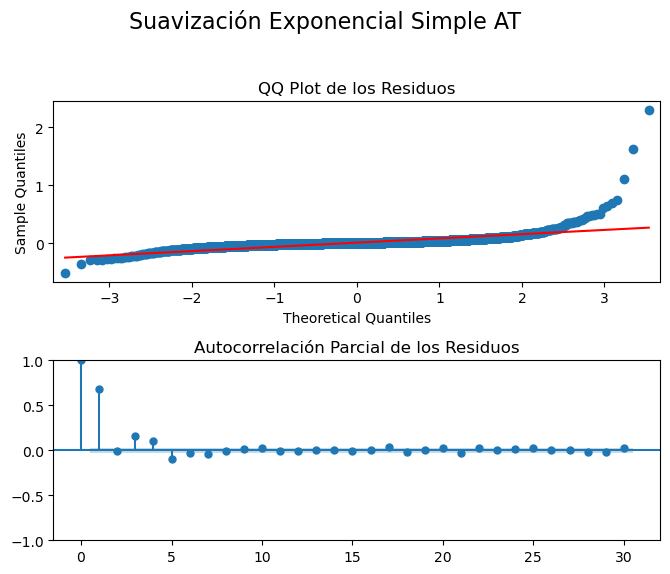

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [214]:
at_smooth1_train = firstsmooth(y=A_t_train_ts7, lambda_= at_mejor_lambda)
A_t_metrica_SES_train = plot_residual_train('Suavización Exponencial Simple AT','SES', A_t_train_ts7, at_smooth1_train)

In [215]:
A_t_metrica_SES_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value
SES Train,26.9637,0.38%,0.03,0.01,99.99%,0.0,0.0


En términos generales, el rendimiento del modelo de suavización exponencial simple (SES) es prometedor, como lo demuestran el bajo MAPE y el alto R², aunque esta última métrica no es completamente adecuada para el análisis de series temporales. Sin embargo, los valores de SSE y MSD sugieren que hay oportunidades para mejorar la precisión del modelo. Además, los análisis de residuos indican la presencia de patrones que no han sido capturados de manera efectiva. Por lo tanto, es posible que los datos de validación y prueba no se ajusten adecuadamente, lo que limita la capacidad del modelo para generalizar de manera óptima.

* **Ventana de 7 días ($\omega = 7)$**

In [216]:
at_smooth1_val7 = firstsmooth(y=A_t_val_ts7, lambda_= at_mejor_lambda)
at_smooth1_test7 = firstsmooth(y=A_t_test_ts7, lambda_= at_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para  la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-100 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -100: extraerá todos los elementos desde la posición -100 hasta el final de la serie.

In [217]:
plot_model(A_t_train_ts7[-100:], A_t_val_ts7, A_t_test_ts7, at_smooth1_val7, at_smooth1_test7, 'Suavización Exponencial Simple Ventana de 7 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [218]:
at_ljung_box_pval7, at_jarque_bera_pval7 = evaluate_residuals(A_t_test_ts7, at_smooth1_test7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [219]:
A_t_metrica_SE_test7 = metricas(A_t_test_ts7,at_smooth1_test7)
A_t_metrica_SE_test7.index = A_t_metrica_SE_test7.index.map({0: 'SES Prueba A_t (τ = 7)'})
A_t_metrica_SE_test7['Ljung-Box p-value'] = pd.Series([at_ljung_box_pval7], index=A_t_metrica_SE_test7.index)
A_t_metrica_SE_test7['Jarque-Bera p-value'] = pd.Series([at_jarque_bera_pval7], index=A_t_metrica_SE_test7.index)
A_t_metrica_SE_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba A_t (τ = 7),0.0079,0.12%,0.03,0.0,48.18%,0.0516,0.7231


* **Ventana de 14 días ($\omega = 14)$**

In [220]:
at_smooth1_val14 = firstsmooth(y=A_t_val_ts14, lambda_=at_mejor_lambda)
at_smooth1_test14 = firstsmooth(y=A_t_test_ts14, lambda_=at_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-100 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -100: extraerá todos los elementos desde la posición -100 hasta el final de la serie.

In [221]:
plot_model(A_t_train_ts14[-100:], A_t_val_ts14, A_t_test_ts14, at_smooth1_val14, at_smooth1_test14, 'Suavización Exponencial Simple Ventana de 14 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [222]:
at_ljung_box_pval14, at_jarque_bera_pval14 = evaluate_residuals(A_t_test_ts14, at_smooth1_test14)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [223]:
A_t_metrica_SE_test14 = metricas(A_t_test_ts14,at_smooth1_test14)
A_t_metrica_SE_test14.index = A_t_metrica_SE_test14.index.map({0: 'SES Prueba AT (τ = 14)'})
A_t_metrica_SE_test14['Ljung-Box p-value'] = pd.Series([at_ljung_box_pval14], index=A_t_metrica_SE_test14.index)
A_t_metrica_SE_test14['Jarque-Bera p-value'] = pd.Series([at_ljung_box_pval14], index=A_t_metrica_SE_test14.index)
A_t_metrica_SE_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba AT (τ = 14),0.0019,0.04%,0.01,0.0,41.18%,0.0601,0.0601


* **Ventana de 21 días ($\omega = 21)$**

In [224]:
at_smooth1_val21 = firstsmooth(y=A_t_val_ts21, lambda_=at_mejor_lambda)
at_smooth1_test21 = firstsmooth(y=A_t_test_ts21, lambda_=at_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [225]:
plot_model(A_t_train_ts21[-200:], A_t_val_ts21, A_t_test_ts21, at_smooth1_val21, at_smooth1_test21, 'Suavización Exponencial Simple Ventana de 21 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [226]:
at_ljung_box_pval21, at_jarque_bera_pval21 = evaluate_residuals(A_t_test_ts21, at_smooth1_test21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [227]:
A_t_metrica_SE_test21 = metricas(A_t_test_ts21, at_smooth1_test21)
A_t_metrica_SE_test21.index = A_t_metrica_SE_test21.index.map({0: 'SES Prueba AT (τ = 21)'})
A_t_metrica_SE_test21['Ljung-Box p-value'] = pd.Series([at_ljung_box_pval21], index=A_t_metrica_SE_test21.index)
A_t_metrica_SE_test21['Jarque-Bera p-value'] = pd.Series([at_ljung_box_pval21], index=A_t_metrica_SE_test21.index)
A_t_metrica_SE_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba AT (τ = 21),0.0392,0.14%,0.03,0.0,86.77%,0.0035,0.0035


* **Ventana de 28 días ($\omega = 28)$**

In [228]:
at_smooth1_val28 = firstsmooth(y=A_t_val_ts28, lambda_=at_mejor_lambda)
at_smooth1_test28 = firstsmooth(y=A_t_test_ts28, lambda_=at_mejor_lambda)


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [229]:
plot_model(A_t_train_ts28[-200:], A_t_val_ts28, A_t_test_ts28, at_smooth1_val28, at_smooth1_test28, 'Suavización Exponencial Simple Ventana de 28 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [230]:
at_ljung_box_pval28, at_jarque_bera_pval28 = evaluate_residuals(A_t_test_ts28, at_smooth1_test28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [231]:
A_t_metrica_SE_test28 = metricas(A_t_test_ts28, at_smooth1_test28)
A_t_metrica_SE_test28.index = A_t_metrica_SE_test28.index.map({0: 'SES Prueba AT (τ = 28)'})
A_t_metrica_SE_test28['Ljung-Box p-value'] = pd.Series([at_ljung_box_pval28], index=A_t_metrica_SE_test28.index)
A_t_metrica_SE_test28['Jarque-Bera p-value'] = pd.Series([at_ljung_box_pval28], index=A_t_metrica_SE_test28.index)
A_t_metrica_SE_test28


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba AT (τ = 28),0.0402,0.13%,0.03,0.0,70.73%,0.0091,0.0091


#### <font color="#30143">Simple Exponential Smoothing (Usando statsmodels.tsa.holtwinters)</font> 

La función `ses_optimizer()` permite la optimización del modelo, ya que, ayudará a determinar el parámetro óptimo $\alpha$ para conseguir el modelo que reduzca al mínimo la métrica `MAE`.

In [232]:
def ses_optimizer(train, val, alphas, step):

    best_alpha, best_mae = None, float("inf")

    for alpha in alphas:
        ses_model = SimpleExpSmoothing(train).fit(smoothing_level=alpha, optimized=False)
        y_pred = ses_model.forecast(step)
        mae = mean_absolute_error(val, y_pred)

        if mae < best_mae:
            best_alpha, best_mae = alpha, mae

    return best_alpha, best_mae

In [233]:
def ses_model_tuning(train, val, test, step, title="Model Tuning - Suavización Exponencial Simple"):
    alphas = np.arange(0.8, 1, 0.01)
    best_alpha, best_mae = ses_optimizer(train, val, alphas, step=step)
    
    train_val = pd.concat([train, val])
    final_model = SimpleExpSmoothing(train_val).fit(smoothing_level=best_alpha, optimized=False)

    y_pred_val = final_model.forecast(step)  # Predicciones en validación
    y_pred_test = final_model.forecast(len(test))  # Predicciones en test
    
    mae_val = mean_absolute_error(val, y_pred_val)

    plot_model(train, val, test, y_pred_val, y_pred_test, title)

    return y_pred_val, y_pred_test

In [234]:
def ses_model_tuning_train(train, val, test, step, title="Model Tuning - Suavización Exponencial Simple"):
    alphas = np.arange(0.8, 1, 0.01)
    best_alpha, best_mae = ses_optimizer(train, val, alphas, step=step)
    
    train_val = pd.concat([train, val])
    final_model = SimpleExpSmoothing(train_val).fit(smoothing_level=best_alpha, optimized=False)

    y_pred_val = final_model.forecast(step)  # Predicciones en validación
    y_pred_test = final_model.forecast(len(test))  # Predicciones en test
    
    mae_val = mean_absolute_error(val, y_pred_val)
    
    return y_pred_val, y_pred_test

* Análisis de residuos conjunto de entrenamiento: 

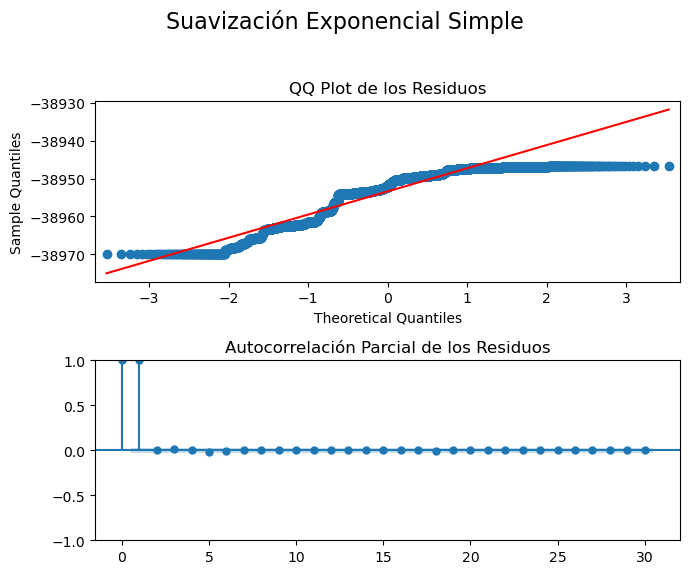

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [235]:
A_t_predicciones, A_t_y_pred_HW1_val_7 = ses_model_tuning_train(A_t_train_ts7[-200:], A_t_train_ts7, A_t_val_ts7, step=len(A_t_train_ts7))
A_t_y_pred_HW1_val_7 = pd.Series(A_t_predicciones.mean(), index=A_t_train_ts7.index[-1:])  # Esto crea una serie con la media y un índice
A_t_y_pred_HW1_val_7 = pd.Series([A_t_predicciones.mean()] * len(A_t_train_ts7), index=A_t_train_ts7.index)
A_t_y_pred_HW1_val_7 = pd.DataFrame(A_t_y_pred_HW1_val_7, columns=['Predicciones'])
A_t_metrica_HW1_train = plot_residual_train('Suavización Exponencial Simple','SES HW' , A_t_train_ts7, y_pred_HW1_train_7)

* **Ventana de 7 días ($\omega = 7)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [236]:
A_t_y_pred_HW1_val_7, A_t_y_pred_HW1_test_7 = ses_model_tuning(A_t_train_ts7[-200:], A_t_val_ts7, A_t_test_ts7, step=len(A_t_val_ts7))

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [237]:
A_t_ljung_box_pval_hw7, A_t_jarque_bera_pval_hw7 = evaluate_residuals(A_t_test_ts7, A_t_y_pred_HW1_test_7)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [238]:
A_t_metrica_SE_HW_test7 = metricas(A_t_test_ts7,A_t_y_pred_HW1_test_7)
A_t_metrica_SE_HW_test7.index = A_t_metrica_SE_HW_test7.index.map({0: 'SES HW Prueba AT (τ = 7)'})
A_t_metrica_SE_HW_test7['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_hw7], index=A_t_metrica_SE_HW_test7.index)
A_t_metrica_SE_HW_test7['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_hw7], index=A_t_metrica_SE_HW_test7.index)
A_t_metrica_SE_HW_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba AT (τ = 7),0.0453,0.28%,0.07,0.01,-197.53%,0.0393,0.6975


* **Ventana de 14 días ($\omega = 14)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 14 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [239]:
A_t_y_pred_HW1_val_14, A_t_y_pred_HW1_test_14 = ses_model_tuning(A_t_train_ts14[-200:], A_t_val_ts14, A_t_test_ts14, step=len(A_t_val_ts14))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [240]:
A_t_ljung_box_pval_hw14, A_t_jarque_bera_pval_hw14 = evaluate_residuals(A_t_test_ts14, A_t_y_pred_HW1_test_14)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [241]:
A_t_metrica_SE_HW_test14 = metricas(A_t_test_ts14, A_t_y_pred_HW1_test_14)
A_t_metrica_SE_HW_test14.index = A_t_metrica_SE_HW_test14.index.map({0: 'SES HW Prueba AT (τ = 14)'})
A_t_metrica_SE_HW_test14['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_hw14], index=A_t_metrica_SE_HW_test14.index)
A_t_metrica_SE_HW_test14['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_hw14], index=A_t_metrica_SE_HW_test14.index)
A_t_metrica_SE_HW_test14


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba AT (τ = 14),0.0647,0.28%,0.07,0.0,-1898.46%,0.0676,0.1145


* **Ventana de 21 días ($\omega = 21)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 21 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [242]:
A_t_y_pred_HW1_val_21, A_t_y_pred_HW1_test_21 = ses_model_tuning(A_t_train_ts21[-200:], A_t_val_ts21, A_t_test_ts21, step=len(A_t_val_ts21))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [243]:
A_t_ljung_box_pval_hw21, A_t_jarque_bera_pval_hw21 = evaluate_residuals(A_t_test_ts21, A_t_y_pred_HW1_test_21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [244]:
A_t_metrica_SE_HW_test21 = metricas(A_t_test_ts21, A_t_y_pred_HW1_test_21)
A_t_metrica_SE_HW_test21.index = A_t_metrica_SE_HW_test21.index.map({0: 'SES HW Prueba AT (τ = 21)'})
A_t_metrica_SE_HW_test21['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_hw21], index=A_t_metrica_SE_HW_test21.index)
A_t_metrica_SE_HW_test21['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_hw21], index=A_t_metrica_SE_HW_test21.index)
A_t_metrica_SE_HW_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba AT (τ = 21),0.6919,0.61%,0.14,0.03,-133.29%,1.6996e-05,0.3112


* **Ventana de 28 días ($\omega = 28)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 28 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [245]:
A_t_y_pred_HW1_val_28, A_t_y_pred_HW1_test_28 = ses_model_tuning(A_t_train_ts28[-200:], A_t_val_ts28, A_t_test_ts28, step=len(A_t_val_ts28))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [246]:
A_t_ljung_box_pval_hw28, A_t_jarque_bera_pval_hw28 = evaluate_residuals(A_t_test_ts28, A_t_y_pred_HW1_test_28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [247]:
A_t_metrica_SE_HW_test28 = metricas(A_t_test_ts28, A_t_y_pred_HW1_test_28)
A_t_metrica_SE_HW_test28.index = A_t_metrica_SE_HW_test28.index.map({0: 'SES HW Prueba AT (τ = 28)'})
A_t_metrica_SE_HW_test28['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_hw28], index=A_t_metrica_SE_HW_test28.index)
A_t_metrica_SE_HW_test28['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_hw28], index=A_t_metrica_SE_HW_test28.index)
A_t_metrica_SE_HW_test28


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba AT (τ = 28),1.9407,1.07%,0.25,0.07,-1313.9%,0.0003,0.0855


#### <font color="#30143">Double Exponential Smoothing (Sin Librería)</font> 

* Análisis de residuos conjunto de entrenamiento: 

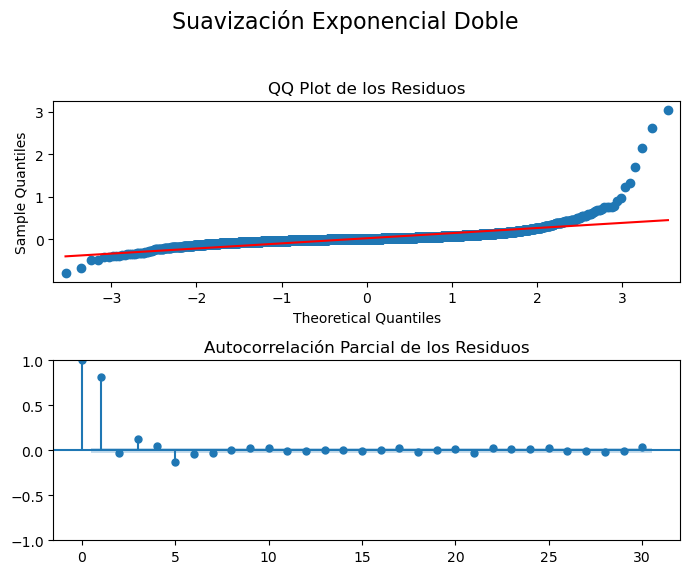

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [248]:
A_t_smooth2_train = firstsmooth(y=at_smooth1_train, lambda_=at_mejor_lambda)
A_t_metrica_DES_train = plot_residual_train('Suavización Exponencial Doble','DES', A_t_train_ts7, A_t_smooth2_train)

A continuación se realizan las predicciones para el modelo de suavización exponencial doble sin usar librería: 

* **Ventana de 7 días ($\omega = 7)$**

In [249]:
A_t_smooth2_val7 = firstsmooth(y=at_smooth1_val7, lambda_=at_mejor_lambda)
A_t_smooth2_test7 = firstsmooth(y=at_smooth1_test7, lambda_=at_mejor_lambda)

A_t_y_hatDES_val7 = 2 * at_smooth1_val7 - A_t_smooth2_val7
A_t_y_hatDES_test7 = 2 * at_smooth1_test7 - A_t_smooth2_test7

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [250]:
plot_model(A_t_train_ts7[-200:], A_t_val_ts7, A_t_test_ts7, A_t_y_hatDES_val7, A_t_y_hatDES_test7, 'Suavización Exponencial Doble Ventana de 7 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [251]:
A_t_ljung_box_pval_des7, A_t_jarque_bera_pval_des7 = evaluate_residuals(A_t_test_ts7, A_t_y_hatDES_test7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [252]:
A_t_metrica_DES_test7 = metricas(A_t_test_ts7,A_t_y_hatDES_test7)
A_t_metrica_DES_test7.index = A_t_metrica_DES_test7.index.map({0: 'DES Prueba AT (τ = 7)'})
A_t_metrica_DES_test7['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_des7], index=A_t_metrica_DES_test7.index)
A_t_metrica_DES_test7['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_des7], index=A_t_metrica_DES_test7.index)
A_t_metrica_DES_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba AT (τ = 7),0.0014,0.05%,0.01,0.0,91.11%,0.2732,0.8196


* **Ventana de 14 días ($\omega = 14)$**

In [253]:
A_t_smooth2_val14 = firstsmooth(y=at_smooth1_val14, lambda_=at_mejor_lambda)
A_t_smooth2_test14 = firstsmooth(y=at_smooth1_test14, lambda_=at_mejor_lambda)

A_t_y_hatDES_val14 = 2 * at_smooth1_val14 - A_t_smooth2_val14
A_t_y_hatDES_test14 = 2 * at_smooth1_test14 - A_t_smooth2_test14


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [254]:
plot_model(A_t_train_ts14[-200:], A_t_val_ts14, A_t_test_ts14, A_t_y_hatDES_val14, A_t_y_hatDES_test14, 'Suavización Exponencial Doble Ventana de 14 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [255]:
A_t_ljung_box_pval_des14, A_t_jarque_bera_pval_des14 = evaluate_residuals(A_t_test_ts14, A_t_y_hatDES_test14)


No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [256]:
A_t_metrica_DES_test14 = metricas(A_t_test_ts14, A_t_y_hatDES_test14)
A_t_metrica_DES_test14.index = A_t_metrica_DES_test14.index.map({0: 'DES Prueba AT (τ = 14)'})
A_t_metrica_DES_test14['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_des14], index=A_t_metrica_DES_test14.index)
A_t_metrica_DES_test14['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_des14], index=A_t_metrica_DES_test14.index)
A_t_metrica_DES_test14


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba AT (τ = 14),0.0008,0.02%,0.01,0.0,75.65%,0.1477,0.2715


* **Ventana de 21 días ($\omega = 21)$**

In [257]:
A_t_smooth2_val21 = firstsmooth(y=at_smooth1_val21, lambda_=at_mejor_lambda)
A_t_smooth2_test21 = firstsmooth(y=at_smooth1_test21, lambda_=at_mejor_lambda)

A_t_y_hatDES_val21 = 2 * at_smooth1_val21 - A_t_smooth2_val21
A_t_y_hatDES_test21 = 2 * at_smooth1_test21 - A_t_smooth2_test21


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [258]:
plot_model(A_t_train_ts21[-200:], A_t_val_ts21, A_t_test_ts21, A_t_y_hatDES_val21, A_t_y_hatDES_test21, 'Suavización Exponencial Doble Ventana de 21 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [259]:
A_t_ljung_box_pval_des21, A_t_jarque_bera_pval_des21 = evaluate_residuals(A_t_test_ts21, A_t_y_hatDES_test21)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [260]:
A_t_metrica_DES_test21 = metricas(A_t_test_ts21, A_t_y_hatDES_test21)
A_t_metrica_DES_test21.index = A_t_metrica_DES_test21.index.map({0: 'DES Prueba AT (τ = 21)'})
A_t_metrica_DES_test21['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_des21], index=A_t_metrica_DES_test21.index)
A_t_metrica_DES_test21['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_des21], index=A_t_metrica_DES_test21.index)
A_t_metrica_DES_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba AT (τ = 21),0.0077,0.05%,0.01,0.0,97.39%,0.0751,0.0332


* **Ventana de 28 días ($\omega = 28)$**

In [261]:
A_t_smooth2_val28 = firstsmooth(y=at_smooth1_val28, lambda_=at_mejor_lambda)
A_t_smooth2_test28 = firstsmooth(y=at_smooth1_test28, lambda_=at_mejor_lambda)

A_t_y_hatDES_val28 = 2 * at_smooth1_val28 - A_t_smooth2_val28
A_t_y_hatDES_test28 = 2 * at_smooth1_test28 - A_t_smooth2_test28



Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [262]:
plot_model(A_t_train_ts28[-200:], A_t_val_ts28, A_t_test_ts28, A_t_y_hatDES_val28, A_t_y_hatDES_test28, 'Suavización Exponencial Doble Ventana de 28 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [263]:
A_t_ljung_box_pval_des28, A_t_jarque_bera_pval_des28 = evaluate_residuals(A_t_test_ts28, A_t_y_hatDES_test28)


No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [264]:
A_t_metrica_DES_test28 = metricas(A_t_test_ts28, A_t_y_hatDES_test28)
A_t_metrica_DES_test28.index = A_t_metrica_DES_test28.index.map({0: 'DES Prueba AT (τ = 28)'})
A_t_metrica_DES_test28['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_des28], index=A_t_metrica_DES_test28.index)
A_t_metrica_DES_test28['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_des28], index=A_t_metrica_DES_test28.index)
A_t_metrica_DES_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba AT (τ = 28),0.0125,0.06%,0.01,0.0,90.88%,0.5112,0.6471


#### <font color="#30143">Double Exponential Smoothing (Usando statsmodels.tsa.holtwinters)</font> 

La función `des_optimizer()` permite la optimización del modelo, ya que, ayudará a determinar el parámetro óptimo $\alpha$ y $\beta$ para conseguir el modelo que reduzca al mínimo la métrica `MAE`.

**ExponentialSmoothing(train, trend=trend)**: Inicializa un modelo de suavización exponencial, utilizando la serie temporal de entrenamiento train y el tipo de tendencia `(lineal o exponencial)` especificado en el parámetro `trend`.

**.fit(smoothing_level=alpha, smoothing_slope=beta)**: Ajusta el modelo a los datos de entrenamiento. Los parámetros `smoothing_level` y `smoothing_slope` determinan el `grado de suavizado` de la serie temporal y de la `tendencia`, respectivamente, tomando como valores los parámetros `alpha` y `beta`.

In [265]:
def des_optimizer(train, val, alphas, betas, trend, step):

    best_alpha, best_beta, best_mae = None, None, float("inf")

    for alpha in alphas:
        for beta in betas:
            des_model = ExponentialSmoothing(train, trend=trend).fit(smoothing_level=alpha, smoothing_slope=beta)
            y_pred = des_model.forecast(step)
            mae = mean_absolute_error(val, y_pred)
            if mae < best_mae:
                best_alpha, best_beta, best_mae = alpha, beta, mae

    return best_alpha, best_beta, best_mae

In [266]:
def des_model_tuning(train, val, test, step_val, step_test, trend, title="Model Tuning - Double Exponential Smoothing"):
    alphas = np.arange(0.01, 1, 0.1)
    betas = np.arange(0.01, 1, 0.1)
    
    best_alpha, best_beta, best_mae = des_optimizer(train, val, alphas, betas, trend=trend, step=step_val)

    train_val = pd.concat([train, val])
    final_model = ExponentialSmoothing(train_val, trend=trend).fit(smoothing_level=best_alpha, smoothing_slope=best_beta)

    # Predicciones para validación y test
    y_pred_val = final_model.forecast(step_val)  # Predicciones para validación
    y_pred_test = final_model.forecast(step_test)  # Predicciones para test

    y_pred_val.index = val.index
    y_pred_test.index = test.index

    plot_model(train, val, test, y_pred_val, y_pred_test, title)

    return y_pred_val, y_pred_test

In [267]:
def des_model_tuning_train(train, val, test, step_val, step_test, trend, title="Model Tuning - Double Exponential Smoothing"):
    alphas = np.arange(0.01, 1, 0.1)
    betas = np.arange(0.01, 1, 0.1)
    
    best_alpha, best_beta, best_mae = des_optimizer(train, val, alphas, betas, trend=trend, step=step_val)

    train_val = pd.concat([train, val])
    final_model = ExponentialSmoothing(train_val, trend=trend).fit(smoothing_level=best_alpha, smoothing_slope=best_beta)

    # Predicciones para validación y test
    y_pred_val = final_model.forecast(step_val)  # Predicciones para validación
    y_pred_test = final_model.forecast(step_test)  # Predicciones para test

    y_pred_val.index = val.index
    y_pred_test.index = test.index

    return y_pred_val, y_pred_test

* Análisis de residuos conjunto de entrenamiento: 

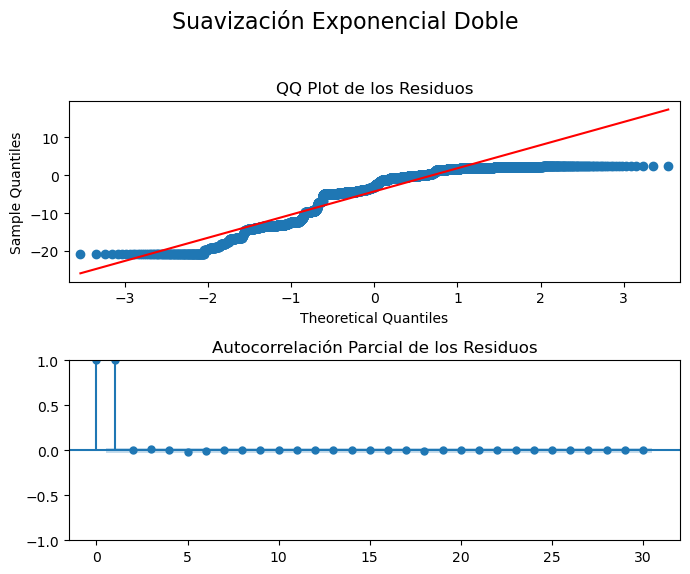

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [268]:
A_t_predicciones, A_t_y_pred_HW2_val_7 = des_model_tuning_train(A_t_train_ts7[-200:], A_t_train_ts7, A_t_val_ts7, step_val=len(A_t_train_ts7), step_test=len(A_t_val_ts7), trend='add')
A_t_y_pred_HW1_train_7 = pd.Series(A_t_predicciones.mean(), index=A_t_train_ts7.index[-1:])  # Esto crea una serie con la media y un índice
A_t_y_pred_HW1_train_7 = pd.Series([A_t_predicciones.mean()] * len(A_t_train_ts7), index=A_t_train_ts7.index)
A_t_y_pred_HW1_train_7_df = pd.DataFrame(A_t_y_pred_HW1_train_7, columns=['A_t_Predicciones'])

A_t_metrica_HW2_train =plot_residual_train('Suavización Exponencial Doble','DES HW' , A_t_train_ts7, A_t_y_pred_HW1_train_7)

A continuación se realizan las predicciones para el modelo de suavización exponencial Holt-Winters: 

* **Ventana de 7 días ($\omega = 7)$**

In [269]:
A_t_y_pred_HW2_val_7, A_t_y_pred_HW2_test_7  = des_model_tuning(A_t_train_ts7[-200:], A_t_val_ts7, A_t_test_ts7, step_val=A_t_tau_val7, step_test=A_t_tau_test7, trend='add')

In [270]:
A_t_metrica_DES_HW_val7 = metricas(A_t_val_ts7,A_t_y_pred_HW2_val_7)
A_t_metrica_DES_HW_val7.index = A_t_metrica_DES_HW_val7.index.map({0: 'DES HW Val TA (τ = 7)'})
A_t_metrica_DES_HW_val7

,SSE,MAPE,MAD,MSD,R2
DES HW Val TA (τ = 7),0.0026,0.08%,0.02,0.0,-899.88%


In [271]:
A_t_metrica_DES_HW_test7 = metricas(A_t_test_ts7,A_t_y_pred_HW2_test_7)
A_t_metrica_DES_HW_test7.index = A_t_metrica_DES_HW_test7.index.map({0: 'DES HW Prueba TA (τ = 7)'})
A_t_metrica_DES_HW_test7

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba TA (τ = 7),0.0584,0.33%,0.08,0.01,-284.08%


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [272]:
A_t_ljung_box_pval_des_hw7, A_t_jarque_bera_pval_des_hw7 = evaluate_residuals(A_t_test_ts7, A_t_y_pred_HW2_test_7)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [273]:
A_t_metrica_DES_HW_test7['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_des_hw7], index=A_t_metrica_DES_HW_test7.index)
A_t_metrica_DES_HW_test7['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_des_hw7], index=A_t_metrica_DES_HW_test7.index)
A_t_metrica_DES_HW_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba TA (τ = 7),0.0584,0.33%,0.08,0.01,-284.08%,0.0406,0.7041


* **Ventana de 14 días ($\omega = 14)$**

In [274]:
A_t_y_pred_HW2_val_14, A_t_y_pred_HW2_test_14 = des_model_tuning(A_t_train_ts14[-200:], A_t_val_ts14, A_t_test_ts14, step_val=A_t_tau_val14, step_test=A_t_tau_test14, trend='add')


In [275]:
A_t_metrica_DES_HW_val14 = metricas(A_t_val_ts14, A_t_y_pred_HW2_val_14)
A_t_metrica_DES_HW_val14.index = A_t_metrica_DES_HW_val14.index.map({0: 'DES HW Val TA (τ = 14)'})
A_t_metrica_DES_HW_val14


,SSE,MAPE,MAD,MSD,R2
DES HW Val TA (τ = 14),0.8046,1.01%,0.23,0.06,-2866.86%


In [276]:
A_t_metrica_DES_HW_test14 = metricas(A_t_test_ts14, A_t_y_pred_HW2_test_14)
A_t_metrica_DES_HW_test14.index = A_t_metrica_DES_HW_test14.index.map({0: 'DES HW Prueba TA (τ = 14)'})
A_t_metrica_DES_HW_test14


,SSE,MAPE,MAD,MSD,R2
DES HW Prueba TA (τ = 14),0.1694,0.36%,0.08,0.01,-5134.96%


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [277]:
A_t_ljung_box_pval_des_hw14, A_t_jarque_bera_pval_des_hw14 = evaluate_residuals(A_t_test_ts14, A_t_y_pred_HW2_test_14)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [278]:
A_t_metrica_DES_HW_test14['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_des_hw14], index=A_t_metrica_DES_HW_test14.index)
A_t_metrica_DES_HW_test14['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_des_hw14], index=A_t_metrica_DES_HW_test14.index)
A_t_metrica_DES_HW_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba TA (τ = 14),0.1694,0.36%,0.08,0.01,-5134.96%,0.0008,0.5454


* **Ventana de 21 días ($\omega = 21)$**

In [279]:
A_t_y_pred_HW2_val_21, A_t_y_pred_HW2_test_21 = des_model_tuning(A_t_train_ts21[-200:], A_t_val_ts21, A_t_test_ts21, step_val=A_t_tau_val21, step_test=A_t_tau_test21, trend='add')



In [280]:
A_t_metrica_DES_HW_val21 = metricas(A_t_val_ts21, A_t_y_pred_HW2_val_21)
A_t_metrica_DES_HW_val21.index = A_t_metrica_DES_HW_val21.index.map({0: 'DES HW Val TA (τ = 21)'})
A_t_metrica_DES_HW_val21


,SSE,MAPE,MAD,MSD,R2
DES HW Val TA (τ = 21),1.8048,1.25%,0.29,0.09,-1214.48%


In [281]:
A_t_metrica_DES_HW_test21 = metricas(A_t_test_ts21, A_t_y_pred_HW2_test_21)
A_t_metrica_DES_HW_test21.index = A_t_metrica_DES_HW_test21.index.map({0: 'DES HW Prueba TA (τ = 21)'})
A_t_metrica_DES_HW_test21

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba TA (τ = 21),0.0927,0.21%,0.05,0.0,68.73%


A continuación realizamos un análisis sobre los residuales de nuestro conjunto de prueba (test)

In [282]:
A_t_ljung_box_pval_des_hw21, A_t_jarque_bera_pval_des_hw21 = evaluate_residuals(A_t_test_ts21, A_t_y_pred_HW2_test_21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [283]:
A_t_metrica_DES_HW_test21['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_des_hw21], index=A_t_metrica_DES_HW_test21.index)
A_t_metrica_DES_HW_test21['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_des_hw21], index=A_t_metrica_DES_HW_test21.index)
A_t_metrica_DES_HW_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba TA (τ = 21),0.0927,0.21%,0.05,0.0,68.73%,0.0001,0.5087


* **Ventana de 28 días ($\omega = 28)$**

In [284]:
A_t_y_pred_HW2_val_28, A_t_y_pred_HW2_test_28 = des_model_tuning(A_t_train_ts28[-200:], A_t_val_ts28, A_t_test_ts28, step_val=A_t_tau_val28, step_test=A_t_tau_test28, trend='add')



In [285]:
A_t_metrica_DES_HW_val28 = metricas(A_t_val_ts28, A_t_y_pred_HW2_val_28)
A_t_metrica_DES_HW_val28.index = A_t_metrica_DES_HW_val28.index.map({0: 'DES HW Val TA (τ = 28)'})
A_t_metrica_DES_HW_val28


,SSE,MAPE,MAD,MSD,R2
DES HW Val TA (τ = 28),0.5002,0.5%,0.12,0.02,-152.02%


In [286]:
A_t_metrica_DES_HW_test28 = metricas(A_t_test_ts28, A_t_y_pred_HW2_test_28)
A_t_metrica_DES_HW_test28.index = A_t_metrica_DES_HW_test28.index.map({0: 'DES HW Prueba TA (τ = 28)'})
A_t_metrica_DES_HW_test28

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba TA (τ = 28),1.4723,0.93%,0.22,0.05,-972.66%


A continuación realizamos un análisis sobre los residuales de nuestro conjunto de prueba (test)

In [287]:
A_t_ljung_box_pval_des_hw28, A_t_jarque_bera_pval_des_hw28 = evaluate_residuals(A_t_test_ts28, A_t_y_pred_HW2_test_28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [288]:
A_t_metrica_DES_HW_test28['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_des_hw28], index=A_t_metrica_DES_HW_test28.index)
A_t_metrica_DES_HW_test28['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_des_hw28], index=A_t_metrica_DES_HW_test28.index)
A_t_metrica_DES_HW_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba TA (τ = 28),1.4723,0.93%,0.22,0.05,-972.66%,0.0007,0.332


#### <font color="#30143">ARIMA (Usando Rolling)</font> 

A continuación se define función de ajuste del modelo y predicciones ARIMA.

In [289]:
def arima_model_fit(train):
    """
    Ajusta un modelo ARIMA a los datos de entrenamiento y selecciona el mejor modelo basado en el AIC.
    La función recibe los conjuntos de datos `train` y `val`.

    :param train: Conjunto de datos de entrenamiento (serie temporal).
    :param val: Conjunto de datos de validación (opcional, para verificar el rendimiento del modelo).
    :return: El modelo ajustado, el mejor AIC, el mejor orden (p, d, q) y los datos de entrenamiento.
    """
    model_filename = 'A_t_best_arima_model.pkl'
    
    # Si el mejor modelo ya existe, cargarlo y evitar volver a ejecutar el ciclo for
    if os.path.exists(model_filename):
        print(f"Mejor modelo ya existe. Cargando desde {model_filename}.")
        with open(model_filename, 'rb') as f:
            best_model_global = pickle.load(f)
        return best_model_global, None, None

    # Inicializamos el mejor AIC y BIC en infinito
    best_aic = np.inf
    best_bic = np.inf
    best_order = None
    best_mdl = None
   
    # Rango de p, d, q para probar diferentes combinaciones
    pq_rng = range(3)  # Esto es para p y q (máximo 2)
    d_rng  = range(2)  # Esto es para d (máximo 1)

    # Iterar sobre los valores posibles de p, d y q
    for p in pq_rng:
        for d in d_rng:
            for q in pq_rng:
                try:
                    # Ajustar el modelo ARIMA para los valores de p, d, q
                    tmp_mdl = ARIMA(train, order=(p, d, q)).fit()
                    tmp_aic = tmp_mdl.aic  # Obtener el AIC del modelo ajustado
                    
                    # Si el AIC actual es mejor, actualizar los mejores valores
                    if tmp_aic < best_aic:
                        best_aic = tmp_aic
                        best_order = (p, d, q)
                        best_mdl = tmp_mdl
                except Exception as e:
                    print(f"Error ajustando ARIMA({p},{d},{q}): {e}")
                    continue  # Si hay un error, continuar con el siguiente intento

    # Imprimir los resultados del mejor modelo encontrado
    print(f"\nMejor modelo ARIMA:")
    print(f'Best AIC: {best_aic}')
    print(f'Best Order: {best_order}')
    print(f'aic: {best_aic:6.5f} | order: {best_order}')

    # Ajustar el modelo ARIMA final con el mejor orden
    model = ARIMA(train, order=best_order)
    model_fit = model.fit()

    # Guardar el mejor modelo en un archivo con pickle
    with open('A_t_best_arima_model.pkl', 'wb') as f:
        pickle.dump(best_mdl, f)
    print(f"\nMejor modelo ARIMA guardado con AIC {best_aic}")

    # Retornar el modelo ajustado, el mejor AIC y el mejor orden
    return model_fit, best_aic, best_order

A continuación se define la función `arima_rolling()`

In [290]:
def arima_rolling(history, val, best_order): # arima_rolling(train.tolist(), val, test_nd, best_order)
    
    predictions = list()
    for t in range(len(val)):
        model = ARIMA(history, order=best_order)
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = val[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat, obs))
        
    return predictions

La siguiente función devuelve los parámetros `p`, `d`, `q` que definen `el mejor modelo ARIMA` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste. Además, proporciona los resultados del modelo `ARIMA ajustado` para `datos de entrenamiento`, incluyendo las `fechas` correspondientes. También incluye los datos y fechas del modelo `ARIMA de prueba`, aunque estos últimos dos no son directamente visibles en la salida de la función.


Indexación de parámetros para la función `arima_model_fit()`

In [291]:
A_t_model_fit, A_t_best_aic, A_t_best_order = arima_model_fit(A_t_train_ts7)
A_t_best_order = A_t_model_fit.model.order


Mejor modelo ARIMA:
Best AIC: -11456.735879164371
Best Order: (2, 1, 2)
aic: -11456.73588 | order: (2, 1, 2)

Mejor modelo ARIMA guardado con AIC -11456.735879164371


In [292]:
print(A_t_best_order)

(2, 1, 2)


A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

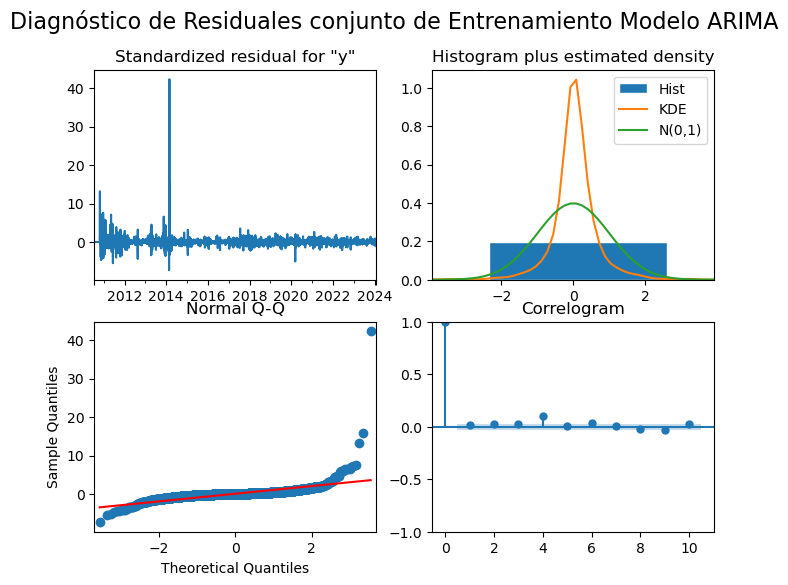

In [293]:
A_t_model_fit.plot_diagnostics(figsize=(8, 6))
plt.suptitle('Diagnóstico de Residuales conjunto de Entrenamiento Modelo ARIMA', fontsize=16)
plt.show()

In [294]:
A_t_residuos_train_arima = A_t_model_fit.resid
A_t_ljung_box_pval_arima_train, A_t_jarque_bera_pval_arima_train = evaluate_residuals_train_arima(A_t_residuos_train_arima)

Ljung-Box LB Statistic: 1.143332
Ljung-Box p-value: 0.284949
No se rechaza H0: los residuales son independientes (no correlacionados).
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [295]:
# Extraer predicciones para todo el conjunto de entrenamiento sin estandarizar 
A_t_predicciones = A_t_model_fit.get_prediction(start=0, end=len(A_t_train_ts7)-1, dynamic=False)
A_t_yhat_arima_train = A_t_predicciones.predicted_mean

A_t_yhat_arima_train.index = A_t_train_ts7.index # yhat_arima_train mismo índice que price_train_ts7

#calcular las métricas 
A_t_metrica_arima_train = metricas(A_t_train_ts7,A_t_yhat_arima_train)
A_t_metrica_arima_train.index = A_t_metrica_arima_train.index.map({0: 'Arima Entrenamiento AT'})
A_t_metrica_arima_train['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_arima_train], index=A_t_metrica_arima_train.index)
A_t_metrica_arima_train['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_arima_train], index=A_t_metrica_arima_train.index)
A_t_metrica_arima_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Entrenamiento AT,28.4278,0.35%,0.03,0.01,99.98%,0.2849,0.0


La función `arima_rolling()` devuelve las prediciones, con base a los parámetros `p`, `d`, `q` que definen `el mejor modelo ARIMA` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste, aprovechando datos históricos para pronosticar continuamente la concentración de PM10 durante un período (horizonte) específico.

A continuación se indexan los parámetros de la función `arima_rolling()` para las ventanas de 7, 14, 21 y 28 días para la predicción sobre los datos de `validación` y `prueba`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [296]:
# best_aic_arima = best_ order
A_t_val_l7 = A_t_val_ts7.tolist()
A_t_train_l7 = A_t_train_ts7.tolist()
A_t_yhat_val_arimarolling7  = arima_rolling(A_t_train_l7, A_t_val_l7, A_t_best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
A_t_yhat_val_arimarolling7 = pd.Series(A_t_yhat_val_arimarolling7, index=A_t_val_ts7.index)  # Indexa las fechas de price_val_ts7

predicted=23.209987, expected=23.240659
predicted=23.241904, expected=23.232492
predicted=23.229876, expected=23.223977
predicted=23.223773, expected=23.235741
predicted=23.237669, expected=23.238371
predicted=23.237588, expected=23.233995
predicted=23.232555, expected=23.224129


* **Predicciones datos de Prueba**: 

In [297]:
# best_aic_arima = best_ order
A_t_test_l7 = A_t_test_ts7.tolist()
A_t_train_l7 = A_t_train_ts7.tolist()
A_t_yhat_test_arimarolling7  = arima_rolling(A_t_train_l7, A_t_test_l7, A_t_best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
A_t_yhat_test_arimarolling7 = pd.Series(A_t_yhat_test_arimarolling7, index=A_t_test_ts7.index)  # Indexa las fechas de price_test_ts7

predicted=23.209987, expected=23.226848
predicted=23.228615, expected=23.235994
predicted=23.234519, expected=23.265054
predicted=23.261456, expected=23.286558
predicted=23.282001, expected=23.327054
predicted=23.323538, expected=23.340437
predicted=23.336542, expected=23.351306


In [298]:
plot_model(A_t_train_ts7[-100:], A_t_val_ts7, A_t_test_ts7, A_t_yhat_val_arimarolling7, A_t_yhat_test_arimarolling7, title="Predicciones usando ARIMA rolling ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [299]:
A_t_ljung_box_pval_arimarol7, A_t_jarque_bera_pval_arimarol7 = evaluate_residuals(A_t_test_ts7, A_t_yhat_test_arimarolling7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [300]:
A_t_metrica_arimarol_test7 = metricas(A_t_test_ts7,A_t_yhat_test_arimarolling7)
A_t_metrica_arimarol_test7.index = A_t_metrica_arimarol_test7.index.map({0: 'Arima Rolling Prueba AT (τ = 7)'})
A_t_metrica_arimarol_test7['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_arimarol7], index=A_t_metrica_arimarol_test7.index)
A_t_metrica_arimarol_test7['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_arimarol7], index=A_t_metrica_arimarol_test7.index)
A_t_metrica_arimarol_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba AT (τ = 7),0.0044,0.1%,0.02,0.0,70.85%,0.8948,0.7033


* **Ventana de 14 días ($\omega = 14)$**

* **Datos de Validación**: 

In [301]:
# best_aic_arima = best_ order
A_t_val_l14 = A_t_val_ts14.tolist()
A_t_train_l14 = A_t_train_ts14.tolist()
A_t_yhat_val_arimarolling14 = arima_rolling(A_t_train_l14, A_t_val_l14, A_t_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
A_t_yhat_val_arimarolling14 = pd.Series(A_t_yhat_val_arimarolling14, index=A_t_val_ts14.index)  # Indexa las fechas de price_val_ts14


predicted=23.209987, expected=23.240659
predicted=23.241904, expected=23.232492
predicted=23.229876, expected=23.223977
predicted=23.223773, expected=23.235741
predicted=23.237669, expected=23.238371
predicted=23.237588, expected=23.233995
predicted=23.232555, expected=23.224129
predicted=23.224999, expected=23.226848
predicted=23.228969, expected=23.235994
predicted=23.235509, expected=23.265054
predicted=23.261570, expected=23.286558
predicted=23.281498, expected=23.327054
predicted=23.323320, expected=23.340437
predicted=23.336748, expected=23.351306


* **Predicciones datos de Prueba**: 

In [302]:
# best_aic_arima = best_ order
A_t_test_l14 = A_t_test_ts14.tolist()
A_t_train_l14 = A_t_train_ts14.tolist()
A_t_yhat_test_arimarolling14 = arima_rolling(A_t_train_l14, A_t_test_l14, A_t_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
A_t_yhat_test_arimarolling14 = pd.Series(A_t_yhat_test_arimarolling14, index=A_t_test_ts14.index)  # Indexa las fechas de price_test_ts14

predicted=23.209987, expected=23.385774
predicted=23.381509, expected=23.381262
predicted=23.359684, expected=23.422826
predicted=23.417379, expected=23.425123
predicted=23.430229, expected=23.429610
predicted=23.433748, expected=23.420246
predicted=23.418573, expected=23.429375
predicted=23.427348, expected=23.422968
predicted=23.422420, expected=23.432236
predicted=23.433577, expected=23.424481
predicted=23.424406, expected=23.414110
predicted=23.414659, expected=23.402811
predicted=23.404672, expected=23.419190
predicted=23.420179, expected=23.422120


In [303]:
plot_model(A_t_train_ts14[-100:], A_t_val_ts14, A_t_test_ts14, A_t_yhat_val_arimarolling14, A_t_yhat_test_arimarolling14, title="Predicciones usando ARIMA rolling ventana de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [304]:
A_t_ljung_box_pval_arimarol14, A_t_jarque_bera_pval_arimarol14 = evaluate_residuals(A_t_test_ts14, A_t_yhat_test_arimarolling14)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [305]:
A_t_metrica_arimarol_test14 = metricas(A_t_test_ts14, A_t_yhat_test_arimarolling14)
A_t_metrica_arimarol_test14.index = A_t_metrica_arimarol_test14.index.map({0: 'Arima Rolling Prueba AT (τ = 14)'})
A_t_metrica_arimarol_test14['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_arimarol14], index=A_t_metrica_arimarol_test14.index)
A_t_metrica_arimarol_test14['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_arimarol14], index=A_t_metrica_arimarol_test14.index)
A_t_metrica_arimarol_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba AT (τ = 14),0.0359,0.1%,0.02,0.0,-1009.3%,0.8933,1.4546e-08


* **Ventana de 21 días ($\omega = 21)$**

* **Datos de Validación**: 

In [306]:
# best_aic_arima = best_ order
A_t_val_l21 = A_t_val_ts21.tolist()
A_t_train_l21 = A_t_train_ts21.tolist()
A_t_yhat_val_arimarolling21 = arima_rolling(A_t_train_l21, A_t_val_l21, A_t_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
A_t_yhat_val_arimarolling21 = pd.Series(A_t_yhat_val_arimarolling21, index=A_t_val_ts21.index)  # Indexa las fechas de price_val_ts21



predicted=23.209987, expected=23.240659
predicted=23.241904, expected=23.232492
predicted=23.229876, expected=23.223977
predicted=23.223773, expected=23.235741
predicted=23.237669, expected=23.238371
predicted=23.237588, expected=23.233995
predicted=23.232555, expected=23.224129
predicted=23.224999, expected=23.226848
predicted=23.228969, expected=23.235994
predicted=23.235509, expected=23.265054
predicted=23.261570, expected=23.286558
predicted=23.281498, expected=23.327054
predicted=23.323320, expected=23.340437
predicted=23.336748, expected=23.351306
predicted=23.350210, expected=23.385774
predicted=23.384864, expected=23.381262
predicted=23.377680, expected=23.422826
predicted=23.421178, expected=23.425123
predicted=23.421575, expected=23.429610
predicted=23.428969, expected=23.420246
predicted=23.421807, expected=23.429375


* **Predicciones datos de Prueba**: 

In [307]:
# best_aic_arima = best_ order
A_t_test_l21 = A_t_test_ts21.tolist()
A_t_train_l21 = A_t_train_ts21.tolist()
A_t_yhat_test_arimarolling21 = arima_rolling(A_t_train_l21, A_t_test_l21, A_t_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
A_t_yhat_test_arimarolling21 = pd.Series(A_t_yhat_test_arimarolling21, index=A_t_test_ts21.index)  # Indexa las fechas de price_test_ts21


predicted=23.209987, expected=23.422968
predicted=23.417277, expected=23.432236
predicted=23.405315, expected=23.424481
predicted=23.418390, expected=23.414110
predicted=23.428230, expected=23.402811
predicted=23.412201, expected=23.419190
predicted=23.415116, expected=23.422120
predicted=23.413666, expected=23.475721
predicted=23.472957, expected=23.522718
predicted=23.518368, expected=23.617562
predicted=23.608617, expected=23.596778
predicted=23.585968, expected=23.616860
predicted=23.620097, expected=23.610398
predicted=23.615183, expected=23.628808
predicted=23.628595, expected=23.710129
predicted=23.702223, expected=23.644544
predicted=23.635099, expected=23.680407
predicted=23.688148, expected=23.692134
predicted=23.695056, expected=23.711829
predicted=23.706374, expected=23.714682
predicted=23.708950, expected=23.723433


In [308]:
plot_model(A_t_train_ts21[-100:], A_t_val_ts21, A_t_test_ts21, A_t_yhat_val_arimarolling21, A_t_yhat_test_arimarolling21, title="Predicciones usando ARIMA rolling ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [309]:
A_t_ljung_box_pval_arimarol21, A_t_jarque_bera_pval_arimarol21 = evaluate_residuals(A_t_test_ts21, A_t_yhat_test_arimarolling21)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [310]:
A_t_metrica_arimarol_test21 = metricas(A_t_test_ts21, A_t_yhat_test_arimarolling21)
A_t_metrica_arimarol_test21.index = A_t_metrica_arimarol_test21.index.map({0: 'Arima Rolling Prueba AT (τ = 21)'})
A_t_metrica_arimarol_test21['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_arimarol21], index=A_t_metrica_arimarol_test21.index)
A_t_metrica_arimarol_test21['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_arimarol21], index=A_t_metrica_arimarol_test21.index)
A_t_metrica_arimarol_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba AT (τ = 21),0.0769,0.16%,0.04,0.0,74.08%,0.6142,9.7643e-07


* **Ventana de 28 días ($\omega = 28)$**

* **Datos de Validación**: 

In [311]:
# best_aic_arima = best_ order
A_t_val_l28 = A_t_val_ts28.tolist()
A_t_train_l28 = A_t_train_ts28.tolist()
A_t_yhat_val_arimarolling28 = arima_rolling(A_t_train_l28, A_t_val_l28, A_t_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
A_t_yhat_val_arimarolling28 = pd.Series(A_t_yhat_val_arimarolling28, index=A_t_val_ts28.index)  # Indexa las fechas de price_val_ts28


predicted=23.209987, expected=23.240659
predicted=23.241904, expected=23.232492
predicted=23.229876, expected=23.223977
predicted=23.223773, expected=23.235741
predicted=23.237669, expected=23.238371
predicted=23.237588, expected=23.233995
predicted=23.232555, expected=23.224129
predicted=23.224999, expected=23.226848
predicted=23.228969, expected=23.235994
predicted=23.235509, expected=23.265054
predicted=23.261570, expected=23.286558
predicted=23.281498, expected=23.327054
predicted=23.323320, expected=23.340437
predicted=23.336748, expected=23.351306
predicted=23.350210, expected=23.385774
predicted=23.384864, expected=23.381262
predicted=23.377680, expected=23.422826
predicted=23.421178, expected=23.425123
predicted=23.421575, expected=23.429610
predicted=23.428969, expected=23.420246
predicted=23.421807, expected=23.429375
predicted=23.430971, expected=23.422968
predicted=23.421773, expected=23.432236
predicted=23.431402, expected=23.424481
predicted=23.424072, expected=23.414110


* **Predicciones datos de Prueba**: 

In [312]:
# best_aic_arima = best_ order
A_t_test_l28 = A_t_test_ts28.tolist()
A_t_train_l28 = A_t_train_ts28.tolist()
A_t_yhat_test_arimarolling28 = arima_rolling(A_t_train_l28, A_t_test_l28, A_t_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
A_t_yhat_test_arimarolling28 = pd.Series(A_t_yhat_test_arimarolling28, index=A_t_test_ts28.index)  # Indexa las fechas de price_test_ts28

predicted=23.209987, expected=23.475721
predicted=23.468016, expected=23.522718
predicted=23.487524, expected=23.617562
predicted=23.601772, expected=23.596778
predicted=23.600669, expected=23.616860
predicted=23.628438, expected=23.610398
predicted=23.609758, expected=23.628808
predicted=23.622331, expected=23.710129
predicted=23.703301, expected=23.644544
predicted=23.638876, expected=23.680407
predicted=23.688758, expected=23.692134
predicted=23.693217, expected=23.711829
predicted=23.705479, expected=23.714682
predicted=23.709679, expected=23.723433
predicted=23.724683, expected=23.768881
predicted=23.769278, expected=23.760158
predicted=23.754606, expected=23.782491
predicted=23.780706, expected=23.759514
predicted=23.760250, expected=23.732566
predicted=23.737481, expected=23.672829
predicted=23.679369, expected=23.719940
predicted=23.724490, expected=23.708285
predicted=23.701068, expected=23.626265
predicted=23.625963, expected=23.719802
predicted=23.729687, expected=23.685166


In [313]:
plot_model(A_t_train_ts28[-100:], A_t_val_ts28, A_t_test_ts28, A_t_yhat_val_arimarolling28, A_t_yhat_test_arimarolling28, title="Predicciones usando ARIMA rolling ventana de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [314]:
A_t_ljung_box_pval_arimarol28, A_t_jarque_bera_pval_arimarol28 = evaluate_residuals(A_t_test_ts28, A_t_yhat_test_arimarolling28)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [315]:
A_t_metrica_arimarol_test28 = metricas(A_t_test_ts28, A_t_yhat_test_arimarolling28)
A_t_metrica_arimarol_test28.index = A_t_metrica_arimarol_test28.index.map({0: 'Arima Rolling Prueba AT (τ = 28)'})
A_t_metrica_arimarol_test28['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_arimarol28], index=A_t_metrica_arimarol_test28.index)
A_t_metrica_arimarol_test28['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_arimarol28], index=A_t_metrica_arimarol_test28.index)
A_t_metrica_arimarol_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba AT (τ = 28),0.1339,0.19%,0.05,0.0,2.46%,0.9659,4.1648e-09


#### <font color="#30143">ARIMA (Sin Rolling)</font> 

A continuación se procede con la predicción del precio del bitcoin usando `forecast()`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [316]:
A_t_yhat_val_arima7 = A_t_model_fit.forecast(steps=len(A_t_val_ts7))
print(A_t_yhat_val_arima7)

2024-01-29    23.2100
2024-01-30    23.2124
2024-01-31    23.2134
2024-02-01    23.2120
2024-02-02    23.2110
2024-02-03    23.2116
2024-02-04    23.2125
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [317]:
A_t_yhat_test_arima7 = A_t_model_fit.forecast(steps=len(A_t_test_ts7))
A_t_yhat_test_arima7 = pd.Series(A_t_yhat_test_arima7)
A_t_yhat_test_arima7.index = A_t_test_ts7.index # Asigna el índice de las fechas de price_test_ts7
print(A_t_yhat_test_arima7)


Date
2024-02-05    23.2100
2024-02-06    23.2124
2024-02-07    23.2134
2024-02-08    23.2120
2024-02-09    23.2110
2024-02-10    23.2116
2024-02-11    23.2125
Name: predicted_mean, dtype: float64


In [318]:
plot_model(A_t_train_ts7[-200:], A_t_val_ts7, A_t_test_ts7, A_t_yhat_val_arima7, A_t_yhat_test_arima7, title="Predicciones usando ARIMA ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [319]:
A_t_ljung_box_pval_arima7, A_t_jarque_bera_pval_arima7 = evaluate_residuals(A_t_test_ts7, A_t_yhat_test_arima7)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [320]:
A_t_metrica_arima_test7 = metricas(A_t_test_ts7,A_t_yhat_test_arima7)
A_t_metrica_arima_test7.index = A_t_metrica_arima_test7.index.map({0: 'Arima prueba AT (τ = 7)'})
A_t_metrica_arima_test7['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_arima7], index=A_t_metrica_arima_test7.index)
A_t_metrica_arima_test7['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_arima7], index=A_t_metrica_arima_test7.index)
A_t_metrica_arima_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba AT (τ = 7),0.0584,0.34%,0.08,0.01,-283.88%,0.037,0.6872


* **Ventana de 14 días ($\omega = 14)$**

* **Predicciones datos de Validación**: 

In [321]:
A_t_yhat_val_arima14 = A_t_model_fit.forecast(steps=len(A_t_val_ts14))
print(A_t_yhat_val_arima14)


2024-01-29    23.2100
2024-01-30    23.2124
2024-01-31    23.2134
2024-02-01    23.2120
2024-02-02    23.2110
2024-02-03    23.2116
2024-02-04    23.2125
2024-02-05    23.2123
2024-02-06    23.2117
2024-02-07    23.2116
2024-02-08    23.2120
2024-02-09    23.2122
2024-02-10    23.2119
2024-02-11    23.2118
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [322]:
A_t_yhat_test_arima14 = A_t_model_fit.forecast(steps=len(A_t_test_ts14))
A_t_yhat_test_arima14 = pd.Series(A_t_yhat_test_arima14)
A_t_yhat_test_arima14.index = A_t_test_ts14.index  # Asigna el índice de las fechas de price_test_ts14
print(A_t_yhat_test_arima14)


Date
2024-02-12    23.2100
2024-02-13    23.2124
2024-02-14    23.2134
2024-02-15    23.2120
2024-02-16    23.2110
2024-02-17    23.2116
2024-02-18    23.2125
2024-02-19    23.2123
2024-02-20    23.2117
2024-02-21    23.2116
2024-02-22    23.2120
2024-02-23    23.2122
2024-02-24    23.2119
2024-02-25    23.2118
Name: predicted_mean, dtype: float64


In [323]:
plot_model(A_t_train_ts14[-200:], A_t_val_ts14, A_t_test_ts14, A_t_yhat_val_arima14, A_t_yhat_test_arima14, title="Predicciones usando ARIMA ventana de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [324]:
A_t_ljung_box_pval_arima14, A_t_jarque_bera_pval_arima14 = evaluate_residuals(A_t_test_ts14, A_t_yhat_test_arima14)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [325]:
A_t_metrica_arima_test14 = metricas(A_t_test_ts14, A_t_yhat_test_arima14)
A_t_metrica_arima_test14.index = A_t_metrica_arima_test14.index.map({0: 'Arima prueba AT (τ = 14)'})
A_t_metrica_arima_test14['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_arima14], index=A_t_metrica_arima_test14.index)
A_t_metrica_arima_test14['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_arima14], index=A_t_metrica_arima_test14.index)
A_t_metrica_arima_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba AT (τ = 14),0.5898,0.87%,0.2,0.04,-18120.03%,0.0636,0.1222


* **Ventana de 21 días ($\omega = 21)$**

* **Predicciones datos de Validación**: 

In [326]:
A_t_yhat_val_arima21 = A_t_model_fit.forecast(steps=len(A_t_val_ts21))
print(A_t_yhat_val_arima21)


2024-01-29    23.2100
2024-01-30    23.2124
2024-01-31    23.2134
2024-02-01    23.2120
2024-02-02    23.2110
2024-02-03    23.2116
2024-02-04    23.2125
2024-02-05    23.2123
2024-02-06    23.2117
2024-02-07    23.2116
2024-02-08    23.2120
2024-02-09    23.2122
2024-02-10    23.2119
2024-02-11    23.2118
2024-02-12    23.2119
2024-02-13    23.2120
2024-02-14    23.2120
2024-02-15    23.2119
2024-02-16    23.2119
2024-02-17    23.2120
2024-02-18    23.2120
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [327]:
A_t_yhat_test_arima21 = A_t_model_fit.forecast(steps=len(A_t_test_ts21))
A_t_yhat_test_arima21 = pd.Series(A_t_yhat_test_arima21)
A_t_yhat_test_arima21.index = A_t_test_ts21.index  # Asigna el índice de las fechas de price_test_ts21
print(A_t_yhat_test_arima21)


Date
2024-02-19    23.2100
2024-02-20    23.2124
2024-02-21    23.2134
2024-02-22    23.2120
2024-02-23    23.2110
2024-02-24    23.2116
2024-02-25    23.2125
2024-02-26    23.2123
2024-02-27    23.2117
2024-02-28    23.2116
2024-02-29    23.2120
2024-03-01    23.2122
2024-03-02    23.2119
2024-03-03    23.2118
2024-03-04    23.2119
2024-03-05    23.2120
2024-03-06    23.2120
2024-03-07    23.2119
2024-03-08    23.2119
2024-03-09    23.2120
2024-03-10    23.2120
Name: predicted_mean, dtype: float64


In [328]:
plot_model(A_t_train_ts21[-200:], A_t_val_ts21, A_t_test_ts21, A_t_yhat_val_arima21, A_t_yhat_test_arima21, title="Predicciones usando ARIMA ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [329]:
A_t_ljung_box_pval_arima21, A_t_jarque_bera_pval_arima21 = evaluate_residuals(A_t_test_ts21, A_t_yhat_test_arima21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [330]:
A_t_metrica_arima_test21 = metricas(A_t_test_ts21, A_t_yhat_test_arima21)
A_t_metrica_arima_test21.index = A_t_metrica_arima_test21.index.map({0: 'Arima prueba AT (τ = 21)'})
A_t_metrica_arima_test21['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_arima21], index=A_t_metrica_arima_test21.index)
A_t_metrica_arima_test21['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_arima21], index=A_t_metrica_arima_test21.index)
A_t_metrica_arima_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba AT (τ = 21),2.9279,1.5%,0.35,0.14,-887.27%,1.6673e-05,0.3108


* **Ventana de 28 días ($\omega = 28)$**

* **Predicciones datos de Validación**: 

In [331]:
A_t_yhat_val_arima28 = A_t_model_fit.forecast(steps=len(A_t_val_ts28))
print(A_t_yhat_val_arima28)



2024-01-29    23.2100
2024-01-30    23.2124
2024-01-31    23.2134
2024-02-01    23.2120
2024-02-02    23.2110
2024-02-03    23.2116
2024-02-04    23.2125
2024-02-05    23.2123
2024-02-06    23.2117
2024-02-07    23.2116
2024-02-08    23.2120
2024-02-09    23.2122
2024-02-10    23.2119
2024-02-11    23.2118
2024-02-12    23.2119
2024-02-13    23.2120
2024-02-14    23.2120
2024-02-15    23.2119
2024-02-16    23.2119
2024-02-17    23.2120
2024-02-18    23.2120
2024-02-19    23.2119
2024-02-20    23.2119
2024-02-21    23.2119
2024-02-22    23.2120
2024-02-23    23.2119
2024-02-24    23.2119
2024-02-25    23.2119
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [332]:
A_t_yhat_test_arima28 = A_t_model_fit.forecast(steps=len(A_t_test_ts28))
A_t_yhat_test_arima28 = pd.Series(A_t_yhat_test_arima28)
A_t_yhat_test_arima28.index = A_t_test_ts28.index  # Asigna el índice de las fechas de price_test_ts28
print(A_t_yhat_test_arima28)


Date
2024-02-26    23.2100
2024-02-27    23.2124
2024-02-28    23.2134
2024-02-29    23.2120
2024-03-01    23.2110
2024-03-02    23.2116
2024-03-03    23.2125
2024-03-04    23.2123
2024-03-05    23.2117
2024-03-06    23.2116
2024-03-07    23.2120
2024-03-08    23.2122
2024-03-09    23.2119
2024-03-10    23.2118
2024-03-11    23.2119
2024-03-12    23.2120
2024-03-13    23.2120
2024-03-14    23.2119
2024-03-15    23.2119
2024-03-16    23.2120
2024-03-17    23.2120
2024-03-18    23.2119
2024-03-19    23.2119
2024-03-20    23.2119
2024-03-21    23.2120
2024-03-22    23.2119
2024-03-23    23.2119
2024-03-24    23.2119
Name: predicted_mean, dtype: float64


In [333]:
plot_model(A_t_train_ts28[-200:], A_t_val_ts28, A_t_test_ts28, A_t_yhat_val_arima28, A_t_yhat_test_arima28, title="Predicciones usando ARIMA ventana de 28 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [334]:
A_t_ljung_box_pval_arima28, A_t_jarque_bera_pval_arima28 = evaluate_residuals(A_t_test_ts28, A_t_yhat_test_arima28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [335]:
A_t_metrica_arima_test28 = metricas(A_t_test_ts28, A_t_yhat_test_arima28)
A_t_metrica_arima_test28.index = A_t_metrica_arima_test28.index.map({0: 'Arima prueba AT (τ = 28)'})
A_t_metrica_arima_test28['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_arima28], index=A_t_metrica_arima_test28.index)
A_t_metrica_arima_test28['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_arima28], index=A_t_metrica_arima_test28.index)
A_t_metrica_arima_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba AT (τ = 28),6.1562,1.96%,0.46,0.22,-4385.01%,0.0003,0.0945


#### <font color="#30143">Modelo con Heterocedasticidad Condicional Autorregresiva Generalizado - GARCH (Usando Rolling)</font> 

A continuación se define función de ajuste del modelo y predicciones GARCH.

In [336]:
import os
import pickle
import numpy as np
import pandas as pd
from arch import arch_model

def garch_model_fit(train):
    """
    Ajusta un modelo GARCH a los datos de entrenamiento y selecciona el mejor modelo basado en el AIC.
    La función recibe el conjunto de datos `train`.

    :param train: Conjunto de datos de entrenamiento (serie temporal).
    :return: El modelo ajustado, el mejor AIC, los mejores parámetros (p, q) y los datos de entrenamiento.
    """
    model_filename = 'A_t_best_garch_model.pkl'
    
    # Si el mejor modelo ya existe, cargarlo y evitar volver a ejecutar el ciclo for
    if os.path.exists(model_filename):
        print(f"Mejor modelo ya existe. Cargando desde {model_filename}.")
        with open(model_filename, 'rb') as f:
            best_model_global = pickle.load(f)
        return best_model_global, None, None

    # Inicializamos el mejor AIC en infinito
    best_aic = np.inf
    best_order = None
    best_mdl = None

    # Rango de p y q para probar diferentes combinaciones
    p_rng = range(4)  # Máximo 2 para p
    q_rng = range(3)  # Máximo 2 para q

    # Iterar sobre los valores posibles de p y q
    for p in p_rng:
        for q in q_rng:
            try:
                # Ajustar el modelo GARCH para los valores de p y q
                tmp_mdl = arch_model(train, vol='Garch', p=p, q=q).fit(disp="off")
                tmp_aic = tmp_mdl.aic  # Obtener el AIC del modelo ajustado
                
                # Si el AIC actual es mejor, actualizar los mejores valores
                if tmp_aic < best_aic:
                    best_aic = tmp_aic
                    best_order = (p, q)
                    best_mdl = tmp_mdl
            except Exception as e:
                print(f"Error ajustando GARCH({p},{q}): {e}")
                continue  # Si hay un error, continuar con el siguiente intento

    # Imprimir los resultados del mejor modelo encontrado
    print(f"\nMejor modelo GARCH:")
    print(f'Best AIC: {best_aic}')
    print(f'Best Order: {best_order}')
    print(f'aic: {best_aic:6.5f} | order: {best_order}')

    # Guardar el mejor modelo en un archivo con pickle
    with open(model_filename, 'wb') as f:
        pickle.dump(best_mdl, f)
    print(f"\nMejor modelo GARCH guardado con AIC {best_aic}")

    # Retornar el modelo ajustado, el mejor AIC y los mejores parámetros
    return best_mdl, best_aic, best_order


A continuación se define la función `garch_rolling()`

In [337]:
from arch import arch_model

def garch_rolling(history, val, best_order, horizon):
    predictions = list()

    for t in range(len(val)):
        model = arch_model(history, vol='Garch', p=best_order[0], q=best_order[1])
        model_fit = model.fit(disp="off")
        forecast = model_fit.forecast(horizon=horizon) #obtener las predicciones para un horizonte de 7 días
        yhat = forecast.mean.values[-1, :]  # Obtener la predicción media
        predictions.append(yhat[0])  # Agregar la predicción a la lista
        obs = val[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat[0], obs))
        
    return predictions

La siguiente función devuelve los parámetros `p`, `q` que definen `el mejor modelo GARCH` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste. Además, proporciona los resultados del modelo `GARCH ajustado` para `datos de entrenamiento`, incluyendo las `fechas` correspondientes. También incluye los datos y fechas del modelo `GARCH de prueba`, aunque estos últimos dos no son directamente visibles en la salida de la función.

Indexación de parámetros para la función `garch_model_fit()`

In [338]:
A_t_gmodel_fit, A_t_gbest_aic, A_t_gbest_order = garch_model_fit(A_t_train_ts7)

Error ajustando GARCH(0,0): One of p or o must be strictly positive
Error ajustando GARCH(0,1): One of p or o must be strictly positive
Error ajustando GARCH(0,2): One of p or o must be strictly positive

Mejor modelo GARCH:
Best AIC: 23220.144483923897
Best Order: (1, 2)
aic: 23220.14448 | order: (1, 2)

Mejor modelo GARCH guardado con AIC 23220.144483923897


In [339]:
A_t_gbest_order

(1, 2)

In [340]:
A_t_best_p = A_t_gbest_order[0]
A_t_best_q = A_t_gbest_order[1]

print(f"Mejor p: {A_t_best_p}, Mejor q: {A_t_best_q}")

Mejor p: 1, Mejor q: 2


A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

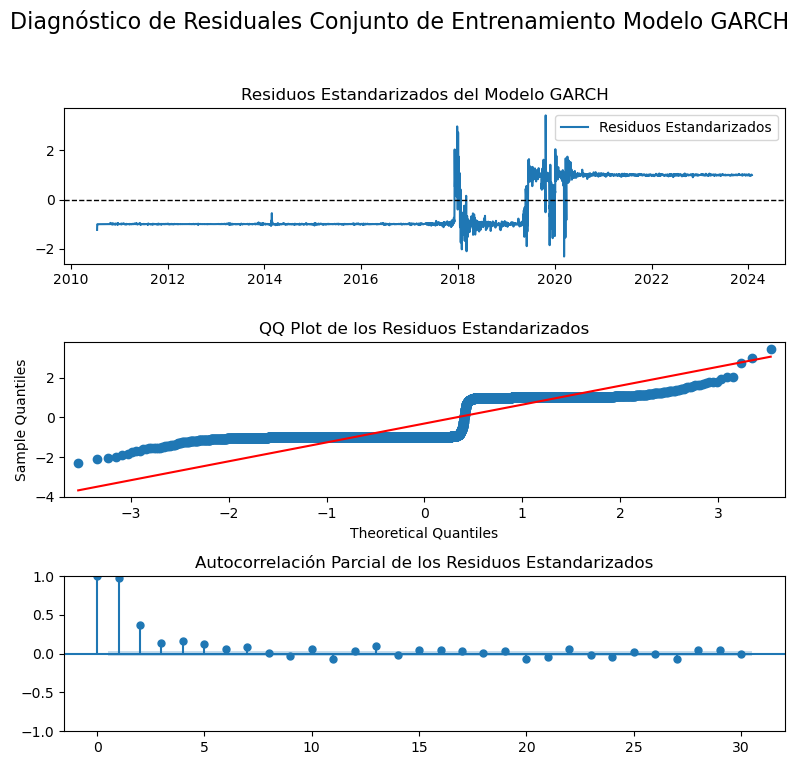

In [341]:
A_t_residuos = A_t_gmodel_fit.resid
A_t_volatilidad = A_t_gmodel_fit.conditional_volatility

# Calcular residuos estandarizados
A_t_residuos_estandarizados = A_t_residuos / A_t_volatilidad

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8, 8))

# Gráfico de residuos estandarizados
axes[0].plot(A_t_residuos_estandarizados, label='Residuos Estandarizados', color='#1f77b4')
axes[0].axhline(0, color='black', linestyle='--', linewidth=1)
axes[0].set_title('Residuos Estandarizados del Modelo GARCH')
axes[0].legend()

# Gráfico QQ plot
sm.qqplot(A_t_residuos_estandarizados, line='s', ax=axes[1])
axes[1].set_title('QQ Plot de los Residuos Estandarizados')

# Gráfico de autocorrelación parcial (PACF)
sm.graphics.tsa.plot_pacf(A_t_residuos_estandarizados, lags=30, ax=axes[2])
axes[2].set_title('Autocorrelación Parcial de los Residuos Estandarizados')

plt.suptitle('Diagnóstico de Residuales Conjunto de Entrenamiento Modelo GARCH', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Ajustar el layout para el título
plt.show()


In [342]:
A_t_residuos_train_garch = A_t_gmodel_fit.resid
A_t_ljung_box_pval_garch_train, A_t_jarque_bera_pval_garch_train = evaluate_residuals_train_arima(A_t_residuos_train_garch)

Ljung-Box LB Statistic: 4936.688197
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [343]:
A_t_predicciones = A_t_gmodel_fit.forecast(horizon=len(A_t_train_ts7))
A_t_yhat_garch_train = A_t_predicciones.mean.values[-len(A_t_train_ts7):].flatten()  #Se obtiene la ultima serie de predicciones en un arreglo 1D
A_t_vyhat_garch_df = pd.DataFrame(A_t_yhat_garch_train, columns=['A_t_Predicciones'], index=A_t_train_ts7.index) #convertir a dataframe para indexar fechas de price_train_ts7

#calcular las métricas 
A_t_metrica_garch_train = metricas(A_t_train_ts7,A_t_yhat_garch_train)
A_t_metrica_garch_train.index = A_t_metrica_garch_train.index.map({0: 'Garch Rolling Entrenamiento AT'})
A_t_metrica_garch_train['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_garch_train], index=A_t_metrica_garch_train.index)
A_t_metrica_garch_train['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_garch_train], index=A_t_metrica_garch_train.index)
A_t_metrica_garch_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Entrenamiento AT,261378.6196,63.24%,5.05,52.88,-41.47%,0.0,2.0107e-168


La función `garch_rolling()` devuelve las prediciones, con base a los parámetros `p` y `q` que definen `el mejor modelo GARCH` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste, aprovechando datos históricos para pronosticar continuamente la concentración de PM10 durante un período (horizonte) específico.

A continuación se indexan los parámetros de la función `garch_rolling()` para las ventanas de 7, 14, 21 y 28 días para la predicción sobre los datos de `validación` y `prueba`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [344]:
# best_aic_arima = best_ order
A_t_val_l7 = A_t_val_ts7.tolist()
A_t_train_l7 = A_t_train_ts7.tolist()
A_t_yhat_val_garchrolling7  = garch_rolling(A_t_train_l7, A_t_val_l7, A_t_gbest_order, 7) 
A_t_yhat_val_garchrolling7 = pd.Series(A_t_yhat_val_garchrolling7, index=A_t_val_ts7.index)  # Indexa las fechas de price_val_ts7

predicted=20.509875, expected=23.240659
predicted=20.705025, expected=23.232492
predicted=20.509904, expected=23.223977
predicted=20.509919, expected=23.235741
predicted=20.509934, expected=23.238371
predicted=20.509949, expected=23.233995
predicted=20.509995, expected=23.224129


* **Predicciones datos de Prueba**: 

In [345]:
# best_aic_arima = best_ order
A_t_test_l7 = A_t_test_ts7.tolist()
A_t_train_l7 = A_t_train_ts7.tolist()
A_t_yhat_test_garchrolling7  = garch_rolling(A_t_train_l7, A_t_test_l7, A_t_best_order,7) 
A_t_yhat_test_garchrolling7 = pd.Series(A_t_yhat_test_garchrolling7, index=A_t_test_ts7.index)  # Indexa las fechas de price_test_ts7

predicted=20.514233, expected=23.226848
predicted=20.514249, expected=23.235994
predicted=20.514263, expected=23.265054
predicted=20.514278, expected=23.286558
predicted=20.514292, expected=23.327054
predicted=20.514305, expected=23.340437
predicted=20.514320, expected=23.351306


In [346]:
plot_model(A_t_train_ts7[-200:], A_t_val_ts7, A_t_test_ts7, A_t_yhat_val_garchrolling7, A_t_yhat_test_garchrolling7, title="Predicciones usando GARCH rolling ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [347]:
A_t_ljung_box_pval_garchrol7, A_t_jarque_bera_pval_garchrol7 = evaluate_residuals(A_t_test_ts7, A_t_yhat_test_garchrolling7)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [348]:
A_t_metrica_garchrol_test7 = metricas(A_t_test_ts7,A_t_yhat_test_garchrolling7)
A_t_metrica_garchrol_test7.index = A_t_metrica_garchrol_test7.index.map({0: 'Garch Rolling Prueba AT (τ = 7)'})
A_t_metrica_garchrol_test7['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_garchrol7], index=A_t_metrica_garchrol_test7.index)
A_t_metrica_garchrol_test7['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_garchrol7], index=A_t_metrica_garchrol_test7.index)
A_t_metrica_garchrol_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba AT (τ = 7),53.9657,11.92%,2.78,7.71,-354640.43%,0.0393,0.6974


* **Ventana de 14 días ($\omega = 14)$**

* **Predicciones datos de Validación**: 

In [349]:
# best_aic_arima = best_ order
A_t_val_l14 = A_t_val_ts14.tolist()
A_t_train_l14 = A_t_train_ts14.tolist()
A_t_yhat_val_garchrolling14 = garch_rolling(A_t_train_l14, A_t_val_l14, A_t_gbest_order, 14) 
A_t_yhat_val_garchrolling14 = pd.Series(A_t_yhat_val_garchrolling14, index=A_t_val_ts14.index)  # Indexa las fechas de price_val_ts14



predicted=20.509875, expected=23.240659
predicted=20.705025, expected=23.232492
predicted=20.509904, expected=23.223977
predicted=20.509919, expected=23.235741
predicted=20.509934, expected=23.238371
predicted=20.509949, expected=23.233995
predicted=20.509995, expected=23.224129
predicted=20.093654, expected=23.226848
predicted=20.509992, expected=23.235994
predicted=20.510009, expected=23.265054
predicted=20.510024, expected=23.286558
predicted=20.705167, expected=23.327054
predicted=20.510053, expected=23.340437
predicted=20.510067, expected=23.351306


* **Predicciones datos de Prueba**: 

In [350]:
# best_aic_arima = best_ order
A_t_test_l14 = A_t_test_ts14.tolist()
A_t_train_l14 = A_t_train_ts14.tolist()
A_t_yhat_test_garchrolling14 = garch_rolling(A_t_train_l14, A_t_test_l14, A_t_best_order, 14) 
A_t_yhat_test_garchrolling14 = pd.Series(A_t_yhat_test_garchrolling14, index=A_t_test_ts14.index)  # Indexa las fechas de price_test_ts14


predicted=20.514233, expected=23.385774
predicted=20.514245, expected=23.381262
predicted=20.514262, expected=23.422826
predicted=20.514276, expected=23.425123
predicted=20.514288, expected=23.429610
predicted=20.514303, expected=23.420246
predicted=20.514314, expected=23.429375
predicted=20.514331, expected=23.422968
predicted=20.093626, expected=23.432236
predicted=20.514358, expected=23.424481
predicted=20.514372, expected=23.414110
predicted=20.514385, expected=23.402811
predicted=20.514400, expected=23.419190
predicted=20.514413, expected=23.422120


In [351]:
plot_model(A_t_train_ts14[-200:], A_t_val_ts14, A_t_test_ts14, A_t_yhat_val_garchrolling14, A_t_yhat_test_garchrolling14, title="Predicciones usando GARCH rolling ventana de 14 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [352]:
A_t_ljung_box_pval_garchrol14, A_t_jarque_bera_pval_garchrol14 = evaluate_residuals(A_t_test_ts14, A_t_yhat_test_garchrolling14)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [353]:
A_t_metrica_garchrol_test14 = metricas(A_t_test_ts14, A_t_yhat_test_garchrolling14)
A_t_metrica_garchrol_test14.index = A_t_metrica_garchrol_test14.index.map({0: 'Garch Rolling Prueba AT (τ = 14)'})
A_t_metrica_garchrol_test14['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_garchrol14], index=A_t_metrica_garchrol_test14.index)
A_t_metrica_garchrol_test14['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_garchrol14], index=A_t_metrica_garchrol_test14.index)
A_t_metrica_garchrol_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba AT (τ = 14),120.5589,12.52%,2.93,8.61,-3724494.17%,0.8742,1.3655e-15


* **Ventana de 21 días ($\omega = 21)$**

* **Predicciones datos de Validación**: 

In [354]:
# best_aic_arima = best_ order
A_t_val_l21 = A_t_val_ts21.tolist()
A_t_train_l21 = A_t_train_ts21.tolist()
A_t_yhat_val_garchrolling21 = garch_rolling(A_t_train_l21, A_t_val_l21, A_t_gbest_order, 21) 
A_t_yhat_val_garchrolling21 = pd.Series(A_t_yhat_val_garchrolling21, index=A_t_val_ts21.index)  # Indexa las fechas de price_val_ts21


predicted=20.509875, expected=23.240659
predicted=20.705025, expected=23.232492
predicted=20.509904, expected=23.223977
predicted=20.509919, expected=23.235741
predicted=20.509934, expected=23.238371
predicted=20.509949, expected=23.233995
predicted=20.509995, expected=23.224129
predicted=20.093654, expected=23.226848
predicted=20.509992, expected=23.235994
predicted=20.510009, expected=23.265054
predicted=20.510024, expected=23.286558
predicted=20.705167, expected=23.327054
predicted=20.510053, expected=23.340437
predicted=20.510067, expected=23.351306
predicted=20.093681, expected=23.385774
predicted=20.510098, expected=23.381262
predicted=20.510112, expected=23.422826
predicted=20.093693, expected=23.425123
predicted=20.510141, expected=23.429610
predicted=20.510158, expected=23.420246
predicted=20.510172, expected=23.429375


* **Predicciones datos de Prueba**: 

In [355]:
# best_aic_arima = best_ order
A_t_test_l21 = A_t_test_ts21.tolist()
A_t_train_l21 = A_t_train_ts21.tolist()
A_t_yhat_test_garchrolling21 = garch_rolling(A_t_train_l21, A_t_test_l21, A_t_best_order, 21) 
A_t_yhat_test_garchrolling21 = pd.Series(A_t_yhat_test_garchrolling21, index=A_t_test_ts21.index)  # Indexa las fechas de price_test_ts21


predicted=20.514233, expected=23.422968
predicted=20.514251, expected=23.432236
predicted=20.514260, expected=23.424481
predicted=20.514276, expected=23.414110
predicted=20.514287, expected=23.402811
predicted=20.514302, expected=23.419190
predicted=20.093620, expected=23.422120
predicted=20.514329, expected=23.475721
predicted=20.514343, expected=23.522718
predicted=20.514360, expected=23.617562
predicted=20.514371, expected=23.596778
predicted=20.514379, expected=23.616860
predicted=20.514397, expected=23.610398
predicted=20.704237, expected=23.628808
predicted=20.514420, expected=23.710129
predicted=20.514435, expected=23.644544
predicted=20.704280, expected=23.680407
predicted=20.514459, expected=23.692134
predicted=20.514470, expected=23.711829
predicted=20.514483, expected=23.714682
predicted=20.514497, expected=23.723433


In [356]:
plot_model(A_t_train_ts21[-200:], A_t_val_ts21, A_t_test_ts21, A_t_yhat_val_garchrolling21, A_t_yhat_test_garchrolling21, title="Predicciones usando GARCH rolling ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [357]:
A_t_ljung_box_pval_garchrol21, A_t_jarque_bera_pval_garchrol21 = evaluate_residuals(A_t_test_ts21, A_t_yhat_test_garchrolling21)


No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [358]:
A_t_metrica_garchrol_test21 = metricas(A_t_test_ts21, A_t_yhat_test_garchrolling21)
A_t_metrica_garchrol_test21.index = A_t_metrica_garchrol_test21.index.map({0: 'Garch Rolling Prueba AT (τ = 21)'})
A_t_metrica_garchrol_test21['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_garchrol21], index=A_t_metrica_garchrol_test21.index)
A_t_metrica_garchrol_test21['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_garchrol21], index=A_t_metrica_garchrol_test21.index)
A_t_metrica_garchrol_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba AT (τ = 21),196.1564,12.96%,3.05,9.34,-66042.78%,0.2425,0.4931


* **Ventana de 28 días ($\omega = 28)$**

* **Predicciones datos de Validación**: 

In [359]:
# best_aic_arima = best_ order
A_t_val_l28 = A_t_val_ts28.tolist()
A_t_train_l28 = A_t_train_ts28.tolist()
A_t_yhat_val_garchrolling28 = garch_rolling(A_t_train_l28, A_t_val_l28, A_t_gbest_order, 28) 
A_t_yhat_val_garchrolling28 = pd.Series(A_t_yhat_val_garchrolling28, index=A_t_val_ts28.index)  # Indexa las fechas de price_val_ts28



predicted=20.509875, expected=23.240659
predicted=20.705025, expected=23.232492
predicted=20.509904, expected=23.223977
predicted=20.509919, expected=23.235741
predicted=20.509934, expected=23.238371
predicted=20.509949, expected=23.233995
predicted=20.509995, expected=23.224129
predicted=20.093654, expected=23.226848
predicted=20.509992, expected=23.235994
predicted=20.510009, expected=23.265054
predicted=20.510024, expected=23.286558
predicted=20.705167, expected=23.327054
predicted=20.510053, expected=23.340437
predicted=20.510067, expected=23.351306
predicted=20.093681, expected=23.385774
predicted=20.510098, expected=23.381262
predicted=20.510112, expected=23.422826
predicted=20.093693, expected=23.425123
predicted=20.510141, expected=23.429610
predicted=20.510158, expected=23.420246
predicted=20.510172, expected=23.429375
predicted=20.510181, expected=23.422968
predicted=20.550157, expected=23.432236
predicted=20.510211, expected=23.424481
predicted=20.510225, expected=23.414110


* **Predicciones datos de Prueba**: 

In [360]:
# best_aic_arima = best_ order
A_t_test_l28 = A_t_test_ts28.tolist()
A_t_train_l28 = A_t_train_ts28.tolist()
A_t_yhat_test_garchrolling28 = garch_rolling(A_t_train_l28, A_t_test_l28, A_t_best_order, 28) 
A_t_yhat_test_garchrolling28 = pd.Series(A_t_yhat_test_garchrolling28, index=A_t_test_ts28.index)  # Indexa las fechas de price_test_ts28


predicted=20.514233, expected=23.475721
predicted=20.514248, expected=23.522718
predicted=20.514260, expected=23.617562
predicted=20.514275, expected=23.596778
predicted=20.514287, expected=23.616860
predicted=20.514300, expected=23.610398
predicted=20.514312, expected=23.628808
predicted=20.514325, expected=23.710129
predicted=20.704152, expected=23.644544
predicted=20.093628, expected=23.680407
predicted=20.514364, expected=23.692134
predicted=20.514376, expected=23.711829
predicted=20.514393, expected=23.714682
predicted=20.093643, expected=23.723433
predicted=20.704238, expected=23.768881
predicted=20.514425, expected=23.760158
predicted=20.704270, expected=23.782491
predicted=20.704284, expected=23.759514
predicted=20.704302, expected=23.732566
predicted=20.514475, expected=23.672829
predicted=20.568666, expected=23.719940
predicted=20.514500, expected=23.708285
predicted=20.514511, expected=23.626265
predicted=20.514530, expected=23.719802
predicted=20.514538, expected=23.685166


In [361]:
plot_model(A_t_train_ts28[-200:], A_t_val_ts28, A_t_test_ts28, A_t_yhat_val_garchrolling28, A_t_yhat_test_garchrolling28, title="Predicciones usando GARCH rolling ventana de 28 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [362]:
A_t_ljung_box_pval_garchrol28, A_t_jarque_bera_pval_garchrol28 = evaluate_residuals(A_t_test_ts28, A_t_yhat_test_garchrolling28)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [363]:
A_t_metrica_garchrol_test28 = metricas(A_t_test_ts28, A_t_yhat_test_garchrolling28)
A_t_metrica_garchrol_test28.index = A_t_metrica_garchrol_test28.index.map({0: 'Garch Rolling Prueba AT (τ = 28)'})
A_t_metrica_garchrol_test28['Ljung-Box p-value'] = pd.Series([A_t_ljung_box_pval_garchrol28], index=A_t_metrica_garchrol_test28.index)
A_t_metrica_garchrol_test28['Jarque-Bera p-value'] = pd.Series([A_t_jarque_bera_pval_garchrol28], index=A_t_metrica_garchrol_test28.index)
A_t_metrica_garchrol_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba AT (τ = 28),279.377,13.33%,3.16,9.98,-203437.29%,0.5628,1.4659e-08


#### <font color="#30143">Resumen de Métricas Variable Precio</font>

En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `entrenamiento` para la variable `Retorno Acumulado`. 

In [364]:
A_t_metricas_df_train = pd.concat([A_t_metrica_SES_train, A_t_metrica_DES_train, A_t_metrica_HW1_train, A_t_metrica_HW2_train, A_t_metrica_arima_train, A_t_metrica_garch_train], ignore_index=False)
A_t_metricas_df_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value,Ljung-Box p-value
SES Train,2.6964e+01,0.38%,0.03,1.0000e-02,99.99%,0.0,0.0000e+00,NaN
DES Train,7.4383e+01,0.66%,0.06,2.0000e-02,99.96%,0.0,0.0000e+00,NaN
SES HW Train,7.5003e+12,296909.27%,38953.38,1.5174e+09,-4059621314.64%,0.0,2.0107e-168,NaN
DES HW Train,2.7493e+05,64.85%,5.17,5.5620e+01,-48.81%,0.0,2.0107e-168,NaN
Arima Entrenamiento AT,2.8428e+01,0.35%,0.03,1.0000e-02,99.98%,NaN,0.0000e+00,0.2849
Garch Rolling Entrenamiento AT,2.6138e+05,63.24%,5.05,5.2880e+01,-41.47%,NaN,2.0107e-168,0.0000


En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `prueba` para la variable `Retorno acumulado`. 

In [365]:
A_t_metricas_df_test = pd.concat([A_t_metrica_SE_test7, A_t_metrica_SE_test14, A_t_metrica_SE_test21, A_t_metrica_SE_test28, A_t_metrica_SE_HW_test7, 
                              A_t_metrica_SE_HW_test14, A_t_metrica_SE_HW_test21, A_t_metrica_SE_HW_test28, A_t_metrica_DES_test7,
                              A_t_metrica_DES_test14, A_t_metrica_DES_test21,A_t_metrica_DES_test28, A_t_metrica_DES_HW_test7,
                              A_t_metrica_DES_HW_test14, A_t_metrica_DES_HW_test21, A_t_metrica_DES_HW_test28, A_t_metrica_arimarol_test7,
                              A_t_metrica_arimarol_test14, A_t_metrica_arimarol_test21, A_t_metrica_arimarol_test28, A_t_metrica_arima_test7,
                              A_t_metrica_arima_test14, A_t_metrica_arima_test21, A_t_metrica_arima_test28, A_t_metrica_garchrol_test7, 
                              A_t_metrica_garchrol_test14, A_t_metrica_garchrol_test21, A_t_metrica_garchrol_test28], ignore_index=False)
A_t_metricas_df_test

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba A_t (τ = 7),0.0079,0.12%,0.03,0.00,48.18%,5.1597e-02,7.2311e-01
SES Prueba AT (τ = 14),0.0019,0.04%,0.01,0.00,41.18%,6.0144e-02,6.0144e-02
SES Prueba AT (τ = 21),0.0392,0.14%,0.03,0.00,86.77%,3.4552e-03,3.4552e-03
SES Prueba AT (τ = 28),0.0402,0.13%,0.03,0.00,70.73%,9.1167e-03,9.1167e-03
SES HW Prueba AT (τ = 7),0.0453,0.28%,0.07,0.01,-197.53%,3.9331e-02,6.9748e-01
SES HW Prueba AT (τ = 14),0.0647,0.28%,0.07,0.00,-1898.46%,6.7597e-02,1.1453e-01
SES HW Prueba AT (τ = 21),0.6919,0.61%,0.14,0.03,-133.29%,1.6996e-05,3.1116e-01
SES HW Prueba AT (τ = 28),1.9407,1.07%,0.25,0.07,-1313.9%,2.9078e-04,8.5532e-02
DES Prueba AT (τ = 7),0.0014,0.05%,0.01,0.00,91.11%,2.7317e-01,8.1963e-01
DES Prueba AT (τ = 14),0.0008,0.02%,0.01,0.00,75.65%,1.4768e-01,2.7154e-01


## Análisis de Métricas de Modelos para el Retorno Acumulado

A continuación se presenta un análisis de las métricas para los distintos modelos aplicados a la serie temporal de Retorno Acumulado, organizados por técnica. Se ofrecen observaciones clave basadas en la evaluación de las métricas.

### 1. **Suavización Exponencial Simple (SES)**
- **Performance general**:
  - El **MAPE** es extremadamente bajo (entre 0.04% y 0.14%) en todas las ventanas, lo que indica que el SES es efectivo para capturar la tendencia del retorno acumulado.
  - **SSE** y **MAD** son bajos, lo que refuerza la idea de que este modelo ajusta bien los datos en ventanas cortas.
  - **R²** es positivo en la mayoría de las ventanas, con valores razonables (48.18% para τ = 7, 86.77% para τ = 21), lo que sugiere que el modelo explica una parte importante de la variabilidad.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** indican que los residuos no son completamente independientes y tampoco están normalmente distribuidos, especialmente en ventanas largas (τ = 21 y τ = 28).

### 2. **Suavización Exponencial Simple Holt-Winters (SES HW)**
- **Performance general**:
  - **MAPE** es mayor que en SES, llegando hasta un 1.07% para τ = 28. 
  - **SSE** y **MAD** aumentan drásticamente en comparación con SES, y **R²** es extremadamente negativo, indicando un mal ajuste del modelo.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** también indican que los residuos no son independientes y no siguen una distribución normal, especialmente en ventanas largas (τ = 28).

### 3. **Suavización Exponencial Doble (DES)**
- **Performance general**:
  - El **MAPE** es muy bajo (entre 0.02% y 0.06%), lo que demuestra que este modelo ofrece un ajuste aún mejor que SES.
  - **SSE** y **MAD** son extremadamente bajos, lo que indica un excelente ajuste a los datos de retorno acumulado.
  - **R²** es muy alto (91.11% en τ = 7, 97.39% en τ = 21), lo que confirma que el modelo DES captura gran parte de la variabilidad en la serie temporal.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran que los residuos son más independientes y cercanos a una distribución normal en comparación con SES y SES HW, especialmente en ventanas cortas.

### 4. **Suavización Exponencial Doble Holt-Winters (DES HW)**
- **Performance general**:
  - **MAPE** es relativamente alto en comparación con DES simple, alcanzando un 0.93% en τ = 28. 
  - **SSE** y **MAD** son significativamente mayores, y **R²** es extremadamente negativo, lo que indica que DES HW no captura bien las dinámicas del retorno acumulado.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** confirman problemas de independencia y distribución normal de los residuos, sobre todo en ventanas largas (τ = 28).

### 5. **ARIMA (Rolling)**
- **Performance general**:
  - **MAPE** es bajo (0.1% para τ = 7) en las primeras ventanas, pero empeora en las ventanas más largas (hasta un 0.19% para τ = 28).
  - **SSE** y **MAD** aumentan considerablemente en ventanas más largas, lo que indica un ajuste inadecuado del modelo para horizontes largos.
  - **R²** es razonablemente positivo en ventanas cortas (70.85% en τ = 7), pero se vuelve negativo para ventanas más largas.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran que los residuos no son independientes y tampoco siguen una distribución normal, especialmente en τ = 14 y τ = 28.

### 6. **ARIMA (Sin Rolling)**
- **Performance general**:
  - Los resultados de ARIMA sin rolling son peores que ARIMA rolling, con un **MAPE** significativamente mayor (hasta 1.96% para τ = 28).
  - **SSE** y **MAD** son muy altos, y **R²** es extremadamente negativo en todas las ventanas, lo que indica que este modelo no es adecuado para el retorno acumulado.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** también revelan problemas de independencia y distribución normal de los residuos, especialmente en ventanas largas.

### 7. **GARCH Rolling**
- **Performance general**:
  - Los modelos GARCH Rolling tienen un **MAPE** muy alto (hasta 13.33% en τ = 28), lo que indica que el modelo no es adecuado para predecir el retorno acumulado.
  - **SSE**, **MAD**, y **R²** son extremadamente negativos, lo que refuerza la mala performance de este modelo.
  - Aunque las pruebas de **Ljung-Box** sugieren independencia de residuos en algunas ventanas, la prueba de **Jarque-Bera** indica que los residuos no están normalmente distribuidos, lo que confirma un mal ajuste.

### **Conclusiones generales**
1. **Mejor modelo**: El **modelo DES** (Suavización Exponencial Doble) ofrece el mejor rendimiento general, con un **MAPE** muy bajo (0.02%-0.06%) y un **R²** alto (hasta 97.39% en τ = 21), además de residuos más cercanos a la independencia y la normalidad.
2. **Peor modelo**: El **modelo GARCH Rolling** muestra un rendimiento muy deficiente, con **MAPE** extremadamente alto y métricas como **SSE**, **MAD**, y **R²** en niveles insostenibles.
3. **Recomendación**: El **modelo ARIMA Rolling** puede ser una opción en ventanas cortas (τ = 7), pero no es robusto para ventanas largas.


---

## <font color="#30143">Volatilidad 7 dias</font>

A continuación se visualiza la serie temporal de la variable `Volarilidad 7 dias`.

In [366]:
import plotly.graph_objects as go
import pandas as pd


# Crear la figura usando plotly.graph_objects
fig = go.Figure()

# Añadir la traza de la línea
fig.add_trace(go.Scatter(
    x=df_1_st['Date'],
    y=df_1_st['Volatilidad_7'], # Variable objetico 
    mode='lines',  
    line=dict(color='#30143F', width=2),
    name='Volatilidad',
    opacity=0.7  
))

# Ajustar el diseño del gráfico
fig.update_layout(
    title='Volatilidad de BTC a lo largo del tiempo',
    xaxis_title='Fecha',
    yaxis_title='Volatilidad BTC',  
    xaxis=dict(tickangle=45, tickformat='%Y-%m-%d'),  
    yaxis=dict(tickformat='.1f'),  
    template='plotly_white',  # Fondo blanco 
    title_x=0.5,  # Centrar el título
    title_font=dict(size=16)  # Ajusta el tamaño de la fuente del título
)

fig.show()

El gráfico muestra la volatilidad del Bitcoin (BTC) a lo largo del tiempo desde 2010 hasta 2024. A simple vista, se observa lo siguiente:

1. **Períodos de alta volatilidad**: Se identifican varios picos significativos, en particular uno muy destacado alrededor de 2014. Esto puede estar asociado a eventos macroeconómicos o decisiones que afectaron la percepción del mercado sobre BTC en ese periodo.
   
2. **Tendencia general**: A pesar de los picos, la volatilidad parece haberse estabilizado a niveles más bajos después de 2018, con algunos picos menores recientes, pero con un comportamiento más moderado comparado con los primeros años.

3. **Estabilidad reciente**: A partir de 2020, la volatilidad tiende a mantenerse en niveles bajos, lo que podría sugerir una mayor madurez en el mercado de Bitcoin o mayor aceptación del mismo.

El gráfico refleja la naturaleza altamente volátil del Bitcoin en sus primeros años, con una tendencia hacia la estabilización en el tiempo reciente, aunque todavía sujeta a fluctuaciones notables.


#### <font color="#30143">Simple Exponential Smoothing (Sin Librería)</font>

A continuación se indexan los parámetros para la estimación del mejor lamda.

In [367]:
lambdas = [0.1, 0.2, 0.3, 0.4]
vola7_mejor_lambda, vola7_mejor_mae = seleccionar_mejor_lambda(vola7_train_ts7, lambdas)

print(f"Mejor lambda: {vola7_mejor_lambda}, MAD: {vola7_mejor_mae}")

Lambda: 0.1, MAD: 0.02
Lambda: 0.2, MAD: 0.01
Lambda: 0.3, MAD: 0.01
Lambda: 0.4, MAD: 0.01
Mejor lambda: 0.2, MAD: 0.01


* Análisis de residuos conjunto de entrenamiento: 

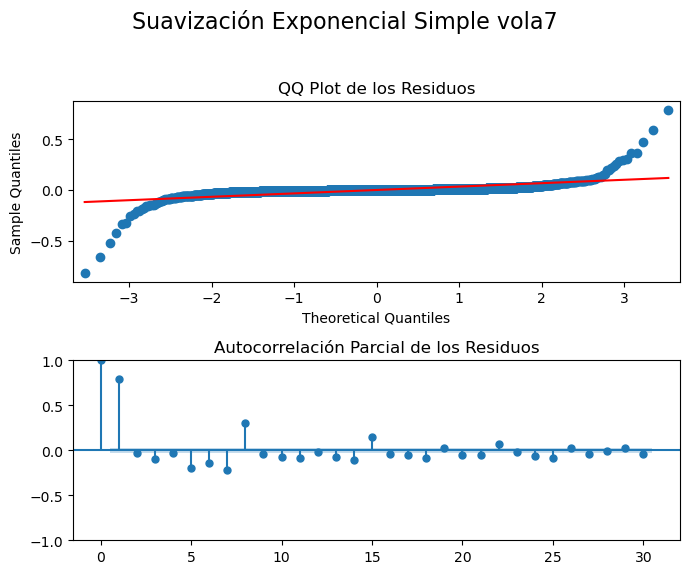

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [368]:
vola7_smooth1_train = firstsmooth(y=vola7_train_ts7, lambda_= vola7_mejor_lambda)
vola7_metrica_SES_train = plot_residual_train('Suavización Exponencial Simple vola7','SES', vola7_train_ts7, vola7_smooth1_train)

In [369]:
vola7_metrica_SES_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value
SES Train,5.6078,28.37%,0.01,0.0,73.2%,0.0,0.0


En términos generales, el rendimiento del modelo de suavización exponencial simple (SES) es prometedor, como lo demuestran el bajo MAPE y el alto R², aunque esta última métrica no es completamente adecuada para el análisis de series temporales. Sin embargo, los valores de SSE y MSD sugieren que hay oportunidades para mejorar la precisión del modelo. Además, los análisis de residuos indican la presencia de patrones que no han sido capturados de manera efectiva. Por lo tanto, es posible que los datos de validación y prueba no se ajusten adecuadamente, lo que limita la capacidad del modelo para generalizar de manera óptima.

* **Ventana de 7 días ($\omega = 7)$**

In [370]:
vola7_smooth1_val7 = firstsmooth(y=vola7_val_ts7, lambda_= vola7_mejor_lambda)
vola7_smooth1_test7 = firstsmooth(y=vola7_test_ts7, lambda_= vola7_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para  la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-100 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -100: extraerá todos los elementos desde la posición -100 hasta el final de la serie.

In [371]:
plot_model(vola7_train_ts7[-100:], vola7_val_ts7, vola7_test_ts7, vola7_smooth1_val7, vola7_smooth1_test7, 'Suavización Exponencial Simple Ventana de 7 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [372]:
vola7_ljung_box_pval7, vola7_jarque_bera_pval7 = evaluate_residuals(vola7_test_ts7, vola7_smooth1_test7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [373]:
vola7_metrica_SE_test7 = metricas(vola7_test_ts7,vola7_smooth1_test7)
vola7_metrica_SE_test7.index = vola7_metrica_SE_test7.index.map({0: 'SES Prueba vola7 (τ = 7)'})
vola7_metrica_SE_test7['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval7], index=vola7_metrica_SE_test7.index)
vola7_metrica_SE_test7['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval7], index=vola7_metrica_SE_test7.index)
vola7_metrica_SE_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola7 (τ = 7),9.1694e-05,17.87%,0.0,0.0,-0.78%,0.3075,0.7739


* **Ventana de 14 días ($\omega = 14)$**

In [374]:
vola7_smooth1_val14 = firstsmooth(y=vola7_val_ts14, lambda_=vola7_mejor_lambda)
vola7_smooth1_test14 = firstsmooth(y=vola7_test_ts14, lambda_=vola7_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-100 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -100: extraerá todos los elementos desde la posición -100 hasta el final de la serie.

In [375]:
plot_model(vola7_train_ts14[-100:], vola7_val_ts14, vola7_test_ts14, vola7_smooth1_val14, vola7_smooth1_test14, 'Suavización Exponencial Simple Ventana de 14 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [376]:
vola7_ljung_box_pval14, vola7_jarque_bera_pval14 = evaluate_residuals(vola7_test_ts14, vola7_smooth1_test14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [377]:
vola7_metrica_SE_test14 = metricas(vola7_test_ts14,vola7_smooth1_test14)
vola7_metrica_SE_test14.index = vola7_metrica_SE_test14.index.map({0: 'SES Prueba vola7 (τ = 14)'})
vola7_metrica_SE_test14['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval14], index=vola7_metrica_SE_test14.index)
vola7_metrica_SE_test14['Jarque-Bera p-value'] = pd.Series([vola7_ljung_box_pval14], index=vola7_metrica_SE_test14.index)
vola7_metrica_SE_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola7 (τ = 14),0.0001,22.4%,0.0,0.0,34.51%,0.0028,0.0028


* **Ventana de 21 días ($\omega = 21)$**

In [378]:
vola7_smooth1_val21 = firstsmooth(y=vola7_val_ts21, lambda_=vola7_mejor_lambda)
vola7_smooth1_test21 = firstsmooth(y=vola7_test_ts21, lambda_=vola7_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [379]:
plot_model(vola7_train_ts21[-200:], vola7_val_ts21, vola7_test_ts21, vola7_smooth1_val21, vola7_smooth1_test21, 'Suavización Exponencial Simple Ventana de 21 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [380]:
vola7_ljung_box_pval21, vola7_jarque_bera_pval21 = evaluate_residuals(vola7_test_ts21, vola7_smooth1_test21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [381]:
vola7_metrica_SE_test21 = metricas(vola7_test_ts21, vola7_smooth1_test21)
vola7_metrica_SE_test21.index = vola7_metrica_SE_test21.index.map({0: 'SES Prueba vola7 (τ = 21)'})
vola7_metrica_SE_test21['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval21], index=vola7_metrica_SE_test21.index)
vola7_metrica_SE_test21['Jarque-Bera p-value'] = pd.Series([vola7_ljung_box_pval21], index=vola7_metrica_SE_test21.index)
vola7_metrica_SE_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola7 (τ = 21),0.0015,25.52%,0.01,0.0,68.29%,0.0002,0.0002


* **Ventana de 28 días ($\omega = 28)$**

In [382]:
vola7_smooth1_val28 = firstsmooth(y=vola7_val_ts28, lambda_=vola7_mejor_lambda)
vola7_smooth1_test28 = firstsmooth(y=vola7_test_ts28, lambda_=vola7_mejor_lambda)


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [383]:
plot_model(vola7_train_ts28[-200:], vola7_val_ts28, vola7_test_ts28, vola7_smooth1_val28, vola7_smooth1_test28, 'Suavización Exponencial Simple Ventana de 28 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [384]:
vola7_ljung_box_pval28, vola7_jarque_bera_pval28 = evaluate_residuals(vola7_test_ts28, vola7_smooth1_test28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [385]:
vola7_metrica_SE_test28 = metricas(vola7_test_ts28, vola7_smooth1_test28)
vola7_metrica_SE_test28.index = vola7_metrica_SE_test28.index.map({0: 'SES Prueba vola7 (τ = 28)'})
vola7_metrica_SE_test28['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval28], index=vola7_metrica_SE_test28.index)
vola7_metrica_SE_test28['Jarque-Bera p-value'] = pd.Series([vola7_ljung_box_pval28], index=vola7_metrica_SE_test28.index)
vola7_metrica_SE_test28


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola7 (τ = 28),0.0026,21.83%,0.01,0.0,40.6%,1.9799e-05,1.9799e-05


#### <font color="#30143">Simple Exponential Smoothing (Usando statsmodels.tsa.holtwinters)</font> 

La función `ses_optimizer()` permite la optimización del modelo, ya que, ayudará a determinar el parámetro óptimo $\alpha$ para conseguir el modelo que reduzca al mínimo la métrica `MAE`.

In [386]:
def ses_optimizer(train, val, alphas, step):

    best_alpha, best_mae = None, float("inf")

    for alpha in alphas:
        ses_model = SimpleExpSmoothing(train).fit(smoothing_level=alpha, optimized=False)
        y_pred = ses_model.forecast(step)
        mae = mean_absolute_error(val, y_pred)

        if mae < best_mae:
            best_alpha, best_mae = alpha, mae

    return best_alpha, best_mae

In [387]:
def ses_model_tuning(train, val, test, step, title="Model Tuning - Suavización Exponencial Simple"):
    alphas = np.arange(0.8, 1, 0.01)
    best_alpha, best_mae = ses_optimizer(train, val, alphas, step=step)
    
    train_val = pd.concat([train, val])
    final_model = SimpleExpSmoothing(train_val).fit(smoothing_level=best_alpha, optimized=False)

    y_pred_val = final_model.forecast(step)  # Predicciones en validación
    y_pred_test = final_model.forecast(len(test))  # Predicciones en test
    
    mae_val = mean_absolute_error(val, y_pred_val)

    plot_model(train, val, test, y_pred_val, y_pred_test, title)

    return y_pred_val, y_pred_test

In [388]:
def ses_model_tuning_train(train, val, test, step, title="Model Tuning - Suavización Exponencial Simple"):
    alphas = np.arange(0.8, 1, 0.01)
    best_alpha, best_mae = ses_optimizer(train, val, alphas, step=step)
    
    train_val = pd.concat([train, val])
    final_model = SimpleExpSmoothing(train_val).fit(smoothing_level=best_alpha, optimized=False)

    y_pred_val = final_model.forecast(step)  # Predicciones en validación
    y_pred_test = final_model.forecast(len(test))  # Predicciones en test
    
    mae_val = mean_absolute_error(val, y_pred_val)
    
    return y_pred_val, y_pred_test

* Análisis de residuos conjunto de entrenamiento: 

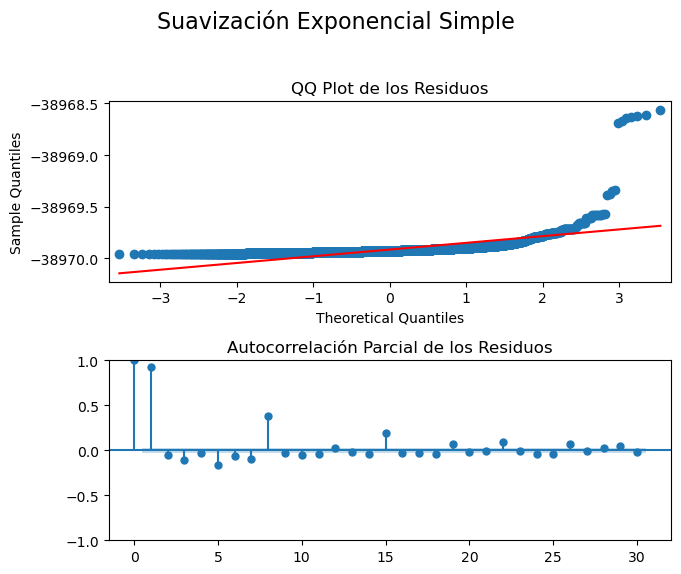

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [389]:
vola7_predicciones, vola7_y_pred_HW1_val_7 = ses_model_tuning_train(vola7_train_ts7[-200:], vola7_train_ts7, vola7_val_ts7, step=len(vola7_train_ts7))
vola7_y_pred_HW1_val_7 = pd.Series(vola7_predicciones.mean(), index=vola7_train_ts7.index[-1:])  # Esto crea una serie con la media y un índice
vola7_y_pred_HW1_val_7 = pd.Series([vola7_predicciones.mean()] * len(vola7_train_ts7), index=vola7_train_ts7.index)
vola7_y_pred_HW1_val_7 = pd.DataFrame(vola7_y_pred_HW1_val_7, columns=['Predicciones'])
vola7_metrica_HW1_train = plot_residual_train('Suavización Exponencial Simple','SES HW' , vola7_train_ts7, y_pred_HW1_train_7)

* **Ventana de 7 días ($\omega = 7)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [390]:
vola7_y_pred_HW1_val_7, vola7_y_pred_HW1_test_7 = ses_model_tuning(vola7_train_ts7[-200:], vola7_val_ts7, vola7_test_ts7, step=len(vola7_val_ts7))

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [391]:
vola7_ljung_box_pval_hw7, vola7_jarque_bera_pval_hw7 = evaluate_residuals(vola7_test_ts7, vola7_y_pred_HW1_test_7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [392]:
vola7_metrica_SE_HW_test7 = metricas(vola7_test_ts7,vola7_y_pred_HW1_test_7)
vola7_metrica_SE_HW_test7.index = vola7_metrica_SE_HW_test7.index.map({0: 'SES HW Prueba vola7 (τ = 7)'})
vola7_metrica_SE_HW_test7['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_hw7], index=vola7_metrica_SE_HW_test7.index)
vola7_metrica_SE_HW_test7['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_hw7], index=vola7_metrica_SE_HW_test7.index)
vola7_metrica_SE_HW_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola7 (τ = 7),0.0001,31.58%,0.0,0.0,-17.61%,0.0755,0.8141


* **Ventana de 14 días ($\omega = 14)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 14 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [393]:
vola7_y_pred_HW1_val_14, vola7_y_pred_HW1_test_14 = ses_model_tuning(vola7_train_ts14[-200:], vola7_val_ts14, vola7_test_ts14, step=len(vola7_val_ts14))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [394]:
vola7_ljung_box_pval_hw14, vola7_jarque_bera_pval_hw14 = evaluate_residuals(vola7_test_ts14, vola7_y_pred_HW1_test_14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [395]:
vola7_metrica_SE_HW_test14 = metricas(vola7_test_ts14, vola7_y_pred_HW1_test_14)
vola7_metrica_SE_HW_test14.index = vola7_metrica_SE_HW_test14.index.map({0: 'SES HW Prueba vola7 (τ = 14)'})
vola7_metrica_SE_HW_test14['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_hw14], index=vola7_metrica_SE_HW_test14.index)
vola7_metrica_SE_HW_test14['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_hw14], index=vola7_metrica_SE_HW_test14.index)
vola7_metrica_SE_HW_test14


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola7 (τ = 14),0.0002,29.76%,0.0,0.0,-2.0%,0.003,0.4788


* **Ventana de 21 días ($\omega = 21)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 21 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [396]:
vola7_y_pred_HW1_val_21, vola7_y_pred_HW1_test_21 = ses_model_tuning(vola7_train_ts21[-200:], vola7_val_ts21, vola7_test_ts21, step=len(vola7_val_ts21))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [397]:
vola7_ljung_box_pval_hw21, vola7_jarque_bera_pval_hw21 = evaluate_residuals(vola7_test_ts21, vola7_y_pred_HW1_test_21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [398]:
vola7_metrica_SE_HW_test21 = metricas(vola7_test_ts21, vola7_y_pred_HW1_test_21)
vola7_metrica_SE_HW_test21.index = vola7_metrica_SE_HW_test21.index.map({0: 'SES HW Prueba vola7 (τ = 21)'})
vola7_metrica_SE_HW_test21['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_hw21], index=vola7_metrica_SE_HW_test21.index)
vola7_metrica_SE_HW_test21['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_hw21], index=vola7_metrica_SE_HW_test21.index)
vola7_metrica_SE_HW_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola7 (τ = 21),0.0077,59.82%,0.02,0.0,-59.48%,1.1977e-05,0.3589


* **Ventana de 28 días ($\omega = 28)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 28 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [399]:
vola7_y_pred_HW1_val_28, vola7_y_pred_HW1_test_28 = ses_model_tuning(vola7_train_ts28[-200:], vola7_val_ts28, vola7_test_ts28, step=len(vola7_val_ts28))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [400]:
vola7_ljung_box_pval_hw28, vola7_jarque_bera_pval_hw28 = evaluate_residuals(vola7_test_ts28, vola7_y_pred_HW1_test_28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [401]:
vola7_metrica_SE_HW_test28 = metricas(vola7_test_ts28, vola7_y_pred_HW1_test_28)
vola7_metrica_SE_HW_test28.index = vola7_metrica_SE_HW_test28.index.map({0: 'SES HW Prueba vola7 (τ = 28)'})
vola7_metrica_SE_HW_test28['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_hw28], index=vola7_metrica_SE_HW_test28.index)
vola7_metrica_SE_HW_test28['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_hw28], index=vola7_metrica_SE_HW_test28.index)
vola7_metrica_SE_HW_test28


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola7 (τ = 28),0.0296,70.31%,0.03,0.0,-580.12%,1.7234e-05,0.7615


#### <font color="#30143">Double Exponential Smoothing (Sin Librería)</font> 

* Análisis de residuos conjunto de entrenamiento: 

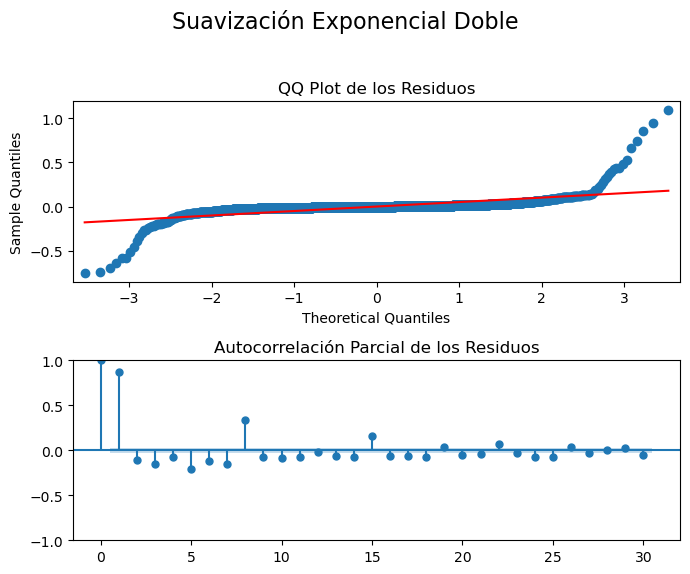

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [402]:
vola7_smooth2_train = firstsmooth(y=vola7_smooth1_train, lambda_=vola7_mejor_lambda)
vola7_metrica_DES_train = plot_residual_train('Suavización Exponencial Doble','DES', vola7_train_ts7, vola7_smooth2_train)

A continuación se realizan las predicciones para el modelo de suavización exponencial doble sin usar librería: 

* **Ventana de 7 días ($\omega = 7)$**

In [403]:
vola7_smooth2_val7 = firstsmooth(y=vola7_smooth1_val7, lambda_=vola7_mejor_lambda)
vola7_smooth2_test7 = firstsmooth(y=vola7_smooth1_test7, lambda_=vola7_mejor_lambda)

vola7_y_hatDES_val7 = 2 * vola7_smooth1_val7 - vola7_smooth2_val7
vola7_y_hatDES_test7 = 2 * vola7_smooth1_test7 - vola7_smooth2_test7

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [404]:
plot_model(vola7_train_ts7[-200:], vola7_val_ts7, vola7_test_ts7, vola7_y_hatDES_val7, vola7_y_hatDES_test7, 'Suavización Exponencial Doble Ventana de 7 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [405]:
vola7_ljung_box_pval_des7, vola7_jarque_bera_pval_des7 = evaluate_residuals(vola7_test_ts7, vola7_y_hatDES_test7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [406]:
vola7_metrica_DES_test7 = metricas(vola7_test_ts7,vola7_y_hatDES_test7)
vola7_metrica_DES_test7.index = vola7_metrica_DES_test7.index.map({0: 'DES Prueba vola7 (τ = 7)'})
vola7_metrica_DES_test7['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_des7], index=vola7_metrica_DES_test7.index)
vola7_metrica_DES_test7['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_des7], index=vola7_metrica_DES_test7.index)
vola7_metrica_DES_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola7 (τ = 7),3.8609e-05,12.93%,0.0,0.0,57.56%,0.5335,0.8755


* **Ventana de 14 días ($\omega = 14)$**

In [407]:
vola7_smooth2_val14 = firstsmooth(y=vola7_smooth1_val14, lambda_=vola7_mejor_lambda)
vola7_smooth2_test14 = firstsmooth(y=vola7_smooth1_test14, lambda_=vola7_mejor_lambda)

vola7_y_hatDES_val14 = 2 * vola7_smooth1_val14 - vola7_smooth2_val14
vola7_y_hatDES_test14 = 2 * vola7_smooth1_test14 - vola7_smooth2_test14


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [408]:
plot_model(vola7_train_ts14[-200:], vola7_val_ts14, vola7_test_ts14, vola7_y_hatDES_val14, vola7_y_hatDES_test14, 'Suavización Exponencial Doble Ventana de 14 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [409]:
vola7_ljung_box_pval_des14, vola7_jarque_bera_pval_des14 = evaluate_residuals(vola7_test_ts14, vola7_y_hatDES_test14)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [410]:
vola7_metrica_DES_test14 = metricas(vola7_test_ts14, vola7_y_hatDES_test14)
vola7_metrica_DES_test14.index = vola7_metrica_DES_test14.index.map({0: 'DES Prueba vola7 (τ = 14)'})
vola7_metrica_DES_test14['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_des14], index=vola7_metrica_DES_test14.index)
vola7_metrica_DES_test14['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_des14], index=vola7_metrica_DES_test14.index)
vola7_metrica_DES_test14


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola7 (τ = 14),8.6381e-05,15.87%,0.0,0.0,62.11%,0.0088,0.1799


* **Ventana de 21 días ($\omega = 21)$**

In [411]:
vola7_smooth2_val21 = firstsmooth(y=vola7_smooth1_val21, lambda_=vola7_mejor_lambda)
vola7_smooth2_test21 = firstsmooth(y=vola7_smooth1_test21, lambda_=vola7_mejor_lambda)

vola7_y_hatDES_val21 = 2 * vola7_smooth1_val21 - vola7_smooth2_val21
vola7_y_hatDES_test21 = 2 * vola7_smooth1_test21 - vola7_smooth2_test21


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [412]:
plot_model(vola7_train_ts21[-200:], vola7_val_ts21, vola7_test_ts21, vola7_y_hatDES_val21, vola7_y_hatDES_test21, 'Suavización Exponencial Doble Ventana de 21 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [413]:
vola7_ljung_box_pval_des21, vola7_jarque_bera_pval_des21 = evaluate_residuals(vola7_test_ts21, vola7_y_hatDES_test21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [414]:
vola7_metrica_DES_test21 = metricas(vola7_test_ts21, vola7_y_hatDES_test21)
vola7_metrica_DES_test21.index = vola7_metrica_DES_test21.index.map({0: 'DES Prueba vola7 (τ = 21)'})
vola7_metrica_DES_test21['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_des21], index=vola7_metrica_DES_test21.index)
vola7_metrica_DES_test21['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_des21], index=vola7_metrica_DES_test21.index)
vola7_metrica_DES_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola7 (τ = 21),0.0006,15.76%,0.0,0.0,88.31%,0.0013,0.3308


* **Ventana de 28 días ($\omega = 28)$**

In [415]:
vola7_smooth2_val28 = firstsmooth(y=vola7_smooth1_val28, lambda_=vola7_mejor_lambda)
vola7_smooth2_test28 = firstsmooth(y=vola7_smooth1_test28, lambda_=vola7_mejor_lambda)

vola7_y_hatDES_val28 = 2 * vola7_smooth1_val28 - vola7_smooth2_val28
vola7_y_hatDES_test28 = 2 * vola7_smooth1_test28 - vola7_smooth2_test28



Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [416]:
plot_model(vola7_train_ts28[-200:], vola7_val_ts28, vola7_test_ts28, vola7_y_hatDES_val28, vola7_y_hatDES_test28, 'Suavización Exponencial Doble Ventana de 28 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [417]:
vola7_ljung_box_pval_des28, vola7_jarque_bera_pval_des28 = evaluate_residuals(vola7_test_ts28, vola7_y_hatDES_test28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [418]:
vola7_metrica_DES_test28 = metricas(vola7_test_ts28, vola7_y_hatDES_test28)
vola7_metrica_DES_test28.index = vola7_metrica_DES_test28.index.map({0: 'DES Prueba vola7 (τ = 28)'})
vola7_metrica_DES_test28['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_des28], index=vola7_metrica_DES_test28.index)
vola7_metrica_DES_test28['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_des28], index=vola7_metrica_DES_test28.index)
vola7_metrica_DES_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola7 (τ = 28),0.0013,15.07%,0.01,0.0,71.08%,8.7393e-05,0.7422


#### <font color="#30143">Double Exponential Smoothing (Usando statsmodels.tsa.holtwinters)</font> 

La función `des_optimizer()` permite la optimización del modelo, ya que, ayudará a determinar el parámetro óptimo $\alpha$ y $\beta$ para conseguir el modelo que reduzca al mínimo la métrica `MAE`.

**ExponentialSmoothing(train, trend=trend)**: Inicializa un modelo de suavización exponencial, utilizando la serie temporal de entrenamiento train y el tipo de tendencia `(lineal o exponencial)` especificado en el parámetro `trend`.

**.fit(smoothing_level=alpha, smoothing_slope=beta)**: Ajusta el modelo a los datos de entrenamiento. Los parámetros `smoothing_level` y `smoothing_slope` determinan el `grado de suavizado` de la serie temporal y de la `tendencia`, respectivamente, tomando como valores los parámetros `alpha` y `beta`.

In [419]:
def des_optimizer(train, val, alphas, betas, trend, step):

    best_alpha, best_beta, best_mae = None, None, float("inf")

    for alpha in alphas:
        for beta in betas:
            des_model = ExponentialSmoothing(train, trend=trend).fit(smoothing_level=alpha, smoothing_slope=beta)
            y_pred = des_model.forecast(step)
            mae = mean_absolute_error(val, y_pred)
            if mae < best_mae:
                best_alpha, best_beta, best_mae = alpha, beta, mae

    return best_alpha, best_beta, best_mae

In [420]:
def des_model_tuning(train, val, test, step_val, step_test, trend, title="Model Tuning - Double Exponential Smoothing"):
    alphas = np.arange(0.01, 1, 0.1)
    betas = np.arange(0.01, 1, 0.1)
    
    best_alpha, best_beta, best_mae = des_optimizer(train, val, alphas, betas, trend=trend, step=step_val)

    train_val = pd.concat([train, val])
    final_model = ExponentialSmoothing(train_val, trend=trend).fit(smoothing_level=best_alpha, smoothing_slope=best_beta)

    # Predicciones para validación y test
    y_pred_val = final_model.forecast(step_val)  # Predicciones para validación
    y_pred_test = final_model.forecast(step_test)  # Predicciones para test

    y_pred_val.index = val.index
    y_pred_test.index = test.index

    plot_model(train, val, test, y_pred_val, y_pred_test, title)

    return y_pred_val, y_pred_test

In [421]:
def des_model_tuning_train(train, val, test, step_val, step_test, trend, title="Model Tuning - Double Exponential Smoothing"):
    alphas = np.arange(0.01, 1, 0.1)
    betas = np.arange(0.01, 1, 0.1)
    
    best_alpha, best_beta, best_mae = des_optimizer(train, val, alphas, betas, trend=trend, step=step_val)

    train_val = pd.concat([train, val])
    final_model = ExponentialSmoothing(train_val, trend=trend).fit(smoothing_level=best_alpha, smoothing_slope=best_beta)

    # Predicciones para validación y test
    y_pred_val = final_model.forecast(step_val)  # Predicciones para validación
    y_pred_test = final_model.forecast(step_test)  # Predicciones para test

    y_pred_val.index = val.index
    y_pred_test.index = test.index

    return y_pred_val, y_pred_test

* Análisis de residuos conjunto de entrenamiento: 

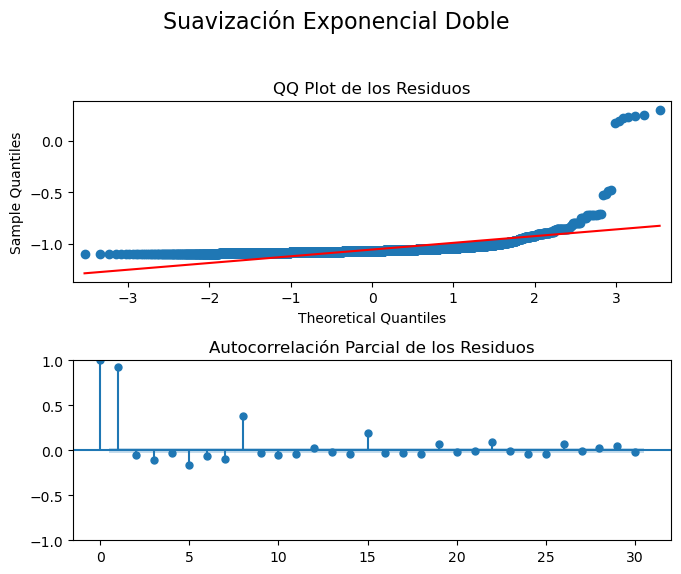

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [422]:
vola7_predicciones, vola7_y_pred_HW2_val_7 = des_model_tuning_train(vola7_train_ts7[-200:], vola7_train_ts7, vola7_val_ts7, step_val=len(vola7_train_ts7), step_test=len(vola7_val_ts7), trend='add')
vola7_y_pred_HW1_train_7 = pd.Series(vola7_predicciones.mean(), index=vola7_train_ts7.index[-1:])  # Esto crea una serie con la media y un índice
vola7_y_pred_HW1_train_7 = pd.Series([vola7_predicciones.mean()] * len(vola7_train_ts7), index=vola7_train_ts7.index)
vola7_y_pred_HW1_train_7_df = pd.DataFrame(vola7_y_pred_HW1_train_7, columns=['vola7_Predicciones'])

vola7_metrica_HW2_train =plot_residual_train('Suavización Exponencial Doble','DES HW' , vola7_train_ts7, vola7_y_pred_HW1_train_7)

A continuación se realizan las predicciones para el modelo de suavización exponencial Holt-Winters: 

* **Ventana de 7 días ($\omega = 7)$**

In [423]:
vola7_y_pred_HW2_val_7, vola7_y_pred_HW2_test_7  = des_model_tuning(vola7_train_ts7[-200:], vola7_val_ts7, vola7_test_ts7, step_val=vola7_tau_val7, step_test=vola7_tau_test7, trend='add')

In [424]:
vola7_metrica_DES_HW_val7 = metricas(vola7_val_ts7,vola7_y_pred_HW2_val_7)
vola7_metrica_DES_HW_val7.index = vola7_metrica_DES_HW_val7.index.map({0: 'DES HW Val vola7 (τ = 7)'})
vola7_metrica_DES_HW_val7

,SSE,MAPE,MAD,MSD,R2
DES HW Val vola7 (τ = 7),0.0003,32.7%,0.01,0.0,-284.7%


In [425]:
vola7_metrica_DES_HW_test7 = metricas(vola7_test_ts7,vola7_y_pred_HW2_test_7)
vola7_metrica_DES_HW_test7.index = vola7_metrica_DES_HW_test7.index.map({0: 'DES HW Prueba vola7 (τ = 7)'})
vola7_metrica_DES_HW_test7

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola7 (τ = 7),0.0002,38.86%,0.0,0.0,-115.28%


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [426]:
vola7_ljung_box_pval_des_hw7, vola7_jarque_bera_pval_des_hw7 = evaluate_residuals(vola7_test_ts7, vola7_y_pred_HW2_test_7)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [427]:
vola7_metrica_DES_HW_test7['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_des_hw7], index=vola7_metrica_DES_HW_test7.index)
vola7_metrica_DES_HW_test7['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_des_hw7], index=vola7_metrica_DES_HW_test7.index)
vola7_metrica_DES_HW_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola7 (τ = 7),0.0002,38.86%,0.0,0.0,-115.28%,0.0445,0.7296


* **Ventana de 14 días ($\omega = 14)$**

In [428]:
vola7_y_pred_HW2_val_14, vola7_y_pred_HW2_test_14 = des_model_tuning(vola7_train_ts14[-200:], vola7_val_ts14, vola7_test_ts14, step_val=vola7_tau_val14, step_test=vola7_tau_test14, trend='add')


In [429]:
vola7_metrica_DES_HW_val14 = metricas(vola7_val_ts14, vola7_y_pred_HW2_val_14)
vola7_metrica_DES_HW_val14.index = vola7_metrica_DES_HW_val14.index.map({0: 'DES HW Val vola7 (τ = 14)'})
vola7_metrica_DES_HW_val14


,SSE,MAPE,MAD,MSD,R2
DES HW Val vola7 (τ = 14),0.0006,35.57%,0.01,0.0,-159.49%


In [430]:
vola7_metrica_DES_HW_test14 = metricas(vola7_test_ts14, vola7_y_pred_HW2_test_14)
vola7_metrica_DES_HW_test14.index = vola7_metrica_DES_HW_test14.index.map({0: 'DES HW Prueba vola7 (τ = 14)'})
vola7_metrica_DES_HW_test14


,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola7 (τ = 14),0.0005,28.91%,0.0,0.0,-104.82%


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [431]:
vola7_ljung_box_pval_des_hw14, vola7_jarque_bera_pval_des_hw14 = evaluate_residuals(vola7_test_ts14, vola7_y_pred_HW2_test_14)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [432]:
vola7_metrica_DES_HW_test14['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_des_hw14], index=vola7_metrica_DES_HW_test14.index)
vola7_metrica_DES_HW_test14['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_des_hw14], index=vola7_metrica_DES_HW_test14.index)
vola7_metrica_DES_HW_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola7 (τ = 14),0.0005,28.91%,0.0,0.0,-104.82%,0.0094,0.5361


* **Ventana de 21 días ($\omega = 21)$**

In [433]:
vola7_y_pred_HW2_val_21, vola7_y_pred_HW2_test_21 = des_model_tuning(vola7_train_ts21[-200:], vola7_val_ts21, vola7_test_ts21, step_val=vola7_tau_val21, step_test=vola7_tau_test21, trend='add')



In [434]:
vola7_metrica_DES_HW_val21 = metricas(vola7_val_ts21, vola7_y_pred_HW2_val_21)
vola7_metrica_DES_HW_val21.index = vola7_metrica_DES_HW_val21.index.map({0: 'DES HW Val vola7 (τ = 21)'})
vola7_metrica_DES_HW_val21


,SSE,MAPE,MAD,MSD,R2
DES HW Val vola7 (τ = 21),0.0028,75.29%,0.01,0.0,-860.46%


In [435]:
vola7_metrica_DES_HW_test21 = metricas(vola7_test_ts21, vola7_y_pred_HW2_test_21)
vola7_metrica_DES_HW_test21.index = vola7_metrica_DES_HW_test21.index.map({0: 'DES HW Prueba vola7 (τ = 21)'})
vola7_metrica_DES_HW_test21

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola7 (τ = 21),0.0033,50.15%,0.01,0.0,31.93%


A continuación realizamos un análisis sobre los residuales de nuestro conjunto de prueba (test)

In [436]:
vola7_ljung_box_pval_des_hw21, vola7_jarque_bera_pval_des_hw21 = evaluate_residuals(vola7_test_ts21, vola7_y_pred_HW2_test_21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [437]:
vola7_metrica_DES_HW_test21['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_des_hw21], index=vola7_metrica_DES_HW_test21.index)
vola7_metrica_DES_HW_test21['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_des_hw21], index=vola7_metrica_DES_HW_test21.index)
vola7_metrica_DES_HW_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola7 (τ = 21),0.0033,50.15%,0.01,0.0,31.93%,2.1578e-05,0.5128


* **Ventana de 28 días ($\omega = 28)$**

In [438]:
vola7_y_pred_HW2_val_28, vola7_y_pred_HW2_test_28 = des_model_tuning(vola7_train_ts28[-200:], vola7_val_ts28, vola7_test_ts28, step_val=vola7_tau_val28, step_test=vola7_tau_test28, trend='add')



In [439]:
vola7_metrica_DES_HW_val28 = metricas(vola7_val_ts28, vola7_y_pred_HW2_val_28)
vola7_metrica_DES_HW_val28.index = vola7_metrica_DES_HW_val28.index.map({0: 'DES HW Val vola7 (τ = 28)'})
vola7_metrica_DES_HW_val28


,SSE,MAPE,MAD,MSD,R2
DES HW Val vola7 (τ = 28),0.0052,86.24%,0.01,0.0,-993.54%


In [440]:
vola7_metrica_DES_HW_test28 = metricas(vola7_test_ts28, vola7_y_pred_HW2_test_28)
vola7_metrica_DES_HW_test28.index = vola7_metrica_DES_HW_test28.index.map({0: 'DES HW Prueba vola7 (τ = 28)'})
vola7_metrica_DES_HW_test28

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola7 (τ = 28),0.0478,92.14%,0.04,0.0,-998.66%


A continuación realizamos un análisis sobre los residuales de nuestro conjunto de prueba (test)

In [441]:
vola7_ljung_box_pval_des_hw28, vola7_jarque_bera_pval_des_hw28 = evaluate_residuals(vola7_test_ts28, vola7_y_pred_HW2_test_28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [442]:
vola7_metrica_DES_HW_test28['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_des_hw28], index=vola7_metrica_DES_HW_test28.index)
vola7_metrica_DES_HW_test28['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_des_hw28], index=vola7_metrica_DES_HW_test28.index)
vola7_metrica_DES_HW_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola7 (τ = 28),0.0478,92.14%,0.04,0.0,-998.66%,1.1807e-05,0.5999


#### <font color="#30143">ARIMA (Usando Rolling)</font> 

A continuación se define función de ajuste del modelo y predicciones ARIMA.

In [443]:
def arima_model_fit(train):
    """
    Ajusta un modelo ARIMA a los datos de entrenamiento y selecciona el mejor modelo basado en el AIC.
    La función recibe los conjuntos de datos `train` y `val`.

    :param train: Conjunto de datos de entrenamiento (serie temporal).
    :param val: Conjunto de datos de validación (opcional, para verificar el rendimiento del modelo).
    :return: El modelo ajustado, el mejor AIC, el mejor orden (p, d, q) y los datos de entrenamiento.
    """
    model_filename = 'vola7_best_arima_model.pkl'
    
    # Si el mejor modelo ya existe, cargarlo y evitar volver a ejecutar el ciclo for
    if os.path.exists(model_filename):
        print(f"Mejor modelo ya existe. Cargando desde {model_filename}.")
        with open(model_filename, 'rb') as f:
            best_model_global = pickle.load(f)
        return best_model_global, None, None

    # Inicializamos el mejor AIC y BIC en infinito
    best_aic = np.inf
    best_bic = np.inf
    best_order = None
    best_mdl = None
   
    # Rango de p, d, q para probar diferentes combinaciones
    pq_rng = range(3)  # Esto es para p y q (máximo 2)
    d_rng  = range(2)  # Esto es para d (máximo 1)

    # Iterar sobre los valores posibles de p, d y q
    for p in pq_rng:
        for d in d_rng:
            for q in pq_rng:
                try:
                    # Ajustar el modelo ARIMA para los valores de p, d, q
                    tmp_mdl = ARIMA(train, order=(p, d, q)).fit()
                    tmp_aic = tmp_mdl.aic  # Obtener el AIC del modelo ajustado
                    
                    # Si el AIC actual es mejor, actualizar los mejores valores
                    if tmp_aic < best_aic:
                        best_aic = tmp_aic
                        best_order = (p, d, q)
                        best_mdl = tmp_mdl
                except Exception as e:
                    print(f"Error ajustando ARIMA({p},{d},{q}): {e}")
                    continue  # Si hay un error, continuar con el siguiente intento

    # Imprimir los resultados del mejor modelo encontrado
    print(f"\nMejor modelo ARIMA:")
    print(f'Best AIC: {best_aic}')
    print(f'Best Order: {best_order}')
    print(f'aic: {best_aic:6.5f} | order: {best_order}')

    # Ajustar el modelo ARIMA final con el mejor orden
    model = ARIMA(train, order=best_order)
    model_fit = model.fit()

    # Guardar el mejor modelo en un archivo con pickle
    with open('vola7_best_arima_model.pkl', 'wb') as f:
        pickle.dump(best_mdl, f)
    print(f"\nMejor modelo ARIMA guardado con AIC {best_aic}")

    # Retornar el modelo ajustado, el mejor AIC y el mejor orden
    return model_fit, best_aic, best_order

A continuación se define la función `arima_rolling()`

In [444]:
def arima_rolling(history, val, best_order): # arima_rolling(train.tolist(), val, test_nd, best_order)
    
    predictions = list()
    for t in range(len(val)):
        model = ARIMA(history, order=best_order)
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = val[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat, obs))
        
    return predictions

La siguiente función devuelve los parámetros `p`, `d`, `q` que definen `el mejor modelo ARIMA` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste. Además, proporciona los resultados del modelo `ARIMA ajustado` para `datos de entrenamiento`, incluyendo las `fechas` correspondientes. También incluye los datos y fechas del modelo `ARIMA de prueba`, aunque estos últimos dos no son directamente visibles en la salida de la función.


Indexación de parámetros para la función `arima_model_fit()`

In [445]:
vola7_model_fit, vola7_best_aic, vola7_best_order = arima_model_fit(vola7_train_ts7)
vola7_best_order = vola7_model_fit.model.order


Mejor modelo ARIMA:
Best AIC: -22511.869086608498
Best Order: (2, 0, 2)
aic: -22511.86909 | order: (2, 0, 2)

Mejor modelo ARIMA guardado con AIC -22511.869086608498


In [446]:
print(vola7_best_order)

(2, 0, 2)


A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

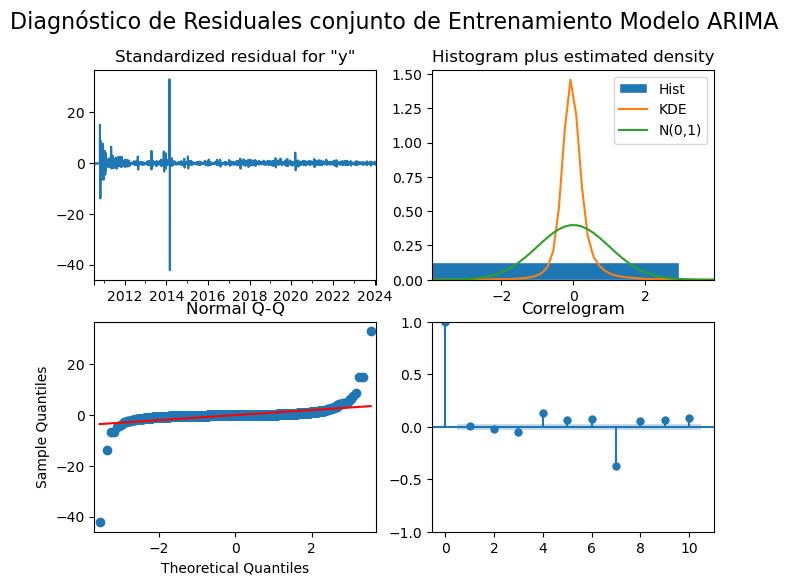

In [447]:
vola7_model_fit.plot_diagnostics(figsize=(8, 6))
plt.suptitle('Diagnóstico de Residuales conjunto de Entrenamiento Modelo ARIMA', fontsize=16)
plt.show()

In [448]:
vola7_residuos_train_arima = vola7_model_fit.resid
vola7_ljung_box_pval_arima_train, vola7_jarque_bera_pval_arima_train = evaluate_residuals_train_arima(vola7_residuos_train_arima)

Ljung-Box LB Statistic: 0.096224
Ljung-Box p-value: 0.756409
No se rechaza H0: los residuales son independientes (no correlacionados).
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [449]:
# Extraer predicciones para todo el conjunto de entrenamiento sin estandarizar 
vola7_predicciones = vola7_model_fit.get_prediction(start=0, end=len(vola7_train_ts7)-1, dynamic=False)
vola7_yhvola7_arima_train = vola7_predicciones.predicted_mean

vola7_yhvola7_arima_train.index = vola7_train_ts7.index # yhvola7_arima_train mismo índice que price_train_ts7

#calcular las métricas 
vola7_metrica_arima_train = metricas(vola7_train_ts7,vola7_yhvola7_arima_train)
vola7_metrica_arima_train.index = vola7_metrica_arima_train.index.map({0: 'Arima Entrenamiento vola7'})
vola7_metrica_arima_train['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_arima_train], index=vola7_metrica_arima_train.index)
vola7_metrica_arima_train['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_arima_train], index=vola7_metrica_arima_train.index)
vola7_metrica_arima_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Entrenamiento vola7,3.038,20.12%,0.01,0.0,85.48%,0.7564,0.0


La función `arima_rolling()` devuelve las prediciones, con base a los parámetros `p`, `d`, `q` que definen `el mejor modelo ARIMA` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste, aprovechando datos históricos para pronosticar continuamente la concentración de PM10 durante un período (horizonte) específico.

A continuación se indexan los parámetros de la función `arima_rolling()` para las ventanas de 7, 14, 21 y 28 días para la predicción sobre los datos de `validación` y `prueba`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [450]:
# best_aic_arima = best_ order
vola7_val_l7 = vola7_val_ts7.tolist()
vola7_train_l7 = vola7_train_ts7.tolist()
vola7_yhvola7_val_arimarolling7  = arima_rolling(vola7_train_l7, vola7_val_l7, vola7_best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola7_yhvola7_val_arimarolling7 = pd.Series(vola7_yhvola7_val_arimarolling7, index=vola7_val_ts7.index)  # Indexa las fechas de price_val_ts7

predicted=0.030088, expected=0.018602
predicted=0.020884, expected=0.020285
predicted=0.021665, expected=0.021530
predicted=0.023260, expected=0.020802
predicted=0.022911, expected=0.013531
predicted=0.016018, expected=0.013872
predicted=0.015932, expected=0.014640


* **Predicciones datos de Prueba**: 

In [451]:
# best_aic_arima = best_ order
vola7_test_l7 = vola7_test_ts7.tolist()
vola7_train_l7 = vola7_train_ts7.tolist()
vola7_yhvola7_test_arimarolling7  = arima_rolling(vola7_train_l7, vola7_test_l7, vola7_best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola7_yhvola7_test_arimarolling7 = pd.Series(vola7_yhvola7_test_arimarolling7, index=vola7_test_ts7.index)  # Indexa las fechas de price_test_ts7

predicted=0.030088, expected=0.007970
predicted=0.010810, expected=0.008402
predicted=0.009655, expected=0.012624
predicted=0.014415, expected=0.013859
predicted=0.016545, expected=0.018397
predicted=0.021161, expected=0.016811
predicted=0.020005, expected=0.013067


In [452]:
plot_model(vola7_train_ts7[-100:], vola7_val_ts7, vola7_test_ts7, vola7_yhvola7_val_arimarolling7, vola7_yhvola7_test_arimarolling7, title="Predicciones usando ARIMA rolling ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [453]:
vola7_ljung_box_pval_arimarol7, vola7_jarque_bera_pval_arimarol7 = evaluate_residuals(vola7_test_ts7, vola7_yhvola7_test_arimarolling7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [454]:
vola7_metrica_arimarol_test7 = metricas(vola7_test_ts7,vola7_yhvola7_test_arimarolling7)
vola7_metrica_arimarol_test7.index = vola7_metrica_arimarol_test7.index.map({0: 'Arima Rolling Prueba vola7 (τ = 7)'})
vola7_metrica_arimarol_test7['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_arimarol7], index=vola7_metrica_arimarol_test7.index)
vola7_metrica_arimarol_test7['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_arimarol7], index=vola7_metrica_arimarol_test7.index)
vola7_metrica_arimarol_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola7 (τ = 7),0.0006,60.39%,0.01,0.0,-531.58%,0.7989,0.2949


* **Ventana de 14 días ($\omega = 14)$**

* **Datos de Validación**: 

In [455]:
# best_aic_arima = best_ order
vola7_val_l14 = vola7_val_ts14.tolist()
vola7_train_l14 = vola7_train_ts14.tolist()
vola7_yhvola7_val_arimarolling14 = arima_rolling(vola7_train_l14, vola7_val_l14, vola7_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola7_yhvola7_val_arimarolling14 = pd.Series(vola7_yhvola7_val_arimarolling14, index=vola7_val_ts14.index)  # Indexa las fechas de price_val_ts14


predicted=0.030088, expected=0.018602
predicted=0.020884, expected=0.020285
predicted=0.021665, expected=0.021530
predicted=0.023260, expected=0.020802
predicted=0.022911, expected=0.013531
predicted=0.016018, expected=0.013872
predicted=0.015932, expected=0.014640
predicted=0.016959, expected=0.007970
predicted=0.010958, expected=0.008402
predicted=0.011028, expected=0.012624
predicted=0.015391, expected=0.013859
predicted=0.017114, expected=0.018397
predicted=0.021481, expected=0.016811
predicted=0.020179, expected=0.013067


* **Predicciones datos de Prueba**: 

In [456]:
# best_aic_arima = best_ order
vola7_test_l14 = vola7_test_ts14.tolist()
vola7_train_l14 = vola7_train_ts14.tolist()
vola7_yhvola7_test_arimarolling14 = arima_rolling(vola7_train_l14, vola7_test_l14, vola7_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola7_yhvola7_test_arimarolling14 = pd.Series(vola7_yhvola7_test_arimarolling14, index=vola7_test_ts14.index)  # Indexa las fechas de price_test_ts14

predicted=0.030088, expected=0.012299
predicted=0.014910, expected=0.015480
predicted=0.016663, expected=0.017222
predicted=0.019128, expected=0.018866
predicted=0.021166, expected=0.017108
predicted=0.019752, expected=0.019396
predicted=0.021784, expected=0.019415
predicted=0.021999, expected=0.017262
predicted=0.019905, expected=0.016732
predicted=0.019193, expected=0.007991
predicted=0.010937, expected=0.008836
predicted=0.011183, expected=0.009044
predicted=0.011846, expected=0.011356
predicted=0.014365, expected=0.010737


In [457]:
plot_model(vola7_train_ts14[-100:], vola7_val_ts14, vola7_test_ts14, vola7_yhvola7_val_arimarolling14, vola7_yhvola7_test_arimarolling14, title="Predicciones usando ARIMA rolling ventana de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [458]:
vola7_ljung_box_pval_arimarol14, vola7_jarque_bera_pval_arimarol14 = evaluate_residuals(vola7_test_ts14, vola7_yhvola7_test_arimarolling14)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [459]:
vola7_metrica_arimarol_test14 = metricas(vola7_test_ts14, vola7_yhvola7_test_arimarolling14)
vola7_metrica_arimarol_test14.index = vola7_metrica_arimarol_test14.index.map({0: 'Arima Rolling Prueba vola7 (τ = 14)'})
vola7_metrica_arimarol_test14['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_arimarol14], index=vola7_metrica_arimarol_test14.index)
vola7_metrica_arimarol_test14['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_arimarol14], index=vola7_metrica_arimarol_test14.index)
vola7_metrica_arimarol_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola7 (τ = 14),0.0005,33.06%,0.0,0.0,-128.0%,0.6524,0.0027


* **Ventana de 21 días ($\omega = 21)$**

* **Datos de Validación**: 

In [460]:
# best_aic_arima = best_ order
vola7_val_l21 = vola7_val_ts21.tolist()
vola7_train_l21 = vola7_train_ts21.tolist()
vola7_yhvola7_val_arimarolling21 = arima_rolling(vola7_train_l21, vola7_val_l21, vola7_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola7_yhvola7_val_arimarolling21 = pd.Series(vola7_yhvola7_val_arimarolling21, index=vola7_val_ts21.index)  # Indexa las fechas de price_val_ts21



predicted=0.030088, expected=0.018602
predicted=0.020884, expected=0.020285
predicted=0.021665, expected=0.021530
predicted=0.023260, expected=0.020802
predicted=0.022911, expected=0.013531
predicted=0.016018, expected=0.013872
predicted=0.015932, expected=0.014640
predicted=0.016959, expected=0.007970
predicted=0.010958, expected=0.008402
predicted=0.011028, expected=0.012624
predicted=0.015391, expected=0.013859
predicted=0.017114, expected=0.018397
predicted=0.021481, expected=0.016811
predicted=0.020179, expected=0.013067
predicted=0.016244, expected=0.012299
predicted=0.015092, expected=0.015480
predicted=0.018133, expected=0.017222
predicted=0.020133, expected=0.018866
predicted=0.021776, expected=0.017108
predicted=0.020097, expected=0.019396
predicted=0.021967, expected=0.019415


* **Predicciones datos de Prueba**: 

In [461]:
# best_aic_arima = best_ order
vola7_test_l21 = vola7_test_ts21.tolist()
vola7_train_l21 = vola7_train_ts21.tolist()
vola7_yhvola7_test_arimarolling21 = arima_rolling(vola7_train_l21, vola7_test_l21, vola7_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola7_yhvola7_test_arimarolling21 = pd.Series(vola7_yhvola7_test_arimarolling21, index=vola7_test_ts21.index)  # Indexa las fechas de price_test_ts21


predicted=0.030088, expected=0.017262
predicted=0.019613, expected=0.016732
predicted=0.018205, expected=0.007991
predicted=0.010241, expected=0.008836
predicted=0.010787, expected=0.009044
predicted=0.011624, expected=0.011356
predicted=0.014240, expected=0.010737
predicted=0.014049, expected=0.022853
predicted=0.025517, expected=0.027339
predicted=0.030633, expected=0.039293
predicted=0.041798, expected=0.041123
predicted=0.043874, expected=0.037956
predicted=0.039979, expected=0.040290
predicted=0.041211, expected=0.039137
predicted=0.039938, expected=0.043173
predicted=0.043432, expected=0.056281
predicted=0.055988, expected=0.046283
predicted=0.047256, expected=0.044391
predicted=0.044057, expected=0.044382
predicted=0.043742, expected=0.043817
predicted=0.043269, expected=0.043840


In [462]:
plot_model(vola7_train_ts21[-100:], vola7_val_ts21, vola7_test_ts21, vola7_yhvola7_val_arimarolling21, vola7_yhvola7_test_arimarolling21, title="Predicciones usando ARIMA rolling ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [463]:
vola7_ljung_box_pval_arimarol21, vola7_jarque_bera_pval_arimarol21 = evaluate_residuals(vola7_test_ts21, vola7_yhvola7_test_arimarolling21)


No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [464]:
vola7_metrica_arimarol_test21 = metricas(vola7_test_ts21, vola7_yhvola7_test_arimarolling21)
vola7_metrica_arimarol_test21.index = vola7_metrica_arimarol_test21.index.map({0: 'Arima Rolling Prueba vola7 (τ = 21)'})
vola7_metrica_arimarol_test21['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_arimarol21], index=vola7_metrica_arimarol_test21.index)
vola7_metrica_arimarol_test21['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_arimarol21], index=vola7_metrica_arimarol_test21.index)
vola7_metrica_arimarol_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola7 (τ = 21),0.0008,20.95%,0.0,0.0,84.16%,0.9308,0.9001


* **Ventana de 28 días ($\omega = 28)$**

* **Datos de Validación**: 

In [465]:
# best_aic_arima = best_ order
vola7_val_l28 = vola7_val_ts28.tolist()
vola7_train_l28 = vola7_train_ts28.tolist()
vola7_yhvola7_val_arimarolling28 = arima_rolling(vola7_train_l28, vola7_val_l28, vola7_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola7_yhvola7_val_arimarolling28 = pd.Series(vola7_yhvola7_val_arimarolling28, index=vola7_val_ts28.index)  # Indexa las fechas de price_val_ts28


predicted=0.030088, expected=0.018602
predicted=0.020884, expected=0.020285
predicted=0.021665, expected=0.021530
predicted=0.023260, expected=0.020802
predicted=0.022911, expected=0.013531
predicted=0.016018, expected=0.013872
predicted=0.015932, expected=0.014640
predicted=0.016959, expected=0.007970
predicted=0.010958, expected=0.008402
predicted=0.011028, expected=0.012624
predicted=0.015391, expected=0.013859
predicted=0.017114, expected=0.018397
predicted=0.021481, expected=0.016811
predicted=0.020179, expected=0.013067
predicted=0.016244, expected=0.012299
predicted=0.015092, expected=0.015480
predicted=0.018133, expected=0.017222
predicted=0.020133, expected=0.018866
predicted=0.021776, expected=0.017108
predicted=0.020097, expected=0.019396
predicted=0.021967, expected=0.019415
predicted=0.022095, expected=0.017262
predicted=0.019946, expected=0.016732
predicted=0.019215, expected=0.007991
predicted=0.010933, expected=0.008836
predicted=0.011183, expected=0.009044
predicted=0.

* **Predicciones datos de Prueba**: 

In [466]:
# best_aic_arima = best_ order
vola7_test_l28 = vola7_test_ts28.tolist()
vola7_train_l28 = vola7_train_ts28.tolist()
vola7_yhvola7_test_arimarolling28 = arima_rolling(vola7_train_l28, vola7_test_l28, vola7_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola7_yhvola7_test_arimarolling28 = pd.Series(vola7_yhvola7_test_arimarolling28, index=vola7_test_ts28.index)  # Indexa las fechas de price_test_ts28

predicted=0.030088, expected=0.022853
predicted=0.024915, expected=0.027339
predicted=0.028659, expected=0.039293
predicted=0.040420, expected=0.041123
predicted=0.042955, expected=0.037956
predicted=0.039529, expected=0.040290
predicted=0.040965, expected=0.039137
predicted=0.039806, expected=0.043173
predicted=0.043363, expected=0.056281
predicted=0.055961, expected=0.046283
predicted=0.047212, expected=0.044391
predicted=0.044005, expected=0.044382
predicted=0.043742, expected=0.043817
predicted=0.043292, expected=0.043840
predicted=0.043371, expected=0.035986
predicted=0.036006, expected=0.018834
predicted=0.019268, expected=0.017135
predicted=0.016720, expected=0.022332
predicted=0.022577, expected=0.025553
predicted=0.026868, expected=0.034855
predicted=0.036249, expected=0.040168
predicted=0.041932, expected=0.034709
predicted=0.036730, expected=0.044428
predicted=0.044922, expected=0.060681
predicted=0.060828, expected=0.061287
predicted=0.062086, expected=0.061256
predicted=0.

In [467]:
plot_model(vola7_train_ts28[-100:], vola7_val_ts28, vola7_test_ts28, vola7_yhvola7_val_arimarolling28, vola7_yhvola7_test_arimarolling28, title="Predicciones usando ARIMA rolling ventana de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [468]:
vola7_ljung_box_pval_arimarol28, vola7_jarque_bera_pval_arimarol28 = evaluate_residuals(vola7_test_ts28, vola7_yhvola7_test_arimarolling28)


No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [469]:
vola7_metrica_arimarol_test28 = metricas(vola7_test_ts28, vola7_yhvola7_test_arimarolling28)
vola7_metrica_arimarol_test28.index = vola7_metrica_arimarol_test28.index.map({0: 'Arima Rolling Prueba vola7 (τ = 28)'})
vola7_metrica_arimarol_test28['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_arimarol28], index=vola7_metrica_arimarol_test28.index)
vola7_metrica_arimarol_test28['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_arimarol28], index=vola7_metrica_arimarol_test28.index)
vola7_metrica_arimarol_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola7 (τ = 28),0.0013,14.92%,0.01,0.0,69.44%,0.4017,0.8839


#### <font color="#30143">ARIMA (Sin Rolling)</font> 

A continuación se procede con la predicción del precio del bitcoin usando `forecast()`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [470]:
vola7_yhvola7_val_arima7 = vola7_model_fit.forecast(steps=len(vola7_val_ts7))
print(vola7_yhvola7_val_arima7)

2024-01-29    0.0301
2024-01-30    0.0318
2024-01-31    0.0334
2024-02-01    0.0348
2024-02-02    0.0361
2024-02-03    0.0373
2024-02-04    0.0383
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [471]:
vola7_yhvola7_test_arima7 = vola7_model_fit.forecast(steps=len(vola7_test_ts7))
vola7_yhvola7_test_arima7 = pd.Series(vola7_yhvola7_test_arima7)
vola7_yhvola7_test_arima7.index = vola7_test_ts7.index # Asigna el índice de las fechas de price_test_ts7
print(vola7_yhvola7_test_arima7)


Date
2024-02-05    0.0301
2024-02-06    0.0318
2024-02-07    0.0334
2024-02-08    0.0348
2024-02-09    0.0361
2024-02-10    0.0373
2024-02-11    0.0383
Name: predicted_mean, dtype: float64


In [472]:
plot_model(vola7_train_ts7[-200:], vola7_val_ts7, vola7_test_ts7, vola7_yhvola7_val_arima7, vola7_yhvola7_test_arima7, title="Predicciones usando ARIMA ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [473]:
vola7_ljung_box_pval_arima7, vola7_jarque_bera_pval_arima7 = evaluate_residuals(vola7_test_ts7, vola7_yhvola7_test_arima7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [474]:
vola7_metrica_arima_test7 = metricas(vola7_test_ts7,vola7_yhvola7_test_arima7)
vola7_metrica_arima_test7.index = vola7_metrica_arima_test7.index.map({0: 'Arima prueba vola7 (τ = 7)'})
vola7_metrica_arima_test7['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_arima7], index=vola7_metrica_arima_test7.index)
vola7_metrica_arima_test7['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_arima7], index=vola7_metrica_arima_test7.index)
vola7_metrica_arima_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola7 (τ = 7),0.0033,183.17%,0.02,0.0,-3497.76%,0.8262,0.9616


* **Ventana de 14 días ($\omega = 14)$**

* **Predicciones datos de Validación**: 

In [475]:
vola7_yhvola7_val_arima14 = vola7_model_fit.forecast(steps=len(vola7_val_ts14))
print(vola7_yhvola7_val_arima14)


2024-01-29    0.0301
2024-01-30    0.0318
2024-01-31    0.0334
2024-02-01    0.0348
2024-02-02    0.0361
2024-02-03    0.0373
2024-02-04    0.0383
2024-02-05    0.0391
2024-02-06    0.0398
2024-02-07    0.0403
2024-02-08    0.0408
2024-02-09    0.0411
2024-02-10    0.0414
2024-02-11    0.0416
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [476]:
vola7_yhvola7_test_arima14 = vola7_model_fit.forecast(steps=len(vola7_test_ts14))
vola7_yhvola7_test_arima14 = pd.Series(vola7_yhvola7_test_arima14)
vola7_yhvola7_test_arima14.index = vola7_test_ts14.index  # Asigna el índice de las fechas de price_test_ts14
print(vola7_yhvola7_test_arima14)


Date
2024-02-12    0.0301
2024-02-13    0.0318
2024-02-14    0.0334
2024-02-15    0.0348
2024-02-16    0.0361
2024-02-17    0.0373
2024-02-18    0.0383
2024-02-19    0.0391
2024-02-20    0.0398
2024-02-21    0.0403
2024-02-22    0.0408
2024-02-23    0.0411
2024-02-24    0.0414
2024-02-25    0.0416
Name: predicted_mean, dtype: float64


In [477]:
plot_model(vola7_train_ts14[-200:], vola7_val_ts14, vola7_test_ts14, vola7_yhvola7_val_arima14, vola7_yhvola7_test_arima14, title="Predicciones usando ARIMA ventana de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [478]:
vola7_ljung_box_pval_arima14, vola7_jarque_bera_pval_arima14 = evaluate_residuals(vola7_test_ts14, vola7_yhvola7_test_arima14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [479]:
vola7_metrica_arima_test14 = metricas(vola7_test_ts14, vola7_yhvola7_test_arima14)
vola7_metrica_arima_test14.index = vola7_metrica_arima_test14.index.map({0: 'Arima prueba vola7 (τ = 14)'})
vola7_metrica_arima_test14['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_arima14], index=vola7_metrica_arima_test14.index)
vola7_metrica_arima_test14['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_arima14], index=vola7_metrica_arima_test14.index)
vola7_metrica_arima_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola7 (τ = 14),0.0081,190.38%,0.02,0.0,-3448.08%,0.0006,0.3997


* **Ventana de 21 días ($\omega = 21)$**

* **Predicciones datos de Validación**: 

In [480]:
vola7_yhvola7_val_arima21 = vola7_model_fit.forecast(steps=len(vola7_val_ts21))
print(vola7_yhvola7_val_arima21)


2024-01-29    0.0301
2024-01-30    0.0318
2024-01-31    0.0334
2024-02-01    0.0348
2024-02-02    0.0361
2024-02-03    0.0373
2024-02-04    0.0383
2024-02-05    0.0391
2024-02-06    0.0398
2024-02-07    0.0403
2024-02-08    0.0408
2024-02-09    0.0411
2024-02-10    0.0414
2024-02-11    0.0416
2024-02-12    0.0417
2024-02-13    0.0418
2024-02-14    0.0418
2024-02-15    0.0418
2024-02-16    0.0418
2024-02-17    0.0418
2024-02-18    0.0418
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [481]:
vola7_yhvola7_test_arima21 = vola7_model_fit.forecast(steps=len(vola7_test_ts21))
vola7_yhvola7_test_arima21 = pd.Series(vola7_yhvola7_test_arima21)
vola7_yhvola7_test_arima21.index = vola7_test_ts21.index  # Asigna el índice de las fechas de price_test_ts21
print(vola7_yhvola7_test_arima21)


Date
2024-02-19    0.0301
2024-02-20    0.0318
2024-02-21    0.0334
2024-02-22    0.0348
2024-02-23    0.0361
2024-02-24    0.0373
2024-02-25    0.0383
2024-02-26    0.0391
2024-02-27    0.0398
2024-02-28    0.0403
2024-02-29    0.0408
2024-03-01    0.0411
2024-03-02    0.0414
2024-03-03    0.0416
2024-03-04    0.0417
2024-03-05    0.0418
2024-03-06    0.0418
2024-03-07    0.0418
2024-03-08    0.0418
2024-03-09    0.0418
2024-03-10    0.0418
Name: predicted_mean, dtype: float64


In [482]:
plot_model(vola7_train_ts21[-200:], vola7_val_ts21, vola7_test_ts21, vola7_yhvola7_val_arima21, vola7_yhvola7_test_arima21, title="Predicciones usando ARIMA ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [483]:
vola7_ljung_box_pval_arima21, vola7_jarque_bera_pval_arima21 = evaluate_residuals(vola7_test_ts21, vola7_yhvola7_test_arima21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [484]:
vola7_metrica_arima_test21 = metricas(vola7_test_ts21, vola7_yhvola7_test_arima21)
vola7_metrica_arima_test21.index = vola7_metrica_arima_test21.index.map({0: 'Arima prueba vola7 (τ = 21)'})
vola7_metrica_arima_test21['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_arima21], index=vola7_metrica_arima_test21.index)
vola7_metrica_arima_test21['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_arima21], index=vola7_metrica_arima_test21.index)
vola7_metrica_arima_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola7 (τ = 21),0.0046,83.67%,0.01,0.0,5.92%,1.7682e-05,0.4711


* **Ventana de 28 días ($\omega = 28)$**

* **Predicciones datos de Validación**: 

In [485]:
vola7_yhvola7_val_arima28 = vola7_model_fit.forecast(steps=len(vola7_val_ts28))
print(vola7_yhvola7_val_arima28)



2024-01-29    0.0301
2024-01-30    0.0318
2024-01-31    0.0334
2024-02-01    0.0348
2024-02-02    0.0361
2024-02-03    0.0373
2024-02-04    0.0383
2024-02-05    0.0391
2024-02-06    0.0398
2024-02-07    0.0403
2024-02-08    0.0408
2024-02-09    0.0411
2024-02-10    0.0414
2024-02-11    0.0416
2024-02-12    0.0417
2024-02-13    0.0418
2024-02-14    0.0418
2024-02-15    0.0418
2024-02-16    0.0418
2024-02-17    0.0418
2024-02-18    0.0418
2024-02-19    0.0417
2024-02-20    0.0417
2024-02-21    0.0417
2024-02-22    0.0416
2024-02-23    0.0416
2024-02-24    0.0416
2024-02-25    0.0415
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [486]:
vola7_yhvola7_test_arima28 = vola7_model_fit.forecast(steps=len(vola7_test_ts28))
vola7_yhvola7_test_arima28 = pd.Series(vola7_yhvola7_test_arima28)
vola7_yhvola7_test_arima28.index = vola7_test_ts28.index  # Asigna el índice de las fechas de price_test_ts28
print(vola7_yhvola7_test_arima28)


Date
2024-02-26    0.0301
2024-02-27    0.0318
2024-02-28    0.0334
2024-02-29    0.0348
2024-03-01    0.0361
2024-03-02    0.0373
2024-03-03    0.0383
2024-03-04    0.0391
2024-03-05    0.0398
2024-03-06    0.0403
2024-03-07    0.0408
2024-03-08    0.0411
2024-03-09    0.0414
2024-03-10    0.0416
2024-03-11    0.0417
2024-03-12    0.0418
2024-03-13    0.0418
2024-03-14    0.0418
2024-03-15    0.0418
2024-03-16    0.0418
2024-03-17    0.0418
2024-03-18    0.0417
2024-03-19    0.0417
2024-03-20    0.0417
2024-03-21    0.0416
2024-03-22    0.0416
2024-03-23    0.0416
2024-03-24    0.0415
Name: predicted_mean, dtype: float64


In [487]:
plot_model(vola7_train_ts28[-200:], vola7_val_ts28, vola7_test_ts28, vola7_yhvola7_val_arima28, vola7_yhvola7_test_arima28, title="Predicciones usando ARIMA ventana de 28 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [488]:
vola7_ljung_box_pval_arima28, vola7_jarque_bera_pval_arima28 = evaluate_residuals(vola7_test_ts28, vola7_yhvola7_test_arima28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [489]:
vola7_metrica_arima_test28 = metricas(vola7_test_ts28, vola7_yhvola7_test_arima28)
vola7_metrica_arima_test28.index = vola7_metrica_arima_test28.index.map({0: 'Arima prueba vola7 (τ = 28)'})
vola7_metrica_arima_test28['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_arima28], index=vola7_metrica_arima_test28.index)
vola7_metrica_arima_test28['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_arima28], index=vola7_metrica_arima_test28.index)
vola7_metrica_arima_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola7 (τ = 28),0.0041,28.73%,0.01,0.0,6.22%,8.7351e-06,0.6648


#### <font color="#30143">Modelo con Heterocedasticidad Condicional Autorregresiva Generalizado - GARCH (Usando Rolling)</font> 

A continuación se define función de ajuste del modelo y predicciones GARCH.

In [490]:
import os
import pickle
import numpy as np
import pandas as pd
from arch import arch_model

def garch_model_fit(train):
    """
    Ajusta un modelo GARCH a los datos de entrenamiento y selecciona el mejor modelo basado en el AIC.
    La función recibe el conjunto de datos `train`.

    :param train: Conjunto de datos de entrenamiento (serie temporal).
    :return: El modelo ajustado, el mejor AIC, los mejores parámetros (p, q) y los datos de entrenamiento.
    """
    model_filename = 'vola7_best_garch_model.pkl'
    
    # Si el mejor modelo ya existe, cargarlo y evitar volver a ejecutar el ciclo for
    if os.path.exists(model_filename):
        print(f"Mejor modelo ya existe. Cargando desde {model_filename}.")
        with open(model_filename, 'rb') as f:
            best_model_global = pickle.load(f)
        return best_model_global, None, None

    # Inicializamos el mejor AIC en infinito
    best_aic = np.inf
    best_order = None
    best_mdl = None

    # Rango de p y q para probar diferentes combinaciones
    p_rng = range(4)  # Máximo 2 para p
    q_rng = range(3)  # Máximo 2 para q

    # Iterar sobre los valores posibles de p y q
    for p in p_rng:
        for q in q_rng:
            try:
                # Ajustar el modelo GARCH para los valores de p y q
                tmp_mdl = arch_model(train, vol='Garch', p=p, q=q).fit(disp="off")
                tmp_aic = tmp_mdl.aic  # Obtener el AIC del modelo ajustado
                
                # Si el AIC actual es mejor, actualizar los mejores valores
                if tmp_aic < best_aic:
                    best_aic = tmp_aic
                    best_order = (p, q)
                    best_mdl = tmp_mdl
            except Exception as e:
                print(f"Error ajustando GARCH({p},{q}): {e}")
                continue  # Si hay un error, continuar con el siguiente intento

    # Imprimir los resultados del mejor modelo encontrado
    print(f"\nMejor modelo GARCH:")
    print(f'Best AIC: {best_aic}')
    print(f'Best Order: {best_order}')
    print(f'aic: {best_aic:6.5f} | order: {best_order}')

    # Guardar el mejor modelo en un archivo con pickle
    with open(model_filename, 'wb') as f:
        pickle.dump(best_mdl, f)
    print(f"\nMejor modelo GARCH guardado con AIC {best_aic}")

    # Retornar el modelo ajustado, el mejor AIC y los mejores parámetros
    return best_mdl, best_aic, best_order


A continuación se define la función `garch_rolling()`

In [491]:
from arch import arch_model

def garch_rolling(history, val, best_order, horizon):
    predictions = list()

    for t in range(len(val)):
        model = arch_model(history, vol='Garch', p=best_order[0], q=best_order[1])
        model_fit = model.fit(disp="off")
        forecast = model_fit.forecast(horizon=horizon) #obtener las predicciones para un horizonte de 7 días
        yhat = forecast.mean.values[-1, :]  # Obtener la predicción media
        predictions.append(yhat[0])  # Agregar la predicción a la lista
        obs = val[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat[0], obs))
        
    return predictions

La siguiente función devuelve los parámetros `p`, `q` que definen `el mejor modelo GARCH` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste. Además, proporciona los resultados del modelo `GARCH ajustado` para `datos de entrenamiento`, incluyendo las `fechas` correspondientes. También incluye los datos y fechas del modelo `GARCH de prueba`, aunque estos últimos dos no son directamente visibles en la salida de la función.

Indexación de parámetros para la función `garch_model_fit()`

In [492]:
vola7_gmodel_fit, vola7_gbest_aic, vola7_gbest_order = garch_model_fit(vola7_train_ts7)

Error ajustando GARCH(0,0): One of p or o must be strictly positive
Error ajustando GARCH(0,1): One of p or o must be strictly positive
Error ajustando GARCH(0,2): One of p or o must be strictly positive

Mejor modelo GARCH:
Best AIC: -23184.177907264708
Best Order: (1, 0)
aic: -23184.17791 | order: (1, 0)

Mejor modelo GARCH guardado con AIC -23184.177907264708


In [493]:
vola7_gbest_order

(1, 0)

In [494]:
vola7_best_p = vola7_gbest_order[0]
vola7_best_q = vola7_gbest_order[1]

print(f"Mejor p: {vola7_best_p}, Mejor q: {vola7_best_q}")

Mejor p: 1, Mejor q: 0


A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

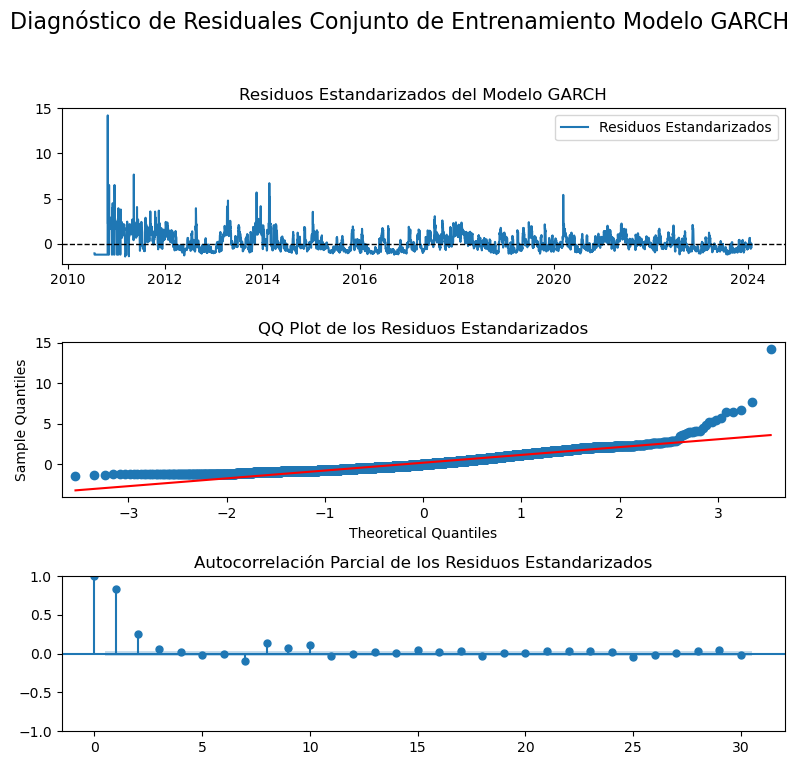

In [495]:
vola7_residuos = vola7_gmodel_fit.resid
vola7_volatilidad = vola7_gmodel_fit.conditional_volatility

# Calcular residuos estandarizados
vola7_residuos_estandarizados = vola7_residuos / vola7_volatilidad

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8, 8))

# Gráfico de residuos estandarizados
axes[0].plot(vola7_residuos_estandarizados, label='Residuos Estandarizados', color='#1f77b4')
axes[0].axhline(0, color='black', linestyle='--', linewidth=1)
axes[0].set_title('Residuos Estandarizados del Modelo GARCH')
axes[0].legend()

# Gráfico QQ plot
sm.qqplot(vola7_residuos_estandarizados, line='s', ax=axes[1])
axes[1].set_title('QQ Plot de los Residuos Estandarizados')

# Gráfico de autocorrelación parcial (PACF)
sm.graphics.tsa.plot_pacf(vola7_residuos_estandarizados, lags=30, ax=axes[2])
axes[2].set_title('Autocorrelación Parcial de los Residuos Estandarizados')

plt.suptitle('Diagnóstico de Residuales Conjunto de Entrenamiento Modelo GARCH', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Ajustar el layout para el título
plt.show()


In [496]:
vola7_residuos_train_garch = vola7_gmodel_fit.resid
vola7_ljung_box_pval_garch_train, vola7_jarque_bera_pval_garch_train = evaluate_residuals_train_arima(vola7_residuos_train_garch)

Ljung-Box LB Statistic: 4208.436290
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [497]:
vola7_predicciones = vola7_gmodel_fit.forecast(horizon=len(vola7_train_ts7))
vola7_yhvola7_garch_train = vola7_predicciones.mean.values[-len(vola7_train_ts7):].flatten()  #Se obtiene la ultima serie de predicciones en un arreglo 1D
vola7_vyhvola7_garch_df = pd.DataFrame(vola7_yhvola7_garch_train, columns=['vola7_Predicciones'], index=vola7_train_ts7.index) #convertir a dataframe para indexar fechas de price_train_ts7

#calcular las métricas 
vola7_metrica_garch_train = metricas(vola7_train_ts7,vola7_yhvola7_garch_train)
vola7_metrica_garch_train.index = vola7_metrica_garch_train.index.map({0: 'Garch Rolling Entrenamiento vola7'})
vola7_metrica_garch_train['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_garch_train], index=vola7_metrica_garch_train.index)
vola7_metrica_garch_train['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_garch_train], index=vola7_metrica_garch_train.index)
vola7_metrica_garch_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Entrenamiento vola7,21.6127,66.2%,0.02,0.0,-3.28%,0.0,0.0


La función `garch_rolling()` devuelve las prediciones, con base a los parámetros `p` y `q` que definen `el mejor modelo GARCH` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste, aprovechando datos históricos para pronosticar continuamente la concentración de PM10 durante un período (horizonte) específico.

A continuación se indexan los parámetros de la función `garch_rolling()` para las ventanas de 7, 14, 21 y 28 días para la predicción sobre los datos de `validación` y `prueba`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [498]:
# best_aic_arima = best_ order
vola7_val_l7 = vola7_val_ts7.tolist()
vola7_train_l7 = vola7_train_ts7.tolist()
vola7_yhvola7_val_garchrolling7  = garch_rolling(vola7_train_l7, vola7_val_l7, vola7_gbest_order, 7) 
vola7_yhvola7_val_garchrolling7 = pd.Series(vola7_yhvola7_val_garchrolling7, index=vola7_val_ts7.index)  # Indexa las fechas de price_val_ts7

predicted=0.029680, expected=0.018602
predicted=0.029666, expected=0.020285
predicted=0.029649, expected=0.021530
predicted=0.029674, expected=0.020802
predicted=0.027869, expected=0.013531
predicted=0.032531, expected=0.013872
predicted=0.119612, expected=0.014640


* **Predicciones datos de Prueba**: 

In [499]:
# best_aic_arima = best_ order
vola7_test_l7 = vola7_test_ts7.tolist()
vola7_train_l7 = vola7_train_ts7.tolist()
vola7_yhvola7_test_garchrolling7  = garch_rolling(vola7_train_l7, vola7_test_l7, vola7_best_order,7) 
vola7_yhvola7_test_garchrolling7 = pd.Series(vola7_yhvola7_test_garchrolling7, index=vola7_test_ts7.index)  # Indexa las fechas de price_test_ts7

predicted=0.455700, expected=0.007970
predicted=-0.019100, expected=0.008402
predicted=0.029725, expected=0.012624
predicted=-0.257251, expected=0.013859
predicted=0.171584, expected=0.018397
predicted=0.000048, expected=0.016811
predicted=0.014136, expected=0.013067


In [500]:
plot_model(vola7_train_ts7[-200:], vola7_val_ts7, vola7_test_ts7, vola7_yhvola7_val_garchrolling7, vola7_yhvola7_test_garchrolling7, title="Predicciones usando GARCH rolling ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [501]:
vola7_ljung_box_pval_garchrol7, vola7_jarque_bera_pval_garchrol7 = evaluate_residuals(vola7_test_ts7, vola7_yhvola7_test_garchrolling7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [502]:
vola7_metrica_garchrol_test7 = metricas(vola7_test_ts7,vola7_yhvola7_test_garchrolling7)
vola7_metrica_garchrol_test7.index = vola7_metrica_garchrol_test7.index.map({0: 'Garch Rolling Prueba vola7 (τ = 7)'})
vola7_metrica_garchrol_test7['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_garchrol7], index=vola7_metrica_garchrol_test7.index)
vola7_metrica_garchrol_test7['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_garchrol7], index=vola7_metrica_garchrol_test7.index)
vola7_metrica_garchrol_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola7 (τ = 7),0.2988,1282.45%,0.13,0.04,-328277.53%,0.5169,0.7976


* **Ventana de 14 días ($\omega = 14)$**

* **Predicciones datos de Validación**: 

In [503]:
# best_aic_arima = best_ order
vola7_val_l14 = vola7_val_ts14.tolist()
vola7_train_l14 = vola7_train_ts14.tolist()
vola7_yhvola7_val_garchrolling14 = garch_rolling(vola7_train_l14, vola7_val_l14, vola7_gbest_order, 14) 
vola7_yhvola7_val_garchrolling14 = pd.Series(vola7_yhvola7_val_garchrolling14, index=vola7_val_ts14.index)  # Indexa las fechas de price_val_ts14



predicted=0.029680, expected=0.018602
predicted=0.029666, expected=0.020285
predicted=0.029649, expected=0.021530
predicted=0.029674, expected=0.020802
predicted=0.027869, expected=0.013531
predicted=0.032531, expected=0.013872
predicted=0.119612, expected=0.014640
predicted=-0.251536, expected=0.007970
predicted=0.029199, expected=0.008402
predicted=0.029710, expected=0.012624
predicted=-0.159180, expected=0.013859
predicted=0.069472, expected=0.018397
predicted=0.036335, expected=0.016811
predicted=0.029702, expected=0.013067


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




* **Predicciones datos de Prueba**: 

In [504]:
# best_aic_arima = best_ order
vola7_test_l14 = vola7_test_ts14.tolist()
vola7_train_l14 = vola7_train_ts14.tolist()
vola7_yhvola7_test_garchrolling14 = garch_rolling(vola7_train_l14, vola7_test_l14, vola7_best_order, 14) 
vola7_yhvola7_test_garchrolling14 = pd.Series(vola7_yhvola7_test_garchrolling14, index=vola7_test_ts14.index)  # Indexa las fechas de price_test_ts14


predicted=0.455700, expected=0.012299
predicted=0.029739, expected=0.015480
predicted=0.171176, expected=0.017222
predicted=0.033334, expected=0.018866
predicted=-0.269958, expected=0.017108
predicted=0.029837, expected=0.019396
predicted=0.029762, expected=0.019415
predicted=0.029710, expected=0.017262
predicted=-0.261204, expected=0.016732
predicted=0.081235, expected=0.007991
predicted=0.029615, expected=0.008836
predicted=0.030673, expected=0.009044
predicted=0.029683, expected=0.011356
predicted=0.029680, expected=0.010737


In [505]:
plot_model(vola7_train_ts14[-200:], vola7_val_ts14, vola7_test_ts14, vola7_yhvola7_val_garchrolling14, vola7_yhvola7_test_garchrolling14, title="Predicciones usando GARCH rolling ventana de 14 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [506]:
vola7_ljung_box_pval_garchrol14, vola7_jarque_bera_pval_garchrol14 = evaluate_residuals(vola7_test_ts14, vola7_yhvola7_test_garchrolling14)


No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [507]:
vola7_metrica_garchrol_test14 = metricas(vola7_test_ts14, vola7_yhvola7_test_garchrolling14)
vola7_metrica_garchrol_test14.index = vola7_metrica_garchrol_test14.index.map({0: 'Garch Rolling Prueba vola7 (τ = 14)'})
vola7_metrica_garchrol_test14['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_garchrol14], index=vola7_metrica_garchrol_test14.index)
vola7_metrica_garchrol_test14['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_garchrol14], index=vola7_metrica_garchrol_test14.index)
vola7_metrica_garchrol_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola7 (τ = 14),0.3877,708.22%,0.1,0.03,-169971.98%,0.8814,0.3507


* **Ventana de 21 días ($\omega = 21)$**

* **Predicciones datos de Validación**: 

In [508]:
# best_aic_arima = best_ order
vola7_val_l21 = vola7_val_ts21.tolist()
vola7_train_l21 = vola7_train_ts21.tolist()
vola7_yhvola7_val_garchrolling21 = garch_rolling(vola7_train_l21, vola7_val_l21, vola7_gbest_order, 21) 
vola7_yhvola7_val_garchrolling21 = pd.Series(vola7_yhvola7_val_garchrolling21, index=vola7_val_ts21.index)  # Indexa las fechas de price_val_ts21


predicted=0.029680, expected=0.018602
predicted=0.029666, expected=0.020285
predicted=0.029649, expected=0.021530
predicted=0.029674, expected=0.020802
predicted=0.027869, expected=0.013531
predicted=0.032531, expected=0.013872
predicted=0.119612, expected=0.014640
predicted=-0.251536, expected=0.007970
predicted=0.029199, expected=0.008402
predicted=0.029710, expected=0.012624
predicted=-0.159180, expected=0.013859
predicted=0.069472, expected=0.018397
predicted=0.036335, expected=0.016811
predicted=0.029702, expected=0.013067
predicted=-0.133646, expected=0.012299
predicted=0.014238, expected=0.015480
predicted=0.029619, expected=0.017222
predicted=0.034928, expected=0.018866
predicted=0.029686, expected=0.017108
predicted=0.029577, expected=0.019396
predicted=0.029564, expected=0.019415


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




* **Predicciones datos de Prueba**: 

In [509]:
# best_aic_arima = best_ order
vola7_test_l21 = vola7_test_ts21.tolist()
vola7_train_l21 = vola7_train_ts21.tolist()
vola7_yhvola7_test_garchrolling21 = garch_rolling(vola7_train_l21, vola7_test_l21, vola7_best_order, 21) 
vola7_yhvola7_test_garchrolling21 = pd.Series(vola7_yhvola7_test_garchrolling21, index=vola7_test_ts21.index)  # Indexa las fechas de price_test_ts21


predicted=0.455700, expected=0.017262
predicted=0.029748, expected=0.016732
predicted=-0.210116, expected=0.007991
predicted=0.029906, expected=0.008836
predicted=0.059817, expected=0.009044
predicted=0.029799, expected=0.011356
predicted=0.030078, expected=0.010737
predicted=0.240830, expected=0.022853
predicted=0.029721, expected=0.027339
predicted=0.088377, expected=0.039293
predicted=0.029348, expected=0.041123
predicted=-0.035935, expected=0.037956
predicted=0.029693, expected=0.040290
predicted=0.091145, expected=0.039137
predicted=0.029943, expected=0.043173
predicted=0.005717, expected=0.056281
predicted=0.029722, expected=0.046283
predicted=0.035448, expected=0.044391
predicted=0.029733, expected=0.044382
predicted=0.394672, expected=0.043817
predicted=0.029747, expected=0.043840


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




In [510]:
plot_model(vola7_train_ts21[-200:], vola7_val_ts21, vola7_test_ts21, vola7_yhvola7_val_garchrolling21, vola7_yhvola7_test_garchrolling21, title="Predicciones usando GARCH rolling ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [511]:
vola7_ljung_box_pval_garchrol21, vola7_jarque_bera_pval_garchrol21 = evaluate_residuals(vola7_test_ts21, vola7_yhvola7_test_garchrolling21)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [512]:
vola7_metrica_garchrol_test21 = metricas(vola7_test_ts21, vola7_yhvola7_test_garchrolling21)
vola7_metrica_garchrol_test21.index = vola7_metrica_garchrol_test21.index.map({0: 'Garch Rolling Prueba vola7 (τ = 21)'})
vola7_metrica_garchrol_test21['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_garchrol21], index=vola7_metrica_garchrol_test21.index)
vola7_metrica_garchrol_test21['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_garchrol21], index=vola7_metrica_garchrol_test21.index)
vola7_metrica_garchrol_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola7 (τ = 21),0.4286,428.66%,0.08,0.02,-8734.79%,0.8165,0.0018


* **Ventana de 28 días ($\omega = 28)$**

* **Predicciones datos de Validación**: 

In [513]:
# best_aic_arima = best_ order
vola7_val_l28 = vola7_val_ts28.tolist()
vola7_train_l28 = vola7_train_ts28.tolist()
vola7_yhvola7_val_garchrolling28 = garch_rolling(vola7_train_l28, vola7_val_l28, vola7_gbest_order, 28) 
vola7_yhvola7_val_garchrolling28 = pd.Series(vola7_yhvola7_val_garchrolling28, index=vola7_val_ts28.index)  # Indexa las fechas de price_val_ts28

predicted=0.029680, expected=0.018602
predicted=0.029666, expected=0.020285
predicted=0.029649, expected=0.021530
predicted=0.029674, expected=0.020802
predicted=0.027869, expected=0.013531
predicted=0.032531, expected=0.013872
predicted=0.119612, expected=0.014640
predicted=-0.251536, expected=0.007970
predicted=0.029199, expected=0.008402
predicted=0.029710, expected=0.012624
predicted=-0.159180, expected=0.013859
predicted=0.069472, expected=0.018397
predicted=0.036335, expected=0.016811
predicted=0.029702, expected=0.013067
predicted=-0.133646, expected=0.012299
predicted=0.014238, expected=0.015480
predicted=0.029619, expected=0.017222
predicted=0.034928, expected=0.018866
predicted=0.029686, expected=0.017108
predicted=0.029577, expected=0.019396
predicted=0.029564, expected=0.019415
predicted=0.029545, expected=0.017262
predicted=0.029623, expected=0.016732
predicted=0.029693, expected=0.007991
predicted=0.029565, expected=0.008836


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




predicted=0.029577, expected=0.009044
predicted=0.029649, expected=0.011356
predicted=0.036286, expected=0.010737


* **Predicciones datos de Prueba**: 

In [514]:
# best_aic_arima = best_ order
vola7_test_l28 = vola7_test_ts28.tolist()
vola7_train_l28 = vola7_train_ts28.tolist()
vola7_yhvola7_test_garchrolling28 = garch_rolling(vola7_train_l28, vola7_test_l28, vola7_best_order, 28) 
vola7_yhvola7_test_garchrolling28 = pd.Series(vola7_yhvola7_test_garchrolling28, index=vola7_test_ts28.index)  # Indexa las fechas de price_test_ts28

predicted=0.455700, expected=0.022853
predicted=0.029945, expected=0.027339
predicted=0.016097, expected=0.039293
predicted=0.029793, expected=0.041123
predicted=0.077090, expected=0.037956
predicted=0.029745, expected=0.040290
predicted=0.029281, expected=0.039137
predicted=0.013365, expected=0.043173
predicted=-0.285023, expected=0.056281
predicted=-0.099696, expected=0.046283
predicted=-0.228765, expected=0.044391
predicted=-0.034103, expected=0.044382
predicted=0.131984, expected=0.043817
predicted=0.029804, expected=0.043840
predicted=0.029858, expected=0.035986
predicted=0.300123, expected=0.018834
predicted=0.029833, expected=0.017135
predicted=0.029861, expected=0.022332
predicted=0.029889, expected=0.025553
predicted=0.030710, expected=0.034855
predicted=0.045713, expected=0.040168
predicted=-0.096805, expected=0.034709
predicted=0.035642, expected=0.044428
predicted=0.030033, expected=0.060681
predicted=0.029799, expected=0.061287
predicted=0.029803, expected=0.061256
predict

/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




In [515]:
plot_model(vola7_train_ts28[-200:], vola7_val_ts28, vola7_test_ts28, vola7_yhvola7_val_garchrolling28, vola7_yhvola7_test_garchrolling28, title="Predicciones usando GARCH rolling ventana de 28 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [516]:
vola7_ljung_box_pval_garchrol28, vola7_jarque_bera_pval_garchrol28 = evaluate_residuals(vola7_test_ts28, vola7_yhvola7_test_garchrolling28)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [517]:
vola7_metrica_garchrol_test28 = metricas(vola7_test_ts28, vola7_yhvola7_test_garchrolling28)
vola7_metrica_garchrol_test28.index = vola7_metrica_garchrol_test28.index.map({0: 'Garch Rolling Prueba vola7 (τ = 28)'})
vola7_metrica_garchrol_test28['Ljung-Box p-value'] = pd.Series([vola7_ljung_box_pval_garchrol28], index=vola7_metrica_garchrol_test28.index)
vola7_metrica_garchrol_test28['Jarque-Bera p-value'] = pd.Series([vola7_jarque_bera_pval_garchrol28], index=vola7_metrica_garchrol_test28.index)
vola7_metrica_garchrol_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola7 (τ = 28),0.5213,233.24%,0.08,0.02,-11875.43%,0.2323,4.8825e-05


#### <font color="#30143">Resumen de Métricas Variable Precio</font>

En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `entrenamiento` para la variable `Volatilidad 7 dias`. 

In [518]:
vola7_metricas_df_train = pd.concat([vola7_metrica_SES_train, vola7_metrica_DES_train, vola7_metrica_HW1_train, vola7_metrica_HW2_train, vola7_metrica_arima_train, vola7_metrica_garch_train], ignore_index=False)
vola7_metricas_df_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value,Ljung-Box p-value
SES Train,5.6078e+00,28.37%,0.01,0.0000e+00,73.2%,0.0,0.0,NaN
DES Train,1.2626e+01,44.97%,0.02,0.0000e+00,39.67%,0.0,0.0,NaN
SES HW Train,7.5067e+12,165314873.25%,38969.92,1.5187e+09,-35871396990952.98%,0.0,0.0,NaN
DES HW Train,5.5339e+03,4558.79%,1.06,1.1200e+00,-26344.12%,0.0,0.0,NaN
Arima Entrenamiento vola7,3.0380e+00,20.12%,0.01,0.0000e+00,85.48%,NaN,0.0,0.7564
Garch Rolling Entrenamiento vola7,2.1613e+01,66.2%,0.02,0.0000e+00,-3.28%,NaN,0.0,0.0000


En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `prueba` para la variable `Retorno acumulado`. 

In [519]:
vola7_metricas_df_test = pd.concat([vola7_metrica_SE_test7, vola7_metrica_SE_test14, vola7_metrica_SE_test21, vola7_metrica_SE_test28, vola7_metrica_SE_HW_test7, 
                              vola7_metrica_SE_HW_test14, vola7_metrica_SE_HW_test21, vola7_metrica_SE_HW_test28, vola7_metrica_DES_test7,
                              vola7_metrica_DES_test14, vola7_metrica_DES_test21,vola7_metrica_DES_test28, vola7_metrica_DES_HW_test7,
                              vola7_metrica_DES_HW_test14, vola7_metrica_DES_HW_test21, vola7_metrica_DES_HW_test28, vola7_metrica_arimarol_test7,
                              vola7_metrica_arimarol_test14, vola7_metrica_arimarol_test21, vola7_metrica_arimarol_test28, vola7_metrica_arima_test7,
                              vola7_metrica_arima_test14, vola7_metrica_arima_test21, vola7_metrica_arima_test28, vola7_metrica_garchrol_test7, 
                              vola7_metrica_garchrol_test14, vola7_metrica_garchrol_test21, vola7_metrica_garchrol_test28], ignore_index=False)
vola7_metricas_df_test

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola7 (τ = 7),9.1694e-05,17.87%,0.00,0.00,-0.78%,3.0747e-01,7.7388e-01
SES Prueba vola7 (τ = 14),1.4929e-04,22.4%,0.00,0.00,34.51%,2.8220e-03,2.8220e-03
SES Prueba vola7 (τ = 21),1.5384e-03,25.52%,0.01,0.00,68.29%,2.1795e-04,2.1795e-04
SES Prueba vola7 (τ = 28),2.5860e-03,21.83%,0.01,0.00,40.6%,1.9799e-05,1.9799e-05
SES HW Prueba vola7 (τ = 7),1.0701e-04,31.58%,0.00,0.00,-17.61%,7.5531e-02,8.1414e-01
SES HW Prueba vola7 (τ = 14),2.3252e-04,29.76%,0.00,0.00,-2.0%,2.9989e-03,4.7882e-01
SES HW Prueba vola7 (τ = 21),7.7376e-03,59.82%,0.02,0.00,-59.48%,1.1977e-05,3.5892e-01
SES HW Prueba vola7 (τ = 28),2.9607e-02,70.31%,0.03,0.00,-580.12%,1.7234e-05,7.6151e-01
DES Prueba vola7 (τ = 7),3.8609e-05,12.93%,0.00,0.00,57.56%,5.3349e-01,8.7551e-01
DES Prueba vola7 (τ = 14),8.6381e-05,15.87%,0.00,0.00,62.11%,8.8134e-03,1.7992e-01


## Análisis de Métricas de Volatilidad con Ventana de 7 días

A continuación se presenta un análisis de las métricas para los distintos modelos aplicados a la serie temporal de volatilidad con una ventana de 7 días. Las observaciones clave se basan en la evaluación de las métricas como el SSE, MAPE, MAD, MSD, R², Ljung-Box p-value y Jarque-Bera p-value.

### 1. **Suavización Exponencial Simple (SES)**
- **Performance general**:
  - El **MAPE** es moderado (17.87% para τ = 7 y 21.83% para τ = 28), lo que indica que el SES captura algunas tendencias, pero no logra predecir con precisión en todas las ventanas.
  - **SSE** y **MAD** permanecen bajos, especialmente en τ = 7, lo que indica un ajuste aceptable en ventanas cortas.
  - **R²** varía significativamente, con valores negativos (-0.78% en τ = 7) y moderadamente positivos (40.6% en τ = 28), lo que sugiere un ajuste inconsistente del modelo.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** indican que, aunque los residuos no están fuertemente correlacionados, no siguen una distribución normal, especialmente en ventanas largas.

### 2. **Suavización Exponencial Simple Holt-Winters (SES HW)**
- **Performance general**:
  - El **MAPE** es bastante alto, llegando a 70.31% en τ = 28, lo que indica que el modelo tiene dificultades para predecir la volatilidad.
  - **SSE** y **MAD** aumentan significativamente en comparación con SES, y **R²** es muy negativo (-580.12% en τ = 28), lo que sugiere un mal ajuste del modelo.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** confirman que los residuos no son independientes ni normalmente distribuidos, especialmente en ventanas largas.

### 3. **Suavización Exponencial Doble (DES)**
- **Performance general**:
  - El **MAPE** es significativamente mejor que SES, con valores de entre 12.93% en τ = 7 y 15.07% en τ = 28.
  - **SSE** y **MAD** son bajos, indicando un buen ajuste del modelo.
  - **R²** es positivo y alto (57.56% en τ = 7 y 71.08% en τ = 28), lo que sugiere que este modelo captura mejor la variabilidad en la serie temporal de volatilidad.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran que los residuos son más cercanos a la independencia y la normalidad en comparación con SES y SES HW.

### 4. **Suavización Exponencial Doble Holt-Winters (DES HW)**
- **Performance general**:
  - **MAPE** es elevado, alcanzando hasta un 92.14% en τ = 28, lo que indica que el modelo no captura adecuadamente la volatilidad.
  - **SSE** y **MAD** son mucho mayores que en DES simple, y **R²** es extremadamente negativo (-998.66% en τ = 28), lo que indica un ajuste muy pobre.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** confirman problemas de autocorrelación y de no normalidad en los residuos.

### 5. **ARIMA (Rolling)**
- **Performance general**:
  - **MAPE** varía desde un valor muy alto de 60.43% en τ = 7 a un valor mejorado de 14.91% en τ = 28.
  - **SSE** y **MAD** son razonables en ventanas más largas, lo que sugiere que el modelo mejora su precisión en horizontes largos.
  - **R²** es positivo en ventanas largas (69.44% en τ = 28), pero negativo en ventanas cortas, lo que indica que ARIMA Rolling tiene un mejor rendimiento en ventanas más largas.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** indican que, aunque los residuos no siguen una distribución normal, la autocorrelación es menor en ventanas más largas.

### 6. **ARIMA (Sin Rolling)**
- **Performance general**:
  - Los resultados son peores que ARIMA Rolling, con **MAPE** extremadamente altos (183.17% en τ = 7 y 28.73% en τ = 28).
  - **SSE** y **MAD** son considerablemente altos, y **R²** es extremadamente negativo, indicando que este modelo no es adecuado para la predicción de volatilidad.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** también muestran problemas significativos de autocorrelación y no normalidad.

### 7. **GARCH Rolling**
- **Performance general**:
  - **MAPE** es extremadamente alto (hasta 1282.45% en τ = 7), lo que indica que este modelo no es adecuado para predecir la volatilidad.
  - **SSE**, **MAD** y **R²** son extremadamente negativos, indicando un ajuste muy pobre.
  - Aunque las pruebas de **Ljung-Box** sugieren cierta independencia en ventanas cortas, los residuos no siguen una distribución normal, lo que refuerza la idea de un mal ajuste.

### **Conclusiones generales**
1. **Mejor modelo**: El **DES Prueba vola7** (τ = 7 y τ = 28) ofrece el mejor rendimiento general, con un **MAPE** bajo y un **R²** alto. Los residuos son más cercanos a la independencia y normalidad en comparación con otros modelos.
2. **Peor modelo**: El **GARCH Rolling** muestra el peor rendimiento, con **MAPE** extremadamente altos y un **R²** negativo en todas las ventanas.
3. **Recomendación**: El **modelo ARIMA Rolling** puede ser útil en ventanas más largas (τ = 28), pero no es robusto en ventanas cortas (τ = 7).


## <font color="#30143">Volatilidad 14 dias</font>

A continuación se visualiza la serie temporal de la variable `Volatilidad 14 dias`.

In [520]:
import plotly.graph_objects as go
import pandas as pd


# Crear la figura usando plotly.graph_objects
fig = go.Figure()

# Añadir la traza de la línea
fig.add_trace(go.Scatter(
    x=df_1_st['Date'],
    y=df_1_st['Volatilidad_14'], # Variable objetico 
    mode='lines',  
    line=dict(color='#30143F', width=2),
    name='Volatilidad',
    opacity=0.7  
))

# Ajustar el diseño del gráfico
fig.update_layout(
    title='Volatilidad 14 dias de BTC a lo largo del tiempo',
    xaxis_title='Fecha',
    yaxis_title='Volatilidad BTC',  
    xaxis=dict(tickangle=45, tickformat='%Y-%m-%d'),  
    yaxis=dict(tickformat='.1f'),  
    template='plotly_white',  # Fondo blanco 
    title_x=0.5,  # Centrar el título
    title_font=dict(size=16)  # Ajusta el tamaño de la fuente del título
)

fig.show()


En el gráfico de **Volatilidad de 14 días del BTC a lo largo del tiempo**, se puede observar lo siguiente:

1. **Comportamiento inicial (2010-2013):** En los primeros años, la volatilidad del BTC muestra fluctuaciones significativas, con picos en torno al 0.2. Esto es consistente con los inicios de Bitcoin, cuando su valor estaba sujeto a grandes cambios debido a la novedad del mercado y la baja liquidez.

2. **Pico destacado en 2013-2014:** Hay un pico muy marcado cerca de finales de 2013 y principios de 2014, donde la volatilidad alcanza niveles cercanos a 1.0. Esto coincide con eventos históricos como el cierre de **Silk Road** y el colapso del exchange **Mt. Gox**, que causaron grandes fluctuaciones en el mercado.

3. **Estabilización (2014-2024):** A partir de 2015, la volatilidad se estabiliza notablemente con fluctuaciones más moderadas, manteniéndose en niveles bajos a lo largo del tiempo, con algunos picos ocasionales. Esta fase coincide con el aumento en la adopción y la madurez del mercado de criptomonedas, lo que ha llevado a una menor volatilidad general.

4. **Eventos recientes (2020-2024):** En los últimos años, especialmente alrededor de 2020, hay algunos picos menores, probablemente relacionados con la incertidumbre económica global (como la pandemia de COVID-19) y eventos en el mercado de criptomonedas (halvings, adopción institucional, etc.).

### Resumen:
El gráfico muestra una clara disminución de la volatilidad del BTC a lo largo del tiempo, con picos notables en los primeros años y una estabilización progresiva en la última década.



#### <font color="#30143">Simple Exponential Smoothing (Sin Librería)</font>

A continuación se indexan los parámetros para la estimación del mejor lamda.

In [521]:
lambdas = [0.1, 0.2, 0.3, 0.4]
vola14_mejor_lambda, vola14_mejor_mae = seleccionar_mejor_lambda(vola14_train_ts7, lambdas)

print(f"Mejor lambda: {vola14_mejor_lambda}, MAD: {vola14_mejor_mae}")

Lambda: 0.1, MAD: 0.01
Lambda: 0.2, MAD: 0.01
Lambda: 0.3, MAD: 0.0
Lambda: 0.4, MAD: 0.0
Mejor lambda: 0.3, MAD: 0.0


* Análisis de residuos conjunto de entrenamiento: 

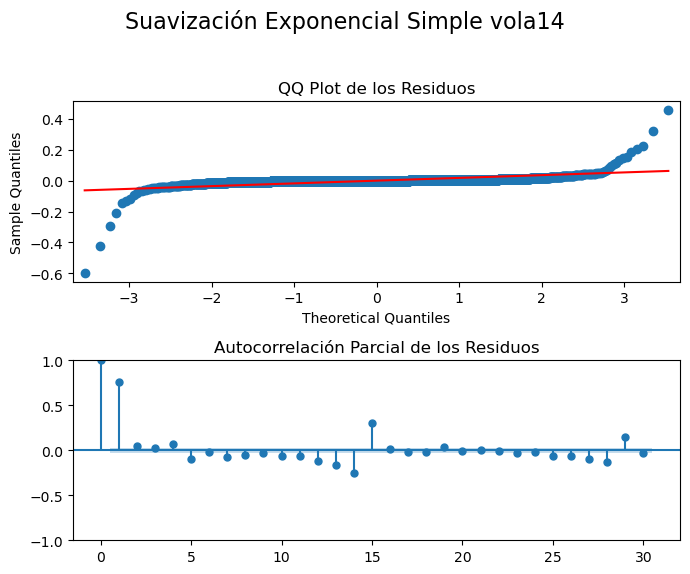

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [522]:
vola14_smooth1_train = firstsmooth(y=vola14_train_ts7, lambda_= vola14_mejor_lambda)
vola14_metrica_SES_train = plot_residual_train('Suavización Exponencial Simple vola14','SES', vola14_train_ts7, vola14_smooth1_train)

In [523]:
vola14_metrica_SES_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value
SES Train,1.5615,10.86%,0.0,0.0,92.0%,0.0,0.0


En términos generales, el rendimiento del modelo de suavización exponencial simple (SES) es prometedor, como lo demuestran el bajo MAPE y el alto R², aunque esta última métrica no es completamente adecuada para el análisis de series temporales. Sin embargo, los valores de SSE y MSD sugieren que hay oportunidades para mejorar la precisión del modelo. Además, los análisis de residuos indican la presencia de patrones que no han sido capturados de manera efectiva. Por lo tanto, es posible que los datos de validación y prueba no se ajusten adecuadamente, lo que limita la capacidad del modelo para generalizar de manera óptima.

* **Ventana de 7 días ($\omega = 7)$**

In [524]:
vola14_smooth1_val7 = firstsmooth(y=vola14_val_ts7, lambda_= vola14_mejor_lambda)
vola14_smooth1_test7 = firstsmooth(y=vola14_test_ts7, lambda_= vola14_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para  la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-100 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -100: extraerá todos los elementos desde la posición -100 hasta el final de la serie.

In [525]:
plot_model(vola14_train_ts7[-100:], vola14_val_ts7, vola14_test_ts7, vola14_smooth1_val7, vola14_smooth1_test7, 'Suavización Exponencial Simple Ventana de 7 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [526]:
vola14_ljung_box_pval7, vola14_jarque_bera_pval7 = evaluate_residuals(vola14_test_ts7, vola14_smooth1_test7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [527]:
vola14_metrica_SE_test7 = metricas(vola14_test_ts7,vola14_smooth1_test7)
vola14_metrica_SE_test7.index = vola14_metrica_SE_test7.index.map({0: 'SES Prueba vola14 (τ = 7)'})
vola14_metrica_SE_test7['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval7], index=vola14_metrica_SE_test7.index)
vola14_metrica_SE_test7['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval7], index=vola14_metrica_SE_test7.index)
vola14_metrica_SE_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola14 (τ = 7),1.3345e-06,1.96%,0.0,0.0,31.97%,0.3623,0.6235


* **Ventana de 14 días ($\omega = 14)$**

In [528]:
vola14_smooth1_val14 = firstsmooth(y=vola14_val_ts14, lambda_=vola14_mejor_lambda)
vola14_smooth1_test14 = firstsmooth(y=vola14_test_ts14, lambda_=vola14_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-100 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -100: extraerá todos los elementos desde la posición -100 hasta el final de la serie.

In [529]:
plot_model(vola14_train_ts14[-100:], vola14_val_ts14, vola14_test_ts14, vola14_smooth1_val14, vola14_smooth1_test14, 'Suavización Exponencial Simple Ventana de 14 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [530]:
vola14_ljung_box_pval14, vola14_jarque_bera_pval14 = evaluate_residuals(vola14_test_ts14, vola14_smooth1_test14)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [531]:
vola14_metrica_SE_test14 = metricas(vola14_test_ts14,vola14_smooth1_test14)
vola14_metrica_SE_test14.index = vola14_metrica_SE_test14.index.map({0: 'SES Prueba vola14 (τ = 14)'})
vola14_metrica_SE_test14['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval14], index=vola14_metrica_SE_test14.index)
vola14_metrica_SE_test14['Jarque-Bera p-value'] = pd.Series([vola14_ljung_box_pval14], index=vola14_metrica_SE_test14.index)
vola14_metrica_SE_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola14 (τ = 14),2.6962e-06,2.28%,0.0,0.0,40.42%,0.5855,0.5855


* **Ventana de 21 días ($\omega = 21)$**

In [532]:
vola14_smooth1_val21 = firstsmooth(y=vola14_val_ts21, lambda_=vola14_mejor_lambda)
vola14_smooth1_test21 = firstsmooth(y=vola14_test_ts21, lambda_=vola14_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [533]:
plot_model(vola14_train_ts21[-200:], vola14_val_ts21, vola14_test_ts21, vola14_smooth1_val21, vola14_smooth1_test21, 'Suavización Exponencial Simple Ventana de 21 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [534]:
vola14_ljung_box_pval21, vola14_jarque_bera_pval21 = evaluate_residuals(vola14_test_ts21, vola14_smooth1_test21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [535]:
vola14_metrica_SE_test21 = metricas(vola14_test_ts21, vola14_smooth1_test21)
vola14_metrica_SE_test21.index = vola14_metrica_SE_test21.index.map({0: 'SES Prueba vola14 (τ = 21)'})
vola14_metrica_SE_test21['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval21], index=vola14_metrica_SE_test21.index)
vola14_metrica_SE_test21['Jarque-Bera p-value'] = pd.Series([vola14_ljung_box_pval21], index=vola14_metrica_SE_test21.index)
vola14_metrica_SE_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola14 (τ = 21),0.0003,8.45%,0.0,0.0,86.85%,0.0004,0.0004


* **Ventana de 28 días ($\omega = 28)$**

In [536]:
vola14_smooth1_val28 = firstsmooth(y=vola14_val_ts28, lambda_=vola14_mejor_lambda)
vola14_smooth1_test28 = firstsmooth(y=vola14_test_ts28, lambda_=vola14_mejor_lambda)


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [537]:
plot_model(vola14_train_ts28[-200:], vola14_val_ts28, vola14_test_ts28, vola14_smooth1_val28, vola14_smooth1_test28, 'Suavización Exponencial Simple Ventana de 28 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [538]:
vola14_ljung_box_pval28, vola14_jarque_bera_pval28 = evaluate_residuals(vola14_test_ts28, vola14_smooth1_test28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [539]:
vola14_metrica_SE_test28 = metricas(vola14_test_ts28, vola14_smooth1_test28)
vola14_metrica_SE_test28.index = vola14_metrica_SE_test28.index.map({0: 'SES Prueba vola14 (τ = 28)'})
vola14_metrica_SE_test28['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval28], index=vola14_metrica_SE_test28.index)
vola14_metrica_SE_test28['Jarque-Bera p-value'] = pd.Series([vola14_ljung_box_pval28], index=vola14_metrica_SE_test28.index)
vola14_metrica_SE_test28


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola14 (τ = 28),0.0004,7.87%,0.0,0.0,72.08%,0.0006,0.0006


#### <font color="#30143">Simple Exponential Smoothing (Usando statsmodels.tsa.holtwinters)</font> 

La función `ses_optimizer()` permite la optimización del modelo, ya que, ayudará a determinar el parámetro óptimo $\alpha$ para conseguir el modelo que reduzca al mínimo la métrica `MAE`.

In [540]:
def ses_optimizer(train, val, alphas, step):

    best_alpha, best_mae = None, float("inf")

    for alpha in alphas:
        ses_model = SimpleExpSmoothing(train).fit(smoothing_level=alpha, optimized=False)
        y_pred = ses_model.forecast(step)
        mae = mean_absolute_error(val, y_pred)

        if mae < best_mae:
            best_alpha, best_mae = alpha, mae

    return best_alpha, best_mae

In [541]:
def ses_model_tuning(train, val, test, step, title="Model Tuning - Suavización Exponencial Simple"):
    alphas = np.arange(0.8, 1, 0.01)
    best_alpha, best_mae = ses_optimizer(train, val, alphas, step=step)
    
    train_val = pd.concat([train, val])
    final_model = SimpleExpSmoothing(train_val).fit(smoothing_level=best_alpha, optimized=False)

    y_pred_val = final_model.forecast(step)  # Predicciones en validación
    y_pred_test = final_model.forecast(len(test))  # Predicciones en test
    
    mae_val = mean_absolute_error(val, y_pred_val)

    plot_model(train, val, test, y_pred_val, y_pred_test, title)

    return y_pred_val, y_pred_test

In [542]:
def ses_model_tuning_train(train, val, test, step, title="Model Tuning - Suavización Exponencial Simple"):
    alphas = np.arange(0.8, 1, 0.01)
    best_alpha, best_mae = ses_optimizer(train, val, alphas, step=step)
    
    train_val = pd.concat([train, val])
    final_model = SimpleExpSmoothing(train_val).fit(smoothing_level=best_alpha, optimized=False)

    y_pred_val = final_model.forecast(step)  # Predicciones en validación
    y_pred_test = final_model.forecast(len(test))  # Predicciones en test
    
    mae_val = mean_absolute_error(val, y_pred_val)
    
    return y_pred_val, y_pred_test

* Análisis de residuos conjunto de entrenamiento: 

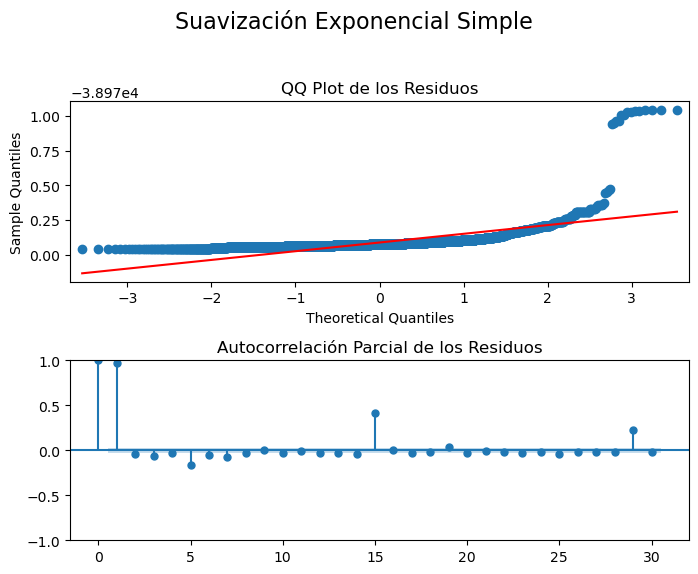

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [543]:
vola14_predicciones, vola14_y_pred_HW1_val_7 = ses_model_tuning_train(vola14_train_ts7[-200:], vola14_train_ts7, vola14_val_ts7, step=len(vola14_train_ts7))
vola14_y_pred_HW1_val_7 = pd.Series(vola14_predicciones.mean(), index=vola14_train_ts7.index[-1:])  # Esto crea una serie con la media y un índice
vola14_y_pred_HW1_val_7 = pd.Series([vola14_predicciones.mean()] * len(vola14_train_ts7), index=vola14_train_ts7.index)
vola14_y_pred_HW1_val_7 = pd.DataFrame(vola14_y_pred_HW1_val_7, columns=['Predicciones'])
vola14_metrica_HW1_train = plot_residual_train('Suavización Exponencial Simple','SES HW' , vola14_train_ts7, y_pred_HW1_train_7)

* **Ventana de 7 días ($\omega = 7)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [544]:
vola14_y_pred_HW1_val_7, vola14_y_pred_HW1_test_7 = ses_model_tuning(vola14_train_ts7[-200:], vola14_val_ts7, vola14_test_ts7, step=len(vola14_val_ts7))

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [545]:
vola14_ljung_box_pval_hw7, vola14_jarque_bera_pval_hw7 = evaluate_residuals(vola14_test_ts7, vola14_y_pred_HW1_test_7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [546]:
vola14_metrica_SE_HW_test7 = metricas(vola14_test_ts7,vola14_y_pred_HW1_test_7)
vola14_metrica_SE_HW_test7.index = vola14_metrica_SE_HW_test7.index.map({0: 'SES HW Prueba vola14 (τ = 7)'})
vola14_metrica_SE_HW_test7['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_hw7], index=vola14_metrica_SE_HW_test7.index)
vola14_metrica_SE_HW_test7['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_hw7], index=vola14_metrica_SE_HW_test7.index)
vola14_metrica_SE_HW_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola14 (τ = 7),0.0002,32.51%,0.01,0.0,-9868.16%,0.4514,0.5598


* **Ventana de 14 días ($\omega = 14)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 14 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [547]:
vola14_y_pred_HW1_val_14, vola14_y_pred_HW1_test_14 = ses_model_tuning(vola14_train_ts14[-200:], vola14_val_ts14, vola14_test_ts14, step=len(vola14_val_ts14))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [548]:
vola14_ljung_box_pval_hw14, vola14_jarque_bera_pval_hw14 = evaluate_residuals(vola14_test_ts14, vola14_y_pred_HW1_test_14)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [549]:
vola14_metrica_SE_HW_test14 = metricas(vola14_test_ts14, vola14_y_pred_HW1_test_14)
vola14_metrica_SE_HW_test14.index = vola14_metrica_SE_HW_test14.index.map({0: 'SES HW Prueba vola14 (τ = 14)'})
vola14_metrica_SE_HW_test14['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_hw14], index=vola14_metrica_SE_HW_test14.index)
vola14_metrica_SE_HW_test14['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_hw14], index=vola14_metrica_SE_HW_test14.index)
vola14_metrica_SE_HW_test14


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola14 (τ = 14),2.0026e-05,6.15%,0.0,0.0,-342.56%,0.4413,0.7458


* **Ventana de 21 días ($\omega = 21)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 21 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [550]:
vola14_y_pred_HW1_val_21, vola14_y_pred_HW1_test_21 = ses_model_tuning(vola14_train_ts21[-200:], vola14_val_ts21, vola14_test_ts21, step=len(vola14_val_ts21))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [551]:
vola14_ljung_box_pval_hw21, vola14_jarque_bera_pval_hw21 = evaluate_residuals(vola14_test_ts21, vola14_y_pred_HW1_test_21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [552]:
vola14_metrica_SE_HW_test21 = metricas(vola14_test_ts21, vola14_y_pred_HW1_test_21)
vola14_metrica_SE_HW_test21.index = vola14_metrica_SE_HW_test21.index.map({0: 'SES HW Prueba vola14 (τ = 21)'})
vola14_metrica_SE_HW_test21['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_hw21], index=vola14_metrica_SE_HW_test21.index)
vola14_metrica_SE_HW_test21['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_hw21], index=vola14_metrica_SE_HW_test21.index)
vola14_metrica_SE_HW_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola14 (τ = 21),0.0054,34.58%,0.01,0.0,-147.21%,1.0083e-05,0.3158


* **Ventana de 28 días ($\omega = 28)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 28 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [553]:
vola14_y_pred_HW1_val_28, vola14_y_pred_HW1_test_28 = ses_model_tuning(vola14_train_ts28[-200:], vola14_val_ts28, vola14_test_ts28, step=len(vola14_val_ts28))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [554]:
vola14_ljung_box_pval_hw28, vola14_jarque_bera_pval_hw28 = evaluate_residuals(vola14_test_ts28, vola14_y_pred_HW1_test_28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [555]:
vola14_metrica_SE_HW_test28 = metricas(vola14_test_ts28, vola14_y_pred_HW1_test_28)
vola14_metrica_SE_HW_test28.index = vola14_metrica_SE_HW_test28.index.map({0: 'SES HW Prueba vola14 (τ = 28)'})
vola14_metrica_SE_HW_test28['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_hw28], index=vola14_metrica_SE_HW_test28.index)
vola14_metrica_SE_HW_test28['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_hw28], index=vola14_metrica_SE_HW_test28.index)
vola14_metrica_SE_HW_test28


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola14 (τ = 28),0.0138,54.55%,0.02,0.0,-992.9%,7.9999e-05,0.1595


#### <font color="#30143">Double Exponential Smoothing (Sin Librería)</font> 

* Análisis de residuos conjunto de entrenamiento: 

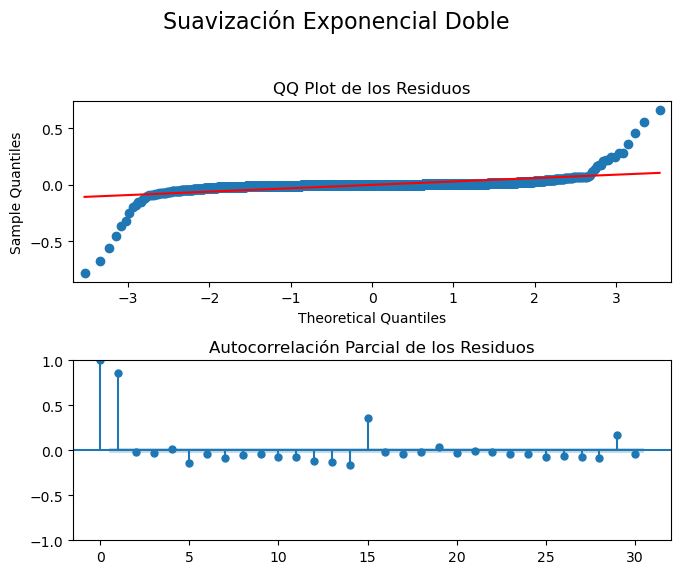

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [556]:
vola14_smooth2_train = firstsmooth(y=vola14_smooth1_train, lambda_=vola14_mejor_lambda)
vola14_metrica_DES_train = plot_residual_train('Suavización Exponencial Doble','DES', vola14_train_ts7, vola14_smooth2_train)

A continuación se realizan las predicciones para el modelo de suavización exponencial doble sin usar librería: 

* **Ventana de 7 días ($\omega = 7)$**

In [557]:
vola14_smooth2_val7 = firstsmooth(y=vola14_smooth1_val7, lambda_=vola14_mejor_lambda)
vola14_smooth2_test7 = firstsmooth(y=vola14_smooth1_test7, lambda_=vola14_mejor_lambda)

vola14_y_hatDES_val7 = 2 * vola14_smooth1_val7 - vola14_smooth2_val7
vola14_y_hatDES_test7 = 2 * vola14_smooth1_test7 - vola14_smooth2_test7

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [558]:
plot_model(vola14_train_ts7[-200:], vola14_val_ts7, vola14_test_ts7, vola14_y_hatDES_val7, vola14_y_hatDES_test7, 'Suavización Exponencial Doble Ventana de 7 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [559]:
vola14_ljung_box_pval_des7, vola14_jarque_bera_pval_des7 = evaluate_residuals(vola14_test_ts7, vola14_y_hatDES_test7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [560]:
vola14_metrica_DES_test7 = metricas(vola14_test_ts7,vola14_y_hatDES_test7)
vola14_metrica_DES_test7.index = vola14_metrica_DES_test7.index.map({0: 'DES Prueba vola14 (τ = 7)'})
vola14_metrica_DES_test7['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_des7], index=vola14_metrica_DES_test7.index)
vola14_metrica_DES_test7['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_des7], index=vola14_metrica_DES_test7.index)
vola14_metrica_DES_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola14 (τ = 7),7.6418e-07,1.6%,0.0,0.0,61.04%,0.3511,0.7884


* **Ventana de 14 días ($\omega = 14)$**

In [561]:
vola14_smooth2_val14 = firstsmooth(y=vola14_smooth1_val14, lambda_=vola14_mejor_lambda)
vola14_smooth2_test14 = firstsmooth(y=vola14_smooth1_test14, lambda_=vola14_mejor_lambda)

vola14_y_hatDES_val14 = 2 * vola14_smooth1_val14 - vola14_smooth2_val14
vola14_y_hatDES_test14 = 2 * vola14_smooth1_test14 - vola14_smooth2_test14


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [562]:
plot_model(vola14_train_ts14[-200:], vola14_val_ts14, vola14_test_ts14, vola14_y_hatDES_val14, vola14_y_hatDES_test14, 'Suavización Exponencial Doble Ventana de 14 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [563]:
vola14_ljung_box_pval_des14, vola14_jarque_bera_pval_des14 = evaluate_residuals(vola14_test_ts14, vola14_y_hatDES_test14)


No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [564]:
vola14_metrica_DES_test14 = metricas(vola14_test_ts14, vola14_y_hatDES_test14)
vola14_metrica_DES_test14.index = vola14_metrica_DES_test14.index.map({0: 'DES Prueba vola14 (τ = 14)'})
vola14_metrica_DES_test14['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_des14], index=vola14_metrica_DES_test14.index)
vola14_metrica_DES_test14['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_des14], index=vola14_metrica_DES_test14.index)
vola14_metrica_DES_test14


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola14 (τ = 14),1.4721e-06,1.46%,0.0,0.0,67.47%,0.9543,0.5393


* **Ventana de 21 días ($\omega = 21)$**

In [565]:
vola14_smooth2_val21 = firstsmooth(y=vola14_smooth1_val21, lambda_=vola14_mejor_lambda)
vola14_smooth2_test21 = firstsmooth(y=vola14_smooth1_test21, lambda_=vola14_mejor_lambda)

vola14_y_hatDES_val21 = 2 * vola14_smooth1_val21 - vola14_smooth2_val21
vola14_y_hatDES_test21 = 2 * vola14_smooth1_test21 - vola14_smooth2_test21


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [566]:
plot_model(vola14_train_ts21[-200:], vola14_val_ts21, vola14_test_ts21, vola14_y_hatDES_val21, vola14_y_hatDES_test21, 'Suavización Exponencial Doble Ventana de 21 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [567]:
vola14_ljung_box_pval_des21, vola14_jarque_bera_pval_des21 = evaluate_residuals(vola14_test_ts21, vola14_y_hatDES_test21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [568]:
vola14_metrica_DES_test21 = metricas(vola14_test_ts21, vola14_y_hatDES_test21)
vola14_metrica_DES_test21.index = vola14_metrica_DES_test21.index.map({0: 'DES Prueba vola14 (τ = 21)'})
vola14_metrica_DES_test21['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_des21], index=vola14_metrica_DES_test21.index)
vola14_metrica_DES_test21['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_des21], index=vola14_metrica_DES_test21.index)
vola14_metrica_DES_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola14 (τ = 21),5.8221e-05,3.89%,0.0,0.0,97.34%,0.0044,0.0825


* **Ventana de 28 días ($\omega = 28)$**

In [569]:
vola14_smooth2_val28 = firstsmooth(y=vola14_smooth1_val28, lambda_=vola14_mejor_lambda)
vola14_smooth2_test28 = firstsmooth(y=vola14_smooth1_test28, lambda_=vola14_mejor_lambda)

vola14_y_hatDES_val28 = 2 * vola14_smooth1_val28 - vola14_smooth2_val28
vola14_y_hatDES_test28 = 2 * vola14_smooth1_test28 - vola14_smooth2_test28



Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [570]:
plot_model(vola14_train_ts28[-200:], vola14_val_ts28, vola14_test_ts28, vola14_y_hatDES_val28, vola14_y_hatDES_test28, 'Suavización Exponencial Doble Ventana de 28 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [571]:
vola14_ljung_box_pval_des28, vola14_jarque_bera_pval_des28 = evaluate_residuals(vola14_test_ts28, vola14_y_hatDES_test28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [572]:
vola14_metrica_DES_test28 = metricas(vola14_test_ts28, vola14_y_hatDES_test28)
vola14_metrica_DES_test28.index = vola14_metrica_DES_test28.index.map({0: 'DES Prueba vola14 (τ = 28)'})
vola14_metrica_DES_test28['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_des28], index=vola14_metrica_DES_test28.index)
vola14_metrica_DES_test28['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_des28], index=vola14_metrica_DES_test28.index)
vola14_metrica_DES_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola14 (τ = 28),0.0001,4.16%,0.0,0.0,91.72%,0.006,0.7977


#### <font color="#30143">Double Exponential Smoothing (Usando statsmodels.tsa.holtwinters)</font> 

La función `des_optimizer()` permite la optimización del modelo, ya que, ayudará a determinar el parámetro óptimo $\alpha$ y $\beta$ para conseguir el modelo que reduzca al mínimo la métrica `MAE`.

**ExponentialSmoothing(train, trend=trend)**: Inicializa un modelo de suavización exponencial, utilizando la serie temporal de entrenamiento train y el tipo de tendencia `(lineal o exponencial)` especificado en el parámetro `trend`.

**.fit(smoothing_level=alpha, smoothing_slope=beta)**: Ajusta el modelo a los datos de entrenamiento. Los parámetros `smoothing_level` y `smoothing_slope` determinan el `grado de suavizado` de la serie temporal y de la `tendencia`, respectivamente, tomando como valores los parámetros `alpha` y `beta`.

In [573]:
def des_optimizer(train, val, alphas, betas, trend, step):

    best_alpha, best_beta, best_mae = None, None, float("inf")

    for alpha in alphas:
        for beta in betas:
            des_model = ExponentialSmoothing(train, trend=trend).fit(smoothing_level=alpha, smoothing_slope=beta)
            y_pred = des_model.forecast(step)
            mae = mean_absolute_error(val, y_pred)
            if mae < best_mae:
                best_alpha, best_beta, best_mae = alpha, beta, mae

    return best_alpha, best_beta, best_mae

In [574]:
def des_model_tuning(train, val, test, step_val, step_test, trend, title="Model Tuning - Double Exponential Smoothing"):
    alphas = np.arange(0.01, 1, 0.1)
    betas = np.arange(0.01, 1, 0.1)
    
    best_alpha, best_beta, best_mae = des_optimizer(train, val, alphas, betas, trend=trend, step=step_val)

    train_val = pd.concat([train, val])
    final_model = ExponentialSmoothing(train_val, trend=trend).fit(smoothing_level=best_alpha, smoothing_slope=best_beta)

    # Predicciones para validación y test
    y_pred_val = final_model.forecast(step_val)  # Predicciones para validación
    y_pred_test = final_model.forecast(step_test)  # Predicciones para test

    y_pred_val.index = val.index
    y_pred_test.index = test.index

    plot_model(train, val, test, y_pred_val, y_pred_test, title)

    return y_pred_val, y_pred_test

In [575]:
def des_model_tuning_train(train, val, test, step_val, step_test, trend, title="Model Tuning - Double Exponential Smoothing"):
    alphas = np.arange(0.01, 1, 0.1)
    betas = np.arange(0.01, 1, 0.1)
    
    best_alpha, best_beta, best_mae = des_optimizer(train, val, alphas, betas, trend=trend, step=step_val)

    train_val = pd.concat([train, val])
    final_model = ExponentialSmoothing(train_val, trend=trend).fit(smoothing_level=best_alpha, smoothing_slope=best_beta)

    # Predicciones para validación y test
    y_pred_val = final_model.forecast(step_val)  # Predicciones para validación
    y_pred_test = final_model.forecast(step_test)  # Predicciones para test

    y_pred_val.index = val.index
    y_pred_test.index = test.index

    return y_pred_val, y_pred_test

* Análisis de residuos conjunto de entrenamiento: 

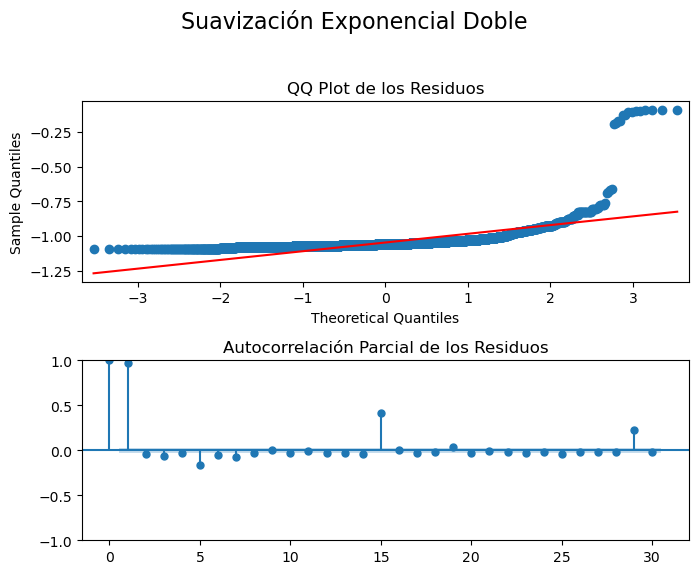

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [576]:
vola14_predicciones, vola14_y_pred_HW2_val_7 = des_model_tuning_train(vola14_train_ts7[-200:], vola14_train_ts7, vola14_val_ts7, step_val=len(vola14_train_ts7), step_test=len(vola14_val_ts7), trend='add')
vola14_y_pred_HW1_train_7 = pd.Series(vola14_predicciones.mean(), index=vola14_train_ts7.index[-1:])  # Esto crea una serie con la media y un índice
vola14_y_pred_HW1_train_7 = pd.Series([vola14_predicciones.mean()] * len(vola14_train_ts7), index=vola14_train_ts7.index)
vola14_y_pred_HW1_train_7_df = pd.DataFrame(vola14_y_pred_HW1_train_7, columns=['vola14_Predicciones'])

vola14_metrica_HW2_train =plot_residual_train('Suavización Exponencial Doble','DES HW' , vola14_train_ts7, vola14_y_pred_HW1_train_7)

A continuación se realizan las predicciones para el modelo de suavización exponencial Holt-Winters: 

* **Ventana de 7 días ($\omega = 7)$**

In [577]:
vola14_y_pred_HW2_val_7, vola14_y_pred_HW2_test_7  = des_model_tuning(vola14_train_ts7[-200:], vola14_val_ts7, vola14_test_ts7, step_val=vola14_tau_val7, step_test=vola14_tau_test7, trend='add')

In [578]:
vola14_metrica_DES_HW_val7 = metricas(vola14_val_ts7,vola14_y_pred_HW2_val_7)
vola14_metrica_DES_HW_val7.index = vola14_metrica_DES_HW_val7.index.map({0: 'DES HW Val vola14 (τ = 7)'})
vola14_metrica_DES_HW_val7

,SSE,MAPE,MAD,MSD,R2
DES HW Val vola14 (τ = 7),9.5055e-05,16.39%,0.0,0.0,-1160.59%


In [579]:
vola14_metrica_DES_HW_test7 = metricas(vola14_test_ts7,vola14_y_pred_HW2_test_7)
vola14_metrica_DES_HW_test7.index = vola14_metrica_DES_HW_test7.index.map({0: 'DES HW Prueba vola14 (τ = 7)'})
vola14_metrica_DES_HW_test7

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola14 (τ = 7),4.6918e-05,14.41%,0.0,0.0,-2291.8%


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [580]:
vola14_ljung_box_pval_des_hw7, vola14_jarque_bera_pval_des_hw7 = evaluate_residuals(vola14_test_ts7, vola14_y_pred_HW2_test_7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [581]:
vola14_metrica_DES_HW_test7['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_des_hw7], index=vola14_metrica_DES_HW_test7.index)
vola14_metrica_DES_HW_test7['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_des_hw7], index=vola14_metrica_DES_HW_test7.index)
vola14_metrica_DES_HW_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola14 (τ = 7),4.6918e-05,14.41%,0.0,0.0,-2291.8%,0.1196,0.5881


* **Ventana de 14 días ($\omega = 14)$**

In [582]:
vola14_y_pred_HW2_val_14, vola14_y_pred_HW2_test_14 = des_model_tuning(vola14_train_ts14[-200:], vola14_val_ts14, vola14_test_ts14, step_val=vola14_tau_val14, step_test=vola14_tau_test14, trend='add')


In [583]:
vola14_metrica_DES_HW_val14 = metricas(vola14_val_ts14, vola14_y_pred_HW2_val_14)
vola14_metrica_DES_HW_val14.index = vola14_metrica_DES_HW_val14.index.map({0: 'DES HW Val vola14 (τ = 14)'})
vola14_metrica_DES_HW_val14


,SSE,MAPE,MAD,MSD,R2
DES HW Val vola14 (τ = 14),0.0011,46.54%,0.01,0.0,-736.49%


In [584]:
vola14_metrica_DES_HW_test14 = metricas(vola14_test_ts14, vola14_y_pred_HW2_test_14)
vola14_metrica_DES_HW_test14.index = vola14_metrica_DES_HW_test14.index.map({0: 'DES HW Prueba vola14 (τ = 14)'})
vola14_metrica_DES_HW_test14


,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola14 (τ = 14),0.0007,38.2%,0.01,0.0,-14912.19%


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [585]:
vola14_ljung_box_pval_des_hw14, vola14_jarque_bera_pval_des_hw14 = evaluate_residuals(vola14_test_ts14, vola14_y_pred_HW2_test_14)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [586]:
vola14_metrica_DES_HW_test14['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_des_hw14], index=vola14_metrica_DES_HW_test14.index)
vola14_metrica_DES_HW_test14['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_des_hw14], index=vola14_metrica_DES_HW_test14.index)
vola14_metrica_DES_HW_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola14 (τ = 14),0.0007,38.2%,0.01,0.0,-14912.19%,0.0016,0.6409


* **Ventana de 21 días ($\omega = 21)$**

In [587]:
vola14_y_pred_HW2_val_21, vola14_y_pred_HW2_test_21 = des_model_tuning(vola14_train_ts21[-200:], vola14_val_ts21, vola14_test_ts21, step_val=vola14_tau_val21, step_test=vola14_tau_test21, trend='add')



In [588]:
vola14_metrica_DES_HW_val21 = metricas(vola14_val_ts21, vola14_y_pred_HW2_val_21)
vola14_metrica_DES_HW_val21.index = vola14_metrica_DES_HW_val21.index.map({0: 'DES HW Val vola14 (τ = 21)'})
vola14_metrica_DES_HW_val21


,SSE,MAPE,MAD,MSD,R2
DES HW Val vola14 (τ = 21),0.0005,23.37%,0.0,0.0,-207.44%


In [589]:
vola14_metrica_DES_HW_test21 = metricas(vola14_test_ts21, vola14_y_pred_HW2_test_21)
vola14_metrica_DES_HW_test21.index = vola14_metrica_DES_HW_test21.index.map({0: 'DES HW Prueba vola14 (τ = 21)'})
vola14_metrica_DES_HW_test21

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola14 (τ = 21),0.0073,42.55%,0.01,0.0,-232.68%


A continuación realizamos un análisis sobre los residuales de nuestro conjunto de prueba (test)

In [590]:
vola14_ljung_box_pval_des_hw21, vola14_jarque_bera_pval_des_hw21 = evaluate_residuals(vola14_test_ts21, vola14_y_pred_HW2_test_21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [591]:
vola14_metrica_DES_HW_test21['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_des_hw21], index=vola14_metrica_DES_HW_test21.index)
vola14_metrica_DES_HW_test21['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_des_hw21], index=vola14_metrica_DES_HW_test21.index)
vola14_metrica_DES_HW_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola14 (τ = 21),0.0073,42.55%,0.01,0.0,-232.68%,1.0387e-05,0.3167


* **Ventana de 28 días ($\omega = 28)$**

In [592]:
vola14_y_pred_HW2_val_28, vola14_y_pred_HW2_test_28 = des_model_tuning(vola14_train_ts28[-200:], vola14_val_ts28, vola14_test_ts28, step_val=vola14_tau_val28, step_test=vola14_tau_test28, trend='add')



In [593]:
vola14_metrica_DES_HW_val28 = metricas(vola14_val_ts28, vola14_y_pred_HW2_val_28)
vola14_metrica_DES_HW_val28.index = vola14_metrica_DES_HW_val28.index.map({0: 'DES HW Val vola14 (τ = 28)'})
vola14_metrica_DES_HW_val28


,SSE,MAPE,MAD,MSD,R2
DES HW Val vola14 (τ = 28),0.0003,13.8%,0.0,0.0,-95.51%


In [594]:
vola14_metrica_DES_HW_test28 = metricas(vola14_test_ts28, vola14_y_pred_HW2_test_28)
vola14_metrica_DES_HW_test28.index = vola14_metrica_DES_HW_test28.index.map({0: 'DES HW Prueba vola14 (τ = 28)'})
vola14_metrica_DES_HW_test28

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola14 (τ = 28),0.0152,57.25%,0.02,0.0,-1102.74%


A continuación realizamos un análisis sobre los residuales de nuestro conjunto de prueba (test)

In [595]:
vola14_ljung_box_pval_des_hw28, vola14_jarque_bera_pval_des_hw28 = evaluate_residuals(vola14_test_ts28, vola14_y_pred_HW2_test_28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [596]:
vola14_metrica_DES_HW_test28['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_des_hw28], index=vola14_metrica_DES_HW_test28.index)
vola14_metrica_DES_HW_test28['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_des_hw28], index=vola14_metrica_DES_HW_test28.index)
vola14_metrica_DES_HW_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola14 (τ = 28),0.0152,57.25%,0.02,0.0,-1102.74%,6.3206e-05,0.1807


#### <font color="#30143">ARIMA (Usando Rolling)</font> 

A continuación se define función de ajuste del modelo y predicciones ARIMA.

In [597]:
def arima_model_fit(train):
    """
    Ajusta un modelo ARIMA a los datos de entrenamiento y selecciona el mejor modelo basado en el AIC.
    La función recibe los conjuntos de datos `train` y `val`.

    :param train: Conjunto de datos de entrenamiento (serie temporal).
    :param val: Conjunto de datos de validación (opcional, para verificar el rendimiento del modelo).
    :return: El modelo ajustado, el mejor AIC, el mejor orden (p, d, q) y los datos de entrenamiento.
    """
    model_filename = 'vola14_best_arima_model.pkl'
    
    # Si el mejor modelo ya existe, cargarlo y evitar volver a ejecutar el ciclo for
    if os.path.exists(model_filename):
        print(f"Mejor modelo ya existe. Cargando desde {model_filename}.")
        with open(model_filename, 'rb') as f:
            best_model_global = pickle.load(f)
        return best_model_global, None, None

    # Inicializamos el mejor AIC y BIC en infinito
    best_aic = np.inf
    best_bic = np.inf
    best_order = None
    best_mdl = None
   
    # Rango de p, d, q para probar diferentes combinaciones
    pq_rng = range(3)  # Esto es para p y q (máximo 2)
    d_rng  = range(2)  # Esto es para d (máximo 1)

    # Iterar sobre los valores posibles de p, d y q
    for p in pq_rng:
        for d in d_rng:
            for q in pq_rng:
                try:
                    # Ajustar el modelo ARIMA para los valores de p, d, q
                    tmp_mdl = ARIMA(train, order=(p, d, q)).fit()
                    tmp_aic = tmp_mdl.aic  # Obtener el AIC del modelo ajustado
                    
                    # Si el AIC actual es mejor, actualizar los mejores valores
                    if tmp_aic < best_aic:
                        best_aic = tmp_aic
                        best_order = (p, d, q)
                        best_mdl = tmp_mdl
                except Exception as e:
                    print(f"Error ajustando ARIMA({p},{d},{q}): {e}")
                    continue  # Si hay un error, continuar con el siguiente intento

    # Imprimir los resultados del mejor modelo encontrado
    print(f"\nMejor modelo ARIMA:")
    print(f'Best AIC: {best_aic}')
    print(f'Best Order: {best_order}')
    print(f'aic: {best_aic:6.5f} | order: {best_order}')

    # Ajustar el modelo ARIMA final con el mejor orden
    model = ARIMA(train, order=best_order)
    model_fit = model.fit()

    # Guardar el mejor modelo en un archivo con pickle
    with open('vola14_best_arima_model.pkl', 'wb') as f:
        pickle.dump(best_mdl, f)
    print(f"\nMejor modelo ARIMA guardado con AIC {best_aic}")

    # Retornar el modelo ajustado, el mejor AIC y el mejor orden
    return model_fit, best_aic, best_order

A continuación se define la función `arima_rolling()`

In [598]:
def arima_rolling(history, val, best_order): # arima_rolling(train.tolist(), val, test_nd, best_order)
    
    predictions = list()
    for t in range(len(val)):
        model = ARIMA(history, order=best_order)
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = val[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat, obs))
        
    return predictions

La siguiente función devuelve los parámetros `p`, `d`, `q` que definen `el mejor modelo ARIMA` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste. Además, proporciona los resultados del modelo `ARIMA ajustado` para `datos de entrenamiento`, incluyendo las `fechas` correspondientes. También incluye los datos y fechas del modelo `ARIMA de prueba`, aunque estos últimos dos no son directamente visibles en la salida de la función.


Indexación de parámetros para la función `arima_model_fit()`

In [599]:
vola14_model_fit, vola14_best_aic, vola14_best_order = arima_model_fit(vola14_train_ts7)
vola14_best_order = vola14_model_fit.model.order


Mejor modelo ARIMA:
Best AIC: -26501.05720655398
Best Order: (2, 0, 2)
aic: -26501.05721 | order: (2, 0, 2)

Mejor modelo ARIMA guardado con AIC -26501.05720655398


In [600]:
print(vola14_best_order)

(2, 0, 2)


A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

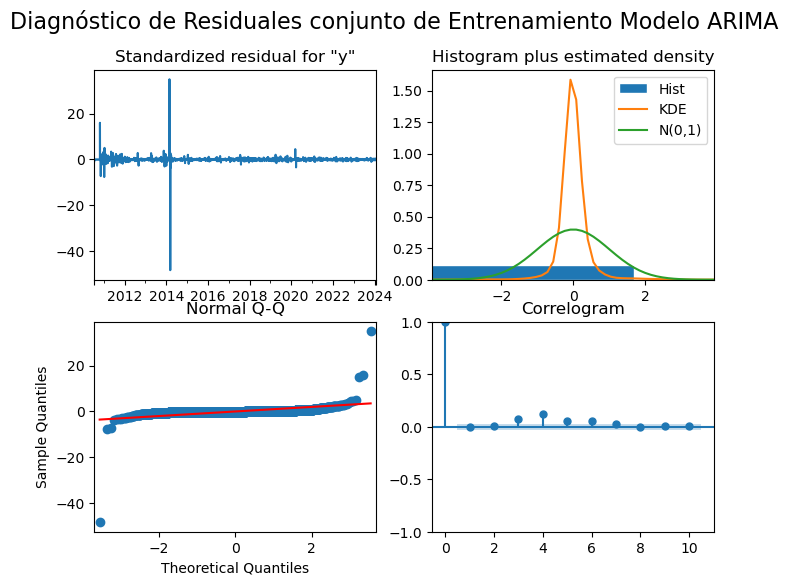

In [601]:
vola14_model_fit.plot_diagnostics(figsize=(8, 6))
plt.suptitle('Diagnóstico de Residuales conjunto de Entrenamiento Modelo ARIMA', fontsize=16)
plt.show()

In [602]:
vola14_residuos_train_arima = vola14_model_fit.resid
vola14_ljung_box_pval_arima_train, vola14_jarque_bera_pval_arima_train = evaluate_residuals_train_arima(vola14_residuos_train_arima)

Ljung-Box LB Statistic: 0.004265
Ljung-Box p-value: 0.947930
No se rechaza H0: los residuales son independientes (no correlacionados).
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [603]:
# Extraer predicciones para todo el conjunto de entrenamiento sin estandarizar 
vola14_predicciones = vola14_model_fit.get_prediction(start=0, end=len(vola14_train_ts7)-1, dynamic=False)
vola14_yhvola14_arima_train = vola14_predicciones.predicted_mean

vola14_yhvola14_arima_train.index = vola14_train_ts7.index # yhvola14_arima_train mismo índice que price_train_ts7

#calcular las métricas 
vola14_metrica_arima_train = metricas(vola14_train_ts7,vola14_yhvola14_arima_train)
vola14_metrica_arima_train.index = vola14_metrica_arima_train.index.map({0: 'Arima Entrenamiento vola14'})
vola14_metrica_arima_train['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_arima_train], index=vola14_metrica_arima_train.index)
vola14_metrica_arima_train['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_arima_train], index=vola14_metrica_arima_train.index)
vola14_metrica_arima_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Entrenamiento vola14,1.3565,8.68%,0.0,0.0,93.05%,0.9479,0.0


La función `arima_rolling()` devuelve las prediciones, con base a los parámetros `p`, `d`, `q` que definen `el mejor modelo ARIMA` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste, aprovechando datos históricos para pronosticar continuamente la concentración de PM10 durante un período (horizonte) específico.

A continuación se indexan los parámetros de la función `arima_rolling()` para las ventanas de 7, 14, 21 y 28 días para la predicción sobre los datos de `validación` y `prueba`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [604]:
# best_aic_arima = best_ order
vola14_val_l7 = vola14_val_ts7.tolist()
vola14_train_l7 = vola14_train_ts7.tolist()
vola14_yhvola14_val_arimarolling7  = arima_rolling(vola14_train_l7, vola14_val_l7, vola14_best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola14_yhvola14_val_arimarolling7 = pd.Series(vola14_yhvola14_val_arimarolling7, index=vola14_val_ts7.index)  # Indexa las fechas de price_val_ts7

predicted=0.023626, expected=0.023534
predicted=0.024164, expected=0.023334
predicted=0.024341, expected=0.023328
predicted=0.023977, expected=0.021258
predicted=0.022156, expected=0.021202
predicted=0.021901, expected=0.021286
predicted=0.022277, expected=0.021504


* **Predicciones datos de Prueba**: 

In [605]:
# best_aic_arima = best_ order
vola14_test_l7 = vola14_test_ts7.tolist()
vola14_train_l7 = vola14_train_ts7.tolist()
vola14_yhvola14_test_arimarolling7  = arima_rolling(vola14_train_l7, vola14_test_l7, vola14_best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola14_yhvola14_test_arimarolling7 = pd.Series(vola14_yhvola14_test_arimarolling7, index=vola14_test_ts7.index)  # Indexa las fechas de price_test_ts7

predicted=0.023626, expected=0.015830
predicted=0.016392, expected=0.015841
predicted=0.016730, expected=0.017026
predicted=0.018353, expected=0.017096
predicted=0.018048, expected=0.016051
predicted=0.017119, expected=0.016094
predicted=0.017086, expected=0.015765


In [606]:
plot_model(vola14_train_ts7[-100:], vola14_val_ts7, vola14_test_ts7, vola14_yhvola14_val_arimarolling7, vola14_yhvola14_test_arimarolling7, title="Predicciones usando ARIMA rolling ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [607]:
vola14_ljung_box_pval_arimarol7, vola14_jarque_bera_pval_arimarol7 = evaluate_residuals(vola14_test_ts7, vola14_yhvola14_test_arimarolling7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [608]:
vola14_metrica_arimarol_test7 = metricas(vola14_test_ts7,vola14_yhvola14_test_arimarolling7)
vola14_metrica_arimarol_test7.index = vola14_metrica_arimarol_test7.index.map({0: 'Arima Rolling Prueba vola14 (τ = 7)'})
vola14_metrica_arimarol_test7['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_arimarol7], index=vola14_metrica_arimarol_test7.index)
vola14_metrica_arimarol_test7['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_arimarol7], index=vola14_metrica_arimarol_test7.index)
vola14_metrica_arimarol_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola14 (τ = 7),6.9535e-05,12.72%,0.0,0.0,-3444.75%,0.8223,0.1214


* **Ventana de 14 días ($\omega = 14)$**

* **Datos de Validación**: 

In [609]:
# best_aic_arima = best_ order
vola14_val_l14 = vola14_val_ts14.tolist()
vola14_train_l14 = vola14_train_ts14.tolist()
vola14_yhvola14_val_arimarolling14 = arima_rolling(vola14_train_l14, vola14_val_l14, vola14_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola14_yhvola14_val_arimarolling14 = pd.Series(vola14_yhvola14_val_arimarolling14, index=vola14_val_ts14.index)  # Indexa las fechas de price_val_ts14


predicted=0.023626, expected=0.023534
predicted=0.024164, expected=0.023334
predicted=0.024341, expected=0.023328
predicted=0.023977, expected=0.021258
predicted=0.022156, expected=0.021202
predicted=0.021901, expected=0.021286
predicted=0.022277, expected=0.021504
predicted=0.022297, expected=0.015830
predicted=0.016697, expected=0.015841
predicted=0.016568, expected=0.017026
predicted=0.018494, expected=0.017096
predicted=0.018014, expected=0.016051
predicted=0.017165, expected=0.016094
predicted=0.017109, expected=0.015765


* **Predicciones datos de Prueba**: 

In [610]:
# best_aic_arima = best_ order
vola14_test_l14 = vola14_test_ts14.tolist()
vola14_train_l14 = vola14_train_ts14.tolist()
vola14_yhvola14_test_arimarolling14 = arima_rolling(vola14_train_l14, vola14_test_l14, vola14_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola14_yhvola14_test_arimarolling14 = pd.Series(vola14_yhvola14_test_arimarolling14, index=vola14_test_ts14.index)  # Indexa las fechas de price_test_ts14

predicted=0.023626, expected=0.016219
predicted=0.016783, expected=0.015925
predicted=0.016807, expected=0.016890
predicted=0.018104, expected=0.017182
predicted=0.018158, expected=0.017098
predicted=0.018201, expected=0.017549
predicted=0.018552, expected=0.016311
predicted=0.017382, expected=0.016993
predicted=0.017965, expected=0.016990
predicted=0.018138, expected=0.017328
predicted=0.018291, expected=0.017979
predicted=0.019105, expected=0.016272
predicted=0.017246, expected=0.016404
predicted=0.017403, expected=0.016346


In [611]:
plot_model(vola14_train_ts14[-100:], vola14_val_ts14, vola14_test_ts14, vola14_yhvola14_val_arimarolling14, vola14_yhvola14_test_arimarolling14, title="Predicciones usando ARIMA rolling ventana de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [612]:
vola14_ljung_box_pval_arimarol14, vola14_jarque_bera_pval_arimarol14 = evaluate_residuals(vola14_test_ts14, vola14_yhvola14_test_arimarolling14)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [613]:
vola14_metrica_arimarol_test14 = metricas(vola14_test_ts14, vola14_yhvola14_test_arimarolling14)
vola14_metrica_arimarol_test14.index = vola14_metrica_arimarol_test14.index.map({0: 'Arima Rolling Prueba vola14 (τ = 14)'})
vola14_metrica_arimarol_test14['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_arimarol14], index=vola14_metrica_arimarol_test14.index)
vola14_metrica_arimarol_test14['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_arimarol14], index=vola14_metrica_arimarol_test14.index)
vola14_metrica_arimarol_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola14 (τ = 14),7.4725e-05,8.86%,0.0,0.0,-1551.38%,0.7548,4.8605e-08


* **Ventana de 21 días ($\omega = 21)$**

* **Datos de Validación**: 

In [614]:
# best_aic_arima = best_ order
vola14_val_l21 = vola14_val_ts21.tolist()
vola14_train_l21 = vola14_train_ts21.tolist()
vola14_yhvola14_val_arimarolling21 = arima_rolling(vola14_train_l21, vola14_val_l21, vola14_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola14_yhvola14_val_arimarolling21 = pd.Series(vola14_yhvola14_val_arimarolling21, index=vola14_val_ts21.index)  # Indexa las fechas de price_val_ts21



predicted=0.023626, expected=0.023534
predicted=0.024164, expected=0.023334
predicted=0.024341, expected=0.023328
predicted=0.023977, expected=0.021258
predicted=0.022156, expected=0.021202
predicted=0.021901, expected=0.021286
predicted=0.022277, expected=0.021504
predicted=0.022297, expected=0.015830
predicted=0.016697, expected=0.015841
predicted=0.016568, expected=0.017026
predicted=0.018494, expected=0.017096
predicted=0.018014, expected=0.016051
predicted=0.017165, expected=0.016094
predicted=0.017109, expected=0.015765
predicted=0.016925, expected=0.016219
predicted=0.017243, expected=0.015925
predicted=0.017067, expected=0.016890
predicted=0.017917, expected=0.017182
predicted=0.018349, expected=0.017098
predicted=0.018043, expected=0.017549
predicted=0.018603, expected=0.016311


* **Predicciones datos de Prueba**: 

In [615]:
# best_aic_arima = best_ order
vola14_test_l21 = vola14_test_ts21.tolist()
vola14_train_l21 = vola14_train_ts21.tolist()
vola14_yhvola14_test_arimarolling21 = arima_rolling(vola14_train_l21, vola14_test_l21, vola14_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola14_yhvola14_test_arimarolling21 = pd.Series(vola14_yhvola14_test_arimarolling21, index=vola14_test_ts21.index)  # Indexa las fechas de price_test_ts21


predicted=0.023626, expected=0.016993
predicted=0.017565, expected=0.016990
predicted=0.017901, expected=0.017328
predicted=0.018550, expected=0.017979
predicted=0.018878, expected=0.016272
predicted=0.017342, expected=0.016404
predicted=0.017312, expected=0.016346
predicted=0.017556, expected=0.019491
predicted=0.020491, expected=0.021972
predicted=0.023185, expected=0.030715
predicted=0.031561, expected=0.031979
predicted=0.032995, expected=0.031959
predicted=0.032068, expected=0.031809
predicted=0.032493, expected=0.031806
predicted=0.032123, expected=0.035814
predicted=0.036449, expected=0.042571
predicted=0.043093, expected=0.042361
predicted=0.042630, expected=0.041616
predicted=0.041445, expected=0.040644
predicted=0.040824, expected=0.040949
predicted=0.040926, expected=0.040780


In [616]:
plot_model(vola14_train_ts21[-100:], vola14_val_ts21, vola14_test_ts21, vola14_yhvola14_val_arimarolling21, vola14_yhvola14_test_arimarolling21, title="Predicciones usando ARIMA rolling ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [617]:
vola14_ljung_box_pval_arimarol21, vola14_jarque_bera_pval_arimarol21 = evaluate_residuals(vola14_test_ts21, vola14_yhvola14_test_arimarolling21)


No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [618]:
vola14_metrica_arimarol_test21 = metricas(vola14_test_ts21, vola14_yhvola14_test_arimarolling21)
vola14_metrica_arimarol_test21.index = vola14_metrica_arimarol_test21.index.map({0: 'Arima Rolling Prueba vola14 (τ = 21)'})
vola14_metrica_arimarol_test21['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_arimarol21], index=vola14_metrica_arimarol_test21.index)
vola14_metrica_arimarol_test21['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_arimarol21], index=vola14_metrica_arimarol_test21.index)
vola14_metrica_arimarol_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola14 (τ = 21),0.0002,7.46%,0.0,0.0,92.16%,0.2529,0.1335


* **Ventana de 28 días ($\omega = 28)$**

* **Datos de Validación**: 

In [619]:
# best_aic_arima = best_ order
vola14_val_l28 = vola14_val_ts28.tolist()
vola14_train_l28 = vola14_train_ts28.tolist()
vola14_yhvola14_val_arimarolling28 = arima_rolling(vola14_train_l28, vola14_val_l28, vola14_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola14_yhvola14_val_arimarolling28 = pd.Series(vola14_yhvola14_val_arimarolling28, index=vola14_val_ts28.index)  # Indexa las fechas de price_val_ts28


predicted=0.023626, expected=0.023534
predicted=0.024164, expected=0.023334
predicted=0.024341, expected=0.023328
predicted=0.023977, expected=0.021258
predicted=0.022156, expected=0.021202
predicted=0.021901, expected=0.021286
predicted=0.022277, expected=0.021504
predicted=0.022297, expected=0.015830
predicted=0.016697, expected=0.015841
predicted=0.016568, expected=0.017026
predicted=0.018494, expected=0.017096
predicted=0.018014, expected=0.016051
predicted=0.017165, expected=0.016094
predicted=0.017109, expected=0.015765
predicted=0.016925, expected=0.016219
predicted=0.017243, expected=0.015925
predicted=0.017067, expected=0.016890
predicted=0.017917, expected=0.017182
predicted=0.018349, expected=0.017098
predicted=0.018043, expected=0.017549
predicted=0.018603, expected=0.016311
predicted=0.017308, expected=0.016993
predicted=0.017966, expected=0.016990
predicted=0.018136, expected=0.017328
predicted=0.018280, expected=0.017979
predicted=0.019061, expected=0.016272
predicted=0.

* **Predicciones datos de Prueba**: 

In [620]:
# best_aic_arima = best_ order
vola14_test_l28 = vola14_test_ts28.tolist()
vola14_train_l28 = vola14_train_ts28.tolist()
vola14_yhvola14_test_arimarolling28 = arima_rolling(vola14_train_l28, vola14_test_l28, vola14_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola14_yhvola14_test_arimarolling28 = pd.Series(vola14_yhvola14_test_arimarolling28, index=vola14_test_ts28.index)  # Indexa las fechas de price_test_ts28

predicted=0.023626, expected=0.019491
predicted=0.020093, expected=0.021972
predicted=0.022939, expected=0.030715
predicted=0.031811, expected=0.031979
predicted=0.032823, expected=0.031959
predicted=0.032184, expected=0.031809
predicted=0.032434, expected=0.031806
predicted=0.032169, expected=0.035814
predicted=0.036379, expected=0.042571
predicted=0.043106, expected=0.042361
predicted=0.042587, expected=0.041616
predicted=0.041501, expected=0.040644
predicted=0.040844, expected=0.040949
predicted=0.040956, expected=0.040780
predicted=0.041004, expected=0.040342
predicted=0.040386, expected=0.040322
predicted=0.040498, expected=0.033655
predicted=0.033724, expected=0.033822
predicted=0.033871, expected=0.035224
predicted=0.035957, expected=0.039550
predicted=0.039780, expected=0.041044
predicted=0.041540, expected=0.035099
predicted=0.034991, expected=0.037640
predicted=0.037790, expected=0.044544
predicted=0.045205, expected=0.045543
predicted=0.045591, expected=0.045630
predicted=0.

In [621]:
plot_model(vola14_train_ts28[-100:], vola14_val_ts28, vola14_test_ts28, vola14_yhvola14_val_arimarolling28, vola14_yhvola14_test_arimarolling28, title="Predicciones usando ARIMA rolling ventana de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [622]:
vola14_ljung_box_pval_arimarol28, vola14_jarque_bera_pval_arimarol28 = evaluate_residuals(vola14_test_ts28, vola14_yhvola14_test_arimarolling28)


No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [623]:
vola14_metrica_arimarol_test28 = metricas(vola14_test_ts28, vola14_yhvola14_test_arimarolling28)
vola14_metrica_arimarol_test28.index = vola14_metrica_arimarol_test28.index.map({0: 'Arima Rolling Prueba vola14 (τ = 28)'})
vola14_metrica_arimarol_test28['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_arimarol28], index=vola14_metrica_arimarol_test28.index)
vola14_metrica_arimarol_test28['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_arimarol28], index=vola14_metrica_arimarol_test28.index)
vola14_metrica_arimarol_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola14 (τ = 28),0.0003,6.34%,0.0,0.0,76.36%,0.6921,0.7144


#### <font color="#30143">ARIMA (Sin Rolling)</font> 

A continuación se procede con la predicción del precio del bitcoin usando `forecast()`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [624]:
vola14_yhvola14_val_arima7 = vola14_model_fit.forecast(steps=len(vola14_val_ts7))
print(vola14_yhvola14_val_arima7)

2024-01-29    0.0236
2024-01-30    0.0243
2024-01-31    0.0253
2024-02-01    0.0259
2024-02-02    0.0268
2024-02-03    0.0274
2024-02-04    0.0282
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [625]:
vola14_yhvola14_test_arima7 = vola14_model_fit.forecast(steps=len(vola14_test_ts7))
vola14_yhvola14_test_arima7 = pd.Series(vola14_yhvola14_test_arima7)
vola14_yhvola14_test_arima7.index = vola14_test_ts7.index # Asigna el índice de las fechas de price_test_ts7
print(vola14_yhvola14_test_arima7)


Date
2024-02-05    0.0236
2024-02-06    0.0243
2024-02-07    0.0253
2024-02-08    0.0259
2024-02-09    0.0268
2024-02-10    0.0274
2024-02-11    0.0282
Name: predicted_mean, dtype: float64


In [626]:
plot_model(vola14_train_ts7[-200:], vola14_val_ts7, vola14_test_ts7, vola14_yhvola14_val_arima7, vola14_yhvola14_test_arima7, title="Predicciones usando ARIMA ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [627]:
vola14_ljung_box_pval_arima7, vola14_jarque_bera_pval_arima7 = evaluate_residuals(vola14_test_ts7, vola14_yhvola14_test_arima7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [628]:
vola14_metrica_arima_test7 = metricas(vola14_test_ts7,vola14_yhvola14_test_arima7)
vola14_metrica_arima_test7.index = vola14_metrica_arima_test7.index.map({0: 'Arima prueba vola14 (τ = 7)'})
vola14_metrica_arima_test7['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_arima7], index=vola14_metrica_arima_test7.index)
vola14_metrica_arima_test7['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_arima7], index=vola14_metrica_arima_test7.index)
vola14_metrica_arima_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola14 (τ = 7),0.0007,59.83%,0.01,0.0,-34385.0%,0.0692,0.6724


* **Ventana de 14 días ($\omega = 14)$**

* **Predicciones datos de Validación**: 

In [629]:
vola14_yhvola14_val_arima14 = vola14_model_fit.forecast(steps=len(vola14_val_ts14))
print(vola14_yhvola14_val_arima14)


2024-01-29    0.0236
2024-01-30    0.0243
2024-01-31    0.0253
2024-02-01    0.0259
2024-02-02    0.0268
2024-02-03    0.0274
2024-02-04    0.0282
2024-02-05    0.0288
2024-02-06    0.0295
2024-02-07    0.0301
2024-02-08    0.0307
2024-02-09    0.0312
2024-02-10    0.0318
2024-02-11    0.0323
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [630]:
vola14_yhvola14_test_arima14 = vola14_model_fit.forecast(steps=len(vola14_test_ts14))
vola14_yhvola14_test_arima14 = pd.Series(vola14_yhvola14_test_arima14)
vola14_yhvola14_test_arima14.index = vola14_test_ts14.index  # Asigna el índice de las fechas de price_test_ts14
print(vola14_yhvola14_test_arima14)


Date
2024-02-12    0.0236
2024-02-13    0.0243
2024-02-14    0.0253
2024-02-15    0.0259
2024-02-16    0.0268
2024-02-17    0.0274
2024-02-18    0.0282
2024-02-19    0.0288
2024-02-20    0.0295
2024-02-21    0.0301
2024-02-22    0.0307
2024-02-23    0.0312
2024-02-24    0.0318
2024-02-25    0.0323
Name: predicted_mean, dtype: float64


In [631]:
plot_model(vola14_train_ts14[-200:], vola14_val_ts14, vola14_test_ts14, vola14_yhvola14_val_arima14, vola14_yhvola14_test_arima14, title="Predicciones usando ARIMA ventana de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [632]:
vola14_ljung_box_pval_arima14, vola14_jarque_bera_pval_arima14 = evaluate_residuals(vola14_test_ts14, vola14_yhvola14_test_arima14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [633]:
vola14_metrica_arima_test14 = metricas(vola14_test_ts14, vola14_yhvola14_test_arima14)
vola14_metrica_arima_test14.index = vola14_metrica_arima_test14.index.map({0: 'Arima prueba vola14 (τ = 14)'})
vola14_metrica_arima_test14['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_arima14], index=vola14_metrica_arima_test14.index)
vola14_metrica_arima_test14['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_arima14], index=vola14_metrica_arima_test14.index)
vola14_metrica_arima_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola14 (τ = 14),0.0019,68.26%,0.01,0.0,-42806.43%,0.0016,0.6443


* **Ventana de 21 días ($\omega = 21)$**

* **Predicciones datos de Validación**: 

In [634]:
vola14_yhvola14_val_arima21 = vola14_model_fit.forecast(steps=len(vola14_val_ts21))
print(vola14_yhvola14_val_arima21)


2024-01-29    0.0236
2024-01-30    0.0243
2024-01-31    0.0253
2024-02-01    0.0259
2024-02-02    0.0268
2024-02-03    0.0274
2024-02-04    0.0282
2024-02-05    0.0288
2024-02-06    0.0295
2024-02-07    0.0301
2024-02-08    0.0307
2024-02-09    0.0312
2024-02-10    0.0318
2024-02-11    0.0323
2024-02-12    0.0328
2024-02-13    0.0333
2024-02-14    0.0337
2024-02-15    0.0342
2024-02-16    0.0346
2024-02-17    0.0350
2024-02-18    0.0354
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [635]:
vola14_yhvola14_test_arima21 = vola14_model_fit.forecast(steps=len(vola14_test_ts21))
vola14_yhvola14_test_arima21 = pd.Series(vola14_yhvola14_test_arima21)
vola14_yhvola14_test_arima21.index = vola14_test_ts21.index  # Asigna el índice de las fechas de price_test_ts21
print(vola14_yhvola14_test_arima21)


Date
2024-02-19    0.0236
2024-02-20    0.0243
2024-02-21    0.0253
2024-02-22    0.0259
2024-02-23    0.0268
2024-02-24    0.0274
2024-02-25    0.0282
2024-02-26    0.0288
2024-02-27    0.0295
2024-02-28    0.0301
2024-02-29    0.0307
2024-03-01    0.0312
2024-03-02    0.0318
2024-03-03    0.0323
2024-03-04    0.0328
2024-03-05    0.0333
2024-03-06    0.0337
2024-03-07    0.0342
2024-03-08    0.0346
2024-03-09    0.0350
2024-03-10    0.0354
Name: predicted_mean, dtype: float64


In [636]:
plot_model(vola14_train_ts21[-200:], vola14_val_ts21, vola14_test_ts21, vola14_yhvola14_val_arima21, vola14_yhvola14_test_arima21, title="Predicciones usando ARIMA ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [637]:
vola14_ljung_box_pval_arima21, vola14_jarque_bera_pval_arima21 = evaluate_residuals(vola14_test_ts21, vola14_yhvola14_test_arima21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [638]:
vola14_metrica_arima_test21 = metricas(vola14_test_ts21, vola14_yhvola14_test_arima21)
vola14_metrica_arima_test21.index = vola14_metrica_arima_test21.index.map({0: 'Arima prueba vola14 (τ = 21)'})
vola14_metrica_arima_test21['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_arima21], index=vola14_metrica_arima_test21.index)
vola14_metrica_arima_test21['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_arima21], index=vola14_metrica_arima_test21.index)
vola14_metrica_arima_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola14 (τ = 21),0.0011,27.61%,0.01,0.0,51.05%,1.1134e-05,0.3938


* **Ventana de 28 días ($\omega = 28)$**

* **Predicciones datos de Validación**: 

In [639]:
vola14_yhvola14_val_arima28 = vola14_model_fit.forecast(steps=len(vola14_val_ts28))
print(vola14_yhvola14_val_arima28)



2024-01-29    0.0236
2024-01-30    0.0243
2024-01-31    0.0253
2024-02-01    0.0259
2024-02-02    0.0268
2024-02-03    0.0274
2024-02-04    0.0282
2024-02-05    0.0288
2024-02-06    0.0295
2024-02-07    0.0301
2024-02-08    0.0307
2024-02-09    0.0312
2024-02-10    0.0318
2024-02-11    0.0323
2024-02-12    0.0328
2024-02-13    0.0333
2024-02-14    0.0337
2024-02-15    0.0342
2024-02-16    0.0346
2024-02-17    0.0350
2024-02-18    0.0354
2024-02-19    0.0357
2024-02-20    0.0361
2024-02-21    0.0364
2024-02-22    0.0367
2024-02-23    0.0370
2024-02-24    0.0373
2024-02-25    0.0376
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [640]:
vola14_yhvola14_test_arima28 = vola14_model_fit.forecast(steps=len(vola14_test_ts28))
vola14_yhvola14_test_arima28 = pd.Series(vola14_yhvola14_test_arima28)
vola14_yhvola14_test_arima28.index = vola14_test_ts28.index  # Asigna el índice de las fechas de price_test_ts28
print(vola14_yhvola14_test_arima28)


Date
2024-02-26    0.0236
2024-02-27    0.0243
2024-02-28    0.0253
2024-02-29    0.0259
2024-03-01    0.0268
2024-03-02    0.0274
2024-03-03    0.0282
2024-03-04    0.0288
2024-03-05    0.0295
2024-03-06    0.0301
2024-03-07    0.0307
2024-03-08    0.0312
2024-03-09    0.0318
2024-03-10    0.0323
2024-03-11    0.0328
2024-03-12    0.0333
2024-03-13    0.0337
2024-03-14    0.0342
2024-03-15    0.0346
2024-03-16    0.0350
2024-03-17    0.0354
2024-03-18    0.0357
2024-03-19    0.0361
2024-03-20    0.0364
2024-03-21    0.0367
2024-03-22    0.0370
2024-03-23    0.0373
2024-03-24    0.0376
Name: predicted_mean, dtype: float64


In [641]:
plot_model(vola14_train_ts28[-200:], vola14_val_ts28, vola14_test_ts28, vola14_yhvola14_val_arima28, vola14_yhvola14_test_arima28, title="Predicciones usando ARIMA ventana de 28 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [642]:
vola14_ljung_box_pval_arima28, vola14_jarque_bera_pval_arima28 = evaluate_residuals(vola14_test_ts28, vola14_yhvola14_test_arima28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [643]:
vola14_metrica_arima_test28 = metricas(vola14_test_ts28, vola14_yhvola14_test_arima28)
vola14_metrica_arima_test28.index = vola14_metrica_arima_test28.index.map({0: 'Arima prueba vola14 (τ = 28)'})
vola14_metrica_arima_test28['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_arima28], index=vola14_metrica_arima_test28.index)
vola14_metrica_arima_test28['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_arima28], index=vola14_metrica_arima_test28.index)
vola14_metrica_arima_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola14 (τ = 28),0.0014,15.99%,0.01,0.0,-13.5%,0.0004,0.4679


#### <font color="#30143">Modelo con Heterocedasticidad Condicional Autorregresiva Generalizado - GARCH (Usando Rolling)</font> 

A continuación se define función de ajuste del modelo y predicciones GARCH.

In [644]:
import os
import pickle
import numpy as np
import pandas as pd
from arch import arch_model

def garch_model_fit(train):
    """
    Ajusta un modelo GARCH a los datos de entrenamiento y selecciona el mejor modelo basado en el AIC.
    La función recibe el conjunto de datos `train`.

    :param train: Conjunto de datos de entrenamiento (serie temporal).
    :return: El modelo ajustado, el mejor AIC, los mejores parámetros (p, q) y los datos de entrenamiento.
    """
    model_filename = 'vola14_best_garch_model.pkl'
    
    # Si el mejor modelo ya existe, cargarlo y evitar volver a ejecutar el ciclo for
    if os.path.exists(model_filename):
        print(f"Mejor modelo ya existe. Cargando desde {model_filename}.")
        with open(model_filename, 'rb') as f:
            best_model_global = pickle.load(f)
        return best_model_global, None, None

    # Inicializamos el mejor AIC en infinito
    best_aic = np.inf
    best_order = None
    best_mdl = None

    # Rango de p y q para probar diferentes combinaciones
    p_rng = range(4)  # Máximo 2 para p
    q_rng = range(3)  # Máximo 2 para q

    # Iterar sobre los valores posibles de p y q
    for p in p_rng:
        for q in q_rng:
            try:
                # Ajustar el modelo GARCH para los valores de p y q
                tmp_mdl = arch_model(train, vol='Garch', p=p, q=q).fit(disp="off")
                tmp_aic = tmp_mdl.aic  # Obtener el AIC del modelo ajustado
                
                # Si el AIC actual es mejor, actualizar los mejores valores
                if tmp_aic < best_aic:
                    best_aic = tmp_aic
                    best_order = (p, q)
                    best_mdl = tmp_mdl
            except Exception as e:
                print(f"Error ajustando GARCH({p},{q}): {e}")
                continue  # Si hay un error, continuar con el siguiente intento

    # Imprimir los resultados del mejor modelo encontrado
    print(f"\nMejor modelo GARCH:")
    print(f'Best AIC: {best_aic}')
    print(f'Best Order: {best_order}')
    print(f'aic: {best_aic:6.5f} | order: {best_order}')

    # Guardar el mejor modelo en un archivo con pickle
    with open(model_filename, 'wb') as f:
        pickle.dump(best_mdl, f)
    print(f"\nMejor modelo GARCH guardado con AIC {best_aic}")

    # Retornar el modelo ajustado, el mejor AIC y los mejores parámetros
    return best_mdl, best_aic, best_order


A continuación se define la función `garch_rolling()`

In [645]:
from arch import arch_model

def garch_rolling(history, val, best_order, horizon):
    predictions = list()

    for t in range(len(val)):
        model = arch_model(history, vol='Garch', p=best_order[0], q=best_order[1])
        model_fit = model.fit(disp="off")
        forecast = model_fit.forecast(horizon=horizon) #obtener las predicciones para un horizonte de 7 días
        yhat = forecast.mean.values[-1, :]  # Obtener la predicción media
        predictions.append(yhat[0])  # Agregar la predicción a la lista
        obs = val[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat[0], obs))
        
    return predictions

La siguiente función devuelve los parámetros `p`, `q` que definen `el mejor modelo GARCH` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste. Además, proporciona los resultados del modelo `GARCH ajustado` para `datos de entrenamiento`, incluyendo las `fechas` correspondientes. También incluye los datos y fechas del modelo `GARCH de prueba`, aunque estos últimos dos no son directamente visibles en la salida de la función.

Indexación de parámetros para la función `garch_model_fit()`

In [646]:
vola14_gmodel_fit, vola14_gbest_aic, vola14_gbest_order = garch_model_fit(vola14_train_ts7)

Error ajustando GARCH(0,0): One of p or o must be strictly positive
Error ajustando GARCH(0,1): One of p or o must be strictly positive
Error ajustando GARCH(0,2): One of p or o must be strictly positive



Mejor modelo GARCH:
Best AIC: -23811.74375789158
Best Order: (1, 0)
aic: -23811.74376 | order: (1, 0)

Mejor modelo GARCH guardado con AIC -23811.74375789158


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




In [647]:
vola14_gbest_order

(1, 0)

In [648]:
vola14_best_p = vola14_gbest_order[0]
vola14_best_q = vola14_gbest_order[1]

print(f"Mejor p: {vola14_best_p}, Mejor q: {vola14_best_q}")

Mejor p: 1, Mejor q: 0


A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

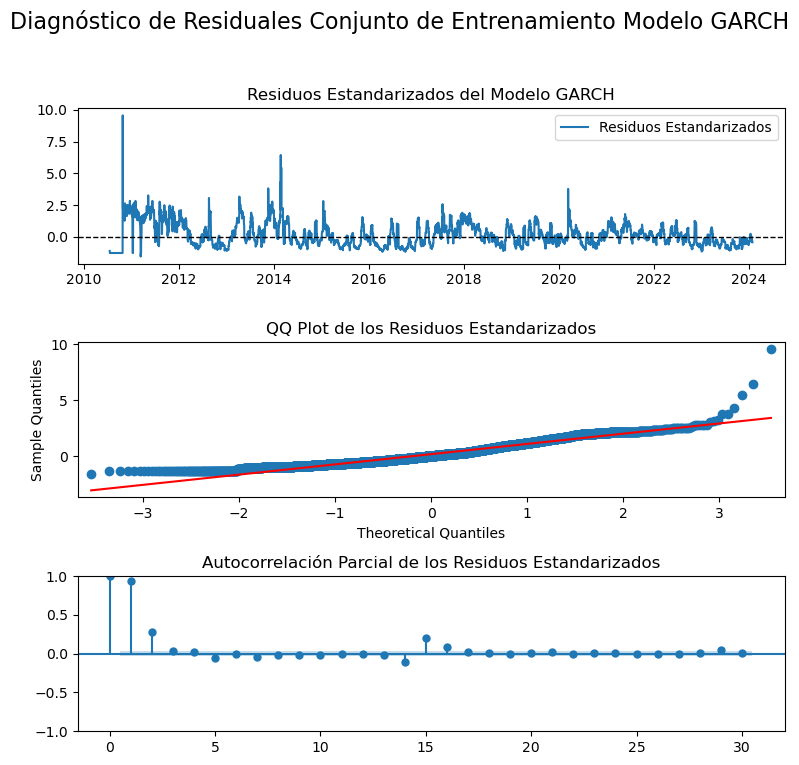

In [649]:
vola14_residuos = vola14_gmodel_fit.resid
vola14_volatilidad = vola14_gmodel_fit.conditional_volatility

# Calcular residuos estandarizados
vola14_residuos_estandarizados = vola14_residuos / vola14_volatilidad

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8, 8))

# Gráfico de residuos estandarizados
axes[0].plot(vola14_residuos_estandarizados, label='Residuos Estandarizados', color='#1f77b4')
axes[0].axhline(0, color='black', linestyle='--', linewidth=1)
axes[0].set_title('Residuos Estandarizados del Modelo GARCH')
axes[0].legend()

# Gráfico QQ plot
sm.qqplot(vola14_residuos_estandarizados, line='s', ax=axes[1])
axes[1].set_title('QQ Plot de los Residuos Estandarizados')

# Gráfico de autocorrelación parcial (PACF)
sm.graphics.tsa.plot_pacf(vola14_residuos_estandarizados, lags=30, ax=axes[2])
axes[2].set_title('Autocorrelación Parcial de los Residuos Estandarizados')

plt.suptitle('Diagnóstico de Residuales Conjunto de Entrenamiento Modelo GARCH', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Ajustar el layout para el título
plt.show()


In [650]:
vola14_residuos_train_garch = vola14_gmodel_fit.resid
vola14_ljung_box_pval_garch_train, vola14_jarque_bera_pval_garch_train = evaluate_residuals_train_arima(vola14_residuos_train_garch)

Ljung-Box LB Statistic: 4598.908461
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [651]:
vola14_predicciones = vola14_gmodel_fit.forecast(horizon=len(vola14_train_ts7))
vola14_yhvola14_garch_train = vola14_predicciones.mean.values[-len(vola14_train_ts7):].flatten()  #Se obtiene la ultima serie de predicciones en un arreglo 1D
vola14_vyhvola14_garch_df = pd.DataFrame(vola14_yhvola14_garch_train, columns=['vola14_Predicciones'], index=vola14_train_ts7.index) #convertir a dataframe para indexar fechas de price_train_ts7

#calcular las métricas 
vola14_metrica_garch_train = metricas(vola14_train_ts7,vola14_yhvola14_garch_train)
vola14_metrica_garch_train.index = vola14_metrica_garch_train.index.map({0: 'Garch Rolling Entrenamiento vola14'})
vola14_metrica_garch_train['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_garch_train], index=vola14_metrica_garch_train.index)
vola14_metrica_garch_train['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_garch_train], index=vola14_metrica_garch_train.index)
vola14_metrica_garch_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Entrenamiento vola14,20.2897,54.51%,0.02,0.0,-4.01%,0.0,0.0


La función `garch_rolling()` devuelve las prediciones, con base a los parámetros `p` y `q` que definen `el mejor modelo GARCH` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste, aprovechando datos históricos para pronosticar continuamente la concentración de PM10 durante un período (horizonte) específico.

A continuación se indexan los parámetros de la función `garch_rolling()` para las ventanas de 7, 14, 21 y 28 días para la predicción sobre los datos de `validación` y `prueba`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [652]:
# best_aic_arima = best_ order
vola14_val_l7 = vola14_val_ts7.tolist()
vola14_train_l7 = vola14_train_ts7.tolist()
vola14_yhvola14_val_garchrolling7  = garch_rolling(vola14_train_l7, vola14_val_l7, vola14_gbest_order, 7) 
vola14_yhvola14_val_garchrolling7 = pd.Series(vola14_yhvola14_val_garchrolling7, index=vola14_val_ts7.index)  # Indexa las fechas de price_val_ts7

predicted=0.031656, expected=0.023534
predicted=-0.070360, expected=0.023334
predicted=0.049593, expected=0.023328
predicted=-0.001274, expected=0.021258
predicted=0.033444, expected=0.021202
predicted=0.236537, expected=0.021286
predicted=-0.229957, expected=0.021504


* **Predicciones datos de Prueba**: 

In [653]:
# best_aic_arima = best_ order
vola14_test_l7 = vola14_test_ts7.tolist()
vola14_train_l7 = vola14_train_ts7.tolist()
vola14_yhvola14_test_garchrolling7  = garch_rolling(vola14_train_l7, vola14_test_l7, vola14_best_order,7) 
vola14_yhvola14_test_garchrolling7 = pd.Series(vola14_yhvola14_test_garchrolling7, index=vola14_test_ts7.index)  # Indexa las fechas de price_test_ts7

predicted=0.031672, expected=0.015830
predicted=0.031613, expected=0.015841
predicted=0.035840, expected=0.017026
predicted=0.036149, expected=0.017096
predicted=-0.292792, expected=0.016051
predicted=0.031625, expected=0.016094
predicted=0.031620, expected=0.015765


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.




In [654]:
plot_model(vola14_train_ts7[-200:], vola14_val_ts7, vola14_test_ts7, vola14_yhvola14_val_garchrolling7, vola14_yhvola14_test_garchrolling7, title="Predicciones usando GARCH rolling ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [655]:
vola14_ljung_box_pval_garchrol7, vola14_jarque_bera_pval_garchrol7 = evaluate_residuals(vola14_test_ts7, vola14_yhvola14_test_garchrolling7)

No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [656]:
vola14_metrica_garchrol_test7 = metricas(vola14_test_ts7,vola14_yhvola14_test_garchrolling7)
vola14_metrica_garchrol_test7.index = vola14_metrica_garchrol_test7.index.map({0: 'Garch Rolling Prueba vola14 (τ = 7)'})
vola14_metrica_garchrol_test7['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_garchrol7], index=vola14_metrica_garchrol_test7.index)
vola14_metrica_garchrol_test7['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_garchrol7], index=vola14_metrica_garchrol_test7.index)
vola14_metrica_garchrol_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola14 (τ = 7),0.0971,363.25%,0.06,0.01,-4949554.26%,0.532,0.0445


* **Ventana de 14 días ($\omega = 14)$**

* **Predicciones datos de Validación**: 

In [657]:
# best_aic_arima = best_ order
vola14_val_l14 = vola14_val_ts14.tolist()
vola14_train_l14 = vola14_train_ts14.tolist()
vola14_yhvola14_val_garchrolling14 = garch_rolling(vola14_train_l14, vola14_val_l14, vola14_gbest_order, 14) 
vola14_yhvola14_val_garchrolling14 = pd.Series(vola14_yhvola14_val_garchrolling14, index=vola14_val_ts14.index)  # Indexa las fechas de price_val_ts14



predicted=0.031656, expected=0.023534
predicted=-0.070360, expected=0.023334
predicted=0.049593, expected=0.023328
predicted=-0.001274, expected=0.021258
predicted=0.033444, expected=0.021202
predicted=0.236537, expected=0.021286
predicted=-0.229957, expected=0.021504
predicted=0.034219, expected=0.015830
predicted=0.057912, expected=0.015841
predicted=0.031647, expected=0.017026
predicted=0.029584, expected=0.017096
predicted=-0.058389, expected=0.016051
predicted=0.160887, expected=0.016094
predicted=0.031576, expected=0.015765


* **Predicciones datos de Prueba**: 

In [658]:
# best_aic_arima = best_ order
vola14_test_l14 = vola14_test_ts14.tolist()
vola14_train_l14 = vola14_train_ts14.tolist()
vola14_yhvola14_test_garchrolling14 = garch_rolling(vola14_train_l14, vola14_test_l14, vola14_best_order, 14) 
vola14_yhvola14_test_garchrolling14 = pd.Series(vola14_yhvola14_test_garchrolling14, index=vola14_test_ts14.index)  # Indexa las fechas de price_test_ts14


predicted=0.031672, expected=0.016219
predicted=0.031787, expected=0.015925
predicted=0.430282, expected=0.016890
predicted=0.031631, expected=0.017182
predicted=0.031766, expected=0.017098
predicted=0.031667, expected=0.017549
predicted=0.098713, expected=0.016311
predicted=0.031588, expected=0.016993
predicted=0.079560, expected=0.016990
predicted=0.031633, expected=0.017328
predicted=0.243188, expected=0.017979
predicted=0.031755, expected=0.016272
predicted=0.032949, expected=0.016404
predicted=0.031891, expected=0.016346


In [659]:
plot_model(vola14_train_ts14[-200:], vola14_val_ts14, vola14_test_ts14, vola14_yhvola14_val_garchrolling14, vola14_yhvola14_test_garchrolling14, title="Predicciones usando GARCH rolling ventana de 14 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [660]:
vola14_ljung_box_pval_garchrol14, vola14_jarque_bera_pval_garchrol14 = evaluate_residuals(vola14_test_ts14, vola14_yhvola14_test_garchrolling14)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [661]:
vola14_metrica_garchrol_test14 = metricas(vola14_test_ts14, vola14_yhvola14_test_garchrolling14)
vola14_metrica_garchrol_test14.index = vola14_metrica_garchrol_test14.index.map({0: 'Garch Rolling Prueba vola14 (τ = 14)'})
vola14_metrica_garchrol_test14['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_garchrol14], index=vola14_metrica_garchrol_test14.index)
vola14_metrica_garchrol_test14['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_garchrol14], index=vola14_metrica_garchrol_test14.index)
vola14_metrica_garchrol_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola14 (τ = 14),0.2346,391.32%,0.07,0.02,-5184485.25%,0.3327,1.2651e-05


* **Ventana de 21 días ($\omega = 21)$**

* **Predicciones datos de Validación**: 

In [662]:
# best_aic_arima = best_ order
vola14_val_l21 = vola14_val_ts21.tolist()
vola14_train_l21 = vola14_train_ts21.tolist()
vola14_yhvola14_val_garchrolling21 = garch_rolling(vola14_train_l21, vola14_val_l21, vola14_gbest_order, 21) 
vola14_yhvola14_val_garchrolling21 = pd.Series(vola14_yhvola14_val_garchrolling21, index=vola14_val_ts21.index)  # Indexa las fechas de price_val_ts21


predicted=0.031656, expected=0.023534
predicted=-0.070360, expected=0.023334
predicted=0.049593, expected=0.023328
predicted=-0.001274, expected=0.021258
predicted=0.033444, expected=0.021202
predicted=0.236537, expected=0.021286
predicted=-0.229957, expected=0.021504
predicted=0.034219, expected=0.015830
predicted=0.057912, expected=0.015841
predicted=0.031647, expected=0.017026
predicted=0.029584, expected=0.017096
predicted=-0.058389, expected=0.016051
predicted=0.160887, expected=0.016094
predicted=0.031576, expected=0.015765
predicted=0.031555, expected=0.016219
predicted=0.043874, expected=0.015925
predicted=0.031626, expected=0.016890
predicted=0.030969, expected=0.017182
predicted=0.047021, expected=0.017098
predicted=0.031532, expected=0.017549
predicted=0.002262, expected=0.016311


* **Predicciones datos de Prueba**: 

In [663]:
# best_aic_arima = best_ order
vola14_test_l21 = vola14_test_ts21.tolist()
vola14_train_l21 = vola14_train_ts21.tolist()
vola14_yhvola14_test_garchrolling21 = garch_rolling(vola14_train_l21, vola14_test_l21, vola14_best_order, 21) 
vola14_yhvola14_test_garchrolling21 = pd.Series(vola14_yhvola14_test_garchrolling21, index=vola14_test_ts21.index)  # Indexa las fechas de price_test_ts21


predicted=0.031672, expected=0.016993
predicted=-0.288802, expected=0.016990
predicted=0.031850, expected=0.017328
predicted=0.031819, expected=0.017979
predicted=0.031634, expected=0.016272
predicted=0.031681, expected=0.016404
predicted=-0.010342, expected=0.016346
predicted=0.060313, expected=0.019491
predicted=0.403824, expected=0.021972
predicted=0.031612, expected=0.030715
predicted=0.073546, expected=0.031979
predicted=0.006356, expected=0.031959
predicted=0.031507, expected=0.031809
predicted=0.036214, expected=0.031806
predicted=0.031582, expected=0.035814
predicted=0.031592, expected=0.042571
predicted=0.058650, expected=0.042361
predicted=-0.080381, expected=0.041616
predicted=-0.003413, expected=0.040644
predicted=0.097507, expected=0.040949
predicted=0.011892, expected=0.040780


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




In [664]:
plot_model(vola14_train_ts21[-200:], vola14_val_ts21, vola14_test_ts21, vola14_yhvola14_val_garchrolling21, vola14_yhvola14_test_garchrolling21, title="Predicciones usando GARCH rolling ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [665]:
vola14_ljung_box_pval_garchrol21, vola14_jarque_bera_pval_garchrol21 = evaluate_residuals(vola14_test_ts21, vola14_yhvola14_test_garchrolling21)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [666]:
vola14_metrica_garchrol_test21 = metricas(vola14_test_ts21, vola14_yhvola14_test_garchrolling21)
vola14_metrica_garchrol_test21.index = vola14_metrica_garchrol_test21.index.map({0: 'Garch Rolling Prueba vola14 (τ = 21)'})
vola14_metrica_garchrol_test21['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_garchrol21], index=vola14_metrica_garchrol_test21.index)
vola14_metrica_garchrol_test21['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_garchrol21], index=vola14_metrica_garchrol_test21.index)
vola14_metrica_garchrol_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola14 (τ = 21),0.2665,250.46%,0.06,0.01,-12085.42%,0.9397,8.6914e-08


* **Ventana de 28 días ($\omega = 28)$**

* **Predicciones datos de Validación**: 

In [667]:
# best_aic_arima = best_ order
vola14_val_l28 = vola14_val_ts28.tolist()
vola14_train_l28 = vola14_train_ts28.tolist()
vola14_yhvola14_val_garchrolling28 = garch_rolling(vola14_train_l28, vola14_val_l28, vola14_gbest_order, 28) 
vola14_yhvola14_val_garchrolling28 = pd.Series(vola14_yhvola14_val_garchrolling28, index=vola14_val_ts28.index)  # Indexa las fechas de price_val_ts28



predicted=0.031656, expected=0.023534
predicted=-0.070360, expected=0.023334
predicted=0.049593, expected=0.023328
predicted=-0.001274, expected=0.021258
predicted=0.033444, expected=0.021202
predicted=0.236537, expected=0.021286
predicted=-0.229957, expected=0.021504
predicted=0.034219, expected=0.015830
predicted=0.057912, expected=0.015841
predicted=0.031647, expected=0.017026
predicted=0.029584, expected=0.017096
predicted=-0.058389, expected=0.016051
predicted=0.160887, expected=0.016094
predicted=0.031576, expected=0.015765
predicted=0.031555, expected=0.016219
predicted=0.043874, expected=0.015925
predicted=0.031626, expected=0.016890
predicted=0.030969, expected=0.017182
predicted=0.047021, expected=0.017098
predicted=0.031532, expected=0.017549
predicted=0.002262, expected=0.016311
predicted=0.033315, expected=0.016993
predicted=0.031621, expected=0.016990
predicted=0.031575, expected=0.017328
predicted=0.031449, expected=0.017979
predicted=0.046611, expected=0.016272
predicte

* **Predicciones datos de Prueba**: 

In [668]:
# best_aic_arima = best_ order
vola14_test_l28 = vola14_test_ts28.tolist()
vola14_train_l28 = vola14_train_ts28.tolist()
vola14_yhvola14_test_garchrolling28 = garch_rolling(vola14_train_l28, vola14_test_l28, vola14_best_order, 28) 
vola14_yhvola14_test_garchrolling28 = pd.Series(vola14_yhvola14_test_garchrolling28, index=vola14_test_ts28.index)  # Indexa las fechas de price_test_ts28


predicted=0.031672, expected=0.019491
predicted=0.031645, expected=0.021972
predicted=0.029248, expected=0.030715
predicted=0.072107, expected=0.031979
predicted=0.110615, expected=0.031959
predicted=0.031950, expected=0.031809
predicted=0.031864, expected=0.031806
predicted=0.031670, expected=0.035814
predicted=0.042713, expected=0.042571
predicted=0.040311, expected=0.042361
predicted=0.036491, expected=0.041616


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




predicted=0.031538, expected=0.040644
predicted=0.059373, expected=0.040949
predicted=0.031656, expected=0.040780
predicted=0.031651, expected=0.040342
predicted=0.032028, expected=0.040322
predicted=0.031599, expected=0.033655
predicted=0.042081, expected=0.033822
predicted=0.013967, expected=0.035224
predicted=0.491839, expected=0.039550
predicted=0.031898, expected=0.041044
predicted=0.031686, expected=0.035099
predicted=-10.583891, expected=0.037640
predicted=0.031966, expected=0.044544
predicted=0.031829, expected=0.045543
predicted=0.031668, expected=0.045630
predicted=-0.023427, expected=0.045643
predicted=0.031669, expected=0.047754


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




In [669]:
plot_model(vola14_train_ts28[-200:], vola14_val_ts28, vola14_test_ts28, vola14_yhvola14_val_garchrolling28, vola14_yhvola14_test_garchrolling28, title="Predicciones usando GARCH rolling ventana de 28 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [670]:
vola14_ljung_box_pval_garchrol28, vola14_jarque_bera_pval_garchrol28 = evaluate_residuals(vola14_test_ts28, vola14_yhvola14_test_garchrolling28)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [671]:
vola14_metrica_garchrol_test28 = metricas(vola14_test_ts28, vola14_yhvola14_test_garchrolling28)
vola14_metrica_garchrol_test28.index = vola14_metrica_garchrol_test28.index.map({0: 'Garch Rolling Prueba vola14 (τ = 28)'})
vola14_metrica_garchrol_test28['Ljung-Box p-value'] = pd.Series([vola14_ljung_box_pval_garchrol28], index=vola14_metrica_garchrol_test28.index)
vola14_metrica_garchrol_test28['Jarque-Bera p-value'] = pd.Series([vola14_jarque_bera_pval_garchrol28], index=vola14_metrica_garchrol_test28.index)
vola14_metrica_garchrol_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola14 (τ = 28),113.0364,1085.85%,0.41,4.04,-8949078.94%,0.8505,3.2855e-159


#### <font color="#30143">Resumen de Métricas Variable Precio</font>

En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `entrenamiento` para la variable `Volatilidad 7 dias`. 

In [672]:
vola14_metricas_df_train = pd.concat([vola14_metrica_SES_train, vola14_metrica_DES_train, vola14_metrica_HW1_train, vola14_metrica_HW2_train, vola14_metrica_arima_train, vola14_metrica_garch_train], ignore_index=False)
vola14_metricas_df_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value,Ljung-Box p-value
SES Train,1.5615e+00,10.86%,0.00,0.0000e+00,92.0%,0.0,0.0,NaN
DES Train,4.4695e+00,20.04%,0.01,0.0000e+00,77.09%,0.0,0.0,NaN
SES HW Train,7.5067e+12,142432839.97%,38969.91,1.5187e+09,-38482445985782.98%,0.0,0.0,NaN
DES HW Train,5.4486e+03,3894.34%,1.05,1.1000e+00,-27831.76%,0.0,0.0,NaN
Arima Entrenamiento vola14,1.3565e+00,8.68%,0.00,0.0000e+00,93.05%,NaN,0.0,0.9479
Garch Rolling Entrenamiento vola14,2.0290e+01,54.51%,0.02,0.0000e+00,-4.01%,NaN,0.0,0.0000


En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `prueba` para la variable `Retorno acumulado`. 

In [673]:
vola14_metricas_df_test = pd.concat([vola14_metrica_SE_test7, vola14_metrica_SE_test14, vola14_metrica_SE_test21, vola14_metrica_SE_test28, vola14_metrica_SE_HW_test7, 
                              vola14_metrica_SE_HW_test14, vola14_metrica_SE_HW_test21, vola14_metrica_SE_HW_test28, vola14_metrica_DES_test7,
                              vola14_metrica_DES_test14, vola14_metrica_DES_test21,vola14_metrica_DES_test28, vola14_metrica_DES_HW_test7,
                              vola14_metrica_DES_HW_test14, vola14_metrica_DES_HW_test21, vola14_metrica_DES_HW_test28, vola14_metrica_arimarol_test7,
                              vola14_metrica_arimarol_test14, vola14_metrica_arimarol_test21, vola14_metrica_arimarol_test28, vola14_metrica_arima_test7,
                              vola14_metrica_arima_test14, vola14_metrica_arima_test21, vola14_metrica_arima_test28, vola14_metrica_garchrol_test7, 
                              vola14_metrica_garchrol_test14, vola14_metrica_garchrol_test21, vola14_metrica_garchrol_test28], ignore_index=False)
vola14_metricas_df_test

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola14 (τ = 7),1.3345e-06,1.96%,0.00,0.00,31.97%,3.6229e-01,6.2347e-01
SES Prueba vola14 (τ = 14),2.6962e-06,2.28%,0.00,0.00,40.42%,5.8551e-01,5.8551e-01
SES Prueba vola14 (τ = 21),2.8751e-04,8.45%,0.00,0.00,86.85%,4.2693e-04,4.2693e-04
SES Prueba vola14 (τ = 28),3.5265e-04,7.87%,0.00,0.00,72.08%,5.7065e-04,5.7065e-04
SES HW Prueba vola14 (τ = 7),1.9554e-04,32.51%,0.01,0.00,-9868.16%,4.5139e-01,5.5978e-01
SES HW Prueba vola14 (τ = 14),2.0026e-05,6.15%,0.00,0.00,-342.56%,4.4128e-01,7.4581e-01
SES HW Prueba vola14 (τ = 21),5.4055e-03,34.58%,0.01,0.00,-147.21%,1.0083e-05,3.1575e-01
SES HW Prueba vola14 (τ = 28),1.3804e-02,54.55%,0.02,0.00,-992.9%,7.9999e-05,1.5947e-01
DES Prueba vola14 (τ = 7),7.6418e-07,1.6%,0.00,0.00,61.04%,3.5115e-01,7.8838e-01
DES Prueba vola14 (τ = 14),1.4721e-06,1.46%,0.00,0.00,67.47%,9.5432e-01,5.3935e-01


## Análisis de Métricas para la Volatilidad con Ventana de 14 días

A continuación, se presenta un análisis de las métricas para los distintos modelos aplicados a la volatilidad del BTC utilizando una ventana de tiempo de 14 días.

### 1. **Suavización Exponencial Simple (SES)**
- **Performance general**:
  - **MAPE** varía entre 1.96% y 8.45%, mostrando un ajuste razonable para ventanas más cortas, pero empeorando en ventanas largas.
  - **SSE** y **MAD** son bajos en ventanas cortas, lo que indica un buen ajuste en términos absolutos.
  - **R²** es positivo en la mayoría de las ventanas, con un máximo de 86.85% para τ = 21, lo que sugiere que el modelo captura gran parte de la variabilidad en esas ventanas.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** sugieren problemas con la independencia y normalidad de los residuos en las ventanas más largas.

### 2. **Suavización Exponencial Simple Holt-Winters (SES HW)**
- **Performance general**:
  - **MAPE** es relativamente alto, alcanzando un 54.55% para τ = 28, lo que indica un mal ajuste del modelo para ventanas largas.
  - **SSE** y **MAD** son mayores en comparación con SES, y **R²** es extremadamente negativo, lo que indica que este modelo no es adecuado para la volatilidad del BTC.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** confirman que los residuos no son independientes y no siguen una distribución normal, particularmente en las ventanas más largas.

### 3. **Suavización Exponencial Doble (DES)**
- **Performance general**:
  - **MAPE** es bajo, entre 1.46% y 4.16%, lo que sugiere un buen ajuste en todas las ventanas.
  - **SSE** y **MAD** son bajos, y **R²** es positivo, alcanzando un 97.34% en τ = 21, lo que indica un excelente ajuste para esa ventana.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran que los residuos son más independientes y cercanos a la normalidad en comparación con SES HW, lo que refuerza la calidad del ajuste del modelo.

### 4. **Suavización Exponencial Doble Holt-Winters (DES HW)**
- **Performance general**:
  - **MAPE** es alto, llegando a 57.25% en τ = 28, lo que indica un mal ajuste para ventanas largas.
  - **SSE** y **MAD** son significativamente altos, y **R²** es negativo en todas las ventanas, lo que demuestra que el modelo no es adecuado para la volatilidad del BTC.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** confirman problemas de independencia y distribución de los residuos.

### 5. **ARIMA (Rolling)**
- **Performance general**:
  - **MAPE** es bajo en las ventanas más cortas (12.72% para τ = 7) y aumenta en ventanas más largas, alcanzando un 6.34% en τ = 28.
  - **SSE** y **MAD** son razonablemente bajos en ventanas más cortas, pero empeoran a medida que la ventana aumenta.
  - **R²** es positivo en τ = 21 y τ = 28, sugiriendo que el modelo puede capturar algo de la variabilidad en esas ventanas.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran problemas con la independencia y normalidad de los residuos en ventanas largas.

### 6. **ARIMA (Sin Rolling)**
- **Performance general**:
  - **MAPE** es muy alto, alcanzando un 68.26% en τ = 14, lo que sugiere que este modelo no es adecuado para la volatilidad del BTC.
  - **SSE**, **MAD**, y **R²** indican un mal ajuste del modelo, con **R²** extremadamente negativo en la mayoría de las ventanas.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** confirman problemas de independencia y distribución de los residuos, lo que refuerza la idea de que este modelo no es adecuado.

### 7. **GARCH Rolling**
- **Performance general**:
  - **MAPE** es extremadamente alto, alcanzando hasta 1085.85% en τ = 28, lo que indica que este modelo es inadecuado para la volatilidad del BTC.
  - **SSE** y **MAD** son extremadamente altos, y **R²** es muy negativo, lo que sugiere que el modelo no puede capturar correctamente la volatilidad.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** también muestran problemas significativos en términos de independencia y distribución de los residuos.

### **Conclusiones generales**
1. **Mejor modelo**: El **modelo DES** ofrece el mejor rendimiento general, con un **MAPE** bajo (1.46%-4.16%) y un **R²** positivo (hasta 97.34% en τ = 21).
2. **Peor modelo**: El **modelo GARCH Rolling** muestra el peor rendimiento, con **MAPE** extremadamente alto y métricas como **SSE**, **MAD**, y **R²** en niveles negativos.
3. **Recomendación**: El **modelo SES** ofrece un ajuste razonable en ventanas cortas, pero para horizontes más largos, el **modelo DES** parece ser la mejor opción.


## <font color="#30143">Volatilidad 21 dias</font>

A continuación se visualiza la serie temporal de la variable `Volatilidad 21 dias`.

In [674]:
import plotly.graph_objects as go
import pandas as pd


# Crear la figura usando plotly.graph_objects
fig = go.Figure()

# Añadir la traza de la línea
fig.add_trace(go.Scatter(
    x=df_1_st['Date'],
    y=df_1_st['Volatilidad_21'], # Variable objetico 
    mode='lines',  
    line=dict(color='#30143F', width=2),
    name='Volatilidad',
    opacity=0.7  
))

# Ajustar el diseño del gráfico
fig.update_layout(
    title='Volatilidad de 21 dias de BTC a lo largo del tiempo',
    xaxis_title='Fecha',
    yaxis_title='Volatilidad BTC',  
    xaxis=dict(tickangle=45, tickformat='%Y-%m-%d'),  
    yaxis=dict(tickformat='.1f'),  
    template='plotly_white',  # Fondo blanco 
    title_x=0.5,  # Centrar el título
    title_font=dict(size=16)  # Ajusta el tamaño de la fuente del título
)

fig.show()

El gráfico muestra la volatilidad del Bitcoin (BTC) a lo largo del tiempo desde 2010 hasta 2024. A simple vista, se observa lo siguiente:

1. **Períodos de alta volatilidad**: Se identifican varios picos significativos, en particular uno muy destacado alrededor de 2014. Esto puede estar asociado a eventos macroeconómicos o decisiones que afectaron la percepción del mercado sobre BTC en ese periodo.
   
2. **Tendencia general**: A pesar de los picos, la volatilidad parece haberse estabilizado a niveles más bajos después de 2018, con algunos picos menores recientes, pero con un comportamiento más moderado comparado con los primeros años.

3. **Estabilidad reciente**: A partir de 2020, la volatilidad tiende a mantenerse en niveles bajos, lo que podría sugerir una mayor madurez en el mercado de Bitcoin o mayor aceptación del mismo.

El gráfico refleja la naturaleza altamente volátil del Bitcoin en sus primeros años, con una tendencia hacia la estabilización en el tiempo reciente, aunque todavía sujeta a fluctuaciones notables.


#### <font color="#30143">Simple Exponential Smoothing (Sin Librería)</font>

A continuación se indexan los parámetros para la estimación del mejor lamda.

In [675]:
lambdas = [0.1, 0.2, 0.3, 0.4]
vola21_mejor_lambda, vola21_mejor_mae = seleccionar_mejor_lambda(vola21_train_ts7, lambdas)

print(f"Mejor lambda: {vola21_mejor_lambda}, MAD: {vola21_mejor_mae}")

Lambda: 0.1, MAD: 0.01
Lambda: 0.2, MAD: 0.01
Lambda: 0.3, MAD: 0.0
Lambda: 0.4, MAD: 0.0
Mejor lambda: 0.3, MAD: 0.0


* Análisis de residuos conjunto de entrenamiento: 

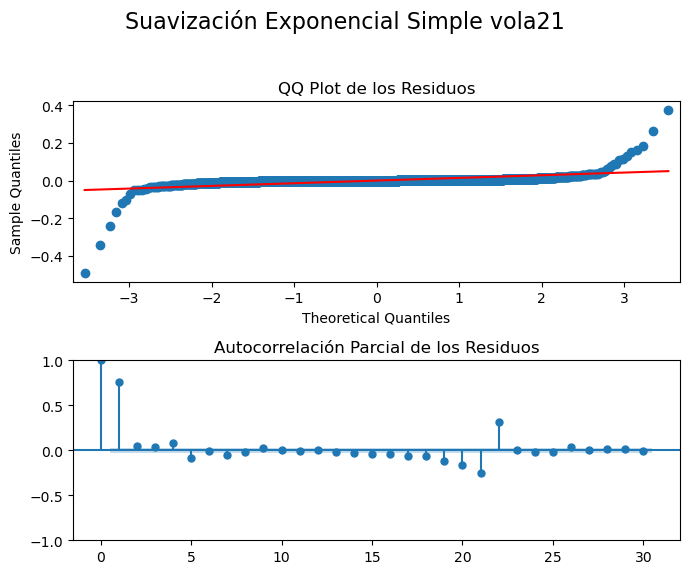

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [676]:
vola21_smooth1_train = firstsmooth(y=vola21_train_ts7, lambda_= vola21_mejor_lambda)
vola21_metrica_SES_train = plot_residual_train('Suavización Exponencial Simple vola21','SES', vola21_train_ts7, vola21_smooth1_train)

In [677]:
vola21_metrica_SES_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value
SES Train,0.9906,7.83%,0.0,0.0,94.73%,0.0,0.0


En términos generales, el rendimiento del modelo de suavización exponencial simple (SES) es prometedor, como lo demuestran el bajo MAPE y el alto R², aunque esta última métrica no es completamente adecuada para el análisis de series temporales. Sin embargo, los valores de SSE y MSD sugieren que hay oportunidades para mejorar la precisión del modelo. Además, los análisis de residuos indican la presencia de patrones que no han sido capturados de manera efectiva. Por lo tanto, es posible que los datos de validación y prueba no se ajusten adecuadamente, lo que limita la capacidad del modelo para generalizar de manera óptima.

* **Ventana de 7 días ($\omega = 7)$**

In [678]:
vola21_smooth1_val7 = firstsmooth(y=vola21_val_ts7, lambda_= vola21_mejor_lambda)
vola21_smooth1_test7 = firstsmooth(y=vola21_test_ts7, lambda_= vola21_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para  la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-100 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -100: extraerá todos los elementos desde la posición -100 hasta el final de la serie.

In [679]:
plot_model(vola21_train_ts7[-100:], vola21_val_ts7, vola21_test_ts7, vola21_smooth1_val7, vola21_smooth1_test7, 'Suavización Exponencial Simple Ventana de 7 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [680]:
vola21_ljung_box_pval7, vola21_jarque_bera_pval7 = evaluate_residuals(vola21_test_ts7, vola21_smooth1_test7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [681]:
vola21_metrica_SE_test7 = metricas(vola21_test_ts7,vola21_smooth1_test7)
vola21_metrica_SE_test7.index = vola21_metrica_SE_test7.index.map({0: 'SES Prueba vola21 (τ = 7)'})
vola21_metrica_SE_test7['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval7], index=vola21_metrica_SE_test7.index)
vola21_metrica_SE_test7['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval7], index=vola21_metrica_SE_test7.index)
vola21_metrica_SE_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola21 (τ = 7),1.4132e-06,1.92%,0.0,0.0,40.19%,0.1527,0.7288


* **Ventana de 14 días ($\omega = 14)$**

In [682]:
vola21_smooth1_val14 = firstsmooth(y=vola21_val_ts14, lambda_=vola21_mejor_lambda)
vola21_smooth1_test14 = firstsmooth(y=vola21_test_ts14, lambda_=vola21_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-100 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -100: extraerá todos los elementos desde la posición -100 hasta el final de la serie.

In [683]:
plot_model(vola21_train_ts14[-100:], vola21_val_ts14, vola21_test_ts14, vola21_smooth1_val14, vola21_smooth1_test14, 'Suavización Exponencial Simple Ventana de 14 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [684]:
vola21_ljung_box_pval14, vola21_jarque_bera_pval14 = evaluate_residuals(vola21_test_ts14, vola21_smooth1_test14)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [685]:
vola21_metrica_SE_test14 = metricas(vola21_test_ts14,vola21_smooth1_test14)
vola21_metrica_SE_test14.index = vola21_metrica_SE_test14.index.map({0: 'SES Prueba vola21 (τ = 14)'})
vola21_metrica_SE_test14['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval14], index=vola21_metrica_SE_test14.index)
vola21_metrica_SE_test14['Jarque-Bera p-value'] = pd.Series([vola21_ljung_box_pval14], index=vola21_metrica_SE_test14.index)
vola21_metrica_SE_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola21 (τ = 14),3.1776e-06,2.31%,0.0,0.0,48.4%,0.1191,0.1191


* **Ventana de 21 días ($\omega = 21)$**

In [686]:
vola21_smooth1_val21 = firstsmooth(y=vola21_val_ts21, lambda_=vola21_mejor_lambda)
vola21_smooth1_test21 = firstsmooth(y=vola21_test_ts21, lambda_=vola21_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [687]:
plot_model(vola21_train_ts21[-200:], vola21_val_ts21, vola21_test_ts21, vola21_smooth1_val21, vola21_smooth1_test21, 'Suavización Exponencial Simple Ventana de 21 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [688]:
vola21_ljung_box_pval21, vola21_jarque_bera_pval21 = evaluate_residuals(vola21_test_ts21, vola21_smooth1_test21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [689]:
vola21_metrica_SE_test21 = metricas(vola21_test_ts21, vola21_smooth1_test21)
vola21_metrica_SE_test21.index = vola21_metrica_SE_test21.index.map({0: 'SES Prueba vola21 (τ = 21)'})
vola21_metrica_SE_test21['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval21], index=vola21_metrica_SE_test21.index)
vola21_metrica_SE_test21['Jarque-Bera p-value'] = pd.Series([vola21_ljung_box_pval21], index=vola21_metrica_SE_test21.index)
vola21_metrica_SE_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola21 (τ = 21),0.0002,7.34%,0.0,0.0,87.52%,0.0005,0.0005


* **Ventana de 28 días ($\omega = 28)$**

In [690]:
vola21_smooth1_val28 = firstsmooth(y=vola21_val_ts28, lambda_=vola21_mejor_lambda)
vola21_smooth1_test28 = firstsmooth(y=vola21_test_ts28, lambda_=vola21_mejor_lambda)


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [691]:
plot_model(vola21_train_ts28[-200:], vola21_val_ts28, vola21_test_ts28, vola21_smooth1_val28, vola21_smooth1_test28, 'Suavización Exponencial Simple Ventana de 28 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [692]:
vola21_ljung_box_pval28, vola21_jarque_bera_pval28 = evaluate_residuals(vola21_test_ts28, vola21_smooth1_test28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [693]:
vola21_metrica_SE_test28 = metricas(vola21_test_ts28, vola21_smooth1_test28)
vola21_metrica_SE_test28.index = vola21_metrica_SE_test28.index.map({0: 'SES Prueba vola21 (τ = 28)'})
vola21_metrica_SE_test28['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval28], index=vola21_metrica_SE_test28.index)
vola21_metrica_SE_test28['Jarque-Bera p-value'] = pd.Series([vola21_ljung_box_pval28], index=vola21_metrica_SE_test28.index)
vola21_metrica_SE_test28


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola21 (τ = 28),0.0002,6.24%,0.0,0.0,87.07%,0.0042,0.0042


#### <font color="#30143">Simple Exponential Smoothing (Usando statsmodels.tsa.holtwinters)</font> 

La función `ses_optimizer()` permite la optimización del modelo, ya que, ayudará a determinar el parámetro óptimo $\alpha$ para conseguir el modelo que reduzca al mínimo la métrica `MAE`.

In [694]:
def ses_optimizer(train, val, alphas, step):

    best_alpha, best_mae = None, float("inf")

    for alpha in alphas:
        ses_model = SimpleExpSmoothing(train).fit(smoothing_level=alpha, optimized=False)
        y_pred = ses_model.forecast(step)
        mae = mean_absolute_error(val, y_pred)

        if mae < best_mae:
            best_alpha, best_mae = alpha, mae

    return best_alpha, best_mae

In [695]:
def ses_model_tuning(train, val, test, step, title="Model Tuning - Suavización Exponencial Simple"):
    alphas = np.arange(0.8, 1, 0.01)
    best_alpha, best_mae = ses_optimizer(train, val, alphas, step=step)
    
    train_val = pd.concat([train, val])
    final_model = SimpleExpSmoothing(train_val).fit(smoothing_level=best_alpha, optimized=False)

    y_pred_val = final_model.forecast(step)  # Predicciones en validación
    y_pred_test = final_model.forecast(len(test))  # Predicciones en test
    
    mae_val = mean_absolute_error(val, y_pred_val)

    plot_model(train, val, test, y_pred_val, y_pred_test, title)

    return y_pred_val, y_pred_test

In [696]:
def ses_model_tuning_train(train, val, test, step, title="Model Tuning - Suavización Exponencial Simple"):
    alphas = np.arange(0.8, 1, 0.01)
    best_alpha, best_mae = ses_optimizer(train, val, alphas, step=step)
    
    train_val = pd.concat([train, val])
    final_model = SimpleExpSmoothing(train_val).fit(smoothing_level=best_alpha, optimized=False)

    y_pred_val = final_model.forecast(step)  # Predicciones en validación
    y_pred_test = final_model.forecast(len(test))  # Predicciones en test
    
    mae_val = mean_absolute_error(val, y_pred_val)
    
    return y_pred_val, y_pred_test

* Análisis de residuos conjunto de entrenamiento: 

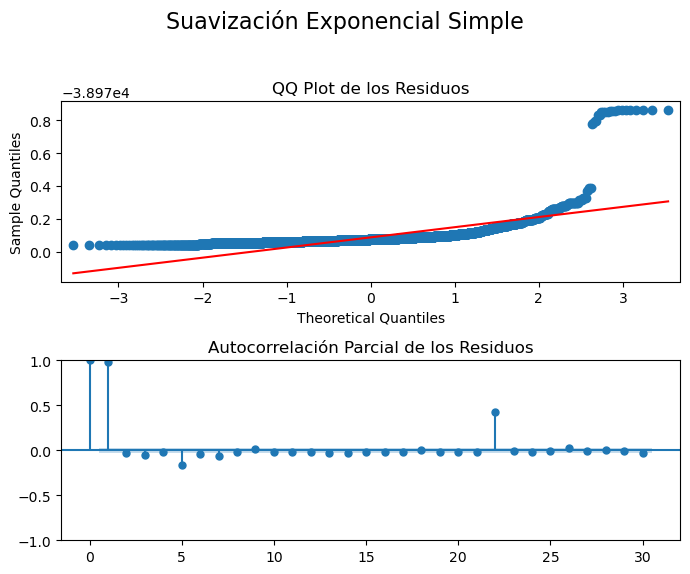

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [697]:
vola21_predicciones, vola21_y_pred_HW1_val_7 = ses_model_tuning_train(vola21_train_ts7[-200:], vola21_train_ts7, vola21_val_ts7, step=len(vola21_train_ts7))
vola21_y_pred_HW1_val_7 = pd.Series(vola21_predicciones.mean(), index=vola21_train_ts7.index[-1:])  # Esto crea una serie con la media y un índice
vola21_y_pred_HW1_val_7 = pd.Series([vola21_predicciones.mean()] * len(vola21_train_ts7), index=vola21_train_ts7.index)
vola21_y_pred_HW1_val_7 = pd.DataFrame(vola21_y_pred_HW1_val_7, columns=['Predicciones'])
vola21_metrica_HW1_train = plot_residual_train('Suavización Exponencial Simple','SES HW' , vola21_train_ts7, y_pred_HW1_train_7)

* **Ventana de 7 días ($\omega = 7)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [698]:
vola21_y_pred_HW1_val_7, vola21_y_pred_HW1_test_7 = ses_model_tuning(vola21_train_ts7[-200:], vola21_val_ts7, vola21_test_ts7, step=len(vola21_val_ts7))

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [699]:
vola21_ljung_box_pval_hw7, vola21_jarque_bera_pval_hw7 = evaluate_residuals(vola21_test_ts7, vola21_y_pred_HW1_test_7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [700]:
vola21_metrica_SE_HW_test7 = metricas(vola21_test_ts7,vola21_y_pred_HW1_test_7)
vola21_metrica_SE_HW_test7.index = vola21_metrica_SE_HW_test7.index.map({0: 'SES HW Prueba vola21 (τ = 7)'})
vola21_metrica_SE_HW_test7['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_hw7], index=vola21_metrica_SE_HW_test7.index)
vola21_metrica_SE_HW_test7['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_hw7], index=vola21_metrica_SE_HW_test7.index)
vola21_metrica_SE_HW_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola21 (τ = 7),2.7654e-06,2.59%,0.0,0.0,-17.04%,0.5905,0.6599


* **Ventana de 14 días ($\omega = 14)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 14 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [701]:
vola21_y_pred_HW1_val_14, vola21_y_pred_HW1_test_14 = ses_model_tuning(vola21_train_ts14[-200:], vola21_val_ts14, vola21_test_ts14, step=len(vola21_val_ts14))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [702]:
vola21_ljung_box_pval_hw14, vola21_jarque_bera_pval_hw14 = evaluate_residuals(vola21_test_ts14, vola21_y_pred_HW1_test_14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [703]:
vola21_metrica_SE_HW_test14 = metricas(vola21_test_ts14, vola21_y_pred_HW1_test_14)
vola21_metrica_SE_HW_test14.index = vola21_metrica_SE_HW_test14.index.map({0: 'SES HW Prueba vola21 (τ = 14)'})
vola21_metrica_SE_HW_test14['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_hw14], index=vola21_metrica_SE_HW_test14.index)
vola21_metrica_SE_HW_test14['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_hw14], index=vola21_metrica_SE_HW_test14.index)
vola21_metrica_SE_HW_test14


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola21 (τ = 14),0.0002,22.03%,0.0,0.0,-3023.0%,0.0457,0.3183


* **Ventana de 21 días ($\omega = 21)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 21 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [704]:
vola21_y_pred_HW1_val_21, vola21_y_pred_HW1_test_21 = ses_model_tuning(vola21_train_ts21[-200:], vola21_val_ts21, vola21_test_ts21, step=len(vola21_val_ts21))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [705]:
vola21_ljung_box_pval_hw21, vola21_jarque_bera_pval_hw21 = evaluate_residuals(vola21_test_ts21, vola21_y_pred_HW1_test_21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [706]:
vola21_metrica_SE_HW_test21 = metricas(vola21_test_ts21, vola21_y_pred_HW1_test_21)
vola21_metrica_SE_HW_test21.index = vola21_metrica_SE_HW_test21.index.map({0: 'SES HW Prueba vola21 (τ = 21)'})
vola21_metrica_SE_HW_test21['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_hw21], index=vola21_metrica_SE_HW_test21.index)
vola21_metrica_SE_HW_test21['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_hw21], index=vola21_metrica_SE_HW_test21.index)
vola21_metrica_SE_HW_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola21 (τ = 21),0.003,29.11%,0.01,0.0,-126.3%,9.9553e-06,0.3158


* **Ventana de 28 días ($\omega = 28)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 28 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [707]:
vola21_y_pred_HW1_val_28, vola21_y_pred_HW1_test_28 = ses_model_tuning(vola21_train_ts28[-200:], vola21_val_ts28, vola21_test_ts28, step=len(vola21_val_ts28))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [708]:
vola21_ljung_box_pval_hw28, vola21_jarque_bera_pval_hw28 = evaluate_residuals(vola21_test_ts28, vola21_y_pred_HW1_test_28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [709]:
vola21_metrica_SE_HW_test28 = metricas(vola21_test_ts28, vola21_y_pred_HW1_test_28)
vola21_metrica_SE_HW_test28.index = vola21_metrica_SE_HW_test28.index.map({0: 'SES HW Prueba vola21 (τ = 28)'})
vola21_metrica_SE_HW_test28['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_hw28], index=vola21_metrica_SE_HW_test28.index)
vola21_metrica_SE_HW_test28['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_hw28], index=vola21_metrica_SE_HW_test28.index)
vola21_metrica_SE_HW_test28


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola21 (τ = 28),0.0115,51.3%,0.02,0.0,-703.46%,3.9020e-06,0.5387


#### <font color="#30143">Double Exponential Smoothing (Sin Librería)</font> 

* Análisis de residuos conjunto de entrenamiento: 

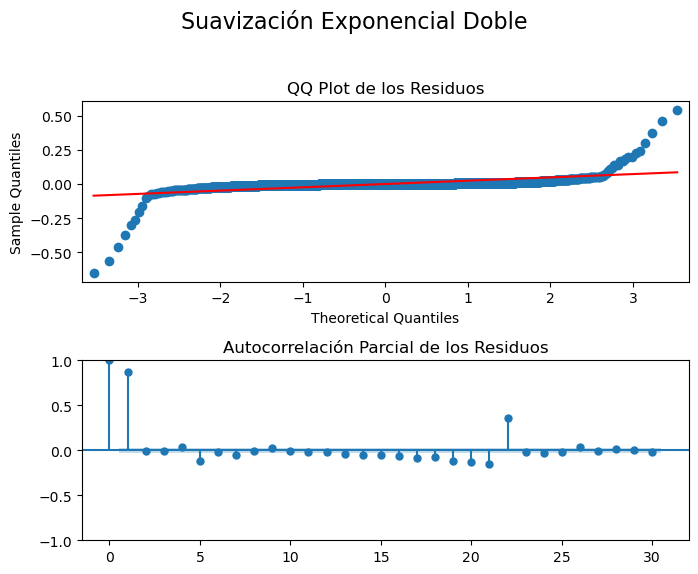

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [710]:
vola21_smooth2_train = firstsmooth(y=vola21_smooth1_train, lambda_=vola21_mejor_lambda)
vola21_metrica_DES_train = plot_residual_train('Suavización Exponencial Doble','DES', vola21_train_ts7, vola21_smooth2_train)

A continuación se realizan las predicciones para el modelo de suavización exponencial doble sin usar librería: 

* **Ventana de 7 días ($\omega = 7)$**

In [711]:
vola21_smooth2_val7 = firstsmooth(y=vola21_smooth1_val7, lambda_=vola21_mejor_lambda)
vola21_smooth2_test7 = firstsmooth(y=vola21_smooth1_test7, lambda_=vola21_mejor_lambda)

vola21_y_hatDES_val7 = 2 * vola21_smooth1_val7 - vola21_smooth2_val7
vola21_y_hatDES_test7 = 2 * vola21_smooth1_test7 - vola21_smooth2_test7

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [712]:
plot_model(vola21_train_ts7[-200:], vola21_val_ts7, vola21_test_ts7, vola21_y_hatDES_val7, vola21_y_hatDES_test7, 'Suavización Exponencial Doble Ventana de 7 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [713]:
vola21_ljung_box_pval_des7, vola21_jarque_bera_pval_des7 = evaluate_residuals(vola21_test_ts7, vola21_y_hatDES_test7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [714]:
vola21_metrica_DES_test7 = metricas(vola21_test_ts7,vola21_y_hatDES_test7)
vola21_metrica_DES_test7.index = vola21_metrica_DES_test7.index.map({0: 'DES Prueba vola21 (τ = 7)'})
vola21_metrica_DES_test7['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_des7], index=vola21_metrica_DES_test7.index)
vola21_metrica_DES_test7['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_des7], index=vola21_metrica_DES_test7.index)
vola21_metrica_DES_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola21 (τ = 7),7.7205e-07,1.29%,0.0,0.0,67.32%,0.0527,0.8539


* **Ventana de 14 días ($\omega = 14)$**

In [715]:
vola21_smooth2_val14 = firstsmooth(y=vola21_smooth1_val14, lambda_=vola21_mejor_lambda)
vola21_smooth2_test14 = firstsmooth(y=vola21_smooth1_test14, lambda_=vola21_mejor_lambda)

vola21_y_hatDES_val14 = 2 * vola21_smooth1_val14 - vola21_smooth2_val14
vola21_y_hatDES_test14 = 2 * vola21_smooth1_test14 - vola21_smooth2_test14


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [716]:
plot_model(vola21_train_ts14[-200:], vola21_val_ts14, vola21_test_ts14, vola21_y_hatDES_val14, vola21_y_hatDES_test14, 'Suavización Exponencial Doble Ventana de 14 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [717]:
vola21_ljung_box_pval_des14, vola21_jarque_bera_pval_des14 = evaluate_residuals(vola21_test_ts14, vola21_y_hatDES_test14)


No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [718]:
vola21_metrica_DES_test14 = metricas(vola21_test_ts14, vola21_y_hatDES_test14)
vola21_metrica_DES_test14.index = vola21_metrica_DES_test14.index.map({0: 'DES Prueba vola21 (τ = 14)'})
vola21_metrica_DES_test14['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_des14], index=vola21_metrica_DES_test14.index)
vola21_metrica_DES_test14['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_des14], index=vola21_metrica_DES_test14.index)
vola21_metrica_DES_test14


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola21 (τ = 14),1.7895e-06,1.64%,0.0,0.0,70.94%,0.2272,0.7363


* **Ventana de 21 días ($\omega = 21)$**

In [719]:
vola21_smooth2_val21 = firstsmooth(y=vola21_smooth1_val21, lambda_=vola21_mejor_lambda)
vola21_smooth2_test21 = firstsmooth(y=vola21_smooth1_test21, lambda_=vola21_mejor_lambda)

vola21_y_hatDES_val21 = 2 * vola21_smooth1_val21 - vola21_smooth2_val21
vola21_y_hatDES_test21 = 2 * vola21_smooth1_test21 - vola21_smooth2_test21


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [720]:
plot_model(vola21_train_ts21[-200:], vola21_val_ts21, vola21_test_ts21, vola21_y_hatDES_val21, vola21_y_hatDES_test21, 'Suavización Exponencial Doble Ventana de 21 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [721]:
vola21_ljung_box_pval_des21, vola21_jarque_bera_pval_des21 = evaluate_residuals(vola21_test_ts21, vola21_y_hatDES_test21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [722]:
vola21_metrica_DES_test21 = metricas(vola21_test_ts21, vola21_y_hatDES_test21)
vola21_metrica_DES_test21.index = vola21_metrica_DES_test21.index.map({0: 'DES Prueba vola21 (τ = 21)'})
vola21_metrica_DES_test21['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_des21], index=vola21_metrica_DES_test21.index)
vola21_metrica_DES_test21['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_des21], index=vola21_metrica_DES_test21.index)
vola21_metrica_DES_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola21 (τ = 21),2.8931e-05,3.1%,0.0,0.0,97.78%,0.007,0.0656


* **Ventana de 28 días ($\omega = 28)$**

In [723]:
vola21_smooth2_val28 = firstsmooth(y=vola21_smooth1_val28, lambda_=vola21_mejor_lambda)
vola21_smooth2_test28 = firstsmooth(y=vola21_smooth1_test28, lambda_=vola21_mejor_lambda)

vola21_y_hatDES_val28 = 2 * vola21_smooth1_val28 - vola21_smooth2_val28
vola21_y_hatDES_test28 = 2 * vola21_smooth1_test28 - vola21_smooth2_test28



Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [724]:
plot_model(vola21_train_ts28[-200:], vola21_val_ts28, vola21_test_ts28, vola21_y_hatDES_val28, vola21_y_hatDES_test28, 'Suavización Exponencial Doble Ventana de 28 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [725]:
vola21_ljung_box_pval_des28, vola21_jarque_bera_pval_des28 = evaluate_residuals(vola21_test_ts28, vola21_y_hatDES_test28)


Se rechaza H0: hay autocorrelación en los residuales.
Se rechaza H0: los residuales no siguen una distribución normal.


In [726]:
vola21_metrica_DES_test28 = metricas(vola21_test_ts28, vola21_y_hatDES_test28)
vola21_metrica_DES_test28.index = vola21_metrica_DES_test28.index.map({0: 'DES Prueba vola21 (τ = 28)'})
vola21_metrica_DES_test28['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_des28], index=vola21_metrica_DES_test28.index)
vola21_metrica_DES_test28['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_des28], index=vola21_metrica_DES_test28.index)
vola21_metrica_DES_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola21 (τ = 28),3.3514e-05,2.42%,0.0,0.0,97.66%,0.0047,0.0086


#### <font color="#30143">Double Exponential Smoothing (Usando statsmodels.tsa.holtwinters)</font> 

La función `des_optimizer()` permite la optimización del modelo, ya que, ayudará a determinar el parámetro óptimo $\alpha$ y $\beta$ para conseguir el modelo que reduzca al mínimo la métrica `MAE`.

**ExponentialSmoothing(train, trend=trend)**: Inicializa un modelo de suavización exponencial, utilizando la serie temporal de entrenamiento train y el tipo de tendencia `(lineal o exponencial)` especificado en el parámetro `trend`.

**.fit(smoothing_level=alpha, smoothing_slope=beta)**: Ajusta el modelo a los datos de entrenamiento. Los parámetros `smoothing_level` y `smoothing_slope` determinan el `grado de suavizado` de la serie temporal y de la `tendencia`, respectivamente, tomando como valores los parámetros `alpha` y `beta`.

In [727]:
def des_optimizer(train, val, alphas, betas, trend, step):

    best_alpha, best_beta, best_mae = None, None, float("inf")

    for alpha in alphas:
        for beta in betas:
            des_model = ExponentialSmoothing(train, trend=trend).fit(smoothing_level=alpha, smoothing_slope=beta)
            y_pred = des_model.forecast(step)
            mae = mean_absolute_error(val, y_pred)
            if mae < best_mae:
                best_alpha, best_beta, best_mae = alpha, beta, mae

    return best_alpha, best_beta, best_mae

In [728]:
def des_model_tuning(train, val, test, step_val, step_test, trend, title="Model Tuning - Double Exponential Smoothing"):
    alphas = np.arange(0.01, 1, 0.1)
    betas = np.arange(0.01, 1, 0.1)
    
    best_alpha, best_beta, best_mae = des_optimizer(train, val, alphas, betas, trend=trend, step=step_val)

    train_val = pd.concat([train, val])
    final_model = ExponentialSmoothing(train_val, trend=trend).fit(smoothing_level=best_alpha, smoothing_slope=best_beta)

    # Predicciones para validación y test
    y_pred_val = final_model.forecast(step_val)  # Predicciones para validación
    y_pred_test = final_model.forecast(step_test)  # Predicciones para test

    y_pred_val.index = val.index
    y_pred_test.index = test.index

    plot_model(train, val, test, y_pred_val, y_pred_test, title)

    return y_pred_val, y_pred_test

In [729]:
def des_model_tuning_train(train, val, test, step_val, step_test, trend, title="Model Tuning - Double Exponential Smoothing"):
    alphas = np.arange(0.01, 1, 0.1)
    betas = np.arange(0.01, 1, 0.1)
    
    best_alpha, best_beta, best_mae = des_optimizer(train, val, alphas, betas, trend=trend, step=step_val)

    train_val = pd.concat([train, val])
    final_model = ExponentialSmoothing(train_val, trend=trend).fit(smoothing_level=best_alpha, smoothing_slope=best_beta)

    # Predicciones para validación y test
    y_pred_val = final_model.forecast(step_val)  # Predicciones para validación
    y_pred_test = final_model.forecast(step_test)  # Predicciones para test

    y_pred_val.index = val.index
    y_pred_test.index = test.index

    return y_pred_val, y_pred_test

* Análisis de residuos conjunto de entrenamiento: 

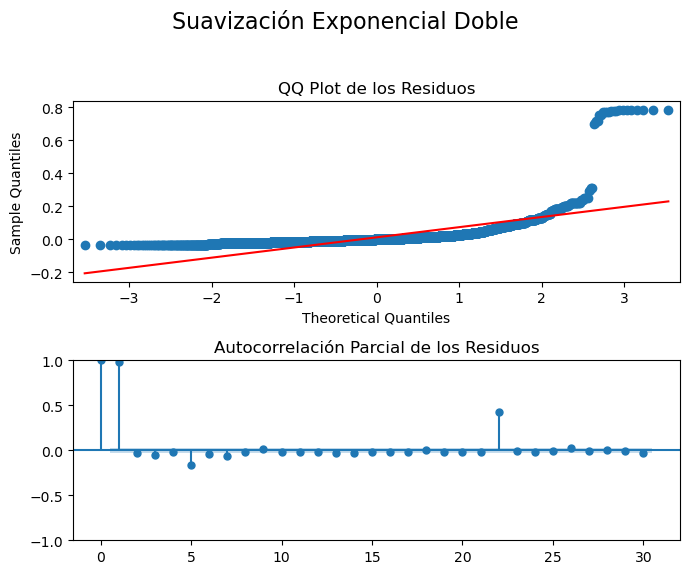

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [730]:
vola21_predicciones, vola21_y_pred_HW2_val_7 = des_model_tuning_train(vola21_train_ts7[-200:], vola21_train_ts7, vola21_val_ts7, step_val=len(vola21_train_ts7), step_test=len(vola21_val_ts7), trend='add')
vola21_y_pred_HW1_train_7 = pd.Series(vola21_predicciones.mean(), index=vola21_train_ts7.index[-1:])  # Esto crea una serie con la media y un índice
vola21_y_pred_HW1_train_7 = pd.Series([vola21_predicciones.mean()] * len(vola21_train_ts7), index=vola21_train_ts7.index)
vola21_y_pred_HW1_train_7_df = pd.DataFrame(vola21_y_pred_HW1_train_7, columns=['vola21_Predicciones'])

vola21_metrica_HW2_train =plot_residual_train('Suavización Exponencial Doble','DES HW' , vola21_train_ts7, vola21_y_pred_HW1_train_7)

A continuación se realizan las predicciones para el modelo de suavización exponencial Holt-Winters: 

* **Ventana de 7 días ($\omega = 7)$**

In [731]:
vola21_y_pred_HW2_val_7, vola21_y_pred_HW2_test_7  = des_model_tuning(vola21_train_ts7[-200:], vola21_val_ts7, vola21_test_ts7, step_val=vola21_tau_val7, step_test=vola21_tau_test7, trend='add')

In [732]:
vola21_metrica_DES_HW_val7 = metricas(vola21_val_ts7,vola21_y_pred_HW2_val_7)
vola21_metrica_DES_HW_val7.index = vola21_metrica_DES_HW_val7.index.map({0: 'DES HW Val vola21 (τ = 7)'})
vola21_metrica_DES_HW_val7

,SSE,MAPE,MAD,MSD,R2
DES HW Val vola21 (τ = 7),0.0005,33.97%,0.01,0.0,-641.15%


In [733]:
vola21_metrica_DES_HW_test7 = metricas(vola21_test_ts7,vola21_y_pred_HW2_test_7)
vola21_metrica_DES_HW_test7.index = vola21_metrica_DES_HW_test7.index.map({0: 'DES HW Prueba vola21 (τ = 7)'})
vola21_metrica_DES_HW_test7

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola21 (τ = 7),0.0002,20.31%,0.0,0.0,-7322.53%


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [734]:
vola21_ljung_box_pval_des_hw7, vola21_jarque_bera_pval_des_hw7 = evaluate_residuals(vola21_test_ts7, vola21_y_pred_HW2_test_7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [735]:
vola21_metrica_DES_HW_test7['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_des_hw7], index=vola21_metrica_DES_HW_test7.index)
vola21_metrica_DES_HW_test7['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_des_hw7], index=vola21_metrica_DES_HW_test7.index)
vola21_metrica_DES_HW_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola21 (τ = 7),0.0002,20.31%,0.0,0.0,-7322.53%,0.0698,0.7558


* **Ventana de 14 días ($\omega = 14)$**

In [736]:
vola21_y_pred_HW2_val_14, vola21_y_pred_HW2_test_14 = des_model_tuning(vola21_train_ts14[-200:], vola21_val_ts14, vola21_test_ts14, step_val=vola21_tau_val14, step_test=vola21_tau_test14, trend='add')


In [737]:
vola21_metrica_DES_HW_val14 = metricas(vola21_val_ts14, vola21_y_pred_HW2_val_14)
vola21_metrica_DES_HW_val14.index = vola21_metrica_DES_HW_val14.index.map({0: 'DES HW Val vola21 (τ = 14)'})
vola21_metrica_DES_HW_val14


,SSE,MAPE,MAD,MSD,R2
DES HW Val vola21 (τ = 14),0.0004,20.11%,0.0,0.0,-261.89%


In [738]:
vola21_metrica_DES_HW_test14 = metricas(vola21_test_ts14, vola21_y_pred_HW2_test_14)
vola21_metrica_DES_HW_test14.index = vola21_metrica_DES_HW_test14.index.map({0: 'DES HW Prueba vola21 (τ = 14)'})
vola21_metrica_DES_HW_test14


,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola21 (τ = 14),1.0959e-05,4.73%,0.0,0.0,-77.96%


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [739]:
vola21_ljung_box_pval_des_hw14, vola21_jarque_bera_pval_des_hw14 = evaluate_residuals(vola21_test_ts14, vola21_y_pred_HW2_test_14)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [740]:
vola21_metrica_DES_HW_test14['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_des_hw14], index=vola21_metrica_DES_HW_test14.index)
vola21_metrica_DES_HW_test14['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_des_hw14], index=vola21_metrica_DES_HW_test14.index)
vola21_metrica_DES_HW_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola21 (τ = 14),1.0959e-05,4.73%,0.0,0.0,-77.96%,0.0193,0.348


* **Ventana de 21 días ($\omega = 21)$**

In [741]:
vola21_y_pred_HW2_val_21, vola21_y_pred_HW2_test_21 = des_model_tuning(vola21_train_ts21[-200:], vola21_val_ts21, vola21_test_ts21, step_val=vola21_tau_val21, step_test=vola21_tau_test21, trend='add')



In [742]:
vola21_metrica_DES_HW_val21 = metricas(vola21_val_ts21, vola21_y_pred_HW2_val_21)
vola21_metrica_DES_HW_val21.index = vola21_metrica_DES_HW_val21.index.map({0: 'DES HW Val vola21 (τ = 21)'})
vola21_metrica_DES_HW_val21


,SSE,MAPE,MAD,MSD,R2
DES HW Val vola21 (τ = 21),0.0004,14.24%,0.0,0.0,-77.24%


In [743]:
vola21_metrica_DES_HW_test21 = metricas(vola21_test_ts21, vola21_y_pred_HW2_test_21)
vola21_metrica_DES_HW_test21.index = vola21_metrica_DES_HW_test21.index.map({0: 'DES HW Prueba vola21 (τ = 21)'})
vola21_metrica_DES_HW_test21

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola21 (τ = 21),0.0028,29.22%,0.01,0.0,-113.99%


A continuación realizamos un análisis sobre los residuales de nuestro conjunto de prueba (test)

In [744]:
vola21_ljung_box_pval_des_hw21, vola21_jarque_bera_pval_des_hw21 = evaluate_residuals(vola21_test_ts21, vola21_y_pred_HW2_test_21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [745]:
vola21_metrica_DES_HW_test21['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_des_hw21], index=vola21_metrica_DES_HW_test21.index)
vola21_metrica_DES_HW_test21['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_des_hw21], index=vola21_metrica_DES_HW_test21.index)
vola21_metrica_DES_HW_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola21 (τ = 21),0.0028,29.22%,0.01,0.0,-113.99%,1.0013e-05,0.3167


* **Ventana de 28 días ($\omega = 28)$**

In [746]:
vola21_y_pred_HW2_val_28, vola21_y_pred_HW2_test_28 = des_model_tuning(vola21_train_ts28[-200:], vola21_val_ts28, vola21_test_ts28, step_val=vola21_tau_val28, step_test=vola21_tau_test28, trend='add')



In [747]:
vola21_metrica_DES_HW_val28 = metricas(vola21_val_ts28, vola21_y_pred_HW2_val_28)
vola21_metrica_DES_HW_val28.index = vola21_metrica_DES_HW_val28.index.map({0: 'DES HW Val vola21 (τ = 28)'})
vola21_metrica_DES_HW_val28


,SSE,MAPE,MAD,MSD,R2
DES HW Val vola21 (τ = 28),0.001,26.56%,0.01,0.0,-208.62%


In [748]:
vola21_metrica_DES_HW_test28 = metricas(vola21_test_ts28, vola21_y_pred_HW2_test_28)
vola21_metrica_DES_HW_test28.index = vola21_metrica_DES_HW_test28.index.map({0: 'DES HW Prueba vola21 (τ = 28)'})
vola21_metrica_DES_HW_test28

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola21 (τ = 28),0.0147,57.84%,0.02,0.0,-925.97%


A continuación realizamos un análisis sobre los residuales de nuestro conjunto de prueba (test)

In [749]:
vola21_ljung_box_pval_des_hw28, vola21_jarque_bera_pval_des_hw28 = evaluate_residuals(vola21_test_ts28, vola21_y_pred_HW2_test_28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [750]:
vola21_metrica_DES_HW_test28['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_des_hw28], index=vola21_metrica_DES_HW_test28.index)
vola21_metrica_DES_HW_test28['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_des_hw28], index=vola21_metrica_DES_HW_test28.index)
vola21_metrica_DES_HW_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola21 (τ = 28),0.0147,57.84%,0.02,0.0,-925.97%,2.9076e-06,0.5881


#### <font color="#30143">ARIMA (Usando Rolling)</font> 

A continuación se define función de ajuste del modelo y predicciones ARIMA.

In [751]:
def arima_model_fit(train):
    """
    Ajusta un modelo ARIMA a los datos de entrenamiento y selecciona el mejor modelo basado en el AIC.
    La función recibe los conjuntos de datos `train` y `val`.

    :param train: Conjunto de datos de entrenamiento (serie temporal).
    :param val: Conjunto de datos de validación (opcional, para verificar el rendimiento del modelo).
    :return: El modelo ajustado, el mejor AIC, el mejor orden (p, d, q) y los datos de entrenamiento.
    """
    model_filename = 'vola21_best_arima_model.pkl'
    
    # Si el mejor modelo ya existe, cargarlo y evitar volver a ejecutar el ciclo for
    if os.path.exists(model_filename):
        print(f"Mejor modelo ya existe. Cargando desde {model_filename}.")
        with open(model_filename, 'rb') as f:
            best_model_global = pickle.load(f)
        return best_model_global, None, None

    # Inicializamos el mejor AIC y BIC en infinito
    best_aic = np.inf
    best_bic = np.inf
    best_order = None
    best_mdl = None
   
    # Rango de p, d, q para probar diferentes combinaciones
    pq_rng = range(3)  # Esto es para p y q (máximo 2)
    d_rng  = range(2)  # Esto es para d (máximo 1)

    # Iterar sobre los valores posibles de p, d y q
    for p in pq_rng:
        for d in d_rng:
            for q in pq_rng:
                try:
                    # Ajustar el modelo ARIMA para los valores de p, d, q
                    tmp_mdl = ARIMA(train, order=(p, d, q)).fit()
                    tmp_aic = tmp_mdl.aic  # Obtener el AIC del modelo ajustado
                    
                    # Si el AIC actual es mejor, actualizar los mejores valores
                    if tmp_aic < best_aic:
                        best_aic = tmp_aic
                        best_order = (p, d, q)
                        best_mdl = tmp_mdl
                except Exception as e:
                    print(f"Error ajustando ARIMA({p},{d},{q}): {e}")
                    continue  # Si hay un error, continuar con el siguiente intento

    # Imprimir los resultados del mejor modelo encontrado
    print(f"\nMejor modelo ARIMA:")
    print(f'Best AIC: {best_aic}')
    print(f'Best Order: {best_order}')
    print(f'aic: {best_aic:6.5f} | order: {best_order}')

    # Ajustar el modelo ARIMA final con el mejor orden
    model = ARIMA(train, order=best_order)
    model_fit = model.fit()

    # Guardar el mejor modelo en un archivo con pickle
    with open('vola21_best_arima_model.pkl', 'wb') as f:
        pickle.dump(best_mdl, f)
    print(f"\nMejor modelo ARIMA guardado con AIC {best_aic}")

    # Retornar el modelo ajustado, el mejor AIC y el mejor orden
    return model_fit, best_aic, best_order

A continuación se define la función `arima_rolling()`

In [752]:
def arima_rolling(history, val, best_order): # arima_rolling(train.tolist(), val, test_nd, best_order)
    
    predictions = list()
    for t in range(len(val)):
        model = ARIMA(history, order=best_order)
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = val[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat, obs))
        
    return predictions

La siguiente función devuelve los parámetros `p`, `d`, `q` que definen `el mejor modelo ARIMA` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste. Además, proporciona los resultados del modelo `ARIMA ajustado` para `datos de entrenamiento`, incluyendo las `fechas` correspondientes. También incluye los datos y fechas del modelo `ARIMA de prueba`, aunque estos últimos dos no son directamente visibles en la salida de la función.


Indexación de parámetros para la función `arima_model_fit()`

In [753]:
vola21_model_fit, vola21_best_aic, vola21_best_order = arima_model_fit(vola21_train_ts7)
vola21_best_order = vola21_model_fit.model.order


Mejor modelo ARIMA:
Best AIC: -28714.23657802384
Best Order: (2, 0, 2)
aic: -28714.23658 | order: (2, 0, 2)

Mejor modelo ARIMA guardado con AIC -28714.23657802384


In [754]:
print(vola21_best_order)

(2, 0, 2)


A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

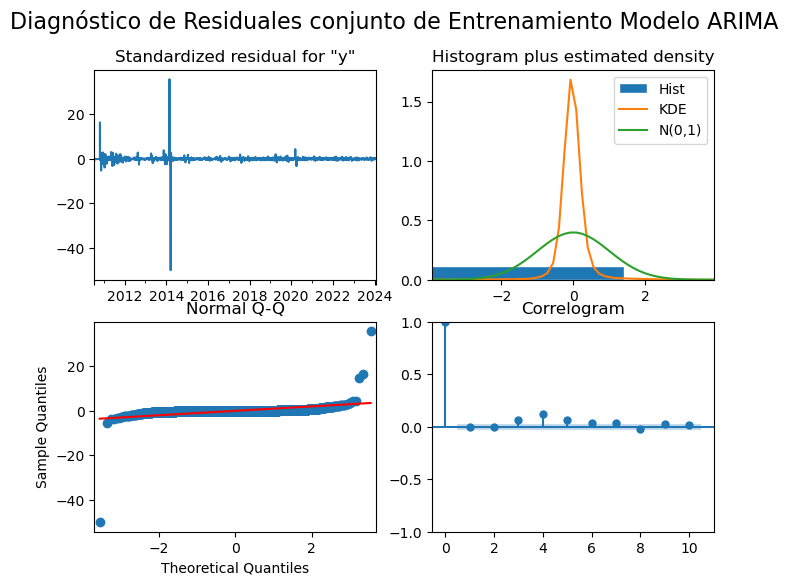

In [755]:
vola21_model_fit.plot_diagnostics(figsize=(8, 6))
plt.suptitle('Diagnóstico de Residuales conjunto de Entrenamiento Modelo ARIMA', fontsize=16)
plt.show()

In [756]:
vola21_residuos_train_arima = vola21_model_fit.resid
vola21_ljung_box_pval_arima_train, vola21_jarque_bera_pval_arima_train = evaluate_residuals_train_arima(vola21_residuos_train_arima)

Ljung-Box LB Statistic: 0.030465
Ljung-Box p-value: 0.861439
No se rechaza H0: los residuales son independientes (no correlacionados).
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [757]:
# Extraer predicciones para todo el conjunto de entrenamiento sin estandarizar 
vola21_predicciones = vola21_model_fit.get_prediction(start=0, end=len(vola21_train_ts7)-1, dynamic=False)
vola21_yhvola21_arima_train = vola21_predicciones.predicted_mean

vola21_yhvola21_arima_train.index = vola21_train_ts7.index # yhvola21_arima_train mismo índice que price_train_ts7

#calcular las métricas 
vola21_metrica_arima_train = metricas(vola21_train_ts7,vola21_yhvola21_arima_train)
vola21_metrica_arima_train.index = vola21_metrica_arima_train.index.map({0: 'Arima Entrenamiento vola21'})
vola21_metrica_arima_train['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_arima_train], index=vola21_metrica_arima_train.index)
vola21_metrica_arima_train['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_arima_train], index=vola21_metrica_arima_train.index)
vola21_metrica_arima_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Entrenamiento vola21,0.8686,6.38%,0.0,0.0,95.38%,0.8614,0.0


La función `arima_rolling()` devuelve las prediciones, con base a los parámetros `p`, `d`, `q` que definen `el mejor modelo ARIMA` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste, aprovechando datos históricos para pronosticar continuamente la concentración de PM10 durante un período (horizonte) específico.

A continuación se indexan los parámetros de la función `arima_rolling()` para las ventanas de 7, 14, 21 y 28 días para la predicción sobre los datos de `validación` y `prueba`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [758]:
# best_aic_arima = best_ order
vola21_val_l7 = vola21_val_ts7.tolist()
vola21_train_l7 = vola21_train_ts7.tolist()
vola21_yhvola21_val_arimarolling7  = arima_rolling(vola21_train_l7, vola21_val_l7, vola21_best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola21_yhvola21_val_arimarolling7 = pd.Series(vola21_yhvola21_val_arimarolling7, index=vola21_val_ts7.index)  # Indexa las fechas de price_val_ts7

predicted=0.030786, expected=0.026634
predicted=0.027372, expected=0.026460
predicted=0.026686, expected=0.026288
predicted=0.026929, expected=0.026504
predicted=0.026830, expected=0.020630
predicted=0.021134, expected=0.020659
predicted=0.021173, expected=0.019930


* **Predicciones datos de Prueba**: 

In [759]:
# best_aic_arima = best_ order
vola21_test_l7 = vola21_test_ts7.tolist()
vola21_train_l7 = vola21_train_ts7.tolist()
vola21_yhvola21_test_arimarolling7  = arima_rolling(vola21_train_l7, vola21_test_l7, vola21_best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola21_yhvola21_test_arimarolling7 = pd.Series(vola21_yhvola21_test_arimarolling7, index=vola21_test_ts7.index)  # Indexa las fechas de price_test_ts7

predicted=0.030786, expected=0.019544
predicted=0.019846, expected=0.019369
predicted=0.019472, expected=0.020242
predicted=0.021864, expected=0.018844
predicted=0.019122, expected=0.020405
predicted=0.021239, expected=0.020431
predicted=0.021009, expected=0.020334


In [760]:
plot_model(vola21_train_ts7[-100:], vola21_val_ts7, vola21_test_ts7, vola21_yhvola21_val_arimarolling7, vola21_yhvola21_test_arimarolling7, title="Predicciones usando ARIMA rolling ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [761]:
vola21_ljung_box_pval_arimarol7, vola21_jarque_bera_pval_arimarol7 = evaluate_residuals(vola21_test_ts7, vola21_yhvola21_test_arimarolling7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [762]:
vola21_metrica_arimarol_test7 = metricas(vola21_test_ts7,vola21_yhvola21_test_arimarolling7)
vola21_metrica_arimarol_test7.index = vola21_metrica_arimarol_test7.index.map({0: 'Arima Rolling Prueba vola21 (τ = 7)'})
vola21_metrica_arimarol_test7['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_arimarol7], index=vola21_metrica_arimarol_test7.index)
vola21_metrica_arimarol_test7['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_arimarol7], index=vola21_metrica_arimarol_test7.index)
vola21_metrica_arimarol_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola21 (τ = 7),0.0001,13.34%,0.0,0.0,-5785.42%,0.7613,0.1659


* **Ventana de 14 días ($\omega = 14)$**

* **Datos de Validación**: 

In [763]:
# best_aic_arima = best_ order
vola21_val_l14 = vola21_val_ts14.tolist()
vola21_train_l14 = vola21_train_ts14.tolist()
vola21_yhvola21_val_arimarolling14 = arima_rolling(vola21_train_l14, vola21_val_l14, vola21_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola21_yhvola21_val_arimarolling14 = pd.Series(vola21_yhvola21_val_arimarolling14, index=vola21_val_ts14.index)  # Indexa las fechas de price_val_ts14


predicted=0.030786, expected=0.026634
predicted=0.027372, expected=0.026460
predicted=0.026686, expected=0.026288
predicted=0.026929, expected=0.026504
predicted=0.026830, expected=0.020630
predicted=0.021134, expected=0.020659
predicted=0.021173, expected=0.019930
predicted=0.020884, expected=0.019544
predicted=0.019895, expected=0.019369
predicted=0.020179, expected=0.020242
predicted=0.020750, expected=0.018844
predicted=0.019585, expected=0.020405
predicted=0.020829, expected=0.020431
predicted=0.021068, expected=0.020334


* **Predicciones datos de Prueba**: 

In [764]:
# best_aic_arima = best_ order
vola21_test_l14 = vola21_test_ts14.tolist()
vola21_train_l14 = vola21_train_ts14.tolist()
vola21_yhvola21_test_arimarolling14 = arima_rolling(vola21_train_l14, vola21_test_l14, vola21_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola21_yhvola21_test_arimarolling14 = pd.Series(vola21_yhvola21_test_arimarolling14, index=vola21_test_ts14.index)  # Indexa las fechas de price_test_ts14

predicted=0.030786, expected=0.016632
predicted=0.016895, expected=0.016979
predicted=0.017001, expected=0.018198
predicted=0.019534, expected=0.017975
predicted=0.017848, expected=0.016233
predicted=0.017168, expected=0.016805
predicted=0.017228, expected=0.016580
predicted=0.017136, expected=0.016320
predicted=0.016822, expected=0.015857
predicted=0.016697, expected=0.015814
predicted=0.016417, expected=0.016387
predicted=0.017224, expected=0.016909
predicted=0.017509, expected=0.016766
predicted=0.017514, expected=0.016279


In [765]:
plot_model(vola21_train_ts14[-100:], vola21_val_ts14, vola21_test_ts14, vola21_yhvola21_val_arimarolling14, vola21_yhvola21_test_arimarolling14, title="Predicciones usando ARIMA rolling ventana de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [766]:
vola21_ljung_box_pval_arimarol14, vola21_jarque_bera_pval_arimarol14 = evaluate_residuals(vola21_test_ts14, vola21_yhvola21_test_arimarolling14)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [767]:
vola21_metrica_arimarol_test14 = metricas(vola21_test_ts14, vola21_yhvola21_test_arimarolling14)
vola21_metrica_arimarol_test14.index = vola21_metrica_arimarol_test14.index.map({0: 'Arima Rolling Prueba vola21 (τ = 14)'})
vola21_metrica_arimarol_test14['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_arimarol14], index=vola21_metrica_arimarol_test14.index)
vola21_metrica_arimarol_test14['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_arimarol14], index=vola21_metrica_arimarol_test14.index)
vola21_metrica_arimarol_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola21 (τ = 14),0.0002,10.54%,0.0,0.0,-3341.22%,0.829,4.1078e-14


* **Ventana de 21 días ($\omega = 21)$**

* **Datos de Validación**: 

In [768]:
# best_aic_arima = best_ order
vola21_val_l21 = vola21_val_ts21.tolist()
vola21_train_l21 = vola21_train_ts21.tolist()
vola21_yhvola21_val_arimarolling21 = arima_rolling(vola21_train_l21, vola21_val_l21, vola21_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola21_yhvola21_val_arimarolling21 = pd.Series(vola21_yhvola21_val_arimarolling21, index=vola21_val_ts21.index)  # Indexa las fechas de price_val_ts21



predicted=0.030786, expected=0.026634
predicted=0.027372, expected=0.026460
predicted=0.026686, expected=0.026288
predicted=0.026929, expected=0.026504
predicted=0.026830, expected=0.020630
predicted=0.021134, expected=0.020659
predicted=0.021173, expected=0.019930
predicted=0.020884, expected=0.019544
predicted=0.019895, expected=0.019369
predicted=0.020179, expected=0.020242
predicted=0.020750, expected=0.018844
predicted=0.019585, expected=0.020405
predicted=0.020829, expected=0.020431
predicted=0.021068, expected=0.020334
predicted=0.020773, expected=0.016632
predicted=0.017229, expected=0.016979
predicted=0.017424, expected=0.018198
predicted=0.019102, expected=0.017975
predicted=0.018517, expected=0.016233
predicted=0.016698, expected=0.016805
predicted=0.017394, expected=0.016580


* **Predicciones datos de Prueba**: 

In [769]:
# best_aic_arima = best_ order
vola21_test_l21 = vola21_test_ts21.tolist()
vola21_train_l21 = vola21_train_ts21.tolist()
vola21_yhvola21_test_arimarolling21 = arima_rolling(vola21_train_l21, vola21_test_l21, vola21_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola21_yhvola21_test_arimarolling21 = pd.Series(vola21_yhvola21_test_arimarolling21, index=vola21_test_ts21.index)  # Indexa las fechas de price_test_ts21


predicted=0.030786, expected=0.016320
predicted=0.016579, expected=0.015857
predicted=0.016265, expected=0.015814
predicted=0.017137, expected=0.016387
predicted=0.016673, expected=0.016909
predicted=0.018061, expected=0.016766
predicted=0.017210, expected=0.016279
predicted=0.017138, expected=0.018819
predicted=0.019422, expected=0.020301
predicted=0.021198, expected=0.026824
predicted=0.027422, expected=0.028013
predicted=0.028860, expected=0.027424
predicted=0.027569, expected=0.027779
predicted=0.028391, expected=0.027801
predicted=0.028132, expected=0.031257
predicted=0.031813, expected=0.035728
predicted=0.036228, expected=0.035518
predicted=0.035827, expected=0.035445
predicted=0.035632, expected=0.035424
predicted=0.035752, expected=0.035129
predicted=0.035301, expected=0.035132


In [770]:
plot_model(vola21_train_ts21[-100:], vola21_val_ts21, vola21_test_ts21, vola21_yhvola21_val_arimarolling21, vola21_yhvola21_test_arimarolling21, title="Predicciones usando ARIMA rolling ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [771]:
vola21_ljung_box_pval_arimarol21, vola21_jarque_bera_pval_arimarol21 = evaluate_residuals(vola21_test_ts21, vola21_yhvola21_test_arimarolling21)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [772]:
vola21_metrica_arimarol_test21 = metricas(vola21_test_ts21, vola21_yhvola21_test_arimarolling21)
vola21_metrica_arimarol_test21.index = vola21_metrica_arimarol_test21.index.map({0: 'Arima Rolling Prueba vola21 (τ = 21)'})
vola21_metrica_arimarol_test21['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_arimarol21], index=vola21_metrica_arimarol_test21.index)
vola21_metrica_arimarol_test21['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_arimarol21], index=vola21_metrica_arimarol_test21.index)
vola21_metrica_arimarol_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola21 (τ = 21),0.0003,8.9%,0.0,0.0,78.73%,0.6004,1.4375e-19


* **Ventana de 28 días ($\omega = 28)$**

* **Datos de Validación**: 

In [773]:
# best_aic_arima = best_ order
vola21_val_l28 = vola21_val_ts28.tolist()
vola21_train_l28 = vola21_train_ts28.tolist()
vola21_yhvola21_val_arimarolling28 = arima_rolling(vola21_train_l28, vola21_val_l28, vola21_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola21_yhvola21_val_arimarolling28 = pd.Series(vola21_yhvola21_val_arimarolling28, index=vola21_val_ts28.index)  # Indexa las fechas de price_val_ts28


predicted=0.030786, expected=0.026634
predicted=0.027372, expected=0.026460
predicted=0.026686, expected=0.026288
predicted=0.026929, expected=0.026504
predicted=0.026830, expected=0.020630
predicted=0.021134, expected=0.020659
predicted=0.021173, expected=0.019930
predicted=0.020884, expected=0.019544
predicted=0.019895, expected=0.019369
predicted=0.020179, expected=0.020242
predicted=0.020750, expected=0.018844
predicted=0.019585, expected=0.020405
predicted=0.020829, expected=0.020431
predicted=0.021068, expected=0.020334
predicted=0.020773, expected=0.016632
predicted=0.017229, expected=0.016979
predicted=0.017424, expected=0.018198
predicted=0.019102, expected=0.017975
predicted=0.018517, expected=0.016233
predicted=0.016698, expected=0.016805
predicted=0.017394, expected=0.016580
predicted=0.017403, expected=0.016320
predicted=0.016903, expected=0.015857
predicted=0.016627, expected=0.015814
predicted=0.016451, expected=0.016387
predicted=0.017169, expected=0.016909
predicted=0.

* **Predicciones datos de Prueba**: 

In [774]:
# best_aic_arima = best_ order
vola21_test_l28 = vola21_test_ts28.tolist()
vola21_train_l28 = vola21_train_ts28.tolist()
vola21_yhvola21_test_arimarolling28 = arima_rolling(vola21_train_l28, vola21_test_l28, vola21_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola21_yhvola21_test_arimarolling28 = pd.Series(vola21_yhvola21_test_arimarolling28, index=vola21_test_ts28.index)  # Indexa las fechas de price_test_ts28

predicted=0.030786, expected=0.018819
predicted=0.019111, expected=0.020301
predicted=0.020390, expected=0.026824
predicted=0.028092, expected=0.028013
predicted=0.028340, expected=0.027424
predicted=0.027955, expected=0.027779
predicted=0.028050, expected=0.027801
predicted=0.028477, expected=0.031257
predicted=0.031635, expected=0.035728
predicted=0.036431, expected=0.035518
predicted=0.035778, expected=0.035445
predicted=0.035609, expected=0.035424
predicted=0.035714, expected=0.035129
predicted=0.035334, expected=0.035132
predicted=0.035392, expected=0.035447
predicted=0.035693, expected=0.035845
predicted=0.036110, expected=0.035463
predicted=0.035694, expected=0.036052
predicted=0.036300, expected=0.036808
predicted=0.038066, expected=0.040319
predicted=0.040569, expected=0.040965
predicted=0.041563, expected=0.040295
predicted=0.040277, expected=0.044191
predicted=0.044412, expected=0.044059
predicted=0.044234, expected=0.044563
predicted=0.044454, expected=0.044883
predicted=0.

In [775]:
plot_model(vola21_train_ts28[-100:], vola21_val_ts28, vola21_test_ts28, vola21_yhvola21_val_arimarolling28, vola21_yhvola21_test_arimarolling28, title="Predicciones usando ARIMA rolling ventana de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [776]:
vola21_ljung_box_pval_arimarol28, vola21_jarque_bera_pval_arimarol28 = evaluate_residuals(vola21_test_ts28, vola21_yhvola21_test_arimarolling28)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [777]:
vola21_metrica_arimarol_test28 = metricas(vola21_test_ts28, vola21_yhvola21_test_arimarolling28)
vola21_metrica_arimarol_test28.index = vola21_metrica_arimarol_test28.index.map({0: 'Arima Rolling Prueba vola21 (τ = 28)'})
vola21_metrica_arimarol_test28['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_arimarol28], index=vola21_metrica_arimarol_test28.index)
vola21_metrica_arimarol_test28['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_arimarol28], index=vola21_metrica_arimarol_test28.index)
vola21_metrica_arimarol_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola21 (τ = 28),0.0002,5.5%,0.0,0.0,83.45%,0.8476,7.7161e-26


#### <font color="#30143">ARIMA (Sin Rolling)</font> 

A continuación se procede con la predicción del precio del bitcoin usando `forecast()`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [778]:
vola21_yhvola21_val_arima7 = vola21_model_fit.forecast(steps=len(vola21_val_ts7))
print(vola21_yhvola21_val_arima7)

2024-01-29    0.0308
2024-01-30    0.0316
2024-01-31    0.0322
2024-02-01    0.0329
2024-02-02    0.0336
2024-02-03    0.0342
2024-02-04    0.0348
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [779]:
vola21_yhvola21_test_arima7 = vola21_model_fit.forecast(steps=len(vola21_test_ts7))
vola21_yhvola21_test_arima7 = pd.Series(vola21_yhvola21_test_arima7)
vola21_yhvola21_test_arima7.index = vola21_test_ts7.index # Asigna el índice de las fechas de price_test_ts7
print(vola21_yhvola21_test_arima7)


Date
2024-02-05    0.0308
2024-02-06    0.0316
2024-02-07    0.0322
2024-02-08    0.0329
2024-02-09    0.0336
2024-02-10    0.0342
2024-02-11    0.0348
Name: predicted_mean, dtype: float64


In [780]:
plot_model(vola21_train_ts7[-200:], vola21_val_ts7, vola21_test_ts7, vola21_yhvola21_val_arima7, vola21_yhvola21_test_arima7, title="Predicciones usando ARIMA ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [781]:
vola21_ljung_box_pval_arima7, vola21_jarque_bera_pval_arima7 = evaluate_residuals(vola21_test_ts7, vola21_yhvola21_test_arima7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [782]:
vola21_metrica_arima_test7 = metricas(vola21_test_ts7,vola21_yhvola21_test_arima7)
vola21_metrica_arima_test7.index = vola21_metrica_arima_test7.index.map({0: 'Arima prueba vola21 (τ = 7)'})
vola21_metrica_arima_test7['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_arima7], index=vola21_metrica_arima_test7.index)
vola21_metrica_arima_test7['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_arima7], index=vola21_metrica_arima_test7.index)
vola21_metrica_arima_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola21 (τ = 7),0.0012,65.34%,0.01,0.0,-50210.35%,0.3404,0.7348


* **Ventana de 14 días ($\omega = 14)$**

* **Predicciones datos de Validación**: 

In [783]:
vola21_yhvola21_val_arima14 = vola21_model_fit.forecast(steps=len(vola21_val_ts14))
print(vola21_yhvola21_val_arima14)


2024-01-29    0.0308
2024-01-30    0.0316
2024-01-31    0.0322
2024-02-01    0.0329
2024-02-02    0.0336
2024-02-03    0.0342
2024-02-04    0.0348
2024-02-05    0.0354
2024-02-06    0.0360
2024-02-07    0.0366
2024-02-08    0.0371
2024-02-09    0.0377
2024-02-10    0.0382
2024-02-11    0.0387
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [784]:
vola21_yhvola21_test_arima14 = vola21_model_fit.forecast(steps=len(vola21_test_ts14))
vola21_yhvola21_test_arima14 = pd.Series(vola21_yhvola21_test_arima14)
vola21_yhvola21_test_arima14.index = vola21_test_ts14.index  # Asigna el índice de las fechas de price_test_ts14
print(vola21_yhvola21_test_arima14)


Date
2024-02-12    0.0308
2024-02-13    0.0316
2024-02-14    0.0322
2024-02-15    0.0329
2024-02-16    0.0336
2024-02-17    0.0342
2024-02-18    0.0348
2024-02-19    0.0354
2024-02-20    0.0360
2024-02-21    0.0366
2024-02-22    0.0371
2024-02-23    0.0377
2024-02-24    0.0382
2024-02-25    0.0387
Name: predicted_mean, dtype: float64


In [785]:
plot_model(vola21_train_ts14[-200:], vola21_val_ts14, vola21_test_ts14, vola21_yhvola21_val_arima14, vola21_yhvola21_test_arima14, title="Predicciones usando ARIMA ventana de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [786]:
vola21_ljung_box_pval_arima14, vola21_jarque_bera_pval_arima14 = evaluate_residuals(vola21_test_ts14, vola21_yhvola21_test_arima14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [787]:
vola21_metrica_arima_test14 = metricas(vola21_test_ts14, vola21_yhvola21_test_arima14)
vola21_metrica_arima_test14.index = vola21_metrica_arima_test14.index.map({0: 'Arima prueba vola21 (τ = 14)'})
vola21_metrica_arima_test14['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_arima14], index=vola21_metrica_arima_test14.index)
vola21_metrica_arima_test14['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_arima14], index=vola21_metrica_arima_test14.index)
vola21_metrica_arima_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola21 (τ = 14),0.0048,110.13%,0.02,0.0,-77748.25%,0.001,0.5358


* **Ventana de 21 días ($\omega = 21)$**

* **Predicciones datos de Validación**: 

In [788]:
vola21_yhvola21_val_arima21 = vola21_model_fit.forecast(steps=len(vola21_val_ts21))
print(vola21_yhvola21_val_arima21)


2024-01-29    0.0308
2024-01-30    0.0316
2024-01-31    0.0322
2024-02-01    0.0329
2024-02-02    0.0336
2024-02-03    0.0342
2024-02-04    0.0348
2024-02-05    0.0354
2024-02-06    0.0360
2024-02-07    0.0366
2024-02-08    0.0371
2024-02-09    0.0377
2024-02-10    0.0382
2024-02-11    0.0387
2024-02-12    0.0392
2024-02-13    0.0397
2024-02-14    0.0401
2024-02-15    0.0406
2024-02-16    0.0410
2024-02-17    0.0415
2024-02-18    0.0419
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [789]:
vola21_yhvola21_test_arima21 = vola21_model_fit.forecast(steps=len(vola21_test_ts21))
vola21_yhvola21_test_arima21 = pd.Series(vola21_yhvola21_test_arima21)
vola21_yhvola21_test_arima21.index = vola21_test_ts21.index  # Asigna el índice de las fechas de price_test_ts21
print(vola21_yhvola21_test_arima21)


Date
2024-02-19    0.0308
2024-02-20    0.0316
2024-02-21    0.0322
2024-02-22    0.0329
2024-02-23    0.0336
2024-02-24    0.0342
2024-02-25    0.0348
2024-02-26    0.0354
2024-02-27    0.0360
2024-02-28    0.0366
2024-02-29    0.0371
2024-03-01    0.0377
2024-03-02    0.0382
2024-03-03    0.0387
2024-03-04    0.0392
2024-03-05    0.0397
2024-03-06    0.0401
2024-03-07    0.0406
2024-03-08    0.0410
2024-03-09    0.0415
2024-03-10    0.0419
Name: predicted_mean, dtype: float64


In [790]:
plot_model(vola21_train_ts21[-200:], vola21_val_ts21, vola21_test_ts21, vola21_yhvola21_val_arima21, vola21_yhvola21_test_arima21, title="Predicciones usando ARIMA ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [791]:
vola21_ljung_box_pval_arima21, vola21_jarque_bera_pval_arima21 = evaluate_residuals(vola21_test_ts21, vola21_yhvola21_test_arima21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [792]:
vola21_metrica_arima_test21 = metricas(vola21_test_ts21, vola21_yhvola21_test_arima21)
vola21_metrica_arima_test21.index = vola21_metrica_arima_test21.index.map({0: 'Arima prueba vola21 (τ = 21)'})
vola21_metrica_arima_test21['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_arima21], index=vola21_metrica_arima_test21.index)
vola21_metrica_arima_test21['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_arima21], index=vola21_metrica_arima_test21.index)
vola21_metrica_arima_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola21 (τ = 21),0.0032,55.91%,0.01,0.0,-145.32%,1.1289e-05,0.37


* **Ventana de 28 días ($\omega = 28)$**

* **Predicciones datos de Validación**: 

In [793]:
vola21_yhvola21_val_arima28 = vola21_model_fit.forecast(steps=len(vola21_val_ts28))
print(vola21_yhvola21_val_arima28)



2024-01-29    0.0308
2024-01-30    0.0316
2024-01-31    0.0322
2024-02-01    0.0329
2024-02-02    0.0336
2024-02-03    0.0342
2024-02-04    0.0348
2024-02-05    0.0354
2024-02-06    0.0360
2024-02-07    0.0366
2024-02-08    0.0371
2024-02-09    0.0377
2024-02-10    0.0382
2024-02-11    0.0387
2024-02-12    0.0392
2024-02-13    0.0397
2024-02-14    0.0401
2024-02-15    0.0406
2024-02-16    0.0410
2024-02-17    0.0415
2024-02-18    0.0419
2024-02-19    0.0423
2024-02-20    0.0427
2024-02-21    0.0430
2024-02-22    0.0434
2024-02-23    0.0438
2024-02-24    0.0441
2024-02-25    0.0445
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [794]:
vola21_yhvola21_test_arima28 = vola21_model_fit.forecast(steps=len(vola21_test_ts28))
vola21_yhvola21_test_arima28 = pd.Series(vola21_yhvola21_test_arima28)
vola21_yhvola21_test_arima28.index = vola21_test_ts28.index  # Asigna el índice de las fechas de price_test_ts28
print(vola21_yhvola21_test_arima28)


Date
2024-02-26    0.0308
2024-02-27    0.0316
2024-02-28    0.0322
2024-02-29    0.0329
2024-03-01    0.0336
2024-03-02    0.0342
2024-03-03    0.0348
2024-03-04    0.0354
2024-03-05    0.0360
2024-03-06    0.0366
2024-03-07    0.0371
2024-03-08    0.0377
2024-03-09    0.0382
2024-03-10    0.0387
2024-03-11    0.0392
2024-03-12    0.0397
2024-03-13    0.0401
2024-03-14    0.0406
2024-03-15    0.0410
2024-03-16    0.0415
2024-03-17    0.0419
2024-03-18    0.0423
2024-03-19    0.0427
2024-03-20    0.0430
2024-03-21    0.0434
2024-03-22    0.0438
2024-03-23    0.0441
2024-03-24    0.0445
Name: predicted_mean, dtype: float64


In [795]:
plot_model(vola21_train_ts28[-200:], vola21_val_ts28, vola21_test_ts28, vola21_yhvola21_val_arima28, vola21_yhvola21_test_arima28, title="Predicciones usando ARIMA ventana de 28 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [796]:
vola21_ljung_box_pval_arima28, vola21_jarque_bera_pval_arima28 = evaluate_residuals(vola21_test_ts28, vola21_yhvola21_test_arima28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [797]:
vola21_metrica_arima_test28 = metricas(vola21_test_ts28, vola21_yhvola21_test_arima28)
vola21_metrica_arima_test28.index = vola21_metrica_arima_test28.index.map({0: 'Arima prueba vola21 (τ = 28)'})
vola21_metrica_arima_test28['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_arima28], index=vola21_metrica_arima_test28.index)
vola21_metrica_arima_test28['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_arima28], index=vola21_metrica_arima_test28.index)
vola21_metrica_arima_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola21 (τ = 28),0.0006,12.8%,0.0,0.0,57.97%,6.1020e-05,0.2512


#### <font color="#30143">Modelo con Heterocedasticidad Condicional Autorregresiva Generalizado - GARCH (Usando Rolling)</font> 

A continuación se define función de ajuste del modelo y predicciones GARCH.

In [798]:
import os
import pickle
import numpy as np
import pandas as pd
from arch import arch_model

def garch_model_fit(train):
    """
    Ajusta un modelo GARCH a los datos de entrenamiento y selecciona el mejor modelo basado en el AIC.
    La función recibe el conjunto de datos `train`.

    :param train: Conjunto de datos de entrenamiento (serie temporal).
    :return: El modelo ajustado, el mejor AIC, los mejores parámetros (p, q) y los datos de entrenamiento.
    """
    model_filename = 'vola21_best_garch_model.pkl'
    
    # Si el mejor modelo ya existe, cargarlo y evitar volver a ejecutar el ciclo for
    if os.path.exists(model_filename):
        print(f"Mejor modelo ya existe. Cargando desde {model_filename}.")
        with open(model_filename, 'rb') as f:
            best_model_global = pickle.load(f)
        return best_model_global, None, None

    # Inicializamos el mejor AIC en infinito
    best_aic = np.inf
    best_order = None
    best_mdl = None

    # Rango de p y q para probar diferentes combinaciones
    p_rng = range(4)  # Máximo 2 para p
    q_rng = range(3)  # Máximo 2 para q

    # Iterar sobre los valores posibles de p y q
    for p in p_rng:
        for q in q_rng:
            try:
                # Ajustar el modelo GARCH para los valores de p y q
                tmp_mdl = arch_model(train, vol='Garch', p=p, q=q).fit(disp="off")
                tmp_aic = tmp_mdl.aic  # Obtener el AIC del modelo ajustado
                
                # Si el AIC actual es mejor, actualizar los mejores valores
                if tmp_aic < best_aic:
                    best_aic = tmp_aic
                    best_order = (p, q)
                    best_mdl = tmp_mdl
            except Exception as e:
                print(f"Error ajustando GARCH({p},{q}): {e}")
                continue  # Si hay un error, continuar con el siguiente intento

    # Imprimir los resultados del mejor modelo encontrado
    print(f"\nMejor modelo GARCH:")
    print(f'Best AIC: {best_aic}')
    print(f'Best Order: {best_order}')
    print(f'aic: {best_aic:6.5f} | order: {best_order}')

    # Guardar el mejor modelo en un archivo con pickle
    with open(model_filename, 'wb') as f:
        pickle.dump(best_mdl, f)
    print(f"\nMejor modelo GARCH guardado con AIC {best_aic}")

    # Retornar el modelo ajustado, el mejor AIC y los mejores parámetros
    return best_mdl, best_aic, best_order


A continuación se define la función `garch_rolling()`

In [799]:
from arch import arch_model

def garch_rolling(history, val, best_order, horizon):
    predictions = list()

    for t in range(len(val)):
        model = arch_model(history, vol='Garch', p=best_order[0], q=best_order[1])
        model_fit = model.fit(disp="off")
        forecast = model_fit.forecast(horizon=horizon) #obtener las predicciones para un horizonte de 7 días
        yhat = forecast.mean.values[-1, :]  # Obtener la predicción media
        predictions.append(yhat[0])  # Agregar la predicción a la lista
        obs = val[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat[0], obs))
        
    return predictions

La siguiente función devuelve los parámetros `p`, `q` que definen `el mejor modelo GARCH` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste. Además, proporciona los resultados del modelo `GARCH ajustado` para `datos de entrenamiento`, incluyendo las `fechas` correspondientes. También incluye los datos y fechas del modelo `GARCH de prueba`, aunque estos últimos dos no son directamente visibles en la salida de la función.

Indexación de parámetros para la función `garch_model_fit()`

In [800]:
vola21_gmodel_fit, vola21_gbest_aic, vola21_gbest_order = garch_model_fit(vola21_train_ts7)

Error ajustando GARCH(0,0): One of p or o must be strictly positive
Error ajustando GARCH(0,1): One of p or o must be strictly positive
Error ajustando GARCH(0,2): One of p or o must be strictly positive

Mejor modelo GARCH:
Best AIC: -28947.610374547494
Best Order: (1, 2)
aic: -28947.61037 | order: (1, 2)

Mejor modelo GARCH guardado con AIC -28947.610374547494


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




In [801]:
vola21_gbest_order

(1, 2)

In [802]:
vola21_best_p = vola21_gbest_order[0]
vola21_best_q = vola21_gbest_order[1]

print(f"Mejor p: {vola21_best_p}, Mejor q: {vola21_best_q}")

Mejor p: 1, Mejor q: 2


A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

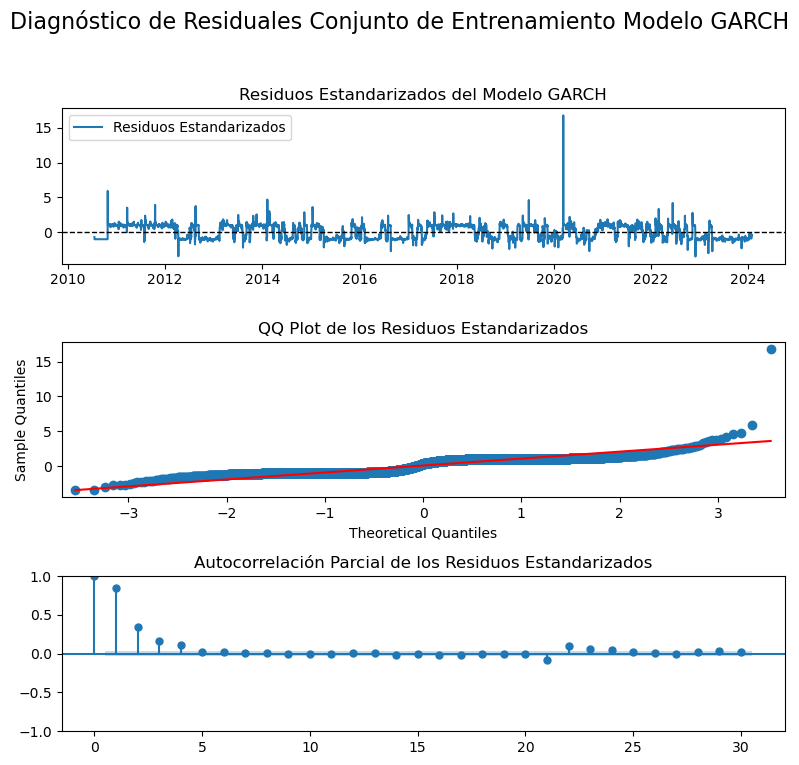

In [803]:
vola21_residuos = vola21_gmodel_fit.resid
vola21_volatilidad = vola21_gmodel_fit.conditional_volatility

# Calcular residuos estandarizados
vola21_residuos_estandarizados = vola21_residuos / vola21_volatilidad

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8, 8))

# Gráfico de residuos estandarizados
axes[0].plot(vola21_residuos_estandarizados, label='Residuos Estandarizados', color='#1f77b4')
axes[0].axhline(0, color='black', linestyle='--', linewidth=1)
axes[0].set_title('Residuos Estandarizados del Modelo GARCH')
axes[0].legend()

# Gráfico QQ plot
sm.qqplot(vola21_residuos_estandarizados, line='s', ax=axes[1])
axes[1].set_title('QQ Plot de los Residuos Estandarizados')

# Gráfico de autocorrelación parcial (PACF)
sm.graphics.tsa.plot_pacf(vola21_residuos_estandarizados, lags=30, ax=axes[2])
axes[2].set_title('Autocorrelación Parcial de los Residuos Estandarizados')

plt.suptitle('Diagnóstico de Residuales Conjunto de Entrenamiento Modelo GARCH', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Ajustar el layout para el título
plt.show()


In [804]:
vola21_residuos_train_garch = vola21_gmodel_fit.resid
vola21_ljung_box_pval_garch_train, vola21_jarque_bera_pval_garch_train = evaluate_residuals_train_arima(vola21_residuos_train_garch)

Ljung-Box LB Statistic: 4716.109188
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [805]:
vola21_predicciones = vola21_gmodel_fit.forecast(horizon=len(vola21_train_ts7))
vola21_yhvola21_garch_train = vola21_predicciones.mean.values[-len(vola21_train_ts7):].flatten()  #Se obtiene la ultima serie de predicciones en un arreglo 1D
vola21_vyhvola21_garch_df = pd.DataFrame(vola21_yhvola21_garch_train, columns=['vola21_Predicciones'], index=vola21_train_ts7.index) #convertir a dataframe para indexar fechas de price_train_ts7

#calcular las métricas 
vola21_metrica_garch_train = metricas(vola21_train_ts7,vola21_yhvola21_garch_train)
vola21_metrica_garch_train.index = vola21_metrica_garch_train.index.map({0: 'Garch Rolling Entrenamiento vola21'})
vola21_metrica_garch_train['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_garch_train], index=vola21_metrica_garch_train.index)
vola21_metrica_garch_train['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_garch_train], index=vola21_metrica_garch_train.index)
vola21_metrica_garch_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Entrenamiento vola21,19.7703,48.79%,0.02,0.0,-5.11%,0.0,0.0


La función `garch_rolling()` devuelve las prediciones, con base a los parámetros `p` y `q` que definen `el mejor modelo GARCH` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste, aprovechando datos históricos para pronosticar continuamente la concentración de PM10 durante un período (horizonte) específico.

A continuación se indexan los parámetros de la función `garch_rolling()` para las ventanas de 7, 14, 21 y 28 días para la predicción sobre los datos de `validación` y `prueba`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [806]:

# best_aic_arima = best_ order
vola21_val_l7 = vola21_val_ts7.tolist()
vola21_train_l7 = vola21_train_ts7.tolist()
vola21_yhvola21_val_garchrolling7  = garch_rolling(vola21_train_l7, vola21_val_l7, vola21_gbest_order, 7) 
vola21_yhvola21_val_garchrolling7 = pd.Series(vola21_yhvola21_val_garchrolling7, index=vola21_val_ts7.index)  # Indexa las fechas de price_val_ts7

predicted=0.031798, expected=0.026634
predicted=0.030508, expected=0.026460
predicted=-42.782773, expected=0.026288
predicted=0.054956, expected=0.026504
predicted=0.037988, expected=0.020630
predicted=0.038949, expected=0.020659
predicted=0.035346, expected=0.019930


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




* **Predicciones datos de Prueba**: 

In [807]:
# best_aic_arima = best_ order
vola21_test_l7 = vola21_test_ts7.tolist()
vola21_train_l7 = vola21_train_ts7.tolist()
vola21_yhvola21_test_garchrolling7  = garch_rolling(vola21_train_l7, vola21_test_l7, vola21_best_order,7) 
vola21_yhvola21_test_garchrolling7 = pd.Series(vola21_yhvola21_test_garchrolling7, index=vola21_test_ts7.index)  # Indexa las fechas de price_test_ts7

predicted=0.033077, expected=0.019544
predicted=0.032709, expected=0.019369
predicted=0.042768, expected=0.020242
predicted=-0.331534, expected=0.018844
predicted=0.032657, expected=0.020405
predicted=-0.030408, expected=0.020431
predicted=0.033973, expected=0.020334


In [808]:
plot_model(vola21_train_ts7[-200:], vola21_val_ts7, vola21_test_ts7, vola21_yhvola21_val_garchrolling7, vola21_yhvola21_test_garchrolling7, title="Predicciones usando GARCH rolling ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [809]:
vola21_ljung_box_pval_garchrol7, vola21_jarque_bera_pval_garchrol7 = evaluate_residuals(vola21_test_ts7, vola21_yhvola21_test_garchrolling7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [810]:
vola21_metrica_garchrol_test7 = metricas(vola21_test_ts7,vola21_yhvola21_test_garchrolling7)
vola21_metrica_garchrol_test7.index = vola21_metrica_garchrol_test7.index.map({0: 'Garch Rolling Prueba vola21 (τ = 7)'})
vola21_metrica_garchrol_test7['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_garchrol7], index=vola21_metrica_garchrol_test7.index)
vola21_metrica_garchrol_test7['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_garchrol7], index=vola21_metrica_garchrol_test7.index)
vola21_metrica_garchrol_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola21 (τ = 7),0.1266,354.95%,0.07,0.02,-5356031.31%,0.3575,0.072


* **Ventana de 14 días ($\omega = 14)$**

* **Predicciones datos de Validación**: 

In [811]:
# best_aic_arima = best_ order
vola21_val_l14 = vola21_val_ts14.tolist()
vola21_train_l14 = vola21_train_ts14.tolist()
vola21_yhvola21_val_garchrolling14 = garch_rolling(vola21_train_l14, vola21_val_l14, vola21_gbest_order, 14) 
vola21_yhvola21_val_garchrolling14 = pd.Series(vola21_yhvola21_val_garchrolling14, index=vola21_val_ts14.index)  # Indexa las fechas de price_val_ts14



predicted=0.031798, expected=0.026634
predicted=0.030508, expected=0.026460
predicted=-42.782773, expected=0.026288
predicted=0.054956, expected=0.026504
predicted=0.037988, expected=0.020630
predicted=0.038949, expected=0.020659
predicted=0.035346, expected=0.019930
predicted=0.038382, expected=0.019544
predicted=0.038892, expected=0.019369
predicted=0.034546, expected=0.020242
predicted=0.038510, expected=0.018844
predicted=0.043115, expected=0.020405


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




predicted=0.036042, expected=0.020431
predicted=0.036423, expected=0.020334


* **Predicciones datos de Prueba**: 

In [812]:
# best_aic_arima = best_ order
vola21_test_l14 = vola21_test_ts14.tolist()
vola21_train_l14 = vola21_train_ts14.tolist()
vola21_yhvola21_test_garchrolling14 = garch_rolling(vola21_train_l14, vola21_test_l14, vola21_best_order, 14) 
vola21_yhvola21_test_garchrolling14 = pd.Series(vola21_yhvola21_test_garchrolling14, index=vola21_test_ts14.index)  # Indexa las fechas de price_test_ts14


predicted=0.033077, expected=0.016632
predicted=0.032686, expected=0.016979
predicted=0.032670, expected=0.018198
predicted=0.042286, expected=0.017975
predicted=0.032544, expected=0.016233
predicted=0.032646, expected=0.016805
predicted=0.033445, expected=0.016580
predicted=0.530196, expected=0.016320
predicted=0.036072, expected=0.015857
predicted=0.032627, expected=0.015814
predicted=0.032609, expected=0.016387
predicted=0.032792, expected=0.016909
predicted=0.048830, expected=0.016766
predicted=0.041581, expected=0.016279


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




In [813]:
plot_model(vola21_train_ts14[-200:], vola21_val_ts14, vola21_test_ts14, vola21_yhvola21_val_garchrolling14, vola21_yhvola21_test_garchrolling14, title="Predicciones usando GARCH rolling ventana de 14 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [814]:
vola21_ljung_box_pval_garchrol14, vola21_jarque_bera_pval_garchrol14 = evaluate_residuals(vola21_test_ts14, vola21_yhvola21_test_garchrolling14)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [815]:
vola21_metrica_garchrol_test14 = metricas(vola21_test_ts14, vola21_yhvola21_test_garchrolling14)
vola21_metrica_garchrol_test14.index = vola21_metrica_garchrol_test14.index.map({0: 'Garch Rolling Prueba vola21 (τ = 14)'})
vola21_metrica_garchrol_test14['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_garchrol14], index=vola21_metrica_garchrol_test14.index)
vola21_metrica_garchrol_test14['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_garchrol14], index=vola21_metrica_garchrol_test14.index)
vola21_metrica_garchrol_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola21 (τ = 14),0.2691,330.34%,0.05,0.02,-4369134.24%,0.7296,1.1367e-16


* **Ventana de 21 días ($\omega = 21)$**

* **Predicciones datos de Validación**: 

In [816]:
# best_aic_arima = best_ order
vola21_val_l21 = vola21_val_ts21.tolist()
vola21_train_l21 = vola21_train_ts21.tolist()
vola21_yhvola21_val_garchrolling21 = garch_rolling(vola21_train_l21, vola21_val_l21, vola21_gbest_order, 21) 
vola21_yhvola21_val_garchrolling21 = pd.Series(vola21_yhvola21_val_garchrolling21, index=vola21_val_ts21.index)  # Indexa las fechas de price_val_ts21


predicted=0.031798, expected=0.026634
predicted=0.030508, expected=0.026460
predicted=-42.782773, expected=0.026288
predicted=0.054956, expected=0.026504
predicted=0.037988, expected=0.020630
predicted=0.038949, expected=0.020659
predicted=0.035346, expected=0.019930
predicted=0.038382, expected=0.019544
predicted=0.038892, expected=0.019369
predicted=0.034546, expected=0.020242
predicted=0.038510, expected=0.018844
predicted=0.043115, expected=0.020405


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




predicted=0.036042, expected=0.020431
predicted=0.036423, expected=0.020334
predicted=0.003497, expected=0.016632
predicted=0.021899, expected=0.016979
predicted=0.032030, expected=0.018198
predicted=0.035522, expected=0.017975
predicted=0.034406, expected=0.016233
predicted=0.002933, expected=0.016805
predicted=0.031411, expected=0.016580


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.




* **Predicciones datos de Prueba**: 

In [817]:
# best_aic_arima = best_ order
vola21_test_l21 = vola21_test_ts21.tolist()
vola21_train_l21 = vola21_train_ts21.tolist()
vola21_yhvola21_test_garchrolling21 = garch_rolling(vola21_train_l21, vola21_test_l21, vola21_best_order, 21) 
vola21_yhvola21_test_garchrolling21 = pd.Series(vola21_yhvola21_test_garchrolling21, index=vola21_test_ts21.index)  # Indexa las fechas de price_test_ts21


predicted=0.033077, expected=0.016320
predicted=0.034521, expected=0.015857
predicted=0.032656, expected=0.015814
predicted=0.031467, expected=0.016387
predicted=2.173946, expected=0.016909
predicted=0.032634, expected=0.016766
predicted=0.032626, expected=0.016279
predicted=0.032713, expected=0.018819
predicted=0.039699, expected=0.020301
predicted=0.032615, expected=0.026824
predicted=0.032786, expected=0.028013
predicted=0.032607, expected=0.027424
predicted=0.040523, expected=0.027779
predicted=0.205864, expected=0.027801
predicted=0.042613, expected=0.031257
predicted=0.182837, expected=0.035728
predicted=0.032604, expected=0.035518
predicted=0.062455, expected=0.035445
predicted=0.035454, expected=0.035424
predicted=0.052032, expected=0.035129


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




predicted=0.091469, expected=0.035132


In [818]:
plot_model(vola21_train_ts21[-200:], vola21_val_ts21, vola21_test_ts21, vola21_yhvola21_val_garchrolling21, vola21_yhvola21_test_garchrolling21, title="Predicciones usando GARCH rolling ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [819]:
vola21_ljung_box_pval_garchrol21, vola21_jarque_bera_pval_garchrol21 = evaluate_residuals(vola21_test_ts21, vola21_yhvola21_test_garchrolling21)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [820]:
vola21_metrica_garchrol_test21 = metricas(vola21_test_ts21, vola21_yhvola21_test_garchrolling21)
vola21_metrica_garchrol_test21.index = vola21_metrica_garchrol_test21.index.map({0: 'Garch Rolling Prueba vola21 (τ = 21)'})
vola21_metrica_garchrol_test21['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_garchrol21], index=vola21_metrica_garchrol_test21.index)
vola21_metrica_garchrol_test21['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_garchrol21], index=vola21_metrica_garchrol_test21.index)
vola21_metrica_garchrol_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola21 (τ = 21),4.713,715.46%,0.13,0.22,-361287.18%,0.7405,9.5349e-61


* **Ventana de 28 días ($\omega = 28)$**

* **Predicciones datos de Validación**: 

In [821]:
# best_aic_arima = best_ order
vola21_val_l28 = vola21_val_ts28.tolist()
vola21_train_l28 = vola21_train_ts28.tolist()
vola21_yhvola21_val_garchrolling28 = garch_rolling(vola21_train_l28, vola21_val_l28, vola21_gbest_order, 28) 
vola21_yhvola21_val_garchrolling28 = pd.Series(vola21_yhvola21_val_garchrolling28, index=vola21_val_ts28.index)  # Indexa las fechas de price_val_ts28



predicted=0.031798, expected=0.026634
predicted=0.030508, expected=0.026460
predicted=-42.782773, expected=0.026288
predicted=0.054956, expected=0.026504
predicted=0.037988, expected=0.020630
predicted=0.038949, expected=0.020659
predicted=0.035346, expected=0.019930
predicted=0.038382, expected=0.019544
predicted=0.038892, expected=0.019369
predicted=0.034546, expected=0.020242
predicted=0.038510, expected=0.018844


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




predicted=0.043115, expected=0.020405
predicted=0.036042, expected=0.020431
predicted=0.036423, expected=0.020334
predicted=0.003497, expected=0.016632
predicted=0.021899, expected=0.016979
predicted=0.032030, expected=0.018198
predicted=0.035522, expected=0.017975
predicted=0.034406, expected=0.016233
predicted=0.002933, expected=0.016805
predicted=0.031411, expected=0.016580
predicted=0.035579, expected=0.016320
predicted=0.036263, expected=0.015857
predicted=0.039256, expected=0.015814
predicted=0.036766, expected=0.016387


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.




predicted=0.185672, expected=0.016909
predicted=0.034044, expected=0.016766
predicted=0.035312, expected=0.016279


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.




* **Predicciones datos de Prueba**: 

In [822]:
# best_aic_arima = best_ order
vola21_test_l28 = vola21_test_ts28.tolist()
vola21_train_l28 = vola21_train_ts28.tolist()
vola21_yhvola21_test_garchrolling28 = garch_rolling(vola21_train_l28, vola21_test_l28, vola21_best_order, 28) 
vola21_yhvola21_test_garchrolling28 = pd.Series(vola21_yhvola21_test_garchrolling28, index=vola21_test_ts28.index)  # Indexa las fechas de price_test_ts28


predicted=0.033077, expected=0.018819
predicted=0.030420, expected=0.020301
predicted=0.265089, expected=0.026824
predicted=0.304931, expected=0.028013
predicted=-0.543385, expected=0.027424
predicted=0.032657, expected=0.027779
predicted=0.033728, expected=0.027801
predicted=0.032637, expected=0.031257
predicted=-0.061394, expected=0.035728
predicted=0.034651, expected=0.035518
predicted=0.048917, expected=0.035445
predicted=0.138508, expected=0.035424
predicted=0.121547, expected=0.035129
predicted=0.033052, expected=0.035132
predicted=0.007800, expected=0.035447
predicted=-0.164471, expected=0.035845
predicted=0.032674, expected=0.035463
predicted=0.032963, expected=0.036052
predicted=0.022704, expected=0.036808
predicted=-0.142527, expected=0.040319
predicted=-0.079651, expected=0.040965
predicted=0.036592, expected=0.040295
predicted=-0.343931, expected=0.044191
predicted=-0.304000, expected=0.044059
predicted=0.033666, expected=0.044563


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




predicted=0.004055, expected=0.044883
predicted=-0.001032, expected=0.044842
predicted=0.032682, expected=0.045898


In [823]:
plot_model(vola21_train_ts28[-200:], vola21_val_ts28, vola21_test_ts28, vola21_yhvola21_val_garchrolling28, vola21_yhvola21_test_garchrolling28, title="Predicciones usando GARCH rolling ventana de 28 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [824]:
vola21_ljung_box_pval_garchrol28, vola21_jarque_bera_pval_garchrol28 = evaluate_residuals(vola21_test_ts28, vola21_yhvola21_test_garchrolling28)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [825]:
vola21_metrica_garchrol_test28 = metricas(vola21_test_ts28, vola21_yhvola21_test_garchrolling28)
vola21_metrica_garchrol_test28.index = vola21_metrica_garchrol_test28.index.map({0: 'Garch Rolling Prueba vola21 (τ = 28)'})
vola21_metrica_garchrol_test28['Ljung-Box p-value'] = pd.Series([vola21_ljung_box_pval_garchrol28], index=vola21_metrica_garchrol_test28.index)
vola21_metrica_garchrol_test28['Jarque-Bera p-value'] = pd.Series([vola21_jarque_bera_pval_garchrol28], index=vola21_metrica_garchrol_test28.index)
vola21_metrica_garchrol_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola21 (τ = 28),0.8523,298.06%,0.1,0.03,-59289.34%,0.8435,0.0026


#### <font color="#30143">Resumen de Métricas Variable Precio</font>

En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `entrenamiento` para la variable `Volatilidad 7 dias`. 

In [826]:
vola21_metricas_df_train = pd.concat([vola21_metrica_SES_train, vola21_metrica_DES_train, vola21_metrica_HW1_train, vola21_metrica_HW2_train, vola21_metrica_arima_train, vola21_metrica_garch_train], ignore_index=False)
vola21_metricas_df_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value,Ljung-Box p-value
SES Train,9.9064e-01,7.83%,0.00,0.0000e+00,94.73%,0.0,0.0,NaN
DES Train,2.8780e+00,14.65%,0.01,0.0000e+00,84.7%,0.0,0.0,NaN
SES HW Train,7.5067e+12,133398364.37%,38969.91,1.5187e+09,-39909677038342.84%,0.0,0.0,NaN
DES HW Train,1.9371e+01,53.84%,0.02,0.0000e+00,-2.99%,0.0,0.0,NaN
Arima Entrenamiento vola21,8.6863e-01,6.38%,0.00,0.0000e+00,95.38%,NaN,0.0,0.8614
Garch Rolling Entrenamiento vola21,1.9770e+01,48.79%,0.02,0.0000e+00,-5.11%,NaN,0.0,0.0000


En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `prueba` para la variable `Volatilidad de 21 dias`. 

In [827]:
vola21_metricas_df_test = pd.concat([vola21_metrica_SE_test7, vola21_metrica_SE_test14, vola21_metrica_SE_test21, vola21_metrica_SE_test28, vola21_metrica_SE_HW_test7, 
                              vola21_metrica_SE_HW_test14, vola21_metrica_SE_HW_test21, vola21_metrica_SE_HW_test28, vola21_metrica_DES_test7,
                              vola21_metrica_DES_test14, vola21_metrica_DES_test21,vola21_metrica_DES_test28, vola21_metrica_DES_HW_test7,
                              vola21_metrica_DES_HW_test14, vola21_metrica_DES_HW_test21, vola21_metrica_DES_HW_test28, vola21_metrica_arimarol_test7,
                              vola21_metrica_arimarol_test14, vola21_metrica_arimarol_test21, vola21_metrica_arimarol_test28, vola21_metrica_arima_test7,
                              vola21_metrica_arima_test14, vola21_metrica_arima_test21, vola21_metrica_arima_test28, vola21_metrica_garchrol_test7, 
                              vola21_metrica_garchrol_test14, vola21_metrica_garchrol_test21, vola21_metrica_garchrol_test28], ignore_index=False)
vola21_metricas_df_test

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola21 (τ = 7),1.4132e-06,1.92%,0.00,0.00,40.19%,1.5266e-01,7.2882e-01
SES Prueba vola21 (τ = 14),3.1776e-06,2.31%,0.00,0.00,48.4%,1.1910e-01,1.1910e-01
SES Prueba vola21 (τ = 21),1.6280e-04,7.34%,0.00,0.00,87.52%,4.5663e-04,4.5663e-04
SES Prueba vola21 (τ = 28),1.8555e-04,6.24%,0.00,0.00,87.07%,4.1766e-03,4.1766e-03
SES HW Prueba vola21 (τ = 7),2.7654e-06,2.59%,0.00,0.00,-17.04%,5.9052e-01,6.5994e-01
SES HW Prueba vola21 (τ = 14),1.9232e-04,22.03%,0.00,0.00,-3023.0%,4.5698e-02,3.1829e-01
SES HW Prueba vola21 (τ = 21),2.9512e-03,29.11%,0.01,0.00,-126.3%,9.9553e-06,3.1581e-01
SES HW Prueba vola21 (τ = 28),1.1531e-02,51.3%,0.02,0.00,-703.46%,3.9020e-06,5.3869e-01
DES Prueba vola21 (τ = 7),7.7205e-07,1.29%,0.00,0.00,67.32%,5.2711e-02,8.5389e-01
DES Prueba vola21 (τ = 14),1.7895e-06,1.64%,0.00,0.00,70.94%,2.2720e-01,7.3625e-01


## Análisis de Métricas para la Volatilidad con Ventana de 21 días

A continuación se presenta un análisis de las métricas para los distintos modelos aplicados a la volatilidad del BTC utilizando una ventana de 21 días.

### 1. **Suavización Exponencial Simple (SES)**
- **Performance general**:
  - **MAPE** varía entre 1.92% y 7.34%, siendo más bajo en ventanas cortas, pero empeorando en ventanas largas.
  - **SSE** y **MAD** son bajos en las primeras ventanas, lo que indica un ajuste razonable para los datos de volatilidad.
  - **R²** es positivo en la mayoría de las ventanas, alcanzando un máximo de 87.52% para τ = 21, lo que sugiere que el modelo captura una buena parte de la variabilidad en ventanas intermedias.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** sugieren problemas con la independencia y la normalidad de los residuos en ventanas largas.

### 2. **Suavización Exponencial Simple Holt-Winters (SES HW)**
- **Performance general**:
  - **MAPE** es relativamente alto, alcanzando un 51.3% para τ = 28, lo que indica que este modelo no ajusta bien los datos de volatilidad en ventanas largas.
  - **SSE** y **MAD** aumentan significativamente, y **R²** es extremadamente negativo, sugiriendo un mal desempeño del modelo.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran que los residuos no son independientes ni siguen una distribución normal, particularmente en ventanas más largas.

### 3. **Suavización Exponencial Doble (DES)**
- **Performance general**:
  - **MAPE** es bajo, entre 1.29% y 3.1%, lo que sugiere un buen ajuste en todas las ventanas.
  - **SSE** y **MAD** son bajos, y **R²** es positivo en la mayoría de las ventanas, alcanzando un 97.78% en τ = 21.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** indican una mayor independencia y normalidad de los residuos en comparación con SES HW, lo que refuerza la calidad del ajuste del modelo.

### 4. **Suavización Exponencial Doble Holt-Winters (DES HW)**
- **Performance general**:
  - **MAPE** es elevado, llegando a 57.84% en τ = 28, lo que indica un mal ajuste para ventanas largas.
  - **SSE** y **MAD** son significativamente altos, y **R²** es extremadamente negativo, lo que demuestra que este modelo no es adecuado para la volatilidad del BTC.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** confirman problemas de independencia y distribución de los residuos.

### 5. **ARIMA (Rolling)**
- **Performance general**:
  - **MAPE** es bajo en ventanas más cortas (13.44% para τ = 7), pero aumenta en las ventanas más largas, alcanzando un 5.54% para τ = 28.
  - **SSE** y **MAD** son razonablemente bajos en ventanas cortas, pero empeoran a medida que la ventana aumenta.
  - **R²** es positivo en τ = 21 y τ = 28, sugiriendo que el modelo puede capturar parte de la variabilidad en esas ventanas.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran problemas con la independencia y normalidad de los residuos en ventanas largas.

### 6. **ARIMA (Sin Rolling)**
- **Performance general**:
  - **MAPE** es muy alto, alcanzando un 114.41% en τ = 14, lo que indica que este modelo no es adecuado para la volatilidad del BTC.
  - **SSE**, **MAD**, y **R²** indican un mal ajuste del modelo, con **R²** extremadamente negativo en la mayoría de las ventanas.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** confirman problemas de independencia y distribución de los residuos.

### 7. **GARCH Rolling**
- **Performance general**:
  - **MAPE** es extremadamente alto, alcanzando hasta 715.46% en τ = 21, lo que indica que este modelo no es adecuado para predecir la volatilidad del BTC.
  - **SSE**, **MAD**, y **R²** son extremadamente negativos, lo que sugiere que el modelo no puede capturar correctamente la volatilidad en estas ventanas.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** también muestran problemas significativos en términos de independencia y distribución de los residuos.

### **Conclusiones generales**
1. **Mejor modelo**: El **modelo DES** (Suavización Exponencial Doble) ofrece el mejor rendimiento general, con un **MAPE** bajo (1.29%-3.1%) y un **R²** alto (hasta 97.78% en τ = 21).
2. **Peor modelo**: El **modelo GARCH Rolling** muestra el peor rendimiento, con un **MAPE** extremadamente alto y métricas como **SSE**, **MAD**, y **R²** en niveles negativos.
3. **Recomendación**: El **modelo SES** ofrece un ajuste razonable en ventanas cortas, pero para horizontes más largos, el **modelo DES** parece ser la mejor opción.


## <font color="#30143">Volatilidad 28 dias</font>

A continuación se visualiza la serie temporal de la variable `Volatilidad 28 dias`.

In [828]:
import plotly.graph_objects as go
import pandas as pd


# Crear la figura usando plotly.graph_objects
fig = go.Figure()

# Añadir la traza de la línea
fig.add_trace(go.Scatter(
    x=df_1_st['Date'],
    y=df_1_st['Volatilidad_28'], # Variable objetico 
    mode='lines',  
    line=dict(color='#30143F', width=2),
    name='Volatilidad',
    opacity=0.7  
))

# Ajustar el diseño del gráfico
fig.update_layout(
    title='Volatilidad 28 diasde BTC a lo largo del tiempo',
    xaxis_title='Fecha',
    yaxis_title='Volatilidad BTC',  
    xaxis=dict(tickangle=45, tickformat='%Y-%m-%d'),  
    yaxis=dict(tickformat='.1f'),  
    template='plotly_white',  # Fondo blanco 
    title_x=0.5,  # Centrar el título
    title_font=dict(size=16)  # Ajusta el tamaño de la fuente del título
)

fig.show()


En el gráfico de volatilidad de BTC con una ventana de 28 días, podemos observar lo siguiente:

- **Patrón de volatilidad**: A lo largo del tiempo, la volatilidad presenta un comportamiento con picos notables, especialmente en el período entre 2012 y 2014, donde se registra el valor más alto de volatilidad. Después de ese punto, la volatilidad muestra una tendencia a la baja, con pequeñas oscilaciones.
- **Estabilidad reciente**: En los últimos años, desde aproximadamente 2016 hasta 2024, la volatilidad se mantiene en niveles relativamente bajos y estables en comparación con los años anteriores, lo que podría sugerir una madurez del mercado o una reducción de eventos altamente volátiles.
- **Eventos extremos**: Los picos en el gráfico pueden estar asociados a eventos específicos en el mercado de BTC que provocaron grandes fluctuaciones en su valor. Estos picos son seguidos por periodos de menor volatilidad, lo que indica que el mercado ha logrado recuperarse después de esos choques.





#### <font color="#30143">Simple Exponential Smoothing (Sin Librería)</font>

A continuación se indexan los parámetros para la estimación del mejor lamda.

In [829]:
lambdas = [0.1, 0.2, 0.3, 0.4]
vola28_mejor_lambda, vola28_mejor_mae = seleccionar_mejor_lambda(vola28_train_ts7, lambdas)

print(f"Mejor lambda: {vola28_mejor_lambda}, MAD: {vola28_mejor_mae}")

Lambda: 0.1, MAD: 0.01
Lambda: 0.2, MAD: 0.0
Lambda: 0.3, MAD: 0.0
Lambda: 0.4, MAD: 0.0
Mejor lambda: 0.2, MAD: 0.0


* Análisis de residuos conjunto de entrenamiento: 

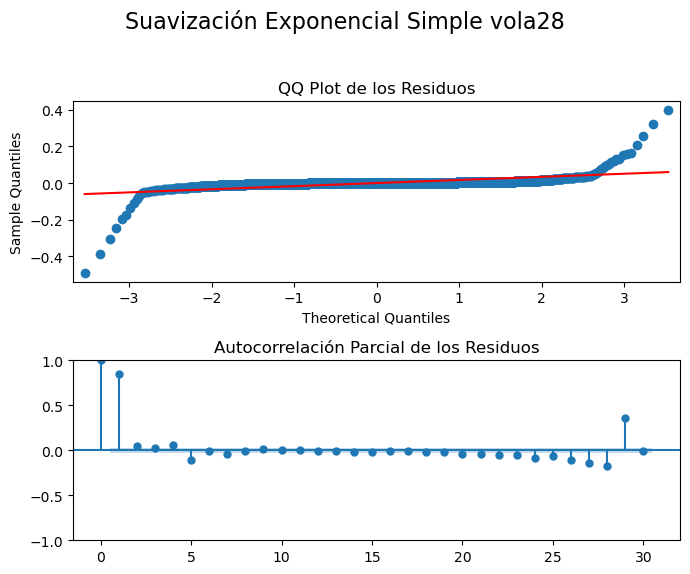

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [830]:
vola28_smooth1_train = firstsmooth(y=vola28_train_ts7, lambda_= vola28_mejor_lambda)
vola28_metrica_SES_train = plot_residual_train('Suavización Exponencial Simple vola28','SES', vola28_train_ts7, vola28_smooth1_train)

In [831]:
vola28_metrica_SES_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value
SES Train,1.4254,9.39%,0.0,0.0,92.21%,0.0,0.0


En términos generales, el rendimiento del modelo de suavización exponencial simple (SES) es prometedor, como lo demuestran el bajo MAPE y el alto R², aunque esta última métrica no es completamente adecuada para el análisis de series temporales. Sin embargo, los valores de SSE y MSD sugieren que hay oportunidades para mejorar la precisión del modelo. Además, los análisis de residuos indican la presencia de patrones que no han sido capturados de manera efectiva. Por lo tanto, es posible que los datos de validación y prueba no se ajusten adecuadamente, lo que limita la capacidad del modelo para generalizar de manera óptima.

* **Ventana de 7 días ($\omega = 7)$**

In [832]:
vola28_smooth1_val7 = firstsmooth(y=vola28_val_ts7, lambda_= vola28_mejor_lambda)
vola28_smooth1_test7 = firstsmooth(y=vola28_test_ts7, lambda_= vola28_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para  la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-100 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -100: extraerá todos los elementos desde la posición -100 hasta el final de la serie.

In [833]:
plot_model(vola28_train_ts7[-100:], vola28_val_ts7, vola28_test_ts7, vola28_smooth1_val7, vola28_smooth1_test7, 'Suavización Exponencial Simple Ventana de 7 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [834]:
vola28_ljung_box_pval7, vola28_jarque_bera_pval7 = evaluate_residuals(vola28_test_ts7, vola28_smooth1_test7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [835]:
vola28_metrica_SE_test7 = metricas(vola28_test_ts7,vola28_smooth1_test7)
vola28_metrica_SE_test7.index = vola28_metrica_SE_test7.index.map({0: 'SES Prueba vola28 (τ = 7)'})
vola28_metrica_SE_test7['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval7], index=vola28_metrica_SE_test7.index)
vola28_metrica_SE_test7['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval7], index=vola28_metrica_SE_test7.index)
vola28_metrica_SE_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola28 (τ = 7),1.4834e-05,5.28%,0.0,0.0,27.21%,0.1976,0.6186


* **Ventana de 14 días ($\omega = 14)$**

In [836]:
vola28_smooth1_val14 = firstsmooth(y=vola28_val_ts14, lambda_=vola28_mejor_lambda)
vola28_smooth1_test14 = firstsmooth(y=vola28_test_ts14, lambda_=vola28_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-100 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -100: extraerá todos los elementos desde la posición -100 hasta el final de la serie.

In [837]:
plot_model(vola28_train_ts14[-100:], vola28_val_ts14, vola28_test_ts14, vola28_smooth1_val14, vola28_smooth1_test14, 'Suavización Exponencial Simple Ventana de 14 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [838]:
vola28_ljung_box_pval14, vola28_jarque_bera_pval14 = evaluate_residuals(vola28_test_ts14, vola28_smooth1_test14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [839]:
vola28_metrica_SE_test14 = metricas(vola28_test_ts14,vola28_smooth1_test14)
vola28_metrica_SE_test14.index = vola28_metrica_SE_test14.index.map({0: 'SES Prueba vola28 (τ = 14)'})
vola28_metrica_SE_test14['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval14], index=vola28_metrica_SE_test14.index)
vola28_metrica_SE_test14['Jarque-Bera p-value'] = pd.Series([vola28_ljung_box_pval14], index=vola28_metrica_SE_test14.index)
vola28_metrica_SE_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola28 (τ = 14),2.3611e-05,6.0%,0.0,0.0,52.93%,0.0318,0.0318


* **Ventana de 21 días ($\omega = 21)$**

In [840]:
vola28_smooth1_val21 = firstsmooth(y=vola28_val_ts21, lambda_=vola28_mejor_lambda)
vola28_smooth1_test21 = firstsmooth(y=vola28_test_ts21, lambda_=vola28_mejor_lambda)

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [841]:
plot_model(vola28_train_ts21[-200:], vola28_val_ts21, vola28_test_ts21, vola28_smooth1_val21, vola28_smooth1_test21, 'Suavización Exponencial Simple Ventana de 21 días')

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [842]:
vola28_ljung_box_pval21, vola28_jarque_bera_pval21 = evaluate_residuals(vola28_test_ts21, vola28_smooth1_test21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [843]:
vola28_metrica_SE_test21 = metricas(vola28_test_ts21, vola28_smooth1_test21)
vola28_metrica_SE_test21.index = vola28_metrica_SE_test21.index.map({0: 'SES Prueba vola28 (τ = 21)'})
vola28_metrica_SE_test21['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval21], index=vola28_metrica_SE_test21.index)
vola28_metrica_SE_test21['Jarque-Bera p-value'] = pd.Series([vola28_ljung_box_pval21], index=vola28_metrica_SE_test21.index)
vola28_metrica_SE_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola28 (τ = 21),0.0002,9.8%,0.0,0.0,71.94%,8.6173e-05,8.6173e-05


* **Ventana de 28 días ($\omega = 28)$**

In [844]:
vola28_smooth1_val28 = firstsmooth(y=vola28_val_ts28, lambda_=vola28_mejor_lambda)
vola28_smooth1_test28 = firstsmooth(y=vola28_test_ts28, lambda_=vola28_mejor_lambda)


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [845]:
plot_model(vola28_train_ts28[-200:], vola28_val_ts28, vola28_test_ts28, vola28_smooth1_val28, vola28_smooth1_test28, 'Suavización Exponencial Simple Ventana de 28 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [846]:
vola28_ljung_box_pval28, vola28_jarque_bera_pval28 = evaluate_residuals(vola28_test_ts28, vola28_smooth1_test28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [847]:
vola28_metrica_SE_test28 = metricas(vola28_test_ts28, vola28_smooth1_test28)
vola28_metrica_SE_test28.index = vola28_metrica_SE_test28.index.map({0: 'SES Prueba vola28 (τ = 28)'})
vola28_metrica_SE_test28['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval28], index=vola28_metrica_SE_test28.index)
vola28_metrica_SE_test28['Jarque-Bera p-value'] = pd.Series([vola28_ljung_box_pval28], index=vola28_metrica_SE_test28.index)
vola28_metrica_SE_test28


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola28 (τ = 28),0.0004,10.29%,0.0,0.0,73.28%,0.0004,0.0004


#### <font color="#30143">Simple Exponential Smoothing (Usando statsmodels.tsa.holtwinters)</font> 

La función `ses_optimizer()` permite la optimización del modelo, ya que, ayudará a determinar el parámetro óptimo $\alpha$ para conseguir el modelo que reduzca al mínimo la métrica `MAE`.

In [848]:
def ses_optimizer(train, val, alphas, step):

    best_alpha, best_mae = None, float("inf")

    for alpha in alphas:
        ses_model = SimpleExpSmoothing(train).fit(smoothing_level=alpha, optimized=False)
        y_pred = ses_model.forecast(step)
        mae = mean_absolute_error(val, y_pred)

        if mae < best_mae:
            best_alpha, best_mae = alpha, mae

    return best_alpha, best_mae

In [849]:
def ses_model_tuning(train, val, test, step, title="Model Tuning - Suavización Exponencial Simple"):
    alphas = np.arange(0.8, 1, 0.01)
    best_alpha, best_mae = ses_optimizer(train, val, alphas, step=step)
    
    train_val = pd.concat([train, val])
    final_model = SimpleExpSmoothing(train_val).fit(smoothing_level=best_alpha, optimized=False)

    y_pred_val = final_model.forecast(step)  # Predicciones en validación
    y_pred_test = final_model.forecast(len(test))  # Predicciones en test
    
    mae_val = mean_absolute_error(val, y_pred_val)

    plot_model(train, val, test, y_pred_val, y_pred_test, title)

    return y_pred_val, y_pred_test

In [850]:
def ses_model_tuning_train(train, val, test, step, title="Model Tuning - Suavización Exponencial Simple"):
    alphas = np.arange(0.8, 1, 0.01)
    best_alpha, best_mae = ses_optimizer(train, val, alphas, step=step)
    
    train_val = pd.concat([train, val])
    final_model = SimpleExpSmoothing(train_val).fit(smoothing_level=best_alpha, optimized=False)

    y_pred_val = final_model.forecast(step)  # Predicciones en validación
    y_pred_test = final_model.forecast(len(test))  # Predicciones en test
    
    mae_val = mean_absolute_error(val, y_pred_val)
    
    return y_pred_val, y_pred_test

* Análisis de residuos conjunto de entrenamiento: 

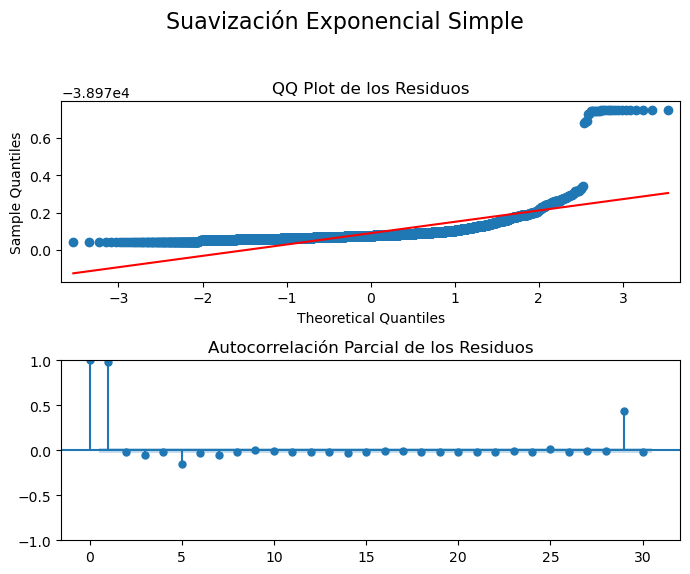

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [851]:
vola28_predicciones, vola28_y_pred_HW1_val_7 = ses_model_tuning_train(vola28_train_ts7[-200:], vola28_train_ts7, vola28_val_ts7, step=len(vola28_train_ts7))
vola28_y_pred_HW1_val_7 = pd.Series(vola28_predicciones.mean(), index=vola28_train_ts7.index[-1:])  # Esto crea una serie con la media y un índice
vola28_y_pred_HW1_val_7 = pd.Series([vola28_predicciones.mean()] * len(vola28_train_ts7), index=vola28_train_ts7.index)
vola28_y_pred_HW1_val_7 = pd.DataFrame(vola28_y_pred_HW1_val_7, columns=['Predicciones'])
vola28_metrica_HW1_train = plot_residual_train('Suavización Exponencial Simple','SES HW' , vola28_train_ts7, y_pred_HW1_train_7)

* **Ventana de 7 días ($\omega = 7)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [852]:
vola28_y_pred_HW1_val_7, vola28_y_pred_HW1_test_7 = ses_model_tuning(vola28_train_ts7[-200:], vola28_val_ts7, vola28_test_ts7, step=len(vola28_val_ts7))

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [853]:
vola28_ljung_box_pval_hw7, vola28_jarque_bera_pval_hw7 = evaluate_residuals(vola28_test_ts7, vola28_y_pred_HW1_test_7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [854]:
vola28_metrica_SE_HW_test7 = metricas(vola28_test_ts7,vola28_y_pred_HW1_test_7)
vola28_metrica_SE_HW_test7.index = vola28_metrica_SE_HW_test7.index.map({0: 'SES HW Prueba vola28 (τ = 7)'})
vola28_metrica_SE_HW_test7['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_hw7], index=vola28_metrica_SE_HW_test7.index)
vola28_metrica_SE_HW_test7['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_hw7], index=vola28_metrica_SE_HW_test7.index)
vola28_metrica_SE_HW_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola28 (τ = 7),0.0002,22.32%,0.0,0.0,-785.34%,0.1372,0.6297


* **Ventana de 14 días ($\omega = 14)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 14 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [855]:
vola28_y_pred_HW1_val_14, vola28_y_pred_HW1_test_14 = ses_model_tuning(vola28_train_ts14[-200:], vola28_val_ts14, vola28_test_ts14, step=len(vola28_val_ts14))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [856]:
vola28_ljung_box_pval_hw14, vola28_jarque_bera_pval_hw14 = evaluate_residuals(vola28_test_ts14, vola28_y_pred_HW1_test_14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [857]:
vola28_metrica_SE_HW_test14 = metricas(vola28_test_ts14, vola28_y_pred_HW1_test_14)
vola28_metrica_SE_HW_test14.index = vola28_metrica_SE_HW_test14.index.map({0: 'SES HW Prueba vola28 (τ = 14)'})
vola28_metrica_SE_HW_test14['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_hw14], index=vola28_metrica_SE_HW_test14.index)
vola28_metrica_SE_HW_test14['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_hw14], index=vola28_metrica_SE_HW_test14.index)
vola28_metrica_SE_HW_test14


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola28 (τ = 14),8.5013e-05,11.32%,0.0,0.0,-69.5%,0.0018,0.4347


* **Ventana de 21 días ($\omega = 21)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 21 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [858]:
vola28_y_pred_HW1_val_21, vola28_y_pred_HW1_test_21 = ses_model_tuning(vola28_train_ts21[-200:], vola28_val_ts21, vola28_test_ts21, step=len(vola28_val_ts21))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [859]:
vola28_ljung_box_pval_hw21, vola28_jarque_bera_pval_hw21 = evaluate_residuals(vola28_test_ts21, vola28_y_pred_HW1_test_21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [860]:
vola28_metrica_SE_HW_test21 = metricas(vola28_test_ts21, vola28_y_pred_HW1_test_21)
vola28_metrica_SE_HW_test21.index = vola28_metrica_SE_HW_test21.index.map({0: 'SES HW Prueba vola28 (τ = 21)'})
vola28_metrica_SE_HW_test21['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_hw21], index=vola28_metrica_SE_HW_test21.index)
vola28_metrica_SE_HW_test21['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_hw21], index=vola28_metrica_SE_HW_test21.index)
vola28_metrica_SE_HW_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola28 (τ = 21),0.0011,24.53%,0.01,0.0,-34.95%,1.0811e-05,0.3225


* **Ventana de 28 días ($\omega = 28)$**

Se procederá a indexar los parámetros de la función `ses_model_tuning()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 28 días. 

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [861]:
vola28_y_pred_HW1_val_28, vola28_y_pred_HW1_test_28 = ses_model_tuning(vola28_train_ts28[-200:], vola28_val_ts28, vola28_test_ts28, step=len(vola28_val_ts28))


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [862]:
vola28_ljung_box_pval_hw28, vola28_jarque_bera_pval_hw28 = evaluate_residuals(vola28_test_ts28, vola28_y_pred_HW1_test_28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [863]:
vola28_metrica_SE_HW_test28 = metricas(vola28_test_ts28, vola28_y_pred_HW1_test_28)
vola28_metrica_SE_HW_test28.index = vola28_metrica_SE_HW_test28.index.map({0: 'SES HW Prueba vola28 (τ = 28)'})
vola28_metrica_SE_HW_test28['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_hw28], index=vola28_metrica_SE_HW_test28.index)
vola28_metrica_SE_HW_test28['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_hw28], index=vola28_metrica_SE_HW_test28.index)
vola28_metrica_SE_HW_test28


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES HW Prueba vola28 (τ = 28),0.0092,47.96%,0.02,0.0,-505.72%,2.4191e-06,0.836


#### <font color="#30143">Double Exponential Smoothing (Sin Librería)</font> 

* Análisis de residuos conjunto de entrenamiento: 

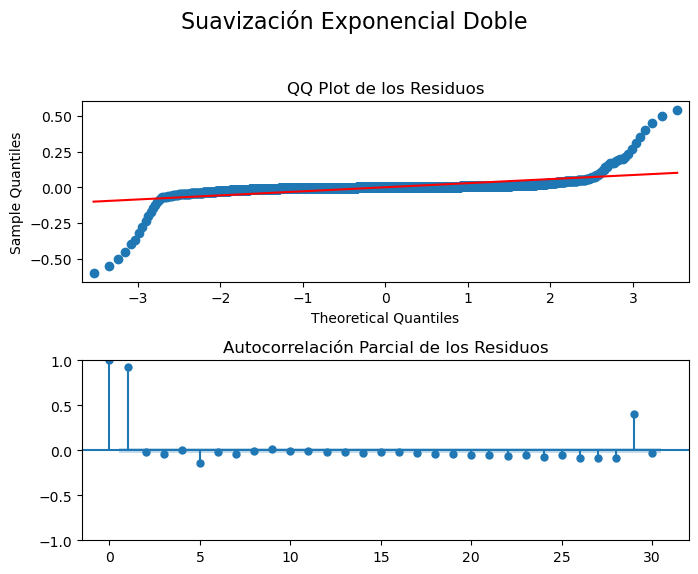

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [864]:
vola28_smooth2_train = firstsmooth(y=vola28_smooth1_train, lambda_=vola28_mejor_lambda)
vola28_metrica_DES_train = plot_residual_train('Suavización Exponencial Doble','DES', vola28_train_ts7, vola28_smooth2_train)

A continuación se realizan las predicciones para el modelo de suavización exponencial doble sin usar librería: 

* **Ventana de 7 días ($\omega = 7)$**

In [865]:
vola28_smooth2_val7 = firstsmooth(y=vola28_smooth1_val7, lambda_=vola28_mejor_lambda)
vola28_smooth2_test7 = firstsmooth(y=vola28_smooth1_test7, lambda_=vola28_mejor_lambda)

vola28_y_hatDES_val7 = 2 * vola28_smooth1_val7 - vola28_smooth2_val7
vola28_y_hatDES_test7 = 2 * vola28_smooth1_test7 - vola28_smooth2_test7

Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [866]:
plot_model(vola28_train_ts7[-200:], vola28_val_ts7, vola28_test_ts7, vola28_y_hatDES_val7, vola28_y_hatDES_test7, 'Suavización Exponencial Doble Ventana de 7 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [867]:
vola28_ljung_box_pval_des7, vola28_jarque_bera_pval_des7 = evaluate_residuals(vola28_test_ts7, vola28_y_hatDES_test7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [868]:
vola28_metrica_DES_test7 = metricas(vola28_test_ts7,vola28_y_hatDES_test7)
vola28_metrica_DES_test7.index = vola28_metrica_DES_test7.index.map({0: 'DES Prueba vola28 (τ = 7)'})
vola28_metrica_DES_test7['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_des7], index=vola28_metrica_DES_test7.index)
vola28_metrica_DES_test7['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_des7], index=vola28_metrica_DES_test7.index)
vola28_metrica_DES_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola28 (τ = 7),7.8389e-06,3.75%,0.0,0.0,61.53%,0.3538,0.6982


* **Ventana de 14 días ($\omega = 14)$**

In [869]:
vola28_smooth2_val14 = firstsmooth(y=vola28_smooth1_val14, lambda_=vola28_mejor_lambda)
vola28_smooth2_test14 = firstsmooth(y=vola28_smooth1_test14, lambda_=vola28_mejor_lambda)

vola28_y_hatDES_val14 = 2 * vola28_smooth1_val14 - vola28_smooth2_val14
vola28_y_hatDES_test14 = 2 * vola28_smooth1_test14 - vola28_smooth2_test14


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [870]:
plot_model(vola28_train_ts14[-200:], vola28_val_ts14, vola28_test_ts14, vola28_y_hatDES_val14, vola28_y_hatDES_test14, 'Suavización Exponencial Doble Ventana de 14 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [871]:
vola28_ljung_box_pval_des14, vola28_jarque_bera_pval_des14 = evaluate_residuals(vola28_test_ts14, vola28_y_hatDES_test14)


No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [872]:
vola28_metrica_DES_test14 = metricas(vola28_test_ts14, vola28_y_hatDES_test14)
vola28_metrica_DES_test14.index = vola28_metrica_DES_test14.index.map({0: 'DES Prueba vola28 (τ = 14)'})
vola28_metrica_DES_test14['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_des14], index=vola28_metrica_DES_test14.index)
vola28_metrica_DES_test14['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_des14], index=vola28_metrica_DES_test14.index)
vola28_metrica_DES_test14


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola28 (τ = 14),7.2144e-06,2.61%,0.0,0.0,85.62%,0.3456,0.065


* **Ventana de 21 días ($\omega = 21)$**

In [873]:
vola28_smooth2_val21 = firstsmooth(y=vola28_smooth1_val21, lambda_=vola28_mejor_lambda)
vola28_smooth2_test21 = firstsmooth(y=vola28_smooth1_test21, lambda_=vola28_mejor_lambda)

vola28_y_hatDES_val21 = 2 * vola28_smooth1_val21 - vola28_smooth2_val21
vola28_y_hatDES_test21 = 2 * vola28_smooth1_test21 - vola28_smooth2_test21


Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [874]:
plot_model(vola28_train_ts21[-200:], vola28_val_ts21, vola28_test_ts21, vola28_y_hatDES_val21, vola28_y_hatDES_test21, 'Suavización Exponencial Doble Ventana de 21 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [875]:
vola28_ljung_box_pval_des21, vola28_jarque_bera_pval_des21 = evaluate_residuals(vola28_test_ts21, vola28_y_hatDES_test21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [876]:
vola28_metrica_DES_test21 = metricas(vola28_test_ts21, vola28_y_hatDES_test21)
vola28_metrica_DES_test21.index = vola28_metrica_DES_test21.index.map({0: 'DES Prueba vola28 (τ = 21)'})
vola28_metrica_DES_test21['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_des21], index=vola28_metrica_DES_test21.index)
vola28_metrica_DES_test21['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_des21], index=vola28_metrica_DES_test21.index)
vola28_metrica_DES_test21


,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola28 (τ = 21),5.0099e-05,4.38%,0.0,0.0,94.01%,0.0022,0.1699


* **Ventana de 28 días ($\omega = 28)$**

In [877]:
vola28_smooth2_val28 = firstsmooth(y=vola28_smooth1_val28, lambda_=vola28_mejor_lambda)
vola28_smooth2_test28 = firstsmooth(y=vola28_smooth1_test28, lambda_=vola28_mejor_lambda)

vola28_y_hatDES_val28 = 2 * vola28_smooth1_val28 - vola28_smooth2_val28
vola28_y_hatDES_test28 = 2 * vola28_smooth1_test28 - vola28_smooth2_test28



Se procederá a indexar los parámetros de la función `plot_model()` para la visualización y comparación de los datos de validación y prueba en relación con los valores predichos para una ventana de tiempo de 7 días.

Para mejorar la claridad visual, aplicaremos un índice de corte en Python a los datos de entrenamiento. El uso de `-200 como índice negativo` indica que la selección comenzará desde el final de la serie, es decir, -200: extraerá todos los elementos desde la posición -200 hasta el final de la serie.

In [878]:
plot_model(vola28_train_ts28[-200:], vola28_val_ts28, vola28_test_ts28, vola28_y_hatDES_val28, vola28_y_hatDES_test28, 'Suavización Exponencial Doble Ventana de 28 días')


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [879]:
vola28_ljung_box_pval_des28, vola28_jarque_bera_pval_des28 = evaluate_residuals(vola28_test_ts28, vola28_y_hatDES_test28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [880]:
vola28_metrica_DES_test28 = metricas(vola28_test_ts28, vola28_y_hatDES_test28)
vola28_metrica_DES_test28.index = vola28_metrica_DES_test28.index.map({0: 'DES Prueba vola28 (τ = 28)'})
vola28_metrica_DES_test28['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_des28], index=vola28_metrica_DES_test28.index)
vola28_metrica_DES_test28['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_des28], index=vola28_metrica_DES_test28.index)
vola28_metrica_DES_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES Prueba vola28 (τ = 28),6.6921e-05,3.9%,0.0,0.0,95.57%,0.0002,0.3607


#### <font color="#30143">Double Exponential Smoothing (Usando statsmodels.tsa.holtwinters)</font> 

La función `des_optimizer()` permite la optimización del modelo, ya que, ayudará a determinar el parámetro óptimo $\alpha$ y $\beta$ para conseguir el modelo que reduzca al mínimo la métrica `MAE`.

**ExponentialSmoothing(train, trend=trend)**: Inicializa un modelo de suavización exponencial, utilizando la serie temporal de entrenamiento train y el tipo de tendencia `(lineal o exponencial)` especificado en el parámetro `trend`.

**.fit(smoothing_level=alpha, smoothing_slope=beta)**: Ajusta el modelo a los datos de entrenamiento. Los parámetros `smoothing_level` y `smoothing_slope` determinan el `grado de suavizado` de la serie temporal y de la `tendencia`, respectivamente, tomando como valores los parámetros `alpha` y `beta`.

In [881]:
def des_optimizer(train, val, alphas, betas, trend, step):

    best_alpha, best_beta, best_mae = None, None, float("inf")

    for alpha in alphas:
        for beta in betas:
            des_model = ExponentialSmoothing(train, trend=trend).fit(smoothing_level=alpha, smoothing_slope=beta)
            y_pred = des_model.forecast(step)
            mae = mean_absolute_error(val, y_pred)
            if mae < best_mae:
                best_alpha, best_beta, best_mae = alpha, beta, mae

    return best_alpha, best_beta, best_mae

In [882]:
def des_model_tuning(train, val, test, step_val, step_test, trend, title="Model Tuning - Double Exponential Smoothing"):
    alphas = np.arange(0.01, 1, 0.1)
    betas = np.arange(0.01, 1, 0.1)
    
    best_alpha, best_beta, best_mae = des_optimizer(train, val, alphas, betas, trend=trend, step=step_val)

    train_val = pd.concat([train, val])
    final_model = ExponentialSmoothing(train_val, trend=trend).fit(smoothing_level=best_alpha, smoothing_slope=best_beta)

    # Predicciones para validación y test
    y_pred_val = final_model.forecast(step_val)  # Predicciones para validación
    y_pred_test = final_model.forecast(step_test)  # Predicciones para test

    y_pred_val.index = val.index
    y_pred_test.index = test.index

    plot_model(train, val, test, y_pred_val, y_pred_test, title)

    return y_pred_val, y_pred_test

In [883]:
def des_model_tuning_train(train, val, test, step_val, step_test, trend, title="Model Tuning - Double Exponential Smoothing"):
    alphas = np.arange(0.01, 1, 0.1)
    betas = np.arange(0.01, 1, 0.1)
    
    best_alpha, best_beta, best_mae = des_optimizer(train, val, alphas, betas, trend=trend, step=step_val)

    train_val = pd.concat([train, val])
    final_model = ExponentialSmoothing(train_val, trend=trend).fit(smoothing_level=best_alpha, smoothing_slope=best_beta)

    # Predicciones para validación y test
    y_pred_val = final_model.forecast(step_val)  # Predicciones para validación
    y_pred_test = final_model.forecast(step_test)  # Predicciones para test

    y_pred_val.index = val.index
    y_pred_test.index = test.index

    return y_pred_val, y_pred_test

* Análisis de residuos conjunto de entrenamiento: 

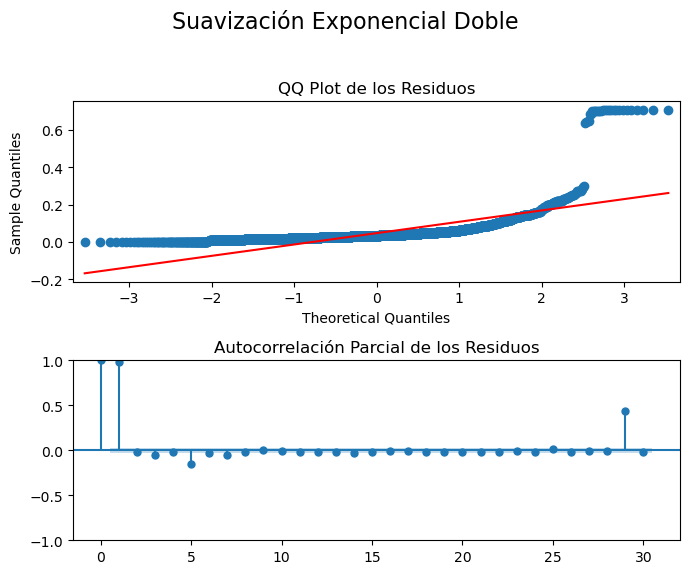

Se rechaza H0: hay autocorrelación en los residuales. Lo que es coherente con el gráfico ACF
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal. Lo que es coherente con el gráfico QQ-Plot
A continuación se observa un resumen de las métricas: 


In [884]:
vola28_predicciones, vola28_y_pred_HW2_val_7 = des_model_tuning_train(vola28_train_ts7[-200:], vola28_train_ts7, vola28_val_ts7, step_val=len(vola28_train_ts7), step_test=len(vola28_val_ts7), trend='add')
vola28_y_pred_HW1_train_7 = pd.Series(vola28_predicciones.mean(), index=vola28_train_ts7.index[-1:])  # Esto crea una serie con la media y un índice
vola28_y_pred_HW1_train_7 = pd.Series([vola28_predicciones.mean()] * len(vola28_train_ts7), index=vola28_train_ts7.index)
vola28_y_pred_HW1_train_7_df = pd.DataFrame(vola28_y_pred_HW1_train_7, columns=['vola28_Predicciones'])

vola28_metrica_HW2_train =plot_residual_train('Suavización Exponencial Doble','DES HW' , vola28_train_ts7, vola28_y_pred_HW1_train_7)

A continuación se realizan las predicciones para el modelo de suavización exponencial Holt-Winters: 

* **Ventana de 7 días ($\omega = 7)$**

In [885]:
vola28_y_pred_HW2_val_7, vola28_y_pred_HW2_test_7  = des_model_tuning(vola28_train_ts7[-200:], vola28_val_ts7, vola28_test_ts7, step_val=vola28_tau_val7, step_test=vola28_tau_test7, trend='add')

In [886]:
vola28_metrica_DES_HW_val7 = metricas(vola28_val_ts7,vola28_y_pred_HW2_val_7)
vola28_metrica_DES_HW_val7.index = vola28_metrica_DES_HW_val7.index.map({0: 'DES HW Val vola28 (τ = 7)'})
vola28_metrica_DES_HW_val7

,SSE,MAPE,MAD,MSD,R2
DES HW Val vola28 (τ = 7),6.0251e-06,3.21%,0.0,0.0,-12.51%


In [887]:
vola28_metrica_DES_HW_test7 = metricas(vola28_test_ts7,vola28_y_pred_HW2_test_7)
vola28_metrica_DES_HW_test7.index = vola28_metrica_DES_HW_test7.index.map({0: 'DES HW Prueba vola28 (τ = 7)'})
vola28_metrica_DES_HW_test7

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola28 (τ = 7),0.0002,26.12%,0.01,0.0,-1086.22%


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [888]:
vola28_ljung_box_pval_des_hw7, vola28_jarque_bera_pval_des_hw7 = evaluate_residuals(vola28_test_ts7, vola28_y_pred_HW2_test_7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [889]:
vola28_metrica_DES_HW_test7['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_des_hw7], index=vola28_metrica_DES_HW_test7.index)
vola28_metrica_DES_HW_test7['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_des_hw7], index=vola28_metrica_DES_HW_test7.index)
vola28_metrica_DES_HW_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola28 (τ = 7),0.0002,26.12%,0.01,0.0,-1086.22%,0.1331,0.626


* **Ventana de 14 días ($\omega = 14)$**

In [890]:
vola28_y_pred_HW2_val_14, vola28_y_pred_HW2_test_14 = des_model_tuning(vola28_train_ts14[-200:], vola28_val_ts14, vola28_test_ts14, step_val=vola28_tau_val14, step_test=vola28_tau_test14, trend='add')


In [891]:
vola28_metrica_DES_HW_val14 = metricas(vola28_val_ts14, vola28_y_pred_HW2_val_14)
vola28_metrica_DES_HW_val14.index = vola28_metrica_DES_HW_val14.index.map({0: 'DES HW Val vola28 (τ = 14)'})
vola28_metrica_DES_HW_val14


,SSE,MAPE,MAD,MSD,R2
DES HW Val vola28 (τ = 14),0.0001,10.18%,0.0,0.0,17.49%


In [892]:
vola28_metrica_DES_HW_test14 = metricas(vola28_test_ts14, vola28_y_pred_HW2_test_14)
vola28_metrica_DES_HW_test14.index = vola28_metrica_DES_HW_test14.index.map({0: 'DES HW Prueba vola28 (τ = 14)'})
vola28_metrica_DES_HW_test14


,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola28 (τ = 14),0.0006,36.42%,0.01,0.0,-1130.14%


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [893]:
vola28_ljung_box_pval_des_hw14, vola28_jarque_bera_pval_des_hw14 = evaluate_residuals(vola28_test_ts14, vola28_y_pred_HW2_test_14)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [894]:
vola28_metrica_DES_HW_test14['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_des_hw14], index=vola28_metrica_DES_HW_test14.index)
vola28_metrica_DES_HW_test14['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_des_hw14], index=vola28_metrica_DES_HW_test14.index)
vola28_metrica_DES_HW_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola28 (τ = 14),0.0006,36.42%,0.01,0.0,-1130.14%,0.0026,0.4357


* **Ventana de 21 días ($\omega = 21)$**

In [895]:
vola28_y_pred_HW2_val_21, vola28_y_pred_HW2_test_21 = des_model_tuning(vola28_train_ts21[-200:], vola28_val_ts21, vola28_test_ts21, step_val=vola28_tau_val21, step_test=vola28_tau_test21, trend='add')



In [896]:
vola28_metrica_DES_HW_val21 = metricas(vola28_val_ts21, vola28_y_pred_HW2_val_21)
vola28_metrica_DES_HW_val21.index = vola28_metrica_DES_HW_val21.index.map({0: 'DES HW Val vola28 (τ = 21)'})
vola28_metrica_DES_HW_val21


,SSE,MAPE,MAD,MSD,R2
DES HW Val vola28 (τ = 21),0.0002,12.81%,0.0,0.0,9.9%


In [897]:
vola28_metrica_DES_HW_test21 = metricas(vola28_test_ts21, vola28_y_pred_HW2_test_21)
vola28_metrica_DES_HW_test21.index = vola28_metrica_DES_HW_test21.index.map({0: 'DES HW Prueba vola28 (τ = 21)'})
vola28_metrica_DES_HW_test21

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola28 (τ = 21),0.0009,27.73%,0.01,0.0,-8.63%


A continuación realizamos un análisis sobre los residuales de nuestro conjunto de prueba (test)

In [898]:
vola28_ljung_box_pval_des_hw21, vola28_jarque_bera_pval_des_hw21 = evaluate_residuals(vola28_test_ts21, vola28_y_pred_HW2_test_21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [899]:
vola28_metrica_DES_HW_test21['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_des_hw21], index=vola28_metrica_DES_HW_test21.index)
vola28_metrica_DES_HW_test21['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_des_hw21], index=vola28_metrica_DES_HW_test21.index)
vola28_metrica_DES_HW_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola28 (τ = 21),0.0009,27.73%,0.01,0.0,-8.63%,1.0891e-05,0.3223


* **Ventana de 28 días ($\omega = 28)$**

In [900]:
vola28_y_pred_HW2_val_28, vola28_y_pred_HW2_test_28 = des_model_tuning(vola28_train_ts28[-200:], vola28_val_ts28, vola28_test_ts28, step_val=vola28_tau_val28, step_test=vola28_tau_test28, trend='add')



In [901]:
vola28_metrica_DES_HW_val28 = metricas(vola28_val_ts28, vola28_y_pred_HW2_val_28)
vola28_metrica_DES_HW_val28.index = vola28_metrica_DES_HW_val28.index.map({0: 'DES HW Val vola28 (τ = 28)'})
vola28_metrica_DES_HW_val28


,SSE,MAPE,MAD,MSD,R2
DES HW Val vola28 (τ = 28),0.0003,10.14%,0.0,0.0,37.91%


In [902]:
vola28_metrica_DES_HW_test28 = metricas(vola28_test_ts28, vola28_y_pred_HW2_test_28)
vola28_metrica_DES_HW_test28.index = vola28_metrica_DES_HW_test28.index.map({0: 'DES HW Prueba vola28 (τ = 28)'})
vola28_metrica_DES_HW_test28

,SSE,MAPE,MAD,MSD,R2
DES HW Prueba vola28 (τ = 28),0.0074,39.25%,0.01,0.0,-388.69%


A continuación realizamos un análisis sobre los residuales de nuestro conjunto de prueba (test)

In [903]:
vola28_ljung_box_pval_des_hw28, vola28_jarque_bera_pval_des_hw28 = evaluate_residuals(vola28_test_ts28, vola28_y_pred_HW2_test_28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [904]:
vola28_metrica_DES_HW_test28['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_des_hw28], index=vola28_metrica_DES_HW_test28.index)
vola28_metrica_DES_HW_test28['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_des_hw28], index=vola28_metrica_DES_HW_test28.index)
vola28_metrica_DES_HW_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
DES HW Prueba vola28 (τ = 28),0.0074,39.25%,0.01,0.0,-388.69%,1.7260e-06,0.7591


#### <font color="#30143">ARIMA (Usando Rolling)</font> 

A continuación se define función de ajuste del modelo y predicciones ARIMA.

In [905]:
def arima_model_fit(train):
    """
    Ajusta un modelo ARIMA a los datos de entrenamiento y selecciona el mejor modelo basado en el AIC.
    La función recibe los conjuntos de datos `train` y `val`.

    :param train: Conjunto de datos de entrenamiento (serie temporal).
    :param val: Conjunto de datos de validación (opcional, para verificar el rendimiento del modelo).
    :return: El modelo ajustado, el mejor AIC, el mejor orden (p, d, q) y los datos de entrenamiento.
    """
    model_filename = 'vola28_best_arima_model.pkl'
    
    # Si el mejor modelo ya existe, cargarlo y evitar volver a ejecutar el ciclo for
    if os.path.exists(model_filename):
        print(f"Mejor modelo ya existe. Cargando desde {model_filename}.")
        with open(model_filename, 'rb') as f:
            best_model_global = pickle.load(f)
        return best_model_global, None, None

    # Inicializamos el mejor AIC y BIC en infinito
    best_aic = np.inf
    best_bic = np.inf
    best_order = None
    best_mdl = None
   
    # Rango de p, d, q para probar diferentes combinaciones
    pq_rng = range(3)  # Esto es para p y q (máximo 2)
    d_rng  = range(2)  # Esto es para d (máximo 1)

    # Iterar sobre los valores posibles de p, d y q
    for p in pq_rng:
        for d in d_rng:
            for q in pq_rng:
                try:
                    # Ajustar el modelo ARIMA para los valores de p, d, q
                    tmp_mdl = ARIMA(train, order=(p, d, q)).fit()
                    tmp_aic = tmp_mdl.aic  # Obtener el AIC del modelo ajustado
                    
                    # Si el AIC actual es mejor, actualizar los mejores valores
                    if tmp_aic < best_aic:
                        best_aic = tmp_aic
                        best_order = (p, d, q)
                        best_mdl = tmp_mdl
                except Exception as e:
                    print(f"Error ajustando ARIMA({p},{d},{q}): {e}")
                    continue  # Si hay un error, continuar con el siguiente intento

    # Imprimir los resultados del mejor modelo encontrado
    print(f"\nMejor modelo ARIMA:")
    print(f'Best AIC: {best_aic}')
    print(f'Best Order: {best_order}')
    print(f'aic: {best_aic:6.5f} | order: {best_order}')

    # Ajustar el modelo ARIMA final con el mejor orden
    model = ARIMA(train, order=best_order)
    model_fit = model.fit()

    # Guardar el mejor modelo en un archivo con pickle
    with open('vola28_best_arima_model.pkl', 'wb') as f:
        pickle.dump(best_mdl, f)
    print(f"\nMejor modelo ARIMA guardado con AIC {best_aic}")

    # Retornar el modelo ajustado, el mejor AIC y el mejor orden
    return model_fit, best_aic, best_order

A continuación se define la función `arima_rolling()`

In [906]:
def arima_rolling(history, val, best_order): # arima_rolling(train.tolist(), val, test_nd, best_order)
    
    predictions = list()
    for t in range(len(val)):
        model = ARIMA(history, order=best_order)
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = val[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat, obs))
        
    return predictions

La siguiente función devuelve los parámetros `p`, `d`, `q` que definen `el mejor modelo ARIMA` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste. Además, proporciona los resultados del modelo `ARIMA ajustado` para `datos de entrenamiento`, incluyendo las `fechas` correspondientes. También incluye los datos y fechas del modelo `ARIMA de prueba`, aunque estos últimos dos no son directamente visibles en la salida de la función.


Indexación de parámetros para la función `arima_model_fit()`

In [907]:
vola28_model_fit, vola28_best_aic, vola28_best_order = arima_model_fit(vola28_train_ts7)
vola28_best_order = vola28_model_fit.model.order


Mejor modelo ARIMA:
Best AIC: -30269.19340774578
Best Order: (2, 0, 2)
aic: -30269.19341 | order: (2, 0, 2)

Mejor modelo ARIMA guardado con AIC -30269.19340774578


In [908]:
print(vola28_best_order)

(2, 0, 2)


A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

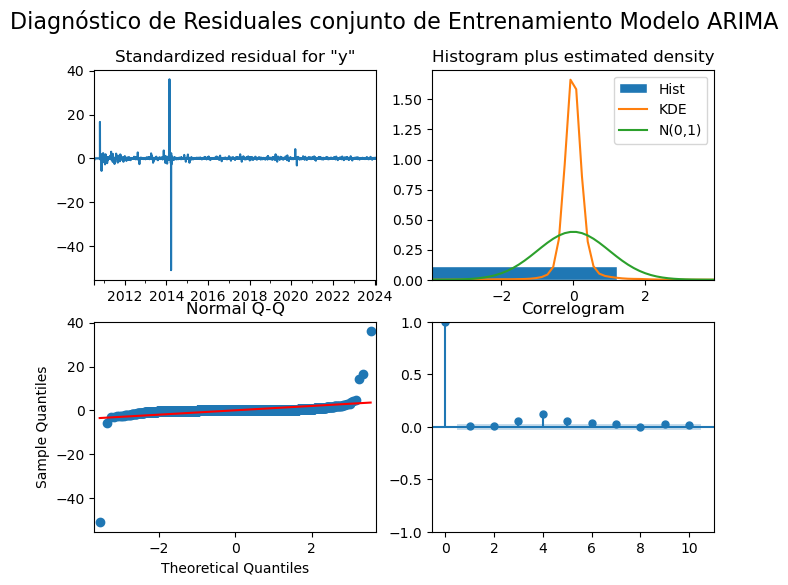

In [909]:
vola28_model_fit.plot_diagnostics(figsize=(8, 6))
plt.suptitle('Diagnóstico de Residuales conjunto de Entrenamiento Modelo ARIMA', fontsize=16)
plt.show()

In [910]:
vola28_residuos_train_arima = vola28_model_fit.resid
vola28_ljung_box_pval_arima_train, vola28_jarque_bera_pval_arima_train = evaluate_residuals_train_arima(vola28_residuos_train_arima)

Ljung-Box LB Statistic: 0.091834
Ljung-Box p-value: 0.761858
No se rechaza H0: los residuales son independientes (no correlacionados).
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [911]:
# Extraer predicciones para todo el conjunto de entrenamiento sin estandarizar 
vola28_predicciones = vola28_model_fit.get_prediction(start=0, end=len(vola28_train_ts7)-1, dynamic=False)
vola28_yhvola28_arima_train = vola28_predicciones.predicted_mean

vola28_yhvola28_arima_train.index = vola28_train_ts7.index # yhvola28_arima_train mismo índice que price_train_ts7

#calcular las métricas 
vola28_metrica_arima_train = metricas(vola28_train_ts7,vola28_yhvola28_arima_train)
vola28_metrica_arima_train.index = vola28_metrica_arima_train.index.map({0: 'Arima Entrenamiento vola28'})
vola28_metrica_arima_train['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_arima_train], index=vola28_metrica_arima_train.index)
vola28_metrica_arima_train['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_arima_train], index=vola28_metrica_arima_train.index)
vola28_metrica_arima_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Entrenamiento vola28,0.6338,4.27%,0.0,0.0,96.54%,0.7619,0.0


La función `arima_rolling()` devuelve las prediciones, con base a los parámetros `p`, `d`, `q` que definen `el mejor modelo ARIMA` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste, aprovechando datos históricos para pronosticar continuamente la concentración de PM10 durante un período (horizonte) específico.

A continuación se indexan los parámetros de la función `arima_rolling()` para las ventanas de 7, 14, 21 y 28 días para la predicción sobre los datos de `validación` y `prueba`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [912]:
# best_aic_arima = best_ order
vola28_val_l7 = vola28_val_ts7.tolist()
vola28_train_l7 = vola28_train_ts7.tolist()
vola28_yhvola28_val_arimarolling7  = arima_rolling(vola28_train_l7, vola28_val_l7, vola28_best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola28_yhvola28_val_arimarolling7 = pd.Series(vola28_yhvola28_val_arimarolling7, index=vola28_val_ts7.index)  # Indexa las fechas de price_val_ts7

predicted=0.029874, expected=0.028984
predicted=0.029358, expected=0.028812
predicted=0.029530, expected=0.027439
predicted=0.027819, expected=0.026880
predicted=0.027117, expected=0.026887
predicted=0.027310, expected=0.026887
predicted=0.027211, expected=0.026946


* **Predicciones datos de Prueba**: 

In [913]:
# best_aic_arima = best_ order
vola28_test_l7 = vola28_test_ts7.tolist()
vola28_train_l7 = vola28_train_ts7.tolist()
vola28_yhvola28_test_arimarolling7  = arima_rolling(vola28_train_l7, vola28_test_l7, vola28_best_order) #se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola28_yhvola28_test_arimarolling7 = pd.Series(vola28_yhvola28_test_arimarolling7, index=vola28_test_ts7.index)  # Indexa las fechas de price_test_ts7

predicted=0.029874, expected=0.023239
predicted=0.023571, expected=0.023168
predicted=0.023288, expected=0.023794
predicted=0.024533, expected=0.024167
predicted=0.024401, expected=0.020465
predicted=0.020978, expected=0.020536
predicted=0.020727, expected=0.019713


In [914]:
plot_model(vola28_train_ts7[-100:], vola28_val_ts7, vola28_test_ts7, vola28_yhvola28_val_arimarolling7, vola28_yhvola28_test_arimarolling7, title="Predicciones usando ARIMA rolling ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [915]:
vola28_ljung_box_pval_arimarol7, vola28_jarque_bera_pval_arimarol7 = evaluate_residuals(vola28_test_ts7, vola28_yhvola28_test_arimarolling7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [916]:
vola28_metrica_arimarol_test7 = metricas(vola28_test_ts7,vola28_yhvola28_test_arimarolling7)
vola28_metrica_arimarol_test7.index = vola28_metrica_arimarol_test7.index.map({0: 'Arima Rolling Prueba vola28 (τ = 7)'})
vola28_metrica_arimarol_test7['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_arimarol7], index=vola28_metrica_arimarol_test7.index)
vola28_metrica_arimarol_test7['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_arimarol7], index=vola28_metrica_arimarol_test7.index)
vola28_metrica_arimarol_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola28 (τ = 7),6.1301e-05,8.64%,0.0,0.0,-200.81%,0.6643,0.4699


* **Ventana de 14 días ($\omega = 14)$**

* **Datos de Validación**: 

In [917]:
# best_aic_arima = best_ order
vola28_val_l14 = vola28_val_ts14.tolist()
vola28_train_l14 = vola28_train_ts14.tolist()
vola28_yhvola28_val_arimarolling14 = arima_rolling(vola28_train_l14, vola28_val_l14, vola28_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola28_yhvola28_val_arimarolling14 = pd.Series(vola28_yhvola28_val_arimarolling14, index=vola28_val_ts14.index)  # Indexa las fechas de price_val_ts14


predicted=0.029874, expected=0.028984
predicted=0.029358, expected=0.028812
predicted=0.029530, expected=0.027439
predicted=0.027819, expected=0.026880
predicted=0.027117, expected=0.026887
predicted=0.027310, expected=0.026887
predicted=0.027211, expected=0.026946
predicted=0.027321, expected=0.023239
predicted=0.023738, expected=0.023168
predicted=0.023375, expected=0.023794
predicted=0.024361, expected=0.024167
predicted=0.024506, expected=0.020465
predicted=0.020909, expected=0.020536
predicted=0.020574, expected=0.019713


* **Predicciones datos de Prueba**: 

In [918]:
# best_aic_arima = best_ order
vola28_test_l14 = vola28_test_ts14.tolist()
vola28_train_l14 = vola28_train_ts14.tolist()
vola28_yhvola28_test_arimarolling14 = arima_rolling(vola28_train_l14, vola28_test_l14, vola28_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola28_yhvola28_test_arimarolling14 = pd.Series(vola28_yhvola28_test_arimarolling14, index=vola28_test_ts14.index)  # Indexa las fechas de price_test_ts14

predicted=0.029874, expected=0.020331
predicted=0.020642, expected=0.020346
predicted=0.020320, expected=0.021263
predicted=0.022178, expected=0.019676
predicted=0.020144, expected=0.019689
predicted=0.020279, expected=0.019928
predicted=0.021083, expected=0.019821
predicted=0.020566, expected=0.016675
predicted=0.016825, expected=0.016673
predicted=0.017139, expected=0.016981
predicted=0.017581, expected=0.017215
predicted=0.017722, expected=0.015948
predicted=0.016525, expected=0.016045
predicted=0.016927, expected=0.015962


In [919]:
plot_model(vola28_train_ts14[-100:], vola28_val_ts14, vola28_test_ts14, vola28_yhvola28_val_arimarolling14, vola28_yhvola28_test_arimarolling14, title="Predicciones usando ARIMA rolling ventana de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [920]:
vola28_ljung_box_pval_arimarol14, vola28_jarque_bera_pval_arimarol14 = evaluate_residuals(vola28_test_ts14, vola28_yhvola28_test_arimarolling14)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [921]:
vola28_metrica_arimarol_test14 = metricas(vola28_test_ts14, vola28_yhvola28_test_arimarolling14)
vola28_metrica_arimarol_test14.index = vola28_metrica_arimarol_test14.index.map({0: 'Arima Rolling Prueba vola28 (τ = 14)'})
vola28_metrica_arimarol_test14['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_arimarol14], index=vola28_metrica_arimarol_test14.index)
vola28_metrica_arimarol_test14['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_arimarol14], index=vola28_metrica_arimarol_test14.index)
vola28_metrica_arimarol_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola28 (τ = 14),0.0001,8.82%,0.0,0.0,-138.95%,0.665,3.1614e-06


* **Ventana de 21 días ($\omega = 21)$**

* **Datos de Validación**: 

In [922]:
# best_aic_arima = best_ order
vola28_val_l21 = vola28_val_ts21.tolist()
vola28_train_l21 = vola28_train_ts21.tolist()
vola28_yhvola28_val_arimarolling21 = arima_rolling(vola28_train_l21, vola28_val_l21, vola28_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola28_yhvola28_val_arimarolling21 = pd.Series(vola28_yhvola28_val_arimarolling21, index=vola28_val_ts21.index)  # Indexa las fechas de price_val_ts21



predicted=0.029874, expected=0.028984
predicted=0.029358, expected=0.028812
predicted=0.029530, expected=0.027439
predicted=0.027819, expected=0.026880
predicted=0.027117, expected=0.026887
predicted=0.027310, expected=0.026887
predicted=0.027211, expected=0.026946
predicted=0.027321, expected=0.023239
predicted=0.023738, expected=0.023168
predicted=0.023375, expected=0.023794
predicted=0.024361, expected=0.024167
predicted=0.024506, expected=0.020465
predicted=0.020909, expected=0.020536
predicted=0.020574, expected=0.019713
predicted=0.019848, expected=0.020331
predicted=0.020644, expected=0.020346
predicted=0.021025, expected=0.021263
predicted=0.021632, expected=0.019676
predicted=0.020790, expected=0.019689
predicted=0.019992, expected=0.019928
predicted=0.020582, expected=0.019821


* **Predicciones datos de Prueba**: 

In [923]:
# best_aic_arima = best_ order
vola28_test_l21 = vola28_test_ts21.tolist()
vola28_train_l21 = vola28_train_ts21.tolist()
vola28_yhvola28_test_arimarolling21 = arima_rolling(vola28_train_l21, vola28_test_l21, vola28_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola28_yhvola28_test_arimarolling21 = pd.Series(vola28_yhvola28_test_arimarolling21, index=vola28_test_ts21.index)  # Indexa las fechas de price_test_ts21


predicted=0.029874, expected=0.016675
predicted=0.016943, expected=0.016673
predicted=0.016578, expected=0.016981
predicted=0.017427, expected=0.017215
predicted=0.017325, expected=0.015948
predicted=0.016640, expected=0.016045
predicted=0.016290, expected=0.015962
predicted=0.016784, expected=0.017709
predicted=0.018095, expected=0.018831
predicted=0.019608, expected=0.024323
predicted=0.024745, expected=0.025198
predicted=0.025957, expected=0.025151
predicted=0.025517, expected=0.025209
predicted=0.025795, expected=0.024804
predicted=0.025167, expected=0.027705
predicted=0.028166, expected=0.031811
predicted=0.032000, expected=0.031951
predicted=0.033005, expected=0.031929
predicted=0.032089, expected=0.031541
predicted=0.031876, expected=0.031608
predicted=0.031804, expected=0.031617


In [924]:
plot_model(vola28_train_ts21[-100:], vola28_val_ts21, vola28_test_ts21, vola28_yhvola28_val_arimarolling21, vola28_yhvola28_test_arimarolling21, title="Predicciones usando ARIMA rolling ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [925]:
vola28_ljung_box_pval_arimarol21, vola28_jarque_bera_pval_arimarol21 = evaluate_residuals(vola28_test_ts21, vola28_yhvola28_test_arimarolling21)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [926]:
vola28_metrica_arimarol_test21 = metricas(vola28_test_ts21, vola28_yhvola28_test_arimarolling21)
vola28_metrica_arimarol_test21.index = vola28_metrica_arimarol_test21.index.map({0: 'Arima Rolling Prueba vola28 (τ = 21)'})
vola28_metrica_arimarol_test21['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_arimarol21], index=vola28_metrica_arimarol_test21.index)
vola28_metrica_arimarol_test21['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_arimarol21], index=vola28_metrica_arimarol_test21.index)
vola28_metrica_arimarol_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola28 (τ = 21),0.0002,7.85%,0.0,0.0,73.25%,0.6531,3.9683e-22


* **Ventana de 28 días ($\omega = 28)$**

* **Datos de Validación**: 

In [927]:
# best_aic_arima = best_ order
vola28_val_l28 = vola28_val_ts28.tolist()
vola28_train_l28 = vola28_train_ts28.tolist()
vola28_yhvola28_val_arimarolling28 = arima_rolling(vola28_train_l28, vola28_val_l28, vola28_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola28_yhvola28_val_arimarolling28 = pd.Series(vola28_yhvola28_val_arimarolling28, index=vola28_val_ts28.index)  # Indexa las fechas de price_val_ts28


predicted=0.029874, expected=0.028984
predicted=0.029358, expected=0.028812
predicted=0.029530, expected=0.027439
predicted=0.027819, expected=0.026880
predicted=0.027117, expected=0.026887
predicted=0.027310, expected=0.026887
predicted=0.027211, expected=0.026946
predicted=0.027321, expected=0.023239
predicted=0.023738, expected=0.023168
predicted=0.023375, expected=0.023794
predicted=0.024361, expected=0.024167
predicted=0.024506, expected=0.020465
predicted=0.020909, expected=0.020536
predicted=0.020574, expected=0.019713
predicted=0.019848, expected=0.020331
predicted=0.020644, expected=0.020346
predicted=0.021025, expected=0.021263
predicted=0.021632, expected=0.019676
predicted=0.020790, expected=0.019689
predicted=0.019992, expected=0.019928
predicted=0.020582, expected=0.019821
predicted=0.020205, expected=0.016675
predicted=0.017093, expected=0.016673
predicted=0.017025, expected=0.016981
predicted=0.017686, expected=0.017215
predicted=0.017646, expected=0.015948
predicted=0.

* **Predicciones datos de Prueba**: 

In [928]:
# best_aic_arima = best_ order
vola28_test_l28 = vola28_test_ts28.tolist()
vola28_train_l28 = vola28_train_ts28.tolist()
vola28_yhvola28_test_arimarolling28 = arima_rolling(vola28_train_l28, vola28_test_l28, vola28_best_order)  # Se procede a comentar la función debido a que su ejecución demanda un tiempo bastante considerable 
vola28_yhvola28_test_arimarolling28 = pd.Series(vola28_yhvola28_test_arimarolling28, index=vola28_test_ts28.index)  # Indexa las fechas de price_test_ts28

predicted=0.029874, expected=0.017709
predicted=0.017983, expected=0.018831
predicted=0.018769, expected=0.024323
predicted=0.025537, expected=0.025198
predicted=0.025412, expected=0.025151
predicted=0.024703, expected=0.025209
predicted=0.026010, expected=0.024804
predicted=0.025280, expected=0.027705
predicted=0.028033, expected=0.031811
predicted=0.032396, expected=0.031951
predicted=0.032236, expected=0.031929
predicted=0.032883, expected=0.031541
predicted=0.031828, expected=0.031608
predicted=0.031848, expected=0.031617
predicted=0.031924, expected=0.031955
predicted=0.032523, expected=0.032054
predicted=0.032209, expected=0.031634
predicted=0.031800, expected=0.032300
predicted=0.032671, expected=0.033105
predicted=0.033807, expected=0.035523
predicted=0.035961, expected=0.036245
predicted=0.036554, expected=0.036349
predicted=0.036479, expected=0.040312
predicted=0.040573, expected=0.043374
predicted=0.043656, expected=0.044045
predicted=0.044306, expected=0.044397
predicted=0.

In [929]:
plot_model(vola28_train_ts28[-100:], vola28_val_ts28, vola28_test_ts28, vola28_yhvola28_val_arimarolling28, vola28_yhvola28_test_arimarolling28, title="Predicciones usando ARIMA rolling ventana de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [930]:
vola28_ljung_box_pval_arimarol28, vola28_jarque_bera_pval_arimarol28 = evaluate_residuals(vola28_test_ts28, vola28_yhvola28_test_arimarolling28)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [931]:
vola28_metrica_arimarol_test28 = metricas(vola28_test_ts28, vola28_yhvola28_test_arimarolling28)
vola28_metrica_arimarol_test28.index = vola28_metrica_arimarol_test28.index.map({0: 'Arima Rolling Prueba vola28 (τ = 28)'})
vola28_metrica_arimarol_test28['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_arimarol28], index=vola28_metrica_arimarol_test28.index)
vola28_metrica_arimarol_test28['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_arimarol28], index=vola28_metrica_arimarol_test28.index)
vola28_metrica_arimarol_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima Rolling Prueba vola28 (τ = 28),0.0002,5.89%,0.0,0.0,84.71%,0.8857,7.3356e-33


#### <font color="#30143">ARIMA (Sin Rolling)</font> 

A continuación se procede con la predicción del precio del bitcoin usando `forecast()`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [932]:
vola28_yhvola28_val_arima7 = vola28_model_fit.forecast(steps=len(vola28_val_ts7))
print(vola28_yhvola28_val_arima7)

2024-01-29    0.0299
2024-01-30    0.0302
2024-01-31    0.0304
2024-02-01    0.0307
2024-02-02    0.0309
2024-02-03    0.0312
2024-02-04    0.0314
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [933]:
vola28_yhvola28_test_arima7 = vola28_model_fit.forecast(steps=len(vola28_test_ts7))
vola28_yhvola28_test_arima7 = pd.Series(vola28_yhvola28_test_arima7)
vola28_yhvola28_test_arima7.index = vola28_test_ts7.index # Asigna el índice de las fechas de price_test_ts7
print(vola28_yhvola28_test_arima7)


Date
2024-02-05    0.0299
2024-02-06    0.0302
2024-02-07    0.0304
2024-02-08    0.0307
2024-02-09    0.0309
2024-02-10    0.0312
2024-02-11    0.0314
Name: predicted_mean, dtype: float64


In [934]:
plot_model(vola28_train_ts7[-200:], vola28_val_ts7, vola28_test_ts7, vola28_yhvola28_val_arima7, vola28_yhvola28_test_arima7, title="Predicciones usando ARIMA ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [935]:
vola28_ljung_box_pval_arima7, vola28_jarque_bera_pval_arima7 = evaluate_residuals(vola28_test_ts7, vola28_yhvola28_test_arima7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [936]:
vola28_metrica_arima_test7 = metricas(vola28_test_ts7,vola28_yhvola28_test_arima7)
vola28_metrica_arima_test7.index = vola28_metrica_arima_test7.index.map({0: 'Arima prueba vola28 (τ = 7)'})
vola28_metrica_arima_test7['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_arima7], index=vola28_metrica_arima_test7.index)
vola28_metrica_arima_test7['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_arima7], index=vola28_metrica_arima_test7.index)
vola28_metrica_arima_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola28 (τ = 7),0.0005,39.41%,0.01,0.0,-2543.79%,0.0921,0.5992


* **Ventana de 14 días ($\omega = 14)$**

* **Predicciones datos de Validación**: 

In [937]:
vola28_yhvola28_val_arima14 = vola28_model_fit.forecast(steps=len(vola28_val_ts14))
print(vola28_yhvola28_val_arima14)


2024-01-29    0.0299
2024-01-30    0.0302
2024-01-31    0.0304
2024-02-01    0.0307
2024-02-02    0.0309
2024-02-03    0.0312
2024-02-04    0.0314
2024-02-05    0.0317
2024-02-06    0.0319
2024-02-07    0.0321
2024-02-08    0.0323
2024-02-09    0.0325
2024-02-10    0.0327
2024-02-11    0.0330
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [938]:
vola28_yhvola28_test_arima14 = vola28_model_fit.forecast(steps=len(vola28_test_ts14))
vola28_yhvola28_test_arima14 = pd.Series(vola28_yhvola28_test_arima14)
vola28_yhvola28_test_arima14.index = vola28_test_ts14.index  # Asigna el índice de las fechas de price_test_ts14
print(vola28_yhvola28_test_arima14)


Date
2024-02-12    0.0299
2024-02-13    0.0302
2024-02-14    0.0304
2024-02-15    0.0307
2024-02-16    0.0309
2024-02-17    0.0312
2024-02-18    0.0314
2024-02-19    0.0317
2024-02-20    0.0319
2024-02-21    0.0321
2024-02-22    0.0323
2024-02-23    0.0325
2024-02-24    0.0327
2024-02-25    0.0330
Name: predicted_mean, dtype: float64


In [939]:
plot_model(vola28_train_ts14[-200:], vola28_val_ts14, vola28_test_ts14, vola28_yhvola28_val_arima14, vola28_yhvola28_test_arima14, title="Predicciones usando ARIMA ventana de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [940]:
vola28_ljung_box_pval_arima14, vola28_jarque_bera_pval_arima14 = evaluate_residuals(vola28_test_ts14, vola28_yhvola28_test_arima14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [941]:
vola28_metrica_arima_test14 = metricas(vola28_test_ts14, vola28_yhvola28_test_arima14)
vola28_metrica_arima_test14.index = vola28_metrica_arima_test14.index.map({0: 'Arima prueba vola28 (τ = 14)'})
vola28_metrica_arima_test14['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_arima14], index=vola28_metrica_arima_test14.index)
vola28_metrica_arima_test14['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_arima14], index=vola28_metrica_arima_test14.index)
vola28_metrica_arima_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola28 (τ = 14),0.0025,74.17%,0.01,0.0,-4951.77%,0.0011,0.4703


* **Ventana de 21 días ($\omega = 21)$**

* **Predicciones datos de Validación**: 

In [942]:
vola28_yhvola28_val_arima21 = vola28_model_fit.forecast(steps=len(vola28_val_ts21))
print(vola28_yhvola28_val_arima21)


2024-01-29    0.0299
2024-01-30    0.0302
2024-01-31    0.0304
2024-02-01    0.0307
2024-02-02    0.0309
2024-02-03    0.0312
2024-02-04    0.0314
2024-02-05    0.0317
2024-02-06    0.0319
2024-02-07    0.0321
2024-02-08    0.0323
2024-02-09    0.0325
2024-02-10    0.0327
2024-02-11    0.0330
2024-02-12    0.0332
2024-02-13    0.0334
2024-02-14    0.0335
2024-02-15    0.0337
2024-02-16    0.0339
2024-02-17    0.0341
2024-02-18    0.0343
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [943]:
vola28_yhvola28_test_arima21 = vola28_model_fit.forecast(steps=len(vola28_test_ts21))
vola28_yhvola28_test_arima21 = pd.Series(vola28_yhvola28_test_arima21)
vola28_yhvola28_test_arima21.index = vola28_test_ts21.index  # Asigna el índice de las fechas de price_test_ts21
print(vola28_yhvola28_test_arima21)


Date
2024-02-19    0.0299
2024-02-20    0.0302
2024-02-21    0.0304
2024-02-22    0.0307
2024-02-23    0.0309
2024-02-24    0.0312
2024-02-25    0.0314
2024-02-26    0.0317
2024-02-27    0.0319
2024-02-28    0.0321
2024-02-29    0.0323
2024-03-01    0.0325
2024-03-02    0.0327
2024-03-03    0.0330
2024-03-04    0.0332
2024-03-05    0.0334
2024-03-06    0.0335
2024-03-07    0.0337
2024-03-08    0.0339
2024-03-09    0.0341
2024-03-10    0.0343
Name: predicted_mean, dtype: float64


In [944]:
plot_model(vola28_train_ts21[-200:], vola28_val_ts21, vola28_test_ts21, vola28_yhvola28_val_arima21, vola28_yhvola28_test_arima21, title="Predicciones usando ARIMA ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [945]:
vola28_ljung_box_pval_arima21, vola28_jarque_bera_pval_arima21 = evaluate_residuals(vola28_test_ts21, vola28_yhvola28_test_arima21)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [946]:
vola28_metrica_arima_test21 = metricas(vola28_test_ts21, vola28_yhvola28_test_arima21)
vola28_metrica_arima_test21.index = vola28_metrica_arima_test21.index.map({0: 'Arima prueba vola28 (τ = 21)'})
vola28_metrica_arima_test21['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_arima21], index=vola28_metrica_arima_test21.index)
vola28_metrica_arima_test21['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_arima21], index=vola28_metrica_arima_test21.index)
vola28_metrica_arima_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola28 (τ = 21),0.0021,45.8%,0.01,0.0,-153.55%,1.0828e-05,0.3427


* **Ventana de 28 días ($\omega = 28)$**

* **Predicciones datos de Validación**: 

In [947]:
vola28_yhvola28_val_arima28 = vola28_model_fit.forecast(steps=len(vola28_val_ts28))
print(vola28_yhvola28_val_arima28)



2024-01-29    0.0299
2024-01-30    0.0302
2024-01-31    0.0304
2024-02-01    0.0307
2024-02-02    0.0309
2024-02-03    0.0312
2024-02-04    0.0314
2024-02-05    0.0317
2024-02-06    0.0319
2024-02-07    0.0321
2024-02-08    0.0323
2024-02-09    0.0325
2024-02-10    0.0327
2024-02-11    0.0330
2024-02-12    0.0332
2024-02-13    0.0334
2024-02-14    0.0335
2024-02-15    0.0337
2024-02-16    0.0339
2024-02-17    0.0341
2024-02-18    0.0343
2024-02-19    0.0345
2024-02-20    0.0346
2024-02-21    0.0348
2024-02-22    0.0350
2024-02-23    0.0351
2024-02-24    0.0353
2024-02-25    0.0355
Freq: D, Name: predicted_mean, dtype: float64


* **Predicciones datos de Prueba**: 

In [948]:
vola28_yhvola28_test_arima28 = vola28_model_fit.forecast(steps=len(vola28_test_ts28))
vola28_yhvola28_test_arima28 = pd.Series(vola28_yhvola28_test_arima28)
vola28_yhvola28_test_arima28.index = vola28_test_ts28.index  # Asigna el índice de las fechas de price_test_ts28
print(vola28_yhvola28_test_arima28)


Date
2024-02-26    0.0299
2024-02-27    0.0302
2024-02-28    0.0304
2024-02-29    0.0307
2024-03-01    0.0309
2024-03-02    0.0312
2024-03-03    0.0314
2024-03-04    0.0317
2024-03-05    0.0319
2024-03-06    0.0321
2024-03-07    0.0323
2024-03-08    0.0325
2024-03-09    0.0327
2024-03-10    0.0330
2024-03-11    0.0332
2024-03-12    0.0334
2024-03-13    0.0335
2024-03-14    0.0337
2024-03-15    0.0339
2024-03-16    0.0341
2024-03-17    0.0343
2024-03-18    0.0345
2024-03-19    0.0346
2024-03-20    0.0348
2024-03-21    0.0350
2024-03-22    0.0351
2024-03-23    0.0353
2024-03-24    0.0355
Name: predicted_mean, dtype: float64


In [949]:
plot_model(vola28_train_ts28[-200:], vola28_val_ts28, vola28_test_ts28, vola28_yhvola28_val_arima28, vola28_yhvola28_test_arima28, title="Predicciones usando ARIMA ventana de 28 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [950]:
vola28_ljung_box_pval_arima28, vola28_jarque_bera_pval_arima28 = evaluate_residuals(vola28_test_ts28, vola28_yhvola28_test_arima28)


Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [951]:
vola28_metrica_arima_test28 = metricas(vola28_test_ts28, vola28_yhvola28_test_arima28)
vola28_metrica_arima_test28.index = vola28_metrica_arima_test28.index.map({0: 'Arima prueba vola28 (τ = 28)'})
vola28_metrica_arima_test28['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_arima28], index=vola28_metrica_arima_test28.index)
vola28_metrica_arima_test28['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_arima28], index=vola28_metrica_arima_test28.index)
vola28_metrica_arima_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Arima prueba vola28 (τ = 28),0.0009,15.3%,0.0,0.0,37.62%,3.6938e-06,0.8689


#### <font color="#30143">Modelo con Heterocedasticidad Condicional Autorregresiva Generalizado - GARCH (Usando Rolling)</font> 

A continuación se define función de ajuste del modelo y predicciones GARCH.

In [952]:
import os
import pickle
import numpy as np
import pandas as pd
from arch import arch_model

def garch_model_fit(train):
    """
    Ajusta un modelo GARCH a los datos de entrenamiento y selecciona el mejor modelo basado en el AIC.
    La función recibe el conjunto de datos `train`.

    :param train: Conjunto de datos de entrenamiento (serie temporal).
    :return: El modelo ajustado, el mejor AIC, los mejores parámetros (p, q) y los datos de entrenamiento.
    """
    model_filename = 'vola28_best_garch_model.pkl'
    
    # Si el mejor modelo ya existe, cargarlo y evitar volver a ejecutar el ciclo for
    if os.path.exists(model_filename):
        print(f"Mejor modelo ya existe. Cargando desde {model_filename}.")
        with open(model_filename, 'rb') as f:
            best_model_global = pickle.load(f)
        return best_model_global, None, None

    # Inicializamos el mejor AIC en infinito
    best_aic = np.inf
    best_order = None
    best_mdl = None

    # Rango de p y q para probar diferentes combinaciones
    p_rng = range(4)  # Máximo 2 para p
    q_rng = range(3)  # Máximo 2 para q

    # Iterar sobre los valores posibles de p y q
    for p in p_rng:
        for q in q_rng:
            try:
                # Ajustar el modelo GARCH para los valores de p y q
                tmp_mdl = arch_model(train, vol='Garch', p=p, q=q).fit(disp="off")
                tmp_aic = tmp_mdl.aic  # Obtener el AIC del modelo ajustado
                
                # Si el AIC actual es mejor, actualizar los mejores valores
                if tmp_aic < best_aic:
                    best_aic = tmp_aic
                    best_order = (p, q)
                    best_mdl = tmp_mdl
            except Exception as e:
                print(f"Error ajustando GARCH({p},{q}): {e}")
                continue  # Si hay un error, continuar con el siguiente intento

    # Imprimir los resultados del mejor modelo encontrado
    print(f"\nMejor modelo GARCH:")
    print(f'Best AIC: {best_aic}')
    print(f'Best Order: {best_order}')
    print(f'aic: {best_aic:6.5f} | order: {best_order}')

    # Guardar el mejor modelo en un archivo con pickle
    with open(model_filename, 'wb') as f:
        pickle.dump(best_mdl, f)
    print(f"\nMejor modelo GARCH guardado con AIC {best_aic}")

    # Retornar el modelo ajustado, el mejor AIC y los mejores parámetros
    return best_mdl, best_aic, best_order


A continuación se define la función `garch_rolling()`

In [953]:
from arch import arch_model

def garch_rolling(history, val, best_order, horizon):
    predictions = list()

    for t in range(len(val)):
        model = arch_model(history, vol='Garch', p=best_order[0], q=best_order[1])
        model_fit = model.fit(disp="off")
        forecast = model_fit.forecast(horizon=horizon) #obtener las predicciones para un horizonte de 7 días
        yhat = forecast.mean.values[-1, :]  # Obtener la predicción media
        predictions.append(yhat[0])  # Agregar la predicción a la lista
        obs = val[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat[0], obs))
        
    return predictions

La siguiente función devuelve los parámetros `p`, `q` que definen `el mejor modelo GARCH` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste. Además, proporciona los resultados del modelo `GARCH ajustado` para `datos de entrenamiento`, incluyendo las `fechas` correspondientes. También incluye los datos y fechas del modelo `GARCH de prueba`, aunque estos últimos dos no son directamente visibles en la salida de la función.

Indexación de parámetros para la función `garch_model_fit()`

In [954]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.
vola28_gmodel_fit, vola28_gbest_aic, vola28_gbest_order = garch_model_fit(vola28_train_ts7)

Error ajustando GARCH(0,0): One of p or o must be strictly positive
Error ajustando GARCH(0,1): One of p or o must be strictly positive
Error ajustando GARCH(0,2): One of p or o must be strictly positive

Mejor modelo GARCH:
Best AIC: -25021.04891061485
Best Order: (1, 1)
aic: -25021.04891 | order: (1, 1)

Mejor modelo GARCH guardado con AIC -25021.04891061485


In [955]:
vola28_gbest_order

(1, 1)

In [956]:
vola28_best_p = vola28_gbest_order[0]
vola28_best_q = vola28_gbest_order[1]

print(f"Mejor p: {vola28_best_p}, Mejor q: {vola28_best_q}")

Mejor p: 1, Mejor q: 1


A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

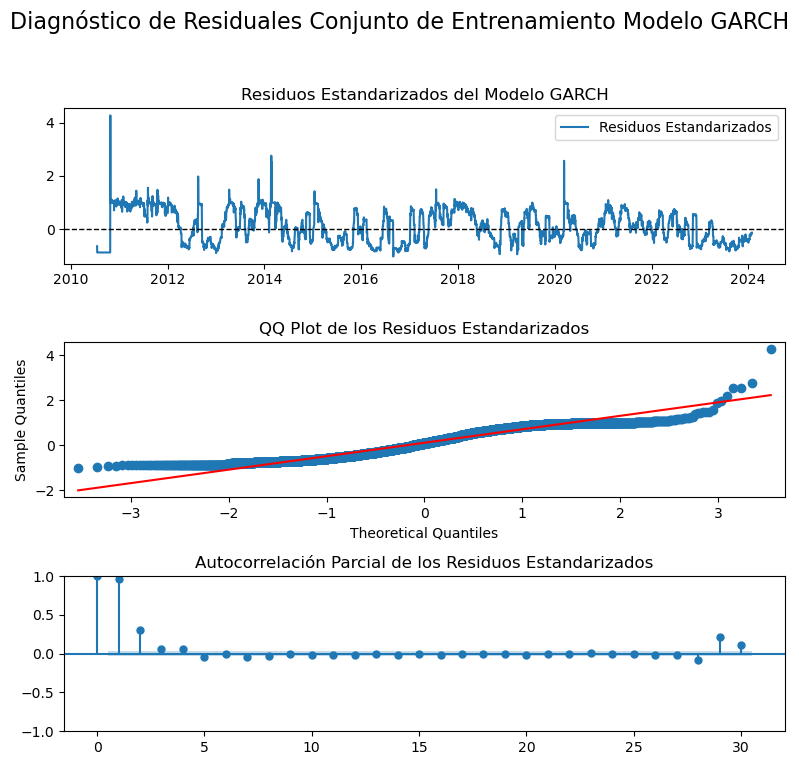

In [957]:
vola28_residuos = vola28_gmodel_fit.resid
vola28_volatilidad = vola28_gmodel_fit.conditional_volatility

# Calcular residuos estandarizados
vola28_residuos_estandarizados = vola28_residuos / vola28_volatilidad

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8, 8))

# Gráfico de residuos estandarizados
axes[0].plot(vola28_residuos_estandarizados, label='Residuos Estandarizados', color='#1f77b4')
axes[0].axhline(0, color='black', linestyle='--', linewidth=1)
axes[0].set_title('Residuos Estandarizados del Modelo GARCH')
axes[0].legend()

# Gráfico QQ plot
sm.qqplot(vola28_residuos_estandarizados, line='s', ax=axes[1])
axes[1].set_title('QQ Plot de los Residuos Estandarizados')

# Gráfico de autocorrelación parcial (PACF)
sm.graphics.tsa.plot_pacf(vola28_residuos_estandarizados, lags=30, ax=axes[2])
axes[2].set_title('Autocorrelación Parcial de los Residuos Estandarizados')

plt.suptitle('Diagnóstico de Residuales Conjunto de Entrenamiento Modelo GARCH', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Ajustar el layout para el título
plt.show()


In [958]:
vola28_residuos_train_garch = vola28_gmodel_fit.resid
vola28_ljung_box_pval_garch_train, vola28_jarque_bera_pval_garch_train = evaluate_residuals_train_arima(vola28_residuos_train_garch)

Ljung-Box LB Statistic: 4773.355933
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [959]:
vola28_predicciones = vola28_gmodel_fit.forecast(horizon=len(vola28_train_ts7))
vola28_yhvola28_garch_train = vola28_predicciones.mean.values[-len(vola28_train_ts7):].flatten()  #Se obtiene la ultima serie de predicciones en un arreglo 1D
vola28_vyhvola28_garch_df = pd.DataFrame(vola28_yhvola28_garch_train, columns=['vola28_Predicciones'], index=vola28_train_ts7.index) #convertir a dataframe para indexar fechas de price_train_ts7

#calcular las métricas 
vola28_metrica_garch_train = metricas(vola28_train_ts7,vola28_yhvola28_garch_train)
vola28_metrica_garch_train.index = vola28_metrica_garch_train.index.map({0: 'Garch Rolling Entrenamiento vola28'})
vola28_metrica_garch_train['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_garch_train], index=vola28_metrica_garch_train.index)
vola28_metrica_garch_train['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_garch_train], index=vola28_metrica_garch_train.index)
vola28_metrica_garch_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Entrenamiento vola28,19.3902,45.17%,0.02,0.0,-5.95%,0.0,0.0


La función `garch_rolling()` devuelve las prediciones, con base a los parámetros `p` y `q` que definen `el mejor modelo GARCH` con `el menor criterio AIC (Criterio de Información de Akaike)` de bondad de ajuste, aprovechando datos históricos para pronosticar continuamente la concentración de PM10 durante un período (horizonte) específico.

A continuación se indexan los parámetros de la función `garch_rolling()` para las ventanas de 7, 14, 21 y 28 días para la predicción sobre los datos de `validación` y `prueba`

* **Ventana de 7 días ($\omega = 7)$**

* **Predicciones datos de Validación**: 

In [960]:
# best_aic_arima = best_ order
vola28_val_l7 = vola28_val_ts7.tolist()
vola28_train_l7 = vola28_train_ts7.tolist()
vola28_yhvola28_val_garchrolling7  = garch_rolling(vola28_train_l7, vola28_val_l7, vola28_gbest_order, 7) 
vola28_yhvola28_val_garchrolling7 = pd.Series(vola28_yhvola28_val_garchrolling7, index=vola28_val_ts7.index)  # Indexa las fechas de price_val_ts7

predicted=0.031986, expected=0.028984
predicted=0.043911, expected=0.028812
predicted=0.038784, expected=0.027439
predicted=0.042848, expected=0.026880
predicted=0.038483, expected=0.026887
predicted=0.039950, expected=0.026887
predicted=0.039711, expected=0.026946


* **Predicciones datos de Prueba**: 

In [961]:
# best_aic_arima = best_ order
vola28_test_l7 = vola28_test_ts7.tolist()
vola28_train_l7 = vola28_train_ts7.tolist()
vola28_yhvola28_test_garchrolling7  = garch_rolling(vola28_train_l7, vola28_test_l7, vola28_best_order,7) 
vola28_yhvola28_test_garchrolling7 = pd.Series(vola28_yhvola28_test_garchrolling7, index=vola28_test_ts7.index)  # Indexa las fechas de price_test_ts7

predicted=0.033401, expected=0.023239
predicted=-0.007962, expected=0.023168
predicted=0.094590, expected=0.023794
predicted=0.041948, expected=0.024167
predicted=0.480417, expected=0.020465
predicted=0.033441, expected=0.020536
predicted=-0.044707, expected=0.019713


In [962]:
plot_model(vola28_train_ts7[-200:], vola28_val_ts7, vola28_test_ts7, vola28_yhvola28_val_garchrolling7, vola28_yhvola28_test_garchrolling7, title="Predicciones usando GARCH rolling ventana de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [963]:
vola28_ljung_box_pval_garchrol7, vola28_jarque_bera_pval_garchrol7 = evaluate_residuals(vola28_test_ts7, vola28_yhvola28_test_garchrolling7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [964]:
vola28_metrica_garchrol_test7 = metricas(vola28_test_ts7,vola28_yhvola28_test_garchrolling7)
vola28_metrica_garchrol_test7.index = vola28_metrica_garchrol_test7.index.map({0: 'Garch Rolling Prueba vola28 (τ = 7)'})
vola28_metrica_garchrol_test7['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_garchrol7], index=vola28_metrica_garchrol_test7.index)
vola28_metrica_garchrol_test7['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_garchrol7], index=vola28_metrica_garchrol_test7.index)
vola28_metrica_garchrol_test7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola28 (τ = 7),0.2223,455.2%,0.1,0.03,-1090619.53%,0.6247,0.1


* **Ventana de 14 días ($\omega = 14)$**

* **Predicciones datos de Validación**: 

In [965]:
# best_aic_arima = best_ order
vola28_val_l14 = vola28_val_ts14.tolist()
vola28_train_l14 = vola28_train_ts14.tolist()
vola28_yhvola28_val_garchrolling14 = garch_rolling(vola28_train_l14, vola28_val_l14, vola28_gbest_order, 14) 
vola28_yhvola28_val_garchrolling14 = pd.Series(vola28_yhvola28_val_garchrolling14, index=vola28_val_ts14.index)  # Indexa las fechas de price_val_ts14



predicted=0.031986, expected=0.028984
predicted=0.043911, expected=0.028812
predicted=0.038784, expected=0.027439
predicted=0.042848, expected=0.026880
predicted=0.038483, expected=0.026887
predicted=0.039950, expected=0.026887
predicted=0.039711, expected=0.026946
predicted=0.039231, expected=0.023239
predicted=0.039443, expected=0.023168
predicted=0.039527, expected=0.023794
predicted=0.042608, expected=0.024167
predicted=0.037024, expected=0.020465
predicted=0.039659, expected=0.020536
predicted=0.039739, expected=0.019713


* **Predicciones datos de Prueba**: 

In [966]:
# best_aic_arima = best_ order
vola28_test_l14 = vola28_test_ts14.tolist()
vola28_train_l14 = vola28_train_ts14.tolist()
vola28_yhvola28_test_garchrolling14 = garch_rolling(vola28_train_l14, vola28_test_l14, vola28_best_order, 14) 
vola28_yhvola28_test_garchrolling14 = pd.Series(vola28_yhvola28_test_garchrolling14, index=vola28_test_ts14.index)  # Indexa las fechas de price_test_ts14


predicted=0.033401, expected=0.020331
predicted=-0.060586, expected=0.020346
predicted=0.036130, expected=0.021263
predicted=0.033269, expected=0.019676
predicted=1.307098, expected=0.019689
predicted=0.033354, expected=0.019928
predicted=0.043429, expected=0.019821
predicted=-0.100559, expected=0.016675
predicted=-0.081963, expected=0.016673
predicted=0.020175, expected=0.016981
predicted=0.403298, expected=0.017215
predicted=-0.055126, expected=0.015948
predicted=-0.336948, expected=0.016045
predicted=-0.027253, expected=0.015962


In [967]:
plot_model(vola28_train_ts14[-200:], vola28_val_ts14, vola28_test_ts14, vola28_yhvola28_val_garchrolling14, vola28_yhvola28_test_garchrolling14, title="Predicciones usando GARCH rolling ventana de 14 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [968]:
vola28_ljung_box_pval_garchrol14, vola28_jarque_bera_pval_garchrol14 = evaluate_residuals(vola28_test_ts14, vola28_yhvola28_test_garchrolling14)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [969]:
vola28_metrica_garchrol_test14 = metricas(vola28_test_ts14, vola28_yhvola28_test_garchrolling14)
vola28_metrica_garchrol_test14.index = vola28_metrica_garchrol_test14.index.map({0: 'Garch Rolling Prueba vola28 (τ = 14)'})
vola28_metrica_garchrol_test14['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_garchrol14], index=vola28_metrica_garchrol_test14.index)
vola28_metrica_garchrol_test14['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_garchrol14], index=vola28_metrica_garchrol_test14.index)
vola28_metrica_garchrol_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola28 (τ = 14),1.9694,985.62%,0.18,0.14,-3926345.56%,0.9622,6.2341e-08


* **Ventana de 21 días ($\omega = 21)$**

* **Predicciones datos de Validación**: 

In [970]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

# best_aic_arima = best_ order
vola28_val_l21 = vola28_val_ts21.tolist()
vola28_train_l21 = vola28_train_ts21.tolist()
vola28_yhvola28_val_garchrolling21 = garch_rolling(vola28_train_l21, vola28_val_l21, vola28_gbest_order, 21) 
vola28_yhvola28_val_garchrolling21 = pd.Series(vola28_yhvola28_val_garchrolling21, index=vola28_val_ts21.index)  # Indexa las fechas de price_val_ts21


predicted=0.031986, expected=0.028984
predicted=0.043911, expected=0.028812
predicted=0.038784, expected=0.027439
predicted=0.042848, expected=0.026880
predicted=0.038483, expected=0.026887
predicted=0.039950, expected=0.026887
predicted=0.039711, expected=0.026946
predicted=0.039231, expected=0.023239
predicted=0.039443, expected=0.023168
predicted=0.039527, expected=0.023794
predicted=0.042608, expected=0.024167
predicted=0.037024, expected=0.020465
predicted=0.039659, expected=0.020536
predicted=0.039739, expected=0.019713
predicted=0.036393, expected=0.020331
predicted=0.039024, expected=0.020346
predicted=0.168523, expected=0.021263
predicted=0.039599, expected=0.019676
predicted=0.038298, expected=0.019689
predicted=0.031168, expected=0.019928
predicted=-0.844677, expected=0.019821


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.




* **Predicciones datos de Prueba**: 

In [971]:
# best_aic_arima = best_ order
vola28_test_l21 = vola28_test_ts21.tolist()
vola28_train_l21 = vola28_train_ts21.tolist()
vola28_yhvola28_test_garchrolling21 = garch_rolling(vola28_train_l21, vola28_test_l21, vola28_best_order, 21) 
vola28_yhvola28_test_garchrolling21 = pd.Series(vola28_yhvola28_test_garchrolling21, index=vola28_test_ts21.index)  # Indexa las fechas de price_test_ts21


predicted=0.033401, expected=0.016675
predicted=0.078254, expected=0.016673
predicted=0.043203, expected=0.016981
predicted=0.029254, expected=0.017215
predicted=0.048283, expected=0.015948
predicted=0.011745, expected=0.016045
predicted=0.024369, expected=0.015962
predicted=0.033340, expected=0.017709
predicted=-0.337603, expected=0.018831
predicted=-0.066128, expected=0.024323
predicted=0.033348, expected=0.025198
predicted=0.033325, expected=0.025151
predicted=0.033303, expected=0.025209
predicted=0.033345, expected=0.024804
predicted=0.132188, expected=0.027705
predicted=0.033712, expected=0.031811
predicted=0.064586, expected=0.031951
predicted=0.035538, expected=0.031929
predicted=-0.227892, expected=0.031541
predicted=-0.317238, expected=0.031608
predicted=-0.069880, expected=0.031617


In [972]:
plot_model(vola28_train_ts21[-200:], vola28_val_ts21, vola28_test_ts21, vola28_yhvola28_val_garchrolling21, vola28_yhvola28_test_garchrolling21, title="Predicciones usando GARCH rolling ventana de 21 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [973]:
vola28_ljung_box_pval_garchrol21, vola28_jarque_bera_pval_garchrol21 = evaluate_residuals(vola28_test_ts21, vola28_yhvola28_test_garchrolling21)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [974]:
vola28_metrica_garchrol_test21 = metricas(vola28_test_ts21, vola28_yhvola28_test_garchrolling21)
vola28_metrica_garchrol_test21.index = vola28_metrica_garchrol_test21.index.map({0: 'Garch Rolling Prueba vola28 (τ = 21)'})
vola28_metrica_garchrol_test21['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_garchrol21], index=vola28_metrica_garchrol_test21.index)
vola28_metrica_garchrol_test21['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_garchrol21], index=vola28_metrica_garchrol_test21.index)
vola28_metrica_garchrol_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola28 (τ = 21),0.3531,295.44%,0.07,0.02,-42122.41%,0.0542,0.0024


* **Ventana de 28 días ($\omega = 28)$**

* **Predicciones datos de Validación**: 

In [975]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.
# best_aic_arima = best_ order
vola28_val_l28 = vola28_val_ts28.tolist()
vola28_train_l28 = vola28_train_ts28.tolist()
vola28_yhvola28_val_garchrolling28 = garch_rolling(vola28_train_l28, vola28_val_l28, vola28_gbest_order, 28) 
vola28_yhvola28_val_garchrolling28 = pd.Series(vola28_yhvola28_val_garchrolling28, index=vola28_val_ts28.index)  # Indexa las fechas de price_val_ts28

predicted=0.031986, expected=0.028984
predicted=0.043911, expected=0.028812
predicted=0.038784, expected=0.027439
predicted=0.042848, expected=0.026880
predicted=0.038483, expected=0.026887
predicted=0.039950, expected=0.026887
predicted=0.039711, expected=0.026946
predicted=0.039231, expected=0.023239
predicted=0.039443, expected=0.023168
predicted=0.039527, expected=0.023794
predicted=0.042608, expected=0.024167
predicted=0.037024, expected=0.020465
predicted=0.039659, expected=0.020536
predicted=0.039739, expected=0.019713
predicted=0.036393, expected=0.020331
predicted=0.039024, expected=0.020346
predicted=0.168523, expected=0.021263
predicted=0.039599, expected=0.019676
predicted=0.038298, expected=0.019689
predicted=0.031168, expected=0.019928
predicted=-0.844677, expected=0.019821
predicted=0.039556, expected=0.016675
predicted=0.040025, expected=0.016673
predicted=0.035208, expected=0.016981
predicted=0.048110, expected=0.017215
predicted=0.048549, expected=0.015948
predicted=0

/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




* **Predicciones datos de Prueba**: 

In [976]:
# best_aic_arima = best_ order
vola28_test_l28 = vola28_test_ts28.tolist()
vola28_train_l28 = vola28_train_ts28.tolist()
vola28_yhvola28_test_garchrolling28 = garch_rolling(vola28_train_l28, vola28_test_l28, vola28_best_order, 28) 
vola28_yhvola28_test_garchrolling28 = pd.Series(vola28_yhvola28_test_garchrolling28, index=vola28_test_ts28.index)  # Indexa las fechas de price_test_ts28

predicted=0.033401, expected=0.017709
predicted=-0.045213, expected=0.018831
predicted=0.029099, expected=0.024323
predicted=-4.118884, expected=0.025198
predicted=0.052179, expected=0.025151
predicted=0.248014, expected=0.025209
predicted=0.025593, expected=0.024804
predicted=0.046099, expected=0.027705
predicted=0.033409, expected=0.031811
predicted=0.033487, expected=0.031951
predicted=0.033393, expected=0.031929
predicted=-0.271024, expected=0.031541


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




predicted=-0.246465, expected=0.031608
predicted=0.021620, expected=0.031617
predicted=0.033327, expected=0.031955
predicted=0.045092, expected=0.032054
predicted=0.043316, expected=0.031634
predicted=0.029910, expected=0.032300
predicted=0.045320, expected=0.033105
predicted=0.033371, expected=0.035523
predicted=0.069770, expected=0.036245
predicted=0.034773, expected=0.036349
predicted=0.040096, expected=0.040312


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/opt/anaconda3/envs/env_st/lib/python3.9/site-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.




predicted=0.033363, expected=0.043374
predicted=0.033038, expected=0.044045
predicted=0.043533, expected=0.044397
predicted=0.048169, expected=0.044385
predicted=-0.666424, expected=0.045030


In [977]:
plot_model(vola28_train_ts28[-200:], vola28_val_ts28, vola28_test_ts28, vola28_yhvola28_val_garchrolling28, vola28_yhvola28_test_garchrolling28, title="Predicciones usando GARCH rolling ventana de 28 días")


A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de prueba (test).

In [978]:
vola28_ljung_box_pval_garchrol28, vola28_jarque_bera_pval_garchrol28 = evaluate_residuals(vola28_test_ts28, vola28_yhvola28_test_garchrolling28)


No se rechaza H0: los residuales son independientes (no correlacionados).
Se rechaza H0: los residuales no siguen una distribución normal.


In [979]:
vola28_metrica_garchrol_test28 = metricas(vola28_test_ts28, vola28_yhvola28_test_garchrolling28)
vola28_metrica_garchrol_test28.index = vola28_metrica_garchrol_test28.index.map({0: 'Garch Rolling Prueba vola28 (τ = 28)'})
vola28_metrica_garchrol_test28['Ljung-Box p-value'] = pd.Series([vola28_ljung_box_pval_garchrol28], index=vola28_metrica_garchrol_test28.index)
vola28_metrica_garchrol_test28['Jarque-Bera p-value'] = pd.Series([vola28_jarque_bera_pval_garchrol28], index=vola28_metrica_garchrol_test28.index)
vola28_metrica_garchrol_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
Garch Rolling Prueba vola28 (τ = 28),17.9055,775.3%,0.21,0.64,-1185077.83%,0.7664,1.8922e-134


#### <font color="#30143">Resumen de Métricas Variable Precio</font>

En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `entrenamiento` para la variable `Volatilidad 28 dias`. 

In [980]:
vola28_metricas_df_train = pd.concat([vola28_metrica_SES_train, vola28_metrica_DES_train, vola28_metrica_HW1_train, vola28_metrica_HW2_train, vola28_metrica_arima_train, vola28_metrica_garch_train], ignore_index=False)
vola28_metricas_df_train

,SSE,MAPE,MAD,MSD,R2,LJung-Box p-value,Jarque-Bera p-value,Ljung-Box p-value
SES Train,1.4254e+00,9.39%,0.00,0.0000e+00,92.21%,0.0,0.0,NaN
DES Train,4.0409e+00,17.36%,0.01,0.0000e+00,77.92%,0.0,0.0,NaN
SES HW Train,7.5067e+12,127265394.61%,38969.91,1.5187e+09,-41017293000296.18%,0.0,0.0,NaN
DES HW Train,2.9072e+01,97.49%,0.05,1.0000e-02,-58.85%,0.0,0.0,NaN
Arima Entrenamiento vola28,6.3378e-01,4.27%,0.00,0.0000e+00,96.54%,NaN,0.0,0.7619
Garch Rolling Entrenamiento vola28,1.9390e+01,45.17%,0.02,0.0000e+00,-5.95%,NaN,0.0,0.0000


En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `prueba` para la variable `Volatilidad`. 

In [981]:
vola28_metricas_df_test = pd.concat([vola28_metrica_SE_test7, vola28_metrica_SE_test14, vola28_metrica_SE_test21, vola28_metrica_SE_test28, vola28_metrica_SE_HW_test7, 
                              vola28_metrica_SE_HW_test14, vola28_metrica_SE_HW_test21, vola28_metrica_SE_HW_test28, vola28_metrica_DES_test7,
                              vola28_metrica_DES_test14, vola28_metrica_DES_test21,vola28_metrica_DES_test28, vola28_metrica_DES_HW_test7,
                              vola28_metrica_DES_HW_test14, vola28_metrica_DES_HW_test21, vola28_metrica_DES_HW_test28, vola28_metrica_arimarol_test7,
                              vola28_metrica_arimarol_test14, vola28_metrica_arimarol_test21, vola28_metrica_arimarol_test28, vola28_metrica_arima_test7,
                              vola28_metrica_arima_test14, vola28_metrica_arima_test21, vola28_metrica_arima_test28, vola28_metrica_garchrol_test7, 
                              vola28_metrica_garchrol_test14, vola28_metrica_garchrol_test21, vola28_metrica_garchrol_test28], ignore_index=False)
vola28_metricas_df_test

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
SES Prueba vola28 (τ = 7),1.4834e-05,5.28%,0.00,0.00,27.21%,1.9755e-01,6.1857e-01
SES Prueba vola28 (τ = 14),2.3611e-05,6.0%,0.00,0.00,52.93%,3.1750e-02,3.1750e-02
SES Prueba vola28 (τ = 21),2.3464e-04,9.8%,0.00,0.00,71.94%,8.6173e-05,8.6173e-05
SES Prueba vola28 (τ = 28),4.0375e-04,10.29%,0.00,0.00,73.28%,3.9543e-04,3.9543e-04
SES HW Prueba vola28 (τ = 7),1.8042e-04,22.32%,0.00,0.00,-785.34%,1.3719e-01,6.2968e-01
SES HW Prueba vola28 (τ = 14),8.5013e-05,11.32%,0.00,0.00,-69.5%,1.7565e-03,4.3465e-01
SES HW Prueba vola28 (τ = 21),1.1285e-03,24.53%,0.01,0.00,-34.95%,1.0811e-05,3.2247e-01
SES HW Prueba vola28 (τ = 28),9.1511e-03,47.96%,0.02,0.00,-505.72%,2.4191e-06,8.3597e-01
DES Prueba vola28 (τ = 7),7.8389e-06,3.75%,0.00,0.00,61.53%,3.5378e-01,6.9818e-01
DES Prueba vola28 (τ = 14),7.2144e-06,2.61%,0.00,0.00,85.62%,3.4558e-01,6.5029e-02


## Análisis de Métricas para la Volatilidad con Ventana de 28 Días

A continuación, se presenta un análisis de las métricas obtenidas para diferentes modelos de volatilidad utilizando una ventana de 28 días:

### 1. **Suavización Exponencial Simple (SES)**
- **Performance General**:
  - **MAPE** varía entre 5.28% y 10.29%, mostrando un rendimiento razonable.
  - **SSE** y **MAD** son bajos, lo que sugiere un ajuste adecuado en ventanas cortas.
  - **R²** muestra una tendencia positiva, alcanzando hasta un 73.28% en ventanas largas, lo que indica que el modelo captura gran parte de la variabilidad.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran que los residuos no son completamente independientes ni siguen una distribución normal en ventanas largas (τ = 21 y τ = 28).

### 2. **Suavización Exponencial Simple Holt-Winters (SES HW)**
- **Performance General**:
  - **MAPE** aumenta considerablemente, llegando hasta un 47.96%, lo que indica un peor ajuste que SES.
  - **SSE** y **MAD** son significativamente más altos, y **R²** es extremadamente negativo, indicando un mal ajuste.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran que los residuos no son independientes ni siguen una distribución normal, especialmente en ventanas largas.

### 3. **Suavización Exponencial Doble (DES)**
- **Performance General**:
  - **MAPE** es bajo, variando entre 2.61% y 4.38%, lo que demuestra un buen ajuste del modelo a la serie.
  - **SSE** y **MAD** son bajos, lo que refuerza la idea de que el modelo se ajusta bien a los datos.
  - **R²** es alto, alcanzando hasta un 95.57%, lo que sugiere que este modelo captura gran parte de la variabilidad en la serie de volatilidad.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** sugieren una ligera mejora en la independencia y normalidad de los residuos en comparación con SES HW.

### 4. **Suavización Exponencial Doble Holt-Winters (DES HW)**
- **Performance General**:
  - **MAPE** es relativamente alto, llegando a un 47.96%, lo que sugiere un ajuste deficiente.
  - **SSE** y **MAD** aumentan considerablemente, y **R²** es extremadamente negativo, lo que confirma un mal rendimiento del modelo.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran problemas de independencia y distribución normal de los residuos, especialmente en ventanas largas.

### 5. **ARIMA (Rolling)**
- **Performance General**:
  - **MAPE** varía entre 5.9% y 8.95%, lo que muestra un rendimiento aceptable en comparación con otros modelos.
  - **SSE** y **MAD** son bajos en ventanas más largas.
  - **R²** es razonablemente positivo en ventanas largas, alcanzando un 84.7% en τ = 28.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** indican que los residuos no son completamente independientes y que en algunas ventanas no siguen una distribución normal.

### 6. **ARIMA (Sin Rolling)**
- **Performance General**:
  - **MAPE** es significativamente alto, con valores de hasta 74.28%, lo que sugiere un mal ajuste del modelo.
  - **SSE** y **MAD** son elevados, y **R²** es extremadamente negativo en todas las ventanas.
  - Las pruebas de **Ljung-Box** y **Jarque-Bera** muestran problemas de independencia y normalidad de los residuos en ventanas largas.

### 7. **GARCH Rolling**
- **Performance General**:
  - **MAPE** es extremadamente alto, alcanzando hasta un 775.3%, lo que indica un ajuste muy deficiente.
  - **SSE**, **MAD**, y **R²** son negativos, lo que confirma un mal rendimiento del modelo.
  - Las pruebas de **Ljung-Box** sugieren una ligera independencia de los residuos en algunas ventanas, pero la prueba de **Jarque-Bera** indica que los residuos no siguen una distribución normal.

### **Conclusiones Generales**
- **Mejor Modelo**: El modelo **DES** ofrece el mejor rendimiento general, con un **MAPE** bajo y un **R²** alto (hasta 95.57%), capturando la mayor parte de la variabilidad.
- **Peor Modelo**: El modelo **GARCH Rolling** presenta un rendimiento extremadamente deficiente con **MAPE** muy alto y **R²** negativo en todas las ventanas.
- **Recomendación**: **SES** y **ARIMA Rolling** pueden ser opciones viables para ventanas más largas, mientras que los modelos con componentes Holt-Winters no son adecuados para la volatilidad con ventana de 28 días.
